In [1]:
import keras
from keras.layers import Conv2D, Conv2DTranspose, Input, Flatten, Dense, Lambda, Reshape
#from keras.layers import BatchNormalization
from keras.models import Model
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

In [2]:
import os
import PIL
import PIL.Image
import pathlib
from sklearn.model_selection import train_test_split
data_dir = pathlib.Path("C:/Users/Davran/0_Deep_Learning_Project/Implant Inspection")
data_dir_train = pathlib.Path("C:/Users/Davran/0_Deep_Learning_Project/Implant Inspection/train/*/*")
data_dir_test = pathlib.Path("C:/Users/Davran/0_Deep_Learning_Project/Implant Inspection/test/*/*")

In [3]:
filenames = tf.io.gfile.glob(str(data_dir_train))
filenames.extend(tf.io.gfile.glob(str(data_dir_test)))

train_filenames, val_filenames = train_test_split(filenames, test_size=0.2)

In [4]:
COUNT_ISOLA = len([filename for filename in train_filenames if "Isola" in filename])
print("Isola images count in training set: " + str(COUNT_ISOLA))

COUNT_LEGACY = len([filename for filename in train_filenames if "Legacy" in filename])
print("Legacy images count in training set: " + str(COUNT_LEGACY))

COUNT_VIPER = len([filename for filename in train_filenames if "Viper" in filename])
print("Viper images count in training set: " + str(COUNT_VIPER))

COUNT_RELINE = len([filename for filename in train_filenames if "Reline" in filename])
print("Reline images count in training set: " + str(COUNT_RELINE))

COUNT_M8M10 = len([filename for filename in train_filenames if "M8M10" in filename])
print("M8M10 images count in training set: " + str(COUNT_M8M10))

COUNT_XIA = len([filename for filename in train_filenames if "Xia" in filename])
print("Xia images count in training set: " + str(COUNT_XIA))

Isola images count in training set: 60
Legacy images count in training set: 109
Viper images count in training set: 154
Reline images count in training set: 65
M8M10 images count in training set: 51
Xia images count in training set: 81


In [5]:
train_list_ds = tf.data.Dataset.from_tensor_slices(train_filenames)
val_list_ds = tf.data.Dataset.from_tensor_slices(val_filenames)

for f in train_list_ds.take(5):
    print(f.numpy())

b'C:\\Users\\Davran\\0_Deep_Learning_Project\\Implant Inspection\\train\\Reline\\facebook_10501_ML.jpg'
b'C:\\Users\\Davran\\0_Deep_Learning_Project\\Implant Inspection\\train\\Viper\\viper2_ml_email_27feb1512_cropped.jpg'
b'C:\\Users\\Davran\\0_Deep_Learning_Project\\Implant Inspection\\train\\Legacy\\facebook_7771_AP.jpg'
b'C:\\Users\\Davran\\0_Deep_Learning_Project\\Implant Inspection\\test\\Reline\\s_195_4.jpg'
b'C:\\Users\\Davran\\0_Deep_Learning_Project\\Implant Inspection\\test\\Legacy\\legacy_xray2.png'


In [6]:
TRAIN_IMG_COUNT = tf.data.experimental.cardinality(train_list_ds).numpy()
print("Training images count: " + str(TRAIN_IMG_COUNT))

VAL_IMG_COUNT = tf.data.experimental.cardinality(val_list_ds).numpy()
print("Validating images count: " + str(VAL_IMG_COUNT))

Training images count: 520
Validating images count: 130


In [7]:
CLASS_NAMES = np.array([str(tf.strings.split(item, os.path.sep)[-1].numpy())[2:-1]
                        for item in tf.io.gfile.glob(str(data_dir) + "/train/*")])
CLASS_NAMES

array(['Isola', 'Legacy', 'M8M10', 'Reline', 'Viper', 'Xia'], dtype='<U6')

In [8]:
def get_label(file_path):
    # convert the path to a list of path components
    parts = tf.strings.split(file_path, os.path.sep)
    if parts[-2] == 'Isola':
        return 1
    elif parts[-2] == 'Viper':
        return 2
    elif parts[-2] == 'M8M10':
        return 3
    elif parts[-2] == 'Reline':
        return 4
    elif parts[-2] == 'Legacy':
        return 5
    else:
        return 6

In [9]:
def decode_img(img):
  # convert the compressed string
  img_X = tf.image.decode_jpeg(img, channels=3)
  # Use `convert_image_dtype` to convert to floats in the [0,1] range.
  img_X = tf.image.convert_image_dtype(img_X, tf.float32)
  # resize the image to the desired size.
  return tf.image.resize(img_X, IMAGE_SIZE)

In [10]:
def process_path(file_path):
    label = get_label(file_path)
    # load the raw data from the file as a string
    img = tf.io.read_file(file_path)
    img = decode_img(img)
    return img, label

In [11]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
IMAGE_SIZE = [100, 100]
BATCH_SIZE = 16
EPOCHS = 200
train_ds = train_list_ds.map(process_path, num_parallel_calls=AUTOTUNE)

val_ds = val_list_ds.map(process_path, num_parallel_calls=AUTOTUNE)

In [12]:
X_train = []
X_test = []
y_train = []
y_test = []
for image, label in train_ds:
    X_train.append(image)
    y_train.append(label)    
X_train = np.array(X_train)
y_train = np.array(y_train)

In [13]:
for image, label in val_ds:
    X_test.append(image)
    y_test.append(label)
X_test = np.array(X_test)
y_test = np.array(y_test)

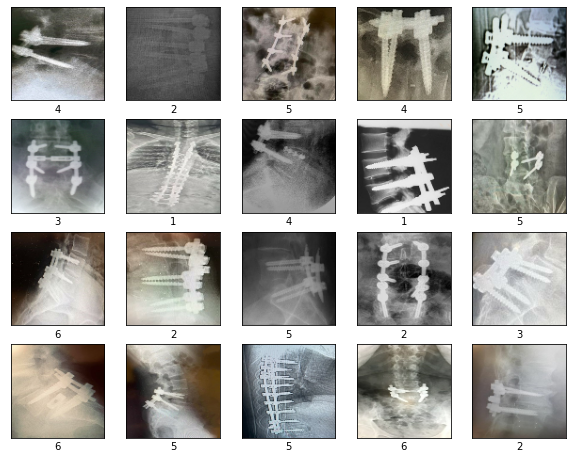

In [14]:
from matplotlib import pyplot as plt
plt.figure(figsize = (10, 10))
for i in range(20):
    plt.subplot(5, 5, i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(X_train[i], cmap = plt.cm.binary)
    plt.xlabel(y_train[i])
    
# The figure below shows the downsampled images of insulators with the labels below.

In [15]:
from tensorflow.keras.models import Sequential
from tensorflow.keras import layers
from tensorflow.keras import models, layers, optimizers
from tensorflow.keras import regularizers
import tensorflow as tf
from keras.constraints import MaxNorm
from matplotlib import pyplot as plt
from sklearn.model_selection import GridSearchCV
from tensorflow.keras.constraints import MaxNorm

In [16]:
def define_model(dropout_rate,neurons,kernel_size,learning_rate):   
    
    model = Sequential()
    for i in range(neurons):
        n = 2*(i+2)
        # CNN Conv2D Layers
        model.add(layers.Conv2D(n, (kernel_size, kernel_size), 
                activation = 'relu', input_shape = (100, 100, 3)))
        # Maxpooling layers with strides of 2
        model.add(layers.MaxPooling2D((2, 2)))
    

    model.add(layers.Flatten())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(64, activation = 'relu'))
    model.add(layers.Dense(6, activation = 'softmax'))    
        
    # compile the model
    model.compile(loss='SparseCategoricalCrossentropy',
                  optimizer=tf.keras.optimizers.Adam(learning_rate),
                  metrics=['acc'])
    return model

In [17]:
from keras.wrappers.scikit_learn import KerasClassifier

model = KerasClassifier(build_fn=define_model, verbose=1)
gridcvs = {}
dropout_rate = [ 0.2, 0.5]
neurons = [1, 2, 3, 4]
kernel_size = [3, 5]
learning_rate =  [0.001, 0.0001]
batch_size = [4, 8, 16, 32]
epochs = [150]

param_grid = dict(dropout_rate=dropout_rate, neurons = neurons, kernel_size = kernel_size, learning_rate = learning_rate,
                  batch_size=batch_size,
                  epochs=epochs)


<ipython-input-17-1b05461deb05>:3: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead.
  model = KerasClassifier(build_fn=define_model, verbose=1)


In [18]:
from sklearn.model_selection import GridSearchCV
from keras.callbacks import EarlyStopping
from sklearn.model_selection import cross_val_score

stopper = EarlyStopping(monitor='loss', patience=3, verbose=1)
fit_params = dict(callbacks=[stopper])


grid = GridSearchCV(estimator=model, param_grid=param_grid, cv=5)


In [19]:
cross_score = cross_val_score(grid,
                X=X_train,
                y=y_train,
                cv=5,
                n_jobs=None,
                verbose=0,
                fit_params = fit_params)

Epoch 1/150
83/83 [==============================] - 9s 3ms/step - loss: 1.7885 - acc: 0.2771
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6469 - acc: 0.3283
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5429 - acc: 0.4337
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3187 - acc: 0.5422
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1377 - acc: 0.6536
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9682 - acc: 0.7048
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7651 - acc: 0.7922
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5915 - acc: 0.8675
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4361 - acc: 0.9096
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3382 - acc: 0.9398
Epoch 11/150
83/83 [==============================] - 0s 3m

84/84 [==============================] - 0s 3ms/step - loss: 2.1356e-04 - acc: 1.0000
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 9.3821e-04 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 8.2015e-04 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 3.4680e-04 - acc: 1.0000
Epoch 00041: early stopping
21/21 [==============================] - 0s 4ms/step - loss: 4.1407 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 2.2261 - acc: 0.2192
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6980 - acc: 0.3123
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5837 - acc: 0.3934
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4185 - acc: 0.5015
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2167 - acc: 0.5976
Epoch 6/150
84/84 [==================

84/84 [==============================] - 0s 3ms/step - loss: 0.0035 - acc: 1.0000
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0032 - acc: 1.0000
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0030 - acc: 1.0000
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0028 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0027 - acc: 1.0000
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0028 - acc: 1.0000
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0024 - acc: 1.0000
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0020 - acc: 1.0000
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0016 - acc: 1.0000
Epoch 46/150
84/84 [==============================] - 0s 3ms/st

21/21 [==============================] - 0s 2ms/step - loss: 5.2140 - acc: 0.2976
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.8378 - acc: 0.2613
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7305 - acc: 0.3183
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6958 - acc: 0.3183
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6711 - acc: 0.3303
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6435 - acc: 0.3604
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5863 - acc: 0.3724
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5381 - acc: 0.4024
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4543 - acc: 0.4234
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3910 - acc: 0.4505
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

84/84 [==============================] - 0s 3ms/step - loss: 1.3769 - acc: 0.4565
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2112 - acc: 0.5435
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0021 - acc: 0.6306
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8478 - acc: 0.7387
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6416 - acc: 0.8078
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5671 - acc: 0.8408
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4258 - acc: 0.8859
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3727 - acc: 0.9039
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2767 - acc: 0.9249
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2111 - acc: 0.9640
Epoch 16/150
84/84 [==============================] - 0s 5ms/step 

84/84 [==============================] - 0s 4ms/step - loss: 1.5736 - acc: 0.4054
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4008 - acc: 0.5045
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2593 - acc: 0.5345
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0844 - acc: 0.6186
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0346 - acc: 0.6216
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8534 - acc: 0.6997
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6845 - acc: 0.7357
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6561 - acc: 0.7898
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5528 - acc: 0.8318
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4315 - acc: 0.8769
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - 

83/83 [==============================] - 0s 4ms/step - loss: 1.6705 - acc: 0.3313
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5959 - acc: 0.3554
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5665 - acc: 0.3825
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4876 - acc: 0.4096
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4384 - acc: 0.4488
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4077 - acc: 0.4458
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2972 - acc: 0.5060
Epoch 14/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2400 - acc: 0.5542
Epoch 15/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2227 - acc: 0.5271
Epoch 16/150
83/83 [==============================] - 0s 4ms/step - loss: 1.1770 - acc: 0.5452
Epoch 17/150
83/83 [==============================] - 0s 4ms/step

84/84 [==============================] - 0s 4ms/step - loss: 1.6035 - acc: 0.3483
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5949 - acc: 0.3634
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5196 - acc: 0.3874
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4727 - acc: 0.4204
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4778 - acc: 0.4444
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4377 - acc: 0.4414
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3587 - acc: 0.4535
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3485 - acc: 0.4775
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2673 - acc: 0.5045
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2102 - acc: 0.5526
Epoch 19/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.3064 - acc: 0.8829
Epoch 47/150
84/84 [==============================] - 0s 5ms/step - loss: 0.4221 - acc: 0.8378
Epoch 48/150
84/84 [==============================] - 0s 5ms/step - loss: 0.3173 - acc: 0.8769
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4017 - acc: 0.8408
Epoch 00049: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.5423 - acc: 0.2651
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7648 - acc: 0.2763
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7463 - acc: 0.2883
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7344 - acc: 0.2973
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7284 - acc: 0.2913
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7185 - acc: 0.2913
Epoch 6/150
84/84 [==============================] - 

83/83 [==============================] - 0s 3ms/step - loss: 0.4619 - acc: 0.9187
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4815 - acc: 0.9036
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4168 - acc: 0.9398
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3997 - acc: 0.9398
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4160 - acc: 0.9036
Epoch 40/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3749 - acc: 0.9337
Epoch 41/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3666 - acc: 0.9578
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3615 - acc: 0.9398
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3365 - acc: 0.9518
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3358 - acc: 0.9367
Epoch 45/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.6536 - acc: 0.8288
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6317 - acc: 0.8468
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6039 - acc: 0.8799
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5885 - acc: 0.8408
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5712 - acc: 0.8739
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5350 - acc: 0.8739
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5401 - acc: 0.8769
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5045 - acc: 0.8859
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4950 - acc: 0.8919
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4577 - acc: 0.8829
Epoch 41/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7453 - acc: 0.7898
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7247 - acc: 0.8078
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6864 - acc: 0.8228
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6927 - acc: 0.8438
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6372 - acc: 0.8438
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6143 - acc: 0.8589
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6309 - acc: 0.8619
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6025 - acc: 0.8619
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6000 - acc: 0.8348
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5556 - acc: 0.8859
Epoch 56/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7341 - acc: 0.7928
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7561 - acc: 0.7778
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6892 - acc: 0.8228
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6664 - acc: 0.8468
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6423 - acc: 0.8498
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6454 - acc: 0.8348
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6539 - acc: 0.8438
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5863 - acc: 0.8799
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5960 - acc: 0.8559
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5628 - acc: 0.8829
Epoch 42/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.8460 - acc: 0.7508
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8498 - acc: 0.7508
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8112 - acc: 0.7538
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8306 - acc: 0.7267
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7975 - acc: 0.7688
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7686 - acc: 0.7748
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7465 - acc: 0.7778
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7393 - acc: 0.8228
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7166 - acc: 0.8228
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7017 - acc: 0.8018
Epoch 50/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.2272 - acc: 0.9608
Epoch 60/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2195 - acc: 0.9669
Epoch 61/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2122 - acc: 0.9669
Epoch 62/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1984 - acc: 0.9759
Epoch 63/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1793 - acc: 0.9880
Epoch 64/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1705 - acc: 0.9880
Epoch 65/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1789 - acc: 0.9819
Epoch 66/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1623 - acc: 0.9819
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1521 - acc: 0.9880
Epoch 68/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1539 - acc: 0.9819
Epoch 69/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1776 - acc: 0.9790
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1583 - acc: 0.9850
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1635 - acc: 0.9790
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1461 - acc: 0.9880
Epoch 63/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1367 - acc: 0.9940
Epoch 64/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1338 - acc: 0.9850
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1355 - acc: 0.9850
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1221 - acc: 0.9850
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1231 - acc: 0.9910
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1138 - acc: 0.9880
Epoch 69/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1665 - acc: 0.9760
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1270 - acc: 0.9910
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1430 - acc: 0.9820
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1324 - acc: 0.9880
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1382 - acc: 0.9790
Epoch 00071: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.7245 - acc: 0.3133
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7392 - acc: 0.2793
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7280 - acc: 0.3033
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7230 - acc: 0.3003
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7048 - acc: 0.3093
Epoch 5/150
84/84 [==============================] -

84/84 [==============================] - 0s 3ms/step - loss: 0.1057 - acc: 0.9940
Epoch 82/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1085 - acc: 0.9910
Epoch 83/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0901 - acc: 0.9970
Epoch 84/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0956 - acc: 0.9880
Epoch 85/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1020 - acc: 0.9910
Epoch 86/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0921 - acc: 0.9850
Epoch 00086: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.2025 - acc: 0.3614
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7482 - acc: 0.3123
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7531 - acc: 0.2523
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7204 - acc: 0.2883
Epoch 4/150
84/84 [==============================] 

84/84 [==============================] - 0s 3ms/step - loss: 0.0709 - acc: 0.9940
Epoch 81/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0538 - acc: 0.9970
Epoch 82/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0637 - acc: 0.9970
Epoch 83/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0578 - acc: 0.9970
Epoch 84/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0442 - acc: 1.0000
Epoch 85/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0477 - acc: 1.0000
Epoch 86/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0477 - acc: 0.9970
Epoch 87/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0400 - acc: 1.0000
Epoch 88/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0397 - acc: 0.9970
Epoch 89/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0375 - acc: 1.0000
Epoch 90/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.4431 - acc: 0.4505
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4235 - acc: 0.4535
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3990 - acc: 0.4775
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4128 - acc: 0.4595
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3655 - acc: 0.4865
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3692 - acc: 0.4775
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3507 - acc: 0.4985
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3282 - acc: 0.5045
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3059 - acc: 0.5225
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3134 - acc: 0.5135
Epoch 37/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6740 - acc: 0.3123
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6680 - acc: 0.3153
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6541 - acc: 0.3273
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6435 - acc: 0.3453
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6334 - acc: 0.3393
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6200 - acc: 0.3453
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5974 - acc: 0.3694
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5908 - acc: 0.3724
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5739 - acc: 0.3784
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5630 - acc: 0.3754
Epoch 25/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7281 - acc: 0.3033
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7190 - acc: 0.3063
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7166 - acc: 0.3063
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7068 - acc: 0.3063
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7105 - acc: 0.3063
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6946 - acc: 0.3123
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6892 - acc: 0.3093
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6836 - acc: 0.3153
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6711 - acc: 0.3123
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6535 - acc: 0.3393
Epoch 15/150
84/84 [==============================] - 0s 4ms/step -

84/84 [==============================] - 0s 4ms/step - loss: 1.6519 - acc: 0.3453
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6449 - acc: 0.3303
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6275 - acc: 0.3544
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5995 - acc: 0.3544
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5895 - acc: 0.3754
Epoch 17/150
84/84 [==============================] - 0s 5ms/step - loss: 1.5715 - acc: 0.3784
Epoch 18/150
84/84 [==============================] - 0s 5ms/step - loss: 1.5513 - acc: 0.3844
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5300 - acc: 0.4114
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5066 - acc: 0.4114
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4836 - acc: 0.4294
Epoch 22/150
84/84 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 2ms/step - loss: 1.7359 - acc: 0.2857
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7921 - acc: 0.2432
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7826 - acc: 0.3063
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7737 - acc: 0.3393
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7595 - acc: 0.3303
Epoch 5/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7322 - acc: 0.3273
Epoch 6/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7101 - acc: 0.3213
Epoch 7/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7002 - acc: 0.3183
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6952 - acc: 0.3183
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6838 - acc: 0.3213
Epoch 10/150
84/84 [==============================] - 0s 5ms/step - loss

84/84 [==============================] - 0s 4ms/step - loss: 1.6455 - acc: 0.2973
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6591 - acc: 0.2883
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6490 - acc: 0.3003
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6486 - acc: 0.3213
Epoch 00033: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.6773 - acc: 0.3373
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7839 - acc: 0.2372
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7699 - acc: 0.2583
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7542 - acc: 0.2523
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7347 - acc: 0.2733
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7246 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 

83/83 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 9.2637e-04 - acc: 1.0000
Epoch 32/150
83/83 [==============================] - 0s 3ms/step - loss: 9.0577e-04 - acc: 1.0000
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 7.5509e-04 - acc: 1.0000
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 8.7351e-04 - acc: 1.0000
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 8.2615e-04 - acc: 1.0000
Epoch 00036: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.9292 - acc: 0.2619
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8320 - acc: 0.2913
Epoch 2/150
84/84 [==========

84/84 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 8.7890e-04 - acc: 1.0000
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 8.1744e-04 - acc: 1.0000
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 9.9186e-04 - acc: 1.0000
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 6.2888e-04 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 8.0895e-04 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 6.3723e-04 - acc: 1.0000
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 5.6449e-04 - acc: 1.0000
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 6.2381e-04 - acc: 1.0000
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 6.0243e-04 - acc: 1.0000
Epoch 45/150
84/84 [=======

84/84 [==============================] - 0s 3ms/step - loss: 0.0633 - acc: 0.9790
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0322 - acc: 0.9970
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0417 - acc: 0.9910
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0138 - acc: 1.0000
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0135 - acc: 0.9940
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0150 - acc: 0.9970
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0088 - acc: 1.0000
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0061 - acc: 1.0000
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0054 - acc: 1.0000
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0397 - acc: 0.9910
Epoch 31/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.8704 - acc: 0.7087
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7074 - acc: 0.7778
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5498 - acc: 0.8378
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3951 - acc: 0.8919
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2784 - acc: 0.9189
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2036 - acc: 0.9459
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1496 - acc: 0.9670
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1208 - acc: 0.9730
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1137 - acc: 0.9670
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1181 - acc: 0.9820
Epoch 17/150
84/84 [==============================] - 0s 3ms/step

84/84 [==============================] - 0s 4ms/step - loss: 0.1131 - acc: 0.9610
Epoch 00026: early stopping
21/21 [==============================] - 0s 3ms/step - loss: 5.4367 - acc: 0.3253
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7651 - acc: 0.2643
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7429 - acc: 0.2973
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7437 - acc: 0.2883
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7418 - acc: 0.2973
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7172 - acc: 0.2883
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6814 - acc: 0.3183
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6409 - acc: 0.3514
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5893 - acc: 0.3544
Epoch 9/150
84/84 [==============================] - 0s 

84/84 [==============================] - 0s 4ms/step - loss: 1.0944 - acc: 0.5796
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0256 - acc: 0.6577
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9760 - acc: 0.6216
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8429 - acc: 0.6817
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7150 - acc: 0.7688
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5692 - acc: 0.7898
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5546 - acc: 0.8078
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5098 - acc: 0.7988
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3718 - acc: 0.8559
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3538 - acc: 0.8739
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.7673 - acc: 0.7207
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7476 - acc: 0.7267
Epoch 44/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6260 - acc: 0.7538
Epoch 45/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5531 - acc: 0.7868
Epoch 46/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6329 - acc: 0.7658
Epoch 47/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5612 - acc: 0.7868
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5617 - acc: 0.7958
Epoch 00048: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.4817 - acc: 0.2892
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7620 - acc: 0.2462
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7420 - acc: 0.2913
Epoch 3/150
84/84 [==============================]

83/83 [==============================] - 0s 3ms/step - loss: 0.5711 - acc: 0.8916
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5192 - acc: 0.9157
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4994 - acc: 0.9217
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4780 - acc: 0.9307
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4548 - acc: 0.9247
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4165 - acc: 0.9367
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4341 - acc: 0.9187
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3714 - acc: 0.9578
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3588 - acc: 0.9578
Epoch 32/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3376 - acc: 0.9608
Epoch 33/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.6752 - acc: 0.3303
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6075 - acc: 0.3814
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5227 - acc: 0.4024
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4446 - acc: 0.4565
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3875 - acc: 0.4745
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2929 - acc: 0.5345
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2373 - acc: 0.5946
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1619 - acc: 0.6246
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0881 - acc: 0.6547
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9958 - acc: 0.7117
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - lo

84/84 [==============================] - 0s 3ms/step - loss: 1.2176 - acc: 0.6126
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1793 - acc: 0.6036
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0992 - acc: 0.6216
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0586 - acc: 0.6907
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9392 - acc: 0.7387
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9148 - acc: 0.7447
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8453 - acc: 0.8078
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8013 - acc: 0.8018
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7583 - acc: 0.8108
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6853 - acc: 0.8468
Epoch 19/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9067 - acc: 0.7327
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8853 - acc: 0.7598
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8600 - acc: 0.7357
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8116 - acc: 0.7988
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7836 - acc: 0.7958
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7399 - acc: 0.8438
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7225 - acc: 0.8078
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7041 - acc: 0.8408
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6502 - acc: 0.8468
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6469 - acc: 0.8529
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4903 - acc: 0.9039
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4562 - acc: 0.9339
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4220 - acc: 0.9429
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3996 - acc: 0.9309
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3763 - acc: 0.9339
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3736 - acc: 0.9489
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3479 - acc: 0.9550
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3319 - acc: 0.9580
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3224 - acc: 0.9610
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2820 - acc: 0.9580
Epoch 38/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.5399 - acc: 0.8524
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5255 - acc: 0.8404
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4528 - acc: 0.8886
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4492 - acc: 0.8855
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3967 - acc: 0.9066
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3685 - acc: 0.9006
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3448 - acc: 0.9247
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3096 - acc: 0.9307
Epoch 32/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2958 - acc: 0.9277
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2755 - acc: 0.9367
Epoch 34/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0839 - acc: 0.9940
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0814 - acc: 0.9970
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0844 - acc: 0.9850
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0849 - acc: 0.9940
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0586 - acc: 1.0000
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0634 - acc: 1.0000
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0577 - acc: 0.9970
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0625 - acc: 0.9940
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0561 - acc: 0.9970
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0485 - acc: 0.9940
Epoch 70/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0734 - acc: 0.9850
Epoch 73/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0398 - acc: 1.0000
Epoch 00073: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.9854 - acc: 0.2530
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7574 - acc: 0.2763
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7146 - acc: 0.3033
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6931 - acc: 0.3033
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6636 - acc: 0.3213
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6187 - acc: 0.3483
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5658 - acc: 0.3604
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5088 - acc: 0.4114
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 3ms/step - loss: 1.6406 - acc: 0.3393
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6324 - acc: 0.3333
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5860 - acc: 0.3694
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5469 - acc: 0.3754
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5229 - acc: 0.4234
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4748 - acc: 0.4144
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4396 - acc: 0.4535
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3885 - acc: 0.4835
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3637 - acc: 0.4985
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3227 - acc: 0.5375
Epoch 17/150
84/84 [==============================] - 0s 3ms/step

83/83 [==============================] - 0s 3ms/step - loss: 1.7052 - acc: 0.3072
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6986 - acc: 0.3133
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6873 - acc: 0.3223
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6705 - acc: 0.3223
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6602 - acc: 0.3193
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6586 - acc: 0.3223
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6375 - acc: 0.3343
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6242 - acc: 0.3373
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6229 - acc: 0.3343
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6075 - acc: 0.3434
Epoch 15/150
83/83 [==============================] - 0s 3ms/step -

84/84 [==============================] - 0s 4ms/step - loss: 1.6444 - acc: 0.3393
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6369 - acc: 0.3453
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6136 - acc: 0.3453
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6119 - acc: 0.3514
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6010 - acc: 0.3153
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5693 - acc: 0.3784
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5872 - acc: 0.3754
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5729 - acc: 0.3844
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5429 - acc: 0.3724
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5210 - acc: 0.4294
Epoch 22/150
84/84 [==============================] - 0s 5ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.2605 - acc: 0.5495
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2412 - acc: 0.5345
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2326 - acc: 0.5556
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2313 - acc: 0.5676
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1459 - acc: 0.6156
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1455 - acc: 0.5886
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1580 - acc: 0.5706
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1333 - acc: 0.5736
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1076 - acc: 0.6156
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0864 - acc: 0.6006
Epoch 40/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.3772 - acc: 0.4775
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3490 - acc: 0.5045
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3311 - acc: 0.4655
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2988 - acc: 0.5255
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2870 - acc: 0.4985
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2497 - acc: 0.5465
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2384 - acc: 0.5736
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2192 - acc: 0.5976
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2097 - acc: 0.5405
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1955 - acc: 0.5676
Epoch 30/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.4057 - acc: 0.4595
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3893 - acc: 0.4685
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3638 - acc: 0.4565
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3734 - acc: 0.4655
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3508 - acc: 0.4685
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3322 - acc: 0.4835
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3350 - acc: 0.4895
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3018 - acc: 0.4895
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3131 - acc: 0.4775
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2804 - acc: 0.5225
Epoch 37/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7241 - acc: 0.3183
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7089 - acc: 0.3183
Epoch 00011: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7895 - acc: 0.2410
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7873 - acc: 0.2583
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7725 - acc: 0.2973
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7491 - acc: 0.2973
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7452 - acc: 0.2973
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7422 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7348 - acc: 0.2973
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7285 - acc: 0.2973
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 4ms/step - loss: 1.7128 - acc: 0.3093
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7054 - acc: 0.3033
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7154 - acc: 0.2943
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7168 - acc: 0.3183
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7027 - acc: 0.3093
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7116 - acc: 0.2973
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6996 - acc: 0.2973
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7027 - acc: 0.3003
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7052 - acc: 0.3123
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7017 - acc: 0.2853
Epoch 00025: early stopping
21/21 [============================

84/84 [==============================] - 0s 3ms/step - loss: 0.1430 - acc: 0.9730
Epoch 00015: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.8477 - acc: 0.4458
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8653 - acc: 0.2192
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6752 - acc: 0.3123
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5478 - acc: 0.4174
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3144 - acc: 0.5586
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0971 - acc: 0.6547
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8349 - acc: 0.7297
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6887 - acc: 0.8078
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5052 - acc: 0.8739
Epoch 9/150
84/84 [==============================] - 0s 

84/84 [==============================] - 0s 3ms/step - loss: 1.3511 - acc: 0.5105
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2264 - acc: 0.5586
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0914 - acc: 0.6126
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9163 - acc: 0.6787
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7587 - acc: 0.7568
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6052 - acc: 0.8078
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5318 - acc: 0.8318
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4907 - acc: 0.8468
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3855 - acc: 0.8769
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3576 - acc: 0.8859
Epoch 16/150
84/84 [==============================] - 0s 3ms/step 

84/84 [==============================] - 0s 3ms/step - loss: 0.2098 - acc: 0.9489
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1834 - acc: 0.9520
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1686 - acc: 0.9610
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0919 - acc: 0.9790
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1022 - acc: 0.9670
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0932 - acc: 0.9760
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1148 - acc: 0.9760
Epoch 00024: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.5077 - acc: 0.2892
Epoch 1/150
83/83 [==============================] - 1s 3ms/step - loss: 1.7686 - acc: 0.2681
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7341 - acc: 0.2922
Epoch 3/150
83/83 [==============================]

84/84 [==============================] - 1s 3ms/step - loss: 1.7612 - acc: 0.2823
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7375 - acc: 0.2973
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7191 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7062 - acc: 0.2913
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6688 - acc: 0.3063
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6296 - acc: 0.3243
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5887 - acc: 0.3694
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5707 - acc: 0.3754
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4678 - acc: 0.4745
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4542 - acc: 0.4324
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - los

84/84 [==============================] - 0s 4ms/step - loss: 1.4039 - acc: 0.4474
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3819 - acc: 0.4595
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2616 - acc: 0.5465
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2044 - acc: 0.5616
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1388 - acc: 0.5676
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0506 - acc: 0.6096
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0171 - acc: 0.6366
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9447 - acc: 0.6517
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8744 - acc: 0.6607
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8270 - acc: 0.7267
Epoch 21/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.5036 - acc: 0.3784
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4935 - acc: 0.4024
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5007 - acc: 0.4054
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4619 - acc: 0.4084
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4547 - acc: 0.4144
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4650 - acc: 0.4084
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4471 - acc: 0.4264
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3973 - acc: 0.4264
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4140 - acc: 0.4444
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4194 - acc: 0.4384
Epoch 34/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.9401 - acc: 0.6396
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8980 - acc: 0.6486
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9218 - acc: 0.6306
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9378 - acc: 0.6276
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9215 - acc: 0.6396
Epoch 00052: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.9080 - acc: 0.4217
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7698 - acc: 0.2252
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7285 - acc: 0.2883
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7367 - acc: 0.2943
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7286 - acc: 0.2943
Epoch 5/150
84/84 [==============================] -

83/83 [==============================] - 0s 3ms/step - loss: 0.3932 - acc: 0.9518
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3825 - acc: 0.9639
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3624 - acc: 0.9518
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3788 - acc: 0.9398
Epoch 45/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3471 - acc: 0.9458
Epoch 46/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3249 - acc: 0.9639
Epoch 47/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3280 - acc: 0.9608
Epoch 48/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3005 - acc: 0.9608
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3049 - acc: 0.9578
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2852 - acc: 0.9729
Epoch 51/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9590 - acc: 0.7117
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9567 - acc: 0.6937
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9252 - acc: 0.7237
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9551 - acc: 0.6937
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8987 - acc: 0.7417
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8779 - acc: 0.7387
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8217 - acc: 0.7838
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8474 - acc: 0.7447
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8416 - acc: 0.7327
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7854 - acc: 0.7748
Epoch 44/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2734 - acc: 0.9760
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2351 - acc: 0.9670
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2428 - acc: 0.9760
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2294 - acc: 0.9820
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2089 - acc: 0.9730
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2035 - acc: 0.9790
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1905 - acc: 0.9790
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1900 - acc: 0.9820
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1696 - acc: 0.9880
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1615 - acc: 0.9880
Epoch 47/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3427 - acc: 0.9670
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3667 - acc: 0.9399
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3188 - acc: 0.9610
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3152 - acc: 0.9489
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3062 - acc: 0.9610
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2850 - acc: 0.9700
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3038 - acc: 0.9640
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2892 - acc: 0.9610
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2683 - acc: 0.9760
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2700 - acc: 0.9730
Epoch 60/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1768 - acc: 0.9820
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1637 - acc: 0.9880
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1597 - acc: 0.9940
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1465 - acc: 0.9880
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1464 - acc: 0.9880
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1309 - acc: 0.9970
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1308 - acc: 0.9910
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1277 - acc: 0.9940
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1186 - acc: 0.9910
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1008 - acc: 0.9940
Epoch 60/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.7444 - acc: 0.7620
Epoch 59/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7130 - acc: 0.7861
Epoch 60/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7101 - acc: 0.7922
Epoch 61/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7093 - acc: 0.7831
Epoch 62/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6929 - acc: 0.7651
Epoch 63/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6408 - acc: 0.8193
Epoch 64/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6031 - acc: 0.8163
Epoch 65/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6480 - acc: 0.8343
Epoch 66/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6529 - acc: 0.8102
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6023 - acc: 0.8223
Epoch 68/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4911 - acc: 0.8679
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4840 - acc: 0.8889
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4962 - acc: 0.8799
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4560 - acc: 0.8919
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4619 - acc: 0.8889
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4350 - acc: 0.9039
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4437 - acc: 0.8769
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3852 - acc: 0.9279
Epoch 72/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4077 - acc: 0.8949
Epoch 73/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4073 - acc: 0.9039
Epoch 74/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7003 - acc: 0.7748
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6556 - acc: 0.8018
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6646 - acc: 0.8138
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6262 - acc: 0.8198
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6214 - acc: 0.8108
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6117 - acc: 0.8198
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6019 - acc: 0.8198
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6019 - acc: 0.8438
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5891 - acc: 0.8138
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5713 - acc: 0.8258
Epoch 65/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7158 - acc: 0.7898
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6846 - acc: 0.7988
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6846 - acc: 0.8018
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6819 - acc: 0.8138
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6738 - acc: 0.7988
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6574 - acc: 0.8198
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6308 - acc: 0.8258
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6369 - acc: 0.8108
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5899 - acc: 0.8318
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5808 - acc: 0.8318
Epoch 68/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6973 - acc: 0.3093
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6813 - acc: 0.3273
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6613 - acc: 0.3423
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6638 - acc: 0.3363
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6403 - acc: 0.3754
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6117 - acc: 0.3574
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6183 - acc: 0.3393
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6074 - acc: 0.3393
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5922 - acc: 0.3874
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5678 - acc: 0.4024
Epoch 22/150
84/84 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 2ms/step - loss: 1.6972 - acc: 0.3373
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7870 - acc: 0.2703
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7780 - acc: 0.2793
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7653 - acc: 0.3003
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7423 - acc: 0.2973
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7346 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7352 - acc: 0.2973
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7323 - acc: 0.2973
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7331 - acc: 0.3063
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7235 - acc: 0.3033
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss

84/84 [==============================] - 0s 3ms/step - loss: 0.0201 - acc: 0.9940
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0264 - acc: 0.9910
Epoch 00025: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.9080 - acc: 0.2651
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7756 - acc: 0.2853
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6523 - acc: 0.3754
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3288 - acc: 0.5225
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8997 - acc: 0.7207
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5378 - acc: 0.8408
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3393 - acc: 0.9129
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2624 - acc: 0.9309
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 3ms/step - loss: 0.2052 - acc: 0.9399
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2356 - acc: 0.9339
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1501 - acc: 0.9489
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1261 - acc: 0.9730
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1242 - acc: 0.9640
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1582 - acc: 0.9580
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1849 - acc: 0.9550
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1141 - acc: 0.9610
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1576 - acc: 0.9610
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1975 - acc: 0.9399
Epoch 27/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2128 - acc: 0.9219
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1402 - acc: 0.9459
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1761 - acc: 0.9429
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1502 - acc: 0.9550
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1508 - acc: 0.9670
Epoch 00023: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.7580 - acc: 0.2771
Epoch 1/150
83/83 [==============================] - 1s 3ms/step - loss: 1.7638 - acc: 0.2861
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7305 - acc: 0.3072
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7238 - acc: 0.3072
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7144 - acc: 0.3102
Epoch 5/150
83/83 [==============================] -

84/84 [==============================] - 0s 4ms/step - loss: 0.8486 - acc: 0.6847
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7464 - acc: 0.7267
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8284 - acc: 0.7207
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7324 - acc: 0.7417
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6895 - acc: 0.7357
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6345 - acc: 0.7568
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5859 - acc: 0.8048
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5762 - acc: 0.7658
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7001 - acc: 0.7658
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5823 - acc: 0.8018
Epoch 34/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.6977 - acc: 0.3183
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6685 - acc: 0.3423
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6501 - acc: 0.3363
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6323 - acc: 0.3363
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5633 - acc: 0.3814
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5241 - acc: 0.3874
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4856 - acc: 0.4204
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4415 - acc: 0.4474
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3786 - acc: 0.4595
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3221 - acc: 0.4535
Epoch 17/150
84/84 [==============================] - 0s 3ms/step

84/84 [==============================] - 1s 4ms/step - loss: 1.7592 - acc: 0.2763
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7171 - acc: 0.3123
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7327 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7089 - acc: 0.3213
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7170 - acc: 0.3183
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7113 - acc: 0.3183
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7048 - acc: 0.3183
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7125 - acc: 0.3183
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7010 - acc: 0.3183
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7014 - acc: 0.3183
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - los

84/84 [==============================] - 0s 4ms/step - loss: 1.7174 - acc: 0.2913
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7167 - acc: 0.2913
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7221 - acc: 0.2913
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7164 - acc: 0.2913
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7232 - acc: 0.2913
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2943
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7164 - acc: 0.3003
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7141 - acc: 0.2913
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7089 - acc: 0.3033
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7018 - acc: 0.3003
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.3021 - acc: 0.9789
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3154 - acc: 0.9669
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2939 - acc: 0.9578
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2522 - acc: 0.9759
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2510 - acc: 0.9639
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2298 - acc: 0.9699
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2221 - acc: 0.9849
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2090 - acc: 0.9849
Epoch 40/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2082 - acc: 0.9819
Epoch 41/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1938 - acc: 0.9819
Epoch 42/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4401 - acc: 0.9219
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4284 - acc: 0.9129
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4195 - acc: 0.9129
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4097 - acc: 0.9279
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3636 - acc: 0.9399
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3564 - acc: 0.9399
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3477 - acc: 0.9309
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3202 - acc: 0.9610
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2984 - acc: 0.9670
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2845 - acc: 0.9670
Epoch 47/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1865 - acc: 0.9760
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1748 - acc: 0.9910
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1682 - acc: 0.9850
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1627 - acc: 0.9940
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1585 - acc: 0.9880
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1588 - acc: 0.9850
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1295 - acc: 0.9970
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1308 - acc: 0.9910
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1230 - acc: 0.9970
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1165 - acc: 1.0000
Epoch 55/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0771 - acc: 0.9970
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0670 - acc: 1.0000
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 1.0000
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0740 - acc: 1.0000
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0609 - acc: 1.0000
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0652 - acc: 0.9940
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0538 - acc: 0.9940
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0530 - acc: 0.9970
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0559 - acc: 0.9970
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0475 - acc: 1.0000
Epoch 65/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0509 - acc: 0.9970
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0507 - acc: 1.0000
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0540 - acc: 0.9970
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0465 - acc: 1.0000
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0435 - acc: 1.0000
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0549 - acc: 0.9910
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0419 - acc: 1.0000
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0371 - acc: 1.0000
Epoch 72/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0347 - acc: 1.0000
Epoch 73/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0348 - acc: 1.0000
Epoch 74/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.4475 - acc: 0.4505
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3844 - acc: 0.5075
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3084 - acc: 0.5375
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2411 - acc: 0.5556
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1808 - acc: 0.5796
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1175 - acc: 0.6036
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0976 - acc: 0.6186
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0400 - acc: 0.6607
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9540 - acc: 0.6486
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9007 - acc: 0.6727
Epoch 21/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.5556 - acc: 0.8438
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5076 - acc: 0.8468
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4760 - acc: 0.8408
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4598 - acc: 0.8589
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4179 - acc: 0.8889
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4217 - acc: 0.8829
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3996 - acc: 0.8979
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4231 - acc: 0.8799
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4155 - acc: 0.8529
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3966 - acc: 0.8739
Epoch 43/150
84/84 [==============================] - 0s 3ms/st

21/21 [==============================] - 0s 2ms/step - loss: 2.2723 - acc: 0.4096
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7916 - acc: 0.2613
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7388 - acc: 0.2823
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7296 - acc: 0.2913
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7089 - acc: 0.3033
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6705 - acc: 0.3273
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6911 - acc: 0.3063
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6441 - acc: 0.3183
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6171 - acc: 0.3363
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5695 - acc: 0.4114
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

83/83 [==============================] - 0s 3ms/step - loss: 1.4223 - acc: 0.4729
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3931 - acc: 0.4217
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4272 - acc: 0.4307
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3729 - acc: 0.4759
Epoch 40/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4073 - acc: 0.4789
Epoch 41/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3814 - acc: 0.4729
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3686 - acc: 0.4488
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3475 - acc: 0.4849
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2949 - acc: 0.5030
Epoch 45/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3389 - acc: 0.4849
Epoch 46/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.4260 - acc: 0.4444
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4372 - acc: 0.4625
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4369 - acc: 0.4204
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4180 - acc: 0.4474
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3844 - acc: 0.4505
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4338 - acc: 0.4264
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3952 - acc: 0.4535
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3828 - acc: 0.4805
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3672 - acc: 0.4655
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3480 - acc: 0.4745
Epoch 41/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.7316 - acc: 0.2922
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7488 - acc: 0.3042
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7433 - acc: 0.3102
Epoch 14/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7276 - acc: 0.3102
Epoch 15/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7308 - acc: 0.3042
Epoch 16/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7233 - acc: 0.3042
Epoch 17/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7178 - acc: 0.3193
Epoch 18/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7156 - acc: 0.3072
Epoch 19/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7213 - acc: 0.3012
Epoch 20/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7173 - acc: 0.3133
Epoch 21/150
83/83 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3062 - acc: 0.9548
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2333 - acc: 0.9729
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1587 - acc: 0.9910
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1150 - acc: 0.9910
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1097 - acc: 0.9940
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0815 - acc: 0.9970
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0556 - acc: 0.9970
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0491 - acc: 1.0000
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0446 - acc: 0.9970
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0312 - acc: 1.0000
Epoch 19/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0188 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0194 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0163 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0154 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0119 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0095 - acc: 1.0000
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0100 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0111 - acc: 1.0000
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0091 - acc: 1.0000
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0078 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0722 - acc: 0.9970
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0551 - acc: 0.9970
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0471 - acc: 0.9970
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0373 - acc: 1.0000
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0280 - acc: 1.0000
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0242 - acc: 1.0000
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0190 - acc: 1.0000
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0212 - acc: 1.0000
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0155 - acc: 1.0000
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0124 - acc: 1.0000
Epoch 23/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0169 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0164 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0149 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0125 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0134 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0106 - acc: 1.0000
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0107 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0093 - acc: 1.0000
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0084 - acc: 1.0000
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0078 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.6698 - acc: 0.7928
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5537 - acc: 0.8348
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4037 - acc: 0.9099
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2982 - acc: 0.9279
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2337 - acc: 0.9520
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1821 - acc: 0.9670
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1431 - acc: 0.9760
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0882 - acc: 0.9910
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0794 - acc: 0.9970
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0818 - acc: 0.9880
Epoch 19/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0141 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0129 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0132 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0072 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0068 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0129 - acc: 0.9970
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0212 - acc: 0.9970
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0457 - acc: 0.9880
Epoch 00040: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 6.0945 - acc: 0.2410
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7461 - acc: 0.3042
Epoch 2/150
42/42 [==============================

42/42 [==============================] - 0s 4ms/step - loss: 1.4911 - acc: 0.4204
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3712 - acc: 0.4565
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2956 - acc: 0.4985
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2253 - acc: 0.5345
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1614 - acc: 0.5465
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0576 - acc: 0.6096
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9964 - acc: 0.6216
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9602 - acc: 0.6637
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8203 - acc: 0.7087
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7433 - acc: 0.7508
Epoch 20/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.2581 - acc: 0.9189
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2338 - acc: 0.9279
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2353 - acc: 0.9039
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2280 - acc: 0.9279
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1721 - acc: 0.9369
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1714 - acc: 0.9580
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1329 - acc: 0.9610
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1420 - acc: 0.9459
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1461 - acc: 0.9580
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1096 - acc: 0.9790
Epoch 33/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.4986 - acc: 0.4234
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4813 - acc: 0.3844
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4509 - acc: 0.4234
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3460 - acc: 0.4955
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3131 - acc: 0.4925
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2891 - acc: 0.4985
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2590 - acc: 0.5015
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1781 - acc: 0.5586
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1916 - acc: 0.5375
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1259 - acc: 0.5826
Epoch 23/150
42/42 [==============================] - 0s 4ms/st

Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6941 - acc: 0.2982
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6500 - acc: 0.3494
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6159 - acc: 0.3584
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6075 - acc: 0.3404
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6238 - acc: 0.3373
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5675 - acc: 0.3855
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5420 - acc: 0.3705
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4985 - acc: 0.3976
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4870 - acc: 0.4639
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4801 - acc: 0.4247
Epoch 14/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 3ms/step - loss: 0.2952 - acc: 0.9610
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3084 - acc: 0.9429
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2975 - acc: 0.9550
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3000 - acc: 0.9550
Epoch 00057: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.0401 - acc: 0.2410
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7817 - acc: 0.2462
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7265 - acc: 0.3213
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6844 - acc: 0.3213
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6636 - acc: 0.3183
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6322 - acc: 0.3784
Epoch 6/150
42/42 [==============================] - 

42/42 [==============================] - 0s 3ms/step - loss: 1.2322 - acc: 0.5796
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1606 - acc: 0.6066
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0527 - acc: 0.6997
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0132 - acc: 0.7087
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9019 - acc: 0.7778
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8373 - acc: 0.8078
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7780 - acc: 0.8438
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7425 - acc: 0.8438
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6954 - acc: 0.8859
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6497 - acc: 0.8739
Epoch 19/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0272 - acc: 1.0000
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0255 - acc: 1.0000
Epoch 97/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0222 - acc: 1.0000
Epoch 98/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0234 - acc: 1.0000
Epoch 99/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0262 - acc: 1.0000
Epoch 100/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0238 - acc: 1.0000
Epoch 00100: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.8328 - acc: 0.3855
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.9355 - acc: 0.2222
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7627 - acc: 0.2342
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7253 - acc: 0.2973
Epoch 4/150
42/42 [==============================]

42/42 [==============================] - 0s 3ms/step - loss: 0.7068 - acc: 0.8042
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6999 - acc: 0.8373
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6692 - acc: 0.8464
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6471 - acc: 0.8373
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6047 - acc: 0.8645
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5924 - acc: 0.8705
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5747 - acc: 0.8645
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5428 - acc: 0.8735
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5131 - acc: 0.9066
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5018 - acc: 0.8765
Epoch 41/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.6977 - acc: 0.7958
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6729 - acc: 0.8018
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6522 - acc: 0.8108
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6313 - acc: 0.8408
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6236 - acc: 0.8288
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5728 - acc: 0.8438
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5771 - acc: 0.8378
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5505 - acc: 0.8589
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5295 - acc: 0.8619
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4847 - acc: 0.8919
Epoch 45/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.1206 - acc: 0.6787
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0973 - acc: 0.6577
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0490 - acc: 0.6967
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0442 - acc: 0.6937
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0085 - acc: 0.7057
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9783 - acc: 0.7237
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9385 - acc: 0.7417
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9260 - acc: 0.7417
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9092 - acc: 0.7297
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8710 - acc: 0.7538
Epoch 32/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5167 - acc: 0.3904
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5099 - acc: 0.3964
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4787 - acc: 0.4204
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4587 - acc: 0.4414
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4186 - acc: 0.4655
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4018 - acc: 0.4865
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3795 - acc: 0.4985
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3835 - acc: 0.4595
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3907 - acc: 0.4625
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3370 - acc: 0.5015
Epoch 30/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.8805 - acc: 0.7447
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8448 - acc: 0.7658
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8631 - acc: 0.7598
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8345 - acc: 0.7628
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8414 - acc: 0.7658
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8393 - acc: 0.7508
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8072 - acc: 0.7598
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7997 - acc: 0.7808
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7782 - acc: 0.7688
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7621 - acc: 0.7748
Epoch 57/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.4453 - acc: 0.4277
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4480 - acc: 0.4548
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4238 - acc: 0.4367
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4202 - acc: 0.5060
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3935 - acc: 0.4578
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3927 - acc: 0.4759
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3454 - acc: 0.5241
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3224 - acc: 0.5030
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3322 - acc: 0.5030
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3270 - acc: 0.5060
Epoch 37/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6013 - acc: 0.3514
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5812 - acc: 0.3544
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5679 - acc: 0.3754
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5456 - acc: 0.3874
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5397 - acc: 0.4144
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5227 - acc: 0.4144
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5199 - acc: 0.4084
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5022 - acc: 0.3994
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4573 - acc: 0.4505
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4500 - acc: 0.4444
Epoch 31/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.2164 - acc: 0.5766
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1554 - acc: 0.6366
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1800 - acc: 0.5916
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1543 - acc: 0.6156
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1791 - acc: 0.6036
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1585 - acc: 0.5706
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1226 - acc: 0.6186
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0842 - acc: 0.6156
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0986 - acc: 0.6336
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0551 - acc: 0.6306
Epoch 53/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5475 - acc: 0.3453
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5574 - acc: 0.3694
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5309 - acc: 0.3634
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5437 - acc: 0.3754
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5448 - acc: 0.3634
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5128 - acc: 0.3844
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4974 - acc: 0.4174
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4751 - acc: 0.4024
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5207 - acc: 0.3964
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4846 - acc: 0.4264
Epoch 35/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6797 - acc: 0.3033
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6635 - acc: 0.3003
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6475 - acc: 0.3063
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6325 - acc: 0.3273
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6099 - acc: 0.3453
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6070 - acc: 0.3243
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5833 - acc: 0.3453
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5742 - acc: 0.3604
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5607 - acc: 0.3574
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5412 - acc: 0.3994
Epoch 22/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.3960 - acc: 0.8889
Epoch 99/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4257 - acc: 0.8649
Epoch 100/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4315 - acc: 0.8529
Epoch 101/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3861 - acc: 0.8649
Epoch 102/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4182 - acc: 0.8679
Epoch 103/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3717 - acc: 0.8829
Epoch 104/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3729 - acc: 0.8919
Epoch 105/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3604 - acc: 0.8859
Epoch 106/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3480 - acc: 0.8889
Epoch 107/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3701 - acc: 0.8829
Epoch 108/150
42/42 [==============================] - 

11/11 [==============================] - 0s 2ms/step - loss: 1.7022 - acc: 0.3133
Epoch 1/150
42/42 [==============================] - 1s 4ms/step - loss: 1.7888 - acc: 0.2282
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7841 - acc: 0.2523
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7764 - acc: 0.2853
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7677 - acc: 0.2793
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7565 - acc: 0.2913
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7418 - acc: 0.2943
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7375 - acc: 0.2853
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7311 - acc: 0.2913
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7225 - acc: 0.3033
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 3ms/step - loss: 0.0364 - acc: 0.9970
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0217 - acc: 1.0000
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0168 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0143 - acc: 1.0000
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0141 - acc: 1.0000
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0124 - acc: 1.0000
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0116 - acc: 1.0000
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0101 - acc: 1.0000
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0087 - acc: 1.0000
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0077 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0151 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0112 - acc: 1.0000
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0112 - acc: 1.0000
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0095 - acc: 1.0000
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0079 - acc: 1.0000
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0072 - acc: 1.0000
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0078 - acc: 1.0000
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0064 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0057 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0051 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0034 - acc: 1.0000
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0036 - acc: 1.0000
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0029 - acc: 1.0000
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0027 - acc: 1.0000
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0032 - acc: 1.0000
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0063 - acc: 1.0000
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0048 - acc: 1.0000
Epoch 00058: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.1598 - acc: 0.3614
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 2.2822 - acc: 0.2462
Epoch 2/150
42/42 [==============================

42/42 [==============================] - 0s 3ms/step - loss: 0.0487 - acc: 0.9910
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0389 - acc: 0.9940
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0899 - acc: 0.9699
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0649 - acc: 0.9789
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0502 - acc: 0.9880
Epoch 00024: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 5.5926 - acc: 0.1786
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7359 - acc: 0.3093
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7139 - acc: 0.3003
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6426 - acc: 0.3453
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5850 - acc: 0.3664
Epoch 5/150
42/42 [==============================] -

42/42 [==============================] - 0s 3ms/step - loss: 0.3516 - acc: 0.9069
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2483 - acc: 0.9399
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1662 - acc: 0.9760
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1461 - acc: 0.9640
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1269 - acc: 0.9760
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1685 - acc: 0.9520
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0969 - acc: 0.9760
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0735 - acc: 0.9850
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0666 - acc: 0.9880
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0279 - acc: 1.0000
Epoch 20/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.2387 - acc: 0.9309
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1905 - acc: 0.9369
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1188 - acc: 0.9610
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1033 - acc: 0.9790
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0978 - acc: 0.9670
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1952 - acc: 0.9580
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0946 - acc: 0.9820
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1269 - acc: 0.9520
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2645 - acc: 0.9189
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2379 - acc: 0.9520
Epoch 00036: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 0.5443 - acc: 0.8258
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5253 - acc: 0.8078
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4336 - acc: 0.8559
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3792 - acc: 0.8799
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3223 - acc: 0.8859
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2668 - acc: 0.9339
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2978 - acc: 0.9159
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2461 - acc: 0.9039
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2310 - acc: 0.9339
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1647 - acc: 0.9489
Epoch 29/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7845 - acc: 0.2703
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7654 - acc: 0.2973
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7464 - acc: 0.2973
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7234 - acc: 0.3003
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7277 - acc: 0.2973
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7222 - acc: 0.2973
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7161 - acc: 0.2973
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7046 - acc: 0.3003
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6851 - acc: 0.2943
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6912 - acc: 0.3033
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - los

42/42 [==============================] - 0s 4ms/step - loss: 1.1147 - acc: 0.5586
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0856 - acc: 0.5736
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0425 - acc: 0.5826
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9725 - acc: 0.5826
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0863 - acc: 0.5826
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9869 - acc: 0.5976
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9682 - acc: 0.6156
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8787 - acc: 0.6637
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8737 - acc: 0.6547
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7894 - acc: 0.6847
Epoch 39/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.2867 - acc: 0.5181
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2579 - acc: 0.5663
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2036 - acc: 0.6506
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1289 - acc: 0.6627
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0722 - acc: 0.6837
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0403 - acc: 0.6837
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0103 - acc: 0.6807
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9464 - acc: 0.7500
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9437 - acc: 0.7199
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9188 - acc: 0.7259
Epoch 19/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.7166 - acc: 0.8408
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6735 - acc: 0.8498
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6581 - acc: 0.8378
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6132 - acc: 0.8769
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5846 - acc: 0.8679
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5229 - acc: 0.9039
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4934 - acc: 0.9129
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4672 - acc: 0.9009
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4422 - acc: 0.9189
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4729 - acc: 0.8919
Epoch 26/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.8324 - acc: 0.7748
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8073 - acc: 0.7898
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7539 - acc: 0.8378
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7086 - acc: 0.8318
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6860 - acc: 0.8498
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7160 - acc: 0.8108
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6690 - acc: 0.8438
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6121 - acc: 0.8859
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6225 - acc: 0.8769
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5757 - acc: 0.8829
Epoch 35/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0430 - acc: 1.0000
Epoch 112/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0459 - acc: 1.0000
Epoch 113/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0373 - acc: 1.0000
Epoch 114/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0347 - acc: 1.0000
Epoch 115/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0356 - acc: 1.0000
Epoch 116/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0463 - acc: 1.0000
Epoch 117/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0364 - acc: 1.0000
Epoch 00117: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.0256 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.9246 - acc: 0.2042
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7715 - acc: 0.2913
Epoch 3/150
42/42 [=========================

42/42 [==============================] - 0s 3ms/step - loss: 0.1649 - acc: 0.9850
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1580 - acc: 0.9910
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1497 - acc: 0.9940
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1759 - acc: 0.9880
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1720 - acc: 0.9730
Epoch 84/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1529 - acc: 0.9940
Epoch 00084: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.5042 - acc: 0.3735
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.8117 - acc: 0.2342
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7500 - acc: 0.2733
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7097 - acc: 0.2763
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 3ms/step - loss: 0.4343 - acc: 0.9159
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4322 - acc: 0.9189
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4154 - acc: 0.9309
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4404 - acc: 0.8889
Epoch 84/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4117 - acc: 0.9129
Epoch 85/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3886 - acc: 0.9249
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3677 - acc: 0.9429
Epoch 87/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3896 - acc: 0.9189
Epoch 88/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3687 - acc: 0.9399
Epoch 89/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3497 - acc: 0.9399
Epoch 90/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0616 - acc: 0.9970
Epoch 71/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0582 - acc: 0.9940
Epoch 72/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0483 - acc: 0.9970
Epoch 73/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0524 - acc: 1.0000
Epoch 74/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0486 - acc: 0.9970
Epoch 75/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0591 - acc: 1.0000
Epoch 00075: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.4092 - acc: 0.2738
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7716 - acc: 0.2162
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7151 - acc: 0.3123
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6975 - acc: 0.3183
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 4ms/step - loss: 1.3450 - acc: 0.5345
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2968 - acc: 0.5495
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3009 - acc: 0.5465
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2431 - acc: 0.5826
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2253 - acc: 0.6036
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1858 - acc: 0.5886
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1446 - acc: 0.6186
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1288 - acc: 0.6216
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0563 - acc: 0.6757
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0380 - acc: 0.6426
Epoch 28/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5637 - acc: 0.8739
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5824 - acc: 0.8318
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5393 - acc: 0.8919
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5119 - acc: 0.8559
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4785 - acc: 0.8829
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4699 - acc: 0.8919
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4436 - acc: 0.8919
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4247 - acc: 0.8919
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4066 - acc: 0.9009
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4021 - acc: 0.9039
Epoch 49/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.7333 - acc: 0.8078
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7101 - acc: 0.8018
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6816 - acc: 0.7868
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6460 - acc: 0.8078
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6329 - acc: 0.8468
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6068 - acc: 0.8498
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5766 - acc: 0.8408
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5439 - acc: 0.8649
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5473 - acc: 0.8619
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5124 - acc: 0.8679
Epoch 43/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3760 - acc: 0.4699
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3555 - acc: 0.4849
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3628 - acc: 0.4729
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3460 - acc: 0.4910
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3563 - acc: 0.5120
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3109 - acc: 0.5120
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3059 - acc: 0.5120
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3075 - acc: 0.5271
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2709 - acc: 0.5181
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2252 - acc: 0.5512
Epoch 46/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7208 - acc: 0.2973
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7175 - acc: 0.2973
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7136 - acc: 0.3003
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7082 - acc: 0.3153
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6932 - acc: 0.3213
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6883 - acc: 0.3093
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6830 - acc: 0.3063
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6698 - acc: 0.3183
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6606 - acc: 0.3303
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6396 - acc: 0.3243
Epoch 17/150
42/42 [==============================] - 0s 4ms/step

42/42 [==============================] - 0s 4ms/step - loss: 1.7229 - acc: 0.2943
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7250 - acc: 0.2943
Epoch 00008: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.7153 - acc: 0.3494
Epoch 1/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7922 - acc: 0.1386
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7898 - acc: 0.3012
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7877 - acc: 0.3072
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7850 - acc: 0.3072
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7823 - acc: 0.3072
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7792 - acc: 0.3072
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7754 - acc: 0.3072
Epoch 8/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 1.7824 - acc: 0.2913
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7784 - acc: 0.2913
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7692 - acc: 0.2913
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7491 - acc: 0.2943
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7462 - acc: 0.2913
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7316 - acc: 0.2913
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7291 - acc: 0.3063
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7197 - acc: 0.3033
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7242 - acc: 0.2913
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7230 - acc: 0.3033
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - 

42/42 [==============================] - 0s 3ms/step - loss: 0.1272 - acc: 0.9880
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1036 - acc: 0.9940
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0986 - acc: 0.9940
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0840 - acc: 0.9940
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0725 - acc: 0.9970
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0566 - acc: 0.9970
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0784 - acc: 0.9940
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0515 - acc: 1.0000
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0520 - acc: 0.9970
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0409 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 2.1817 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7485 - acc: 0.2523
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7062 - acc: 0.2973
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7130 - acc: 0.2883
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6746 - acc: 0.2883
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6193 - acc: 0.3033
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6013 - acc: 0.3664
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5616 - acc: 0.3814
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5140 - acc: 0.4204
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4199 - acc: 0.4865
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 1.7170 - acc: 0.2913
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7167 - acc: 0.2913
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7166 - acc: 0.2913
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7163 - acc: 0.2913
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7162 - acc: 0.2913
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7160 - acc: 0.2913
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7160 - acc: 0.2913
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7157 - acc: 0.2913
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7157 - acc: 0.2913
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7155 - acc: 0.2913
Epoch 46/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.1068 - acc: 0.6126
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0082 - acc: 0.6577
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9018 - acc: 0.6727
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7711 - acc: 0.7387
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7128 - acc: 0.7568
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6152 - acc: 0.7988
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5688 - acc: 0.7868
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4956 - acc: 0.8498
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4712 - acc: 0.8438
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4467 - acc: 0.8679
Epoch 18/150
42/42 [==============================] - 0s 4ms/ste

42/42 [==============================] - 0s 4ms/step - loss: 1.2529 - acc: 0.5211
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1418 - acc: 0.6114
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1565 - acc: 0.5542
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1248 - acc: 0.5964
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0229 - acc: 0.6265
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9668 - acc: 0.6446
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9637 - acc: 0.6265
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9113 - acc: 0.6175
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9010 - acc: 0.6747
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9094 - acc: 0.6506
Epoch 24/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7679 - acc: 0.2793
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7270 - acc: 0.3153
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7216 - acc: 0.2883
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6934 - acc: 0.3063
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6427 - acc: 0.3303
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6108 - acc: 0.3694
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6011 - acc: 0.3423
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5271 - acc: 0.4324
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4826 - acc: 0.4444
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4182 - acc: 0.4535
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - los

42/42 [==============================] - 0s 4ms/step - loss: 1.5258 - acc: 0.4114
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4734 - acc: 0.4354
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3950 - acc: 0.4745
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3747 - acc: 0.4384
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3097 - acc: 0.4745
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2521 - acc: 0.5105
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1546 - acc: 0.5616
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0736 - acc: 0.5766
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0912 - acc: 0.5856
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0293 - acc: 0.6426
Epoch 21/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5023 - acc: 0.3964
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4982 - acc: 0.3844
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4741 - acc: 0.4414
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4559 - acc: 0.4054
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4468 - acc: 0.4294
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3491 - acc: 0.4895
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3780 - acc: 0.4595
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3819 - acc: 0.4414
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3333 - acc: 0.4865
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2544 - acc: 0.5345
Epoch 28/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7425 - acc: 0.2913
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7268 - acc: 0.2913
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7174 - acc: 0.2913
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7177 - acc: 0.3063
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7145 - acc: 0.3093
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6978 - acc: 0.3183
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6703 - acc: 0.3183
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6742 - acc: 0.3123
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6609 - acc: 0.3423
Epoch 11/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6484 - acc: 0.3514
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - lo

42/42 [==============================] - 0s 3ms/step - loss: 1.7125 - acc: 0.3063
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6644 - acc: 0.2943
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6737 - acc: 0.3063
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6492 - acc: 0.3574
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6013 - acc: 0.3964
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6453 - acc: 0.3514
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5941 - acc: 0.3544
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5548 - acc: 0.3694
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5852 - acc: 0.3754
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5351 - acc: 0.3874
Epoch 16/150
42/42 [==============================] - 0s 3ms/step 

42/42 [==============================] - 0s 3ms/step - loss: 1.1043 - acc: 0.6456
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0939 - acc: 0.6547
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0566 - acc: 0.6486
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0562 - acc: 0.6547
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0173 - acc: 0.6727
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0119 - acc: 0.6937
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0327 - acc: 0.6577
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9674 - acc: 0.6697
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9642 - acc: 0.7267
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9328 - acc: 0.7237
Epoch 36/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.7886 - acc: 0.7988
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7234 - acc: 0.8468
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7380 - acc: 0.8048
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7138 - acc: 0.8198
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7190 - acc: 0.7898
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7169 - acc: 0.7988
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7182 - acc: 0.8078
Epoch 00057: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.6294 - acc: 0.3976
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7858 - acc: 0.2590
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7268 - acc: 0.3012
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 4ms/step - loss: 1.2932 - acc: 0.5495
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3156 - acc: 0.5105
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2639 - acc: 0.5646
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2156 - acc: 0.5616
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2566 - acc: 0.5345
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2390 - acc: 0.5556
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1980 - acc: 0.5946
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1886 - acc: 0.5826
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1678 - acc: 0.6216
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1206 - acc: 0.6096
Epoch 43/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.7604 - acc: 0.7598
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7470 - acc: 0.7748
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7535 - acc: 0.7718
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7938 - acc: 0.7267
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7375 - acc: 0.8078
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7196 - acc: 0.7718
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6789 - acc: 0.7958
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6633 - acc: 0.7838
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6618 - acc: 0.8048
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6878 - acc: 0.7688
Epoch 59/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.0061 - acc: 0.6396
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9689 - acc: 0.7087
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0017 - acc: 0.6486
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9552 - acc: 0.6907
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9250 - acc: 0.6937
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8969 - acc: 0.7027
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9085 - acc: 0.7207
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8660 - acc: 0.6997
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8597 - acc: 0.7147
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8367 - acc: 0.7177
Epoch 60/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.8012 - acc: 0.7808
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7557 - acc: 0.7928
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7764 - acc: 0.7568
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7892 - acc: 0.7718
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6990 - acc: 0.8108
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7399 - acc: 0.7778
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7265 - acc: 0.7808
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6834 - acc: 0.8258
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6867 - acc: 0.7838
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6557 - acc: 0.8228
Epoch 54/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6321 - acc: 0.3313
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6331 - acc: 0.3404
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6370 - acc: 0.3404
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6172 - acc: 0.3283
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6052 - acc: 0.3675
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6064 - acc: 0.3434
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6156 - acc: 0.3253
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5852 - acc: 0.3554
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5919 - acc: 0.3735
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5871 - acc: 0.3645
Epoch 42/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7206 - acc: 0.3003
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7258 - acc: 0.2883
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7148 - acc: 0.2823
Epoch 00013: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.6913 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7834 - acc: 0.2012
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7721 - acc: 0.2042
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7516 - acc: 0.2913
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7317 - acc: 0.3003
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7276 - acc: 0.2943
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7222 - acc: 0.3033
Epoch 7/150
42/42 [==============================] - 0

42/42 [==============================] - 0s 4ms/step - loss: 1.7802 - acc: 0.2289
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7793 - acc: 0.2349
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7611 - acc: 0.2922
Epoch 5/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7497 - acc: 0.2892
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7485 - acc: 0.3012
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7460 - acc: 0.3012
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7438 - acc: 0.2952
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7414 - acc: 0.3102
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7369 - acc: 0.3102
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7388 - acc: 0.3012
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - lo

42/42 [==============================] - 0s 4ms/step - loss: 1.6792 - acc: 0.3273
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6686 - acc: 0.3243
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6637 - acc: 0.3514
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6635 - acc: 0.3303
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6705 - acc: 0.3363
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6556 - acc: 0.3363
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6717 - acc: 0.3213
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6628 - acc: 0.3243
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6676 - acc: 0.3423
Epoch 00042: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.6619 - acc: 0.3494
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 0.3387 - acc: 0.9159
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2485 - acc: 0.9640
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1762 - acc: 0.9700
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1681 - acc: 0.9730
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1725 - acc: 0.9610
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1043 - acc: 0.9910
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0841 - acc: 0.9970
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0579 - acc: 0.9940
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0950 - acc: 0.9820
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0715 - acc: 0.9940
Epoch 22/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4160 - acc: 0.8889
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2837 - acc: 0.9459
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2476 - acc: 0.9369
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2010 - acc: 0.9670
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1314 - acc: 0.9760
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1030 - acc: 0.9970
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0697 - acc: 0.9910
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1090 - acc: 0.9880
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0573 - acc: 0.9970
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1049 - acc: 0.9820
Epoch 18/150
42/42 [==============================] - 0s 3ms/ste

42/42 [==============================] - 0s 4ms/step - loss: 0.2421 - acc: 0.9279
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2414 - acc: 0.9309
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1534 - acc: 0.9640
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1880 - acc: 0.9520
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1098 - acc: 0.9640
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1358 - acc: 0.9640
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1325 - acc: 0.9670
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1212 - acc: 0.9610
Epoch 00029: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.1875 - acc: 0.2410
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7752 - acc: 0.2402
Epoch 2/150
42/42 [==============================

42/42 [==============================] - 0s 4ms/step - loss: 1.3635 - acc: 0.5060
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3420 - acc: 0.4669
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3244 - acc: 0.4849
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2091 - acc: 0.5512
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2013 - acc: 0.5392
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1270 - acc: 0.5663
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1270 - acc: 0.5633
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0706 - acc: 0.5904
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0572 - acc: 0.5843
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0119 - acc: 0.6416
Epoch 27/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3483 - acc: 0.5045
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3076 - acc: 0.5255
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2429 - acc: 0.5285
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1820 - acc: 0.5916
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0748 - acc: 0.6096
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0497 - acc: 0.6336
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0517 - acc: 0.6006
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9901 - acc: 0.6366
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8832 - acc: 0.6907
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8511 - acc: 0.6577
Epoch 22/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.3114 - acc: 0.8979
Epoch 00048: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 4.0505 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7724 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7439 - acc: 0.2793
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7134 - acc: 0.2883
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7047 - acc: 0.3003
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6801 - acc: 0.2793
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6577 - acc: 0.3183
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6209 - acc: 0.3453
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5725 - acc: 0.3844
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 1.3023 - acc: 0.4608
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2741 - acc: 0.5060
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2982 - acc: 0.4970
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2110 - acc: 0.4910
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2156 - acc: 0.5060
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1332 - acc: 0.5542
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1749 - acc: 0.5120
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1276 - acc: 0.5783
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1134 - acc: 0.5452
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1050 - acc: 0.5813
Epoch 45/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.8183 - acc: 0.2319
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7445 - acc: 0.3012
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7087 - acc: 0.3042
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6835 - acc: 0.3193
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6480 - acc: 0.3434
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6074 - acc: 0.3434
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6002 - acc: 0.3946
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5385 - acc: 0.4187
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5219 - acc: 0.4157
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5196 - acc: 0.4247
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.1794 - acc: 0.9789
Epoch 88/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1955 - acc: 0.9759
Epoch 89/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1591 - acc: 0.9759
Epoch 90/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1696 - acc: 0.9819
Epoch 91/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1584 - acc: 0.9849
Epoch 92/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1778 - acc: 0.9849
Epoch 93/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1727 - acc: 0.9759
Epoch 94/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1427 - acc: 0.9940
Epoch 95/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1287 - acc: 0.9970
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1435 - acc: 0.9910
Epoch 97/150
42/42 [==============================] - 0s 3ms/st

11/11 [==============================] - 0s 2ms/step - loss: 2.3092 - acc: 0.2651
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7896 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7773 - acc: 0.3393
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7357 - acc: 0.3273
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6674 - acc: 0.3063
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6041 - acc: 0.4354
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4896 - acc: 0.4805
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3872 - acc: 0.5345
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2537 - acc: 0.5856
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1710 - acc: 0.6426
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss

42/42 [==============================] - 0s 3ms/step - loss: 0.6375 - acc: 0.8679
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5699 - acc: 0.8859
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5596 - acc: 0.8559
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5159 - acc: 0.9069
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4741 - acc: 0.9279
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4540 - acc: 0.9099
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4260 - acc: 0.9159
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4211 - acc: 0.9279
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3841 - acc: 0.9279
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3855 - acc: 0.9369
Epoch 32/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4077 - acc: 0.9459
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4026 - acc: 0.9339
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3879 - acc: 0.9339
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3567 - acc: 0.9580
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3484 - acc: 0.9670
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3403 - acc: 0.9640
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3273 - acc: 0.9700
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3278 - acc: 0.9580
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2889 - acc: 0.9730
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3069 - acc: 0.9610
Epoch 48/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.4659 - acc: 0.8765
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4315 - acc: 0.8795
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4354 - acc: 0.8675
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4746 - acc: 0.8404
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4489 - acc: 0.8855
Epoch 00054: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.4650 - acc: 0.2738
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7864 - acc: 0.2342
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7250 - acc: 0.3243
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7349 - acc: 0.2973
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6857 - acc: 0.3213
Epoch 5/150
42/42 [==============================] -

42/42 [==============================] - 0s 4ms/step - loss: 1.3812 - acc: 0.4685
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3595 - acc: 0.4925
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3326 - acc: 0.5075
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3233 - acc: 0.4985
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2949 - acc: 0.5255
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2737 - acc: 0.5435
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2580 - acc: 0.5165
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2512 - acc: 0.5345
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2109 - acc: 0.5766
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2228 - acc: 0.5526
Epoch 33/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.9728 - acc: 0.6727
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9354 - acc: 0.6877
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9307 - acc: 0.6937
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8909 - acc: 0.7087
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8483 - acc: 0.7207
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8524 - acc: 0.7267
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8347 - acc: 0.7147
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8045 - acc: 0.7568
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7986 - acc: 0.7538
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7203 - acc: 0.7688
Epoch 45/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7026 - acc: 0.3003
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6876 - acc: 0.3243
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6907 - acc: 0.3063
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6930 - acc: 0.3093
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6859 - acc: 0.3213
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6766 - acc: 0.3303
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6559 - acc: 0.3423
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6559 - acc: 0.3273
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6492 - acc: 0.3363
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6521 - acc: 0.3033
Epoch 25/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7160 - acc: 0.3033
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7133 - acc: 0.3183
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7164 - acc: 0.3213
Epoch 17/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7125 - acc: 0.3273
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7201 - acc: 0.3183
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7132 - acc: 0.2973
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7094 - acc: 0.3213
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7113 - acc: 0.3153
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6832 - acc: 0.3183
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7050 - acc: 0.3153
Epoch 24/150
42/42 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1472 - acc: 0.9880
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1287 - acc: 0.9880
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1167 - acc: 0.9970
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1077 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0988 - acc: 0.9940
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0915 - acc: 0.9970
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0789 - acc: 0.9940
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0702 - acc: 1.0000
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0584 - acc: 0.9970
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0509 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.7457 - acc: 0.7928
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7042 - acc: 0.8378
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5899 - acc: 0.8889
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4902 - acc: 0.9069
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4281 - acc: 0.9249
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3684 - acc: 0.9369
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3319 - acc: 0.9429
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3027 - acc: 0.9489
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2772 - acc: 0.9489
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2625 - acc: 0.9489
Epoch 24/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0020 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0017 - acc: 1.0000
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0019 - acc: 1.0000
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0018 - acc: 1.0000
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0014 - acc: 1.0000
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0017 - acc: 1.0000
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0016 - acc: 1.0000
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0013 - acc: 1.0000
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0012 - acc: 1.0000
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0011 - acc: 1.0000
Epoch 51/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6584 - acc: 0.3193
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5956 - acc: 0.3283
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5191 - acc: 0.3795
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4406 - acc: 0.4066
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3298 - acc: 0.5151
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2550 - acc: 0.5030
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0349 - acc: 0.6566
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9568 - acc: 0.6747
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7968 - acc: 0.7410
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7072 - acc: 0.7892
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - 

21/21 [==============================] - 0s 4ms/step - loss: 0.2075 - acc: 0.9520
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1690 - acc: 0.9700
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1311 - acc: 0.9730
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1318 - acc: 0.9760
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1249 - acc: 0.9820
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1069 - acc: 0.9790
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1299 - acc: 0.9730
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0930 - acc: 0.9910
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0701 - acc: 0.9880
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0761 - acc: 0.9850
Epoch 29/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0231 - acc: 1.0000
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0201 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0155 - acc: 1.0000
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0133 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0189 - acc: 0.9970
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0150 - acc: 1.0000
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0165 - acc: 1.0000
Epoch 00038: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 5.2044 - acc: 0.3373
Epoch 1/150
21/21 [==============================] - 1s 6ms/step - loss: 1.7707 - acc: 0.2711
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7230 - acc: 0.3102
Epoch 3/150
21/21 [==============================] -

21/21 [==============================] - 0s 5ms/step - loss: 0.1356 - acc: 0.9580
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1633 - acc: 0.9399
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1256 - acc: 0.9700
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1319 - acc: 0.9580
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1116 - acc: 0.9760
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1663 - acc: 0.9309
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1478 - acc: 0.9610
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2313 - acc: 0.9369
Epoch 00048: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 4.7831 - acc: 0.3494
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7529 - acc: 0.2973
Epoch 2/150
21/21 [==============================] 

21/21 [==============================] - 0s 5ms/step - loss: 0.1674 - acc: 0.9489
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0889 - acc: 0.9850
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1287 - acc: 0.9550
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2015 - acc: 0.9459
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1388 - acc: 0.9580
Epoch 00047: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 6.3833 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7638 - acc: 0.2492
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7266 - acc: 0.2643
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7164 - acc: 0.2973
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6765 - acc: 0.3333
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 5ms/step - loss: 0.8748 - acc: 0.6536
Epoch 00045: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.4627 - acc: 0.2976
Epoch 1/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7441 - acc: 0.2853
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7067 - acc: 0.3183
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7028 - acc: 0.3183
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7004 - acc: 0.3183
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7000 - acc: 0.3243
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6773 - acc: 0.3243
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6560 - acc: 0.3363
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6842 - acc: 0.3483
Epoch 9/150
21/21 [==============================] - 0s 5m

21/21 [==============================] - 0s 5ms/step - loss: 0.8043 - acc: 0.7327
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7555 - acc: 0.7207
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7483 - acc: 0.7447
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7042 - acc: 0.7477
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7231 - acc: 0.7568
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7583 - acc: 0.7237
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6980 - acc: 0.7477
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6614 - acc: 0.7568
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6743 - acc: 0.7898
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6016 - acc: 0.7688
Epoch 50/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5330 - acc: 0.3604
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4711 - acc: 0.4354
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4428 - acc: 0.4745
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4003 - acc: 0.4414
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3678 - acc: 0.4985
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3499 - acc: 0.4444
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3113 - acc: 0.4775
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2688 - acc: 0.5195
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2019 - acc: 0.5736
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1815 - acc: 0.5556
Epoch 27/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3288 - acc: 0.9669
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3273 - acc: 0.9669
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3266 - acc: 0.9608
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2955 - acc: 0.9759
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2896 - acc: 0.9789
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2972 - acc: 0.9608
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2815 - acc: 0.9639
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2697 - acc: 0.9699
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2743 - acc: 0.9849
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2498 - acc: 0.9849
Epoch 61/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.3972 - acc: 0.5195
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3813 - acc: 0.5225
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2917 - acc: 0.6006
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2553 - acc: 0.5886
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2305 - acc: 0.5886
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2019 - acc: 0.6216
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1736 - acc: 0.6607
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1210 - acc: 0.6997
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0850 - acc: 0.6847
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0576 - acc: 0.7087
Epoch 19/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1619 - acc: 0.9970
Epoch 96/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1460 - acc: 0.9910
Epoch 97/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1603 - acc: 0.9970
Epoch 98/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1641 - acc: 0.9850
Epoch 99/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1468 - acc: 0.9970
Epoch 00099: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.8885 - acc: 0.3494
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7396 - acc: 0.2793
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7513 - acc: 0.2823
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7408 - acc: 0.2973
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7125 - acc: 0.2613
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 4ms/step - loss: 0.1815 - acc: 0.9970
Epoch 82/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1717 - acc: 0.9940
Epoch 83/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1801 - acc: 0.9820
Epoch 84/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1672 - acc: 1.0000
Epoch 85/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1547 - acc: 0.9850
Epoch 86/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1696 - acc: 0.9850
Epoch 87/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1592 - acc: 0.9940
Epoch 88/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1540 - acc: 0.9910
Epoch 89/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1490 - acc: 0.9940
Epoch 90/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1395 - acc: 0.9940
Epoch 91/150
21/21 [==============================] - 0s 4ms/st

6/6 [==============================] - 0s 3ms/step - loss: 1.8032 - acc: 0.3494
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7913 - acc: 0.2922
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7877 - acc: 0.3102
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7787 - acc: 0.3072
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7644 - acc: 0.3072
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7462 - acc: 0.3072
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7312 - acc: 0.3072
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7203 - acc: 0.3072
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7158 - acc: 0.3072
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7135 - acc: 0.3072
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 

21/21 [==============================] - 0s 4ms/step - loss: 0.7287 - acc: 0.7831
Epoch 87/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7326 - acc: 0.7952
Epoch 88/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7363 - acc: 0.8012
Epoch 89/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7019 - acc: 0.8042
Epoch 90/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7088 - acc: 0.8012
Epoch 91/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6874 - acc: 0.8102
Epoch 92/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6676 - acc: 0.8012
Epoch 93/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6558 - acc: 0.8283
Epoch 94/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6774 - acc: 0.8163
Epoch 95/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6556 - acc: 0.8163
Epoch 96/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6834 - acc: 0.8108
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6657 - acc: 0.8018
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6299 - acc: 0.8619
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6289 - acc: 0.8228
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6242 - acc: 0.8529
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6074 - acc: 0.8498
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6028 - acc: 0.8649
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5752 - acc: 0.8619
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5632 - acc: 0.8799
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5178 - acc: 0.8829
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.9382 - acc: 0.7297
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8991 - acc: 0.7177
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9074 - acc: 0.7147
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8823 - acc: 0.7447
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8692 - acc: 0.7447
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8534 - acc: 0.7598
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8265 - acc: 0.7538
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8391 - acc: 0.7658
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7957 - acc: 0.7748
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7751 - acc: 0.7928
Epoch 49/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.6024 - acc: 0.3373
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6098 - acc: 0.3735
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5926 - acc: 0.3675
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6015 - acc: 0.3765
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5571 - acc: 0.3976
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5705 - acc: 0.3886
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5635 - acc: 0.3795
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5559 - acc: 0.4096
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5451 - acc: 0.4096
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5517 - acc: 0.4307
Epoch 37/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.2181 - acc: 0.5706
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1988 - acc: 0.5886
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1826 - acc: 0.5736
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1929 - acc: 0.5556
Epoch 53/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1810 - acc: 0.5826
Epoch 54/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1546 - acc: 0.5916
Epoch 55/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1174 - acc: 0.6036
Epoch 56/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1179 - acc: 0.6126
Epoch 57/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1129 - acc: 0.5946
Epoch 58/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1240 - acc: 0.5706
Epoch 59/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.2544 - acc: 0.5706
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2307 - acc: 0.5586
Epoch 66/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2339 - acc: 0.5556
Epoch 67/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2128 - acc: 0.6036
Epoch 68/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1848 - acc: 0.5976
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1873 - acc: 0.6066
Epoch 70/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2016 - acc: 0.5946
Epoch 71/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1558 - acc: 0.5976
Epoch 72/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1544 - acc: 0.6156
Epoch 73/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1623 - acc: 0.6066
Epoch 74/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4950 - acc: 0.4204
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4684 - acc: 0.4084
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4681 - acc: 0.4264
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4705 - acc: 0.4234
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4476 - acc: 0.4234
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4519 - acc: 0.4264
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4206 - acc: 0.4324
Epoch 53/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4537 - acc: 0.4505
Epoch 54/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4364 - acc: 0.4505
Epoch 55/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4192 - acc: 0.4384
Epoch 56/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7755 - acc: 0.2793
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7689 - acc: 0.2883
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7601 - acc: 0.2913
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7473 - acc: 0.2913
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7450 - acc: 0.2913
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7304 - acc: 0.2913
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7318 - acc: 0.2913
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7246 - acc: 0.2913
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7254 - acc: 0.2913
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7124 - acc: 0.2943
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - 

21/21 [==============================] - 0s 4ms/step - loss: 0.0102 - acc: 1.0000
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0109 - acc: 1.0000
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0096 - acc: 1.0000
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0092 - acc: 1.0000
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0094 - acc: 1.0000
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0070 - acc: 1.0000
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0078 - acc: 1.0000
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0078 - acc: 1.0000
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0074 - acc: 1.0000
Epoch 00059: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.8092 - acc: 0.2619
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 4ms/step - loss: 0.2327 - acc: 0.9640
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1720 - acc: 0.9850
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1493 - acc: 0.9940
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1099 - acc: 1.0000
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0853 - acc: 1.0000
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0784 - acc: 0.9970
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0698 - acc: 1.0000
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0503 - acc: 1.0000
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0409 - acc: 1.0000
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0391 - acc: 1.0000
Epoch 23/150
21/21 [==============================] - 0s 4ms/st

6/6 [==============================] - 0s 3ms/step - loss: 4.0203 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.8374 - acc: 0.2342
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6640 - acc: 0.3544
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5068 - acc: 0.4565
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3292 - acc: 0.4955
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1506 - acc: 0.6486
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0226 - acc: 0.6517
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8541 - acc: 0.7297
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7019 - acc: 0.8228
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5602 - acc: 0.8859
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 

21/21 [==============================] - 0s 4ms/step - loss: 1.7067 - acc: 0.3183
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6766 - acc: 0.3303
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6411 - acc: 0.3664
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5604 - acc: 0.3694
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5107 - acc: 0.3994
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3547 - acc: 0.5015
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2579 - acc: 0.5165
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1641 - acc: 0.5826
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0411 - acc: 0.6036
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9567 - acc: 0.6486
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 1.7060 - acc: 0.2943
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6669 - acc: 0.3183
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6077 - acc: 0.3453
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5297 - acc: 0.3994
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4226 - acc: 0.4865
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3043 - acc: 0.5375
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1831 - acc: 0.6036
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0923 - acc: 0.6096
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9412 - acc: 0.7177
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7938 - acc: 0.7417
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - lo

21/21 [==============================] - 0s 5ms/step - loss: 0.9364 - acc: 0.6517
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7559 - acc: 0.7417
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7507 - acc: 0.7087
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6864 - acc: 0.7688
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6818 - acc: 0.7417
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6444 - acc: 0.7898
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5356 - acc: 0.8198
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5068 - acc: 0.8288
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5059 - acc: 0.8258
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3972 - acc: 0.8589
Epoch 28/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0797 - acc: 0.5976
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0248 - acc: 0.6396
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8819 - acc: 0.7267
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8140 - acc: 0.6907
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8118 - acc: 0.6997
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6963 - acc: 0.7417
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6493 - acc: 0.7718
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5731 - acc: 0.7688
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5727 - acc: 0.8288
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5069 - acc: 0.8138
Epoch 24/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4704 - acc: 0.4006
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5221 - acc: 0.3855
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4311 - acc: 0.4337
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4295 - acc: 0.4398
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4431 - acc: 0.4398
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3867 - acc: 0.4277
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3211 - acc: 0.4789
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3431 - acc: 0.4819
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3612 - acc: 0.4548
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3388 - acc: 0.4880
Epoch 00034: early stopping
6/6 [==============================

21/21 [==============================] - 0s 4ms/step - loss: 1.2821 - acc: 0.5422
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2720 - acc: 0.5211
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2104 - acc: 0.5663
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2014 - acc: 0.5964
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1738 - acc: 0.5753
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1953 - acc: 0.5572
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1524 - acc: 0.6145
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1355 - acc: 0.6175
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0944 - acc: 0.6205
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0628 - acc: 0.6777
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3016 - acc: 0.9700
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2920 - acc: 0.9640
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2875 - acc: 0.9730
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2585 - acc: 0.9640
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2619 - acc: 0.9730
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2361 - acc: 0.9760
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2338 - acc: 0.9790
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2286 - acc: 0.9850
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2071 - acc: 0.9760
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2088 - acc: 0.9850
Epoch 52/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.3067 - acc: 0.5195
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2473 - acc: 0.5646
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2060 - acc: 0.5826
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2372 - acc: 0.5495
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1730 - acc: 0.5796
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1496 - acc: 0.6216
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1302 - acc: 0.6306
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1337 - acc: 0.6006
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1086 - acc: 0.6216
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0625 - acc: 0.6547
Epoch 34/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8385 - acc: 0.7808
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8182 - acc: 0.7928
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7887 - acc: 0.8078
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7864 - acc: 0.7958
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7702 - acc: 0.7898
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7361 - acc: 0.8168
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7152 - acc: 0.8228
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6921 - acc: 0.8408
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6820 - acc: 0.8288
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6745 - acc: 0.8228
Epoch 45/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6903 - acc: 0.7861
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6615 - acc: 0.8193
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6620 - acc: 0.7952
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6331 - acc: 0.8343
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6203 - acc: 0.8133
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6276 - acc: 0.8072
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5897 - acc: 0.8343
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5759 - acc: 0.8434
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5629 - acc: 0.8404
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5290 - acc: 0.8795
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3209 - acc: 0.9159
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2790 - acc: 0.9399
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2894 - acc: 0.9459
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2744 - acc: 0.9489
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2519 - acc: 0.9459
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2422 - acc: 0.9520
Epoch 64/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2401 - acc: 0.9550
Epoch 65/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2394 - acc: 0.9550
Epoch 66/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2237 - acc: 0.9459
Epoch 67/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2229 - acc: 0.9580
Epoch 68/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6746 - acc: 0.3303
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6539 - acc: 0.3423
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6347 - acc: 0.3694
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6160 - acc: 0.3694
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5879 - acc: 0.4054
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5714 - acc: 0.3814
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5330 - acc: 0.4084
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5249 - acc: 0.4474
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5083 - acc: 0.4264
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4858 - acc: 0.4324
Epoch 18/150
21/21 [==============================] - 0s 4ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 0.6324 - acc: 0.8348
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6301 - acc: 0.8498
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6151 - acc: 0.8559
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5662 - acc: 0.8589
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5752 - acc: 0.8498
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5533 - acc: 0.8468
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5312 - acc: 0.8649
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5244 - acc: 0.8679
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4934 - acc: 0.8829
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4996 - acc: 0.8799
Epoch 50/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4916 - acc: 0.4247
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4808 - acc: 0.3976
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4991 - acc: 0.4157
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4423 - acc: 0.4217
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4397 - acc: 0.4488
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4127 - acc: 0.4548
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4064 - acc: 0.4759
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4218 - acc: 0.4367
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4127 - acc: 0.4548
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3761 - acc: 0.4729
Epoch 42/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5083 - acc: 0.4144
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5039 - acc: 0.3964
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4901 - acc: 0.4565
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5100 - acc: 0.4234
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4791 - acc: 0.4144
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4750 - acc: 0.4414
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4721 - acc: 0.4234
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4545 - acc: 0.4084
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4559 - acc: 0.4444
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4506 - acc: 0.4715
Epoch 45/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4754 - acc: 0.4024
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4976 - acc: 0.3964
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4311 - acc: 0.4414
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4478 - acc: 0.4444
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4218 - acc: 0.4414
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4210 - acc: 0.4324
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4425 - acc: 0.4474
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4106 - acc: 0.4655
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3829 - acc: 0.4595
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3910 - acc: 0.4655
Epoch 51/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7300 - acc: 0.2943
Epoch 00022: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7036 - acc: 0.3253
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7918 - acc: 0.1502
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7897 - acc: 0.1532
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7848 - acc: 0.1532
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7784 - acc: 0.1952
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7762 - acc: 0.1952
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7709 - acc: 0.2282
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7651 - acc: 0.1952
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7620 - acc: 0.1952
Epoch 9/150
21/21 [==============================] - 0s 5m

21/21 [==============================] - 0s 4ms/step - loss: 0.8081 - acc: 0.7590
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7687 - acc: 0.7440
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7846 - acc: 0.7440
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7598 - acc: 0.7500
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6940 - acc: 0.8012
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6626 - acc: 0.7952
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6264 - acc: 0.8133
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5813 - acc: 0.8464
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5769 - acc: 0.8464
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5915 - acc: 0.8524
Epoch 40/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6481 - acc: 0.8498
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5802 - acc: 0.8709
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5321 - acc: 0.8949
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5041 - acc: 0.9069
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4694 - acc: 0.9039
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4150 - acc: 0.9369
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3584 - acc: 0.9339
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3140 - acc: 0.9610
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3327 - acc: 0.9429
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2568 - acc: 0.9640
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6799 - acc: 0.2973
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6403 - acc: 0.3063
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6674 - acc: 0.3003
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6327 - acc: 0.2973
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6431 - acc: 0.3063
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6433 - acc: 0.3213
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6290 - acc: 0.3153
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6156 - acc: 0.3033
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6020 - acc: 0.3093
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6200 - acc: 0.3153
Epoch 22/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5267 - acc: 0.8018
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4608 - acc: 0.8649
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3782 - acc: 0.9099
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3427 - acc: 0.9099
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2878 - acc: 0.9399
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2782 - acc: 0.9219
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2815 - acc: 0.9219
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2526 - acc: 0.9279
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2010 - acc: 0.9610
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2211 - acc: 0.9520
Epoch 25/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0943 - acc: 0.9820
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0730 - acc: 0.9850
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1262 - acc: 0.9520
Epoch 00038: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.6181 - acc: 0.4096
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7489 - acc: 0.2853
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7063 - acc: 0.2793
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6765 - acc: 0.2733
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5927 - acc: 0.3574
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4933 - acc: 0.4174
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4179 - acc: 0.4685
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 5ms/step - loss: 0.5301 - acc: 0.8163
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4851 - acc: 0.8253
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4448 - acc: 0.8464
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4336 - acc: 0.8584
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3740 - acc: 0.8825
Epoch 55/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4094 - acc: 0.8675
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3898 - acc: 0.8886
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3523 - acc: 0.8855
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3425 - acc: 0.9036
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3314 - acc: 0.9036
Epoch 60/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.8830 - acc: 0.6967
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8610 - acc: 0.6697
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8421 - acc: 0.7057
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7883 - acc: 0.7447
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7851 - acc: 0.7267
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6866 - acc: 0.7568
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6730 - acc: 0.7538
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6017 - acc: 0.7748
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5993 - acc: 0.7838
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5655 - acc: 0.8078
Epoch 33/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.3982 - acc: 0.8799
Epoch 55/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3742 - acc: 0.8559
Epoch 56/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4133 - acc: 0.8589
Epoch 57/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4724 - acc: 0.8288
Epoch 58/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3608 - acc: 0.8799
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3813 - acc: 0.8739
Epoch 60/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3553 - acc: 0.8649
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3145 - acc: 0.8919
Epoch 62/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3108 - acc: 0.8919
Epoch 63/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2712 - acc: 0.9249
Epoch 64/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5619 - acc: 0.3765
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5116 - acc: 0.3916
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4928 - acc: 0.3916
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4919 - acc: 0.3855
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4519 - acc: 0.4157
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4778 - acc: 0.4127
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4550 - acc: 0.4247
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4615 - acc: 0.4488
Epoch 00030: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7315 - acc: 0.3095
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7614 - acc: 0.2823
Epoch 2/150
21/21 [==============================] 

21/21 [==============================] - 0s 5ms/step - loss: 1.7374 - acc: 0.3063
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7288 - acc: 0.3003
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7194 - acc: 0.3003
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7177 - acc: 0.3063
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7124 - acc: 0.3033
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7098 - acc: 0.3153
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6881 - acc: 0.3363
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6730 - acc: 0.3243
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6790 - acc: 0.3093
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6552 - acc: 0.3453
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - l

21/21 [==============================] - 0s 4ms/step - loss: 1.6409 - acc: 0.3193
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6399 - acc: 0.3133
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6267 - acc: 0.3434
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6109 - acc: 0.3494
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6133 - acc: 0.3705
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5746 - acc: 0.3705
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5876 - acc: 0.3825
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5646 - acc: 0.3464
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5516 - acc: 0.3675
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5230 - acc: 0.3855
Epoch 17/150
21/21 [==============================] - 0s 4ms/step

21/21 [==============================] - 0s 4ms/step - loss: 0.6755 - acc: 0.8529
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6821 - acc: 0.8408
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6786 - acc: 0.8198
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6637 - acc: 0.8649
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6514 - acc: 0.8679
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6370 - acc: 0.8348
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6124 - acc: 0.8619
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6197 - acc: 0.8589
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6072 - acc: 0.8889
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5830 - acc: 0.8739
Epoch 58/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6867 - acc: 0.8529
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6502 - acc: 0.8408
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6458 - acc: 0.8619
Epoch 00053: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7360 - acc: 0.4096
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.8415 - acc: 0.2312
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7444 - acc: 0.2733
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7303 - acc: 0.2853
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7236 - acc: 0.2913
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7068 - acc: 0.2883
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6963 - acc: 0.3123
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 4ms/step - loss: 1.5986 - acc: 0.3904
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5728 - acc: 0.3754
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5672 - acc: 0.3844
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5510 - acc: 0.3964
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5350 - acc: 0.3994
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5036 - acc: 0.4474
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4731 - acc: 0.4595
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4609 - acc: 0.4474
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4444 - acc: 0.4835
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4335 - acc: 0.4565
Epoch 23/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5946 - acc: 0.8168
Epoch 100/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5529 - acc: 0.8619
Epoch 101/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5440 - acc: 0.8408
Epoch 102/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5495 - acc: 0.8559
Epoch 103/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5420 - acc: 0.8529
Epoch 104/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5672 - acc: 0.8138
Epoch 105/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5334 - acc: 0.8408
Epoch 106/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5260 - acc: 0.8468
Epoch 107/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5221 - acc: 0.8559
Epoch 108/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5189 - acc: 0.8649
Epoch 109/150
21/21 [==============================] -

21/21 [==============================] - 0s 4ms/step - loss: 1.6796 - acc: 0.3093
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6449 - acc: 0.3183
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6273 - acc: 0.3483
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6462 - acc: 0.3574
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5856 - acc: 0.3423
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5527 - acc: 0.3784
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5799 - acc: 0.3664
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5291 - acc: 0.3934
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5699 - acc: 0.3664
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4979 - acc: 0.4144
Epoch 22/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.2048 - acc: 0.6126
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1999 - acc: 0.6096
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1969 - acc: 0.6186
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1527 - acc: 0.6547
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1377 - acc: 0.6366
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1203 - acc: 0.5946
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1213 - acc: 0.6396
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1157 - acc: 0.6036
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0775 - acc: 0.6456
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0469 - acc: 0.6667
Epoch 43/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7018 - acc: 0.3033
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6901 - acc: 0.3063
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6955 - acc: 0.3093
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6819 - acc: 0.3003
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6915 - acc: 0.3063
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6892 - acc: 0.3123
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6802 - acc: 0.3153
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6922 - acc: 0.3183
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6653 - acc: 0.3183
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6681 - acc: 0.3273
Epoch 32/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7272 - acc: 0.3243
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7337 - acc: 0.3273
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7267 - acc: 0.3213
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7190 - acc: 0.3123
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7313 - acc: 0.2973
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7142 - acc: 0.3063
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7286 - acc: 0.3123
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7098 - acc: 0.3153
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7202 - acc: 0.3033
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7118 - acc: 0.3123
Epoch 19/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.8074 - acc: 0.2643
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7291 - acc: 0.3183
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7255 - acc: 0.2853
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5921 - acc: 0.3934
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3665 - acc: 0.5375
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0836 - acc: 0.6877
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8664 - acc: 0.7417
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6960 - acc: 0.8198
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5056 - acc: 0.8829
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3998 - acc: 0.9099
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - los

21/21 [==============================] - 0s 4ms/step - loss: 0.0185 - acc: 0.9970
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0177 - acc: 1.0000
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0180 - acc: 1.0000
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0181 - acc: 0.9970
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0167 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0181 - acc: 1.0000
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0114 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0103 - acc: 1.0000
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0091 - acc: 1.0000
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0096 - acc: 1.0000
Epoch 39/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6320 - acc: 0.3243
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5977 - acc: 0.3664
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4999 - acc: 0.4144
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4401 - acc: 0.4324
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3141 - acc: 0.5165
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1904 - acc: 0.5405
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0958 - acc: 0.6126
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0121 - acc: 0.6426
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9007 - acc: 0.6967
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8021 - acc: 0.7417
Epoch 15/150
21/21 [==============================] - 0s 4ms/step -

21/21 [==============================] - 0s 4ms/step - loss: 0.7622 - acc: 0.7297
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6576 - acc: 0.7808
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6143 - acc: 0.7898
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5777 - acc: 0.8258
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4824 - acc: 0.8288
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4323 - acc: 0.8619
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3770 - acc: 0.8769
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3680 - acc: 0.8739
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3622 - acc: 0.8889
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3066 - acc: 0.8979
Epoch 21/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.5088 - acc: 0.8404
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5552 - acc: 0.7922
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5365 - acc: 0.7982
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5181 - acc: 0.8253
Epoch 00045: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.9130 - acc: 0.3452
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7681 - acc: 0.2673
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7259 - acc: 0.3243
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7142 - acc: 0.3183
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6897 - acc: 0.3243
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6688 - acc: 0.3423
Epoch 6/150
21/21 [==============================] - 0s

6/6 [==============================] - 0s 3ms/step - loss: 2.7170 - acc: 0.3373
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7731 - acc: 0.2613
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7497 - acc: 0.2943
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7326 - acc: 0.3003
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7272 - acc: 0.3003
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7173 - acc: 0.3093
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6943 - acc: 0.2973
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6796 - acc: 0.3213
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6476 - acc: 0.3153
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6223 - acc: 0.3183
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 

21/21 [==============================] - 0s 5ms/step - loss: 1.7375 - acc: 0.3072
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7206 - acc: 0.3072
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7202 - acc: 0.3072
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7303 - acc: 0.3072
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7306 - acc: 0.3072
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7204 - acc: 0.3072
Epoch 00008: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7270 - acc: 0.2857
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7778 - acc: 0.3003
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7378 - acc: 0.3183
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7292 - acc: 0.3183
Epoch 4/150
21/21 [==============================] - 0s 5m

21/21 [==============================] - 0s 5ms/step - loss: 1.6324 - acc: 0.3213
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6217 - acc: 0.3453
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6366 - acc: 0.3003
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6120 - acc: 0.3423
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5879 - acc: 0.3574
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6079 - acc: 0.3393
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5643 - acc: 0.3634
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5554 - acc: 0.3544
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5399 - acc: 0.3724
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5420 - acc: 0.3694
Epoch 41/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5703 - acc: 0.8705
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5474 - acc: 0.8946
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5613 - acc: 0.8584
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5449 - acc: 0.8916
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5284 - acc: 0.8855
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5114 - acc: 0.9036
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4912 - acc: 0.9187
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4968 - acc: 0.9066
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4802 - acc: 0.9006
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4350 - acc: 0.9066
Epoch 65/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6467 - acc: 0.8498
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5795 - acc: 0.8829
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5860 - acc: 0.8979
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5666 - acc: 0.8799
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5626 - acc: 0.8739
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5969 - acc: 0.8589
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5408 - acc: 0.9159
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5046 - acc: 0.8979
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5159 - acc: 0.8949
Epoch 66/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5116 - acc: 0.9009
Epoch 67/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1469 - acc: 0.6096
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1585 - acc: 0.6426
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1180 - acc: 0.6607
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1343 - acc: 0.6096
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0892 - acc: 0.6426
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0954 - acc: 0.6517
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0828 - acc: 0.6486
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0766 - acc: 0.6877
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0519 - acc: 0.6607
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9991 - acc: 0.7147
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8132 - acc: 0.7500
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7777 - acc: 0.7831
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7543 - acc: 0.7741
Epoch 66/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7851 - acc: 0.7560
Epoch 67/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7853 - acc: 0.7440
Epoch 68/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7536 - acc: 0.7771
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7137 - acc: 0.7982
Epoch 70/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7186 - acc: 0.7711
Epoch 71/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6898 - acc: 0.7801
Epoch 72/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7287 - acc: 0.7651
Epoch 73/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6067 - acc: 0.8198
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6438 - acc: 0.7928
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6194 - acc: 0.8198
Epoch 00059: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.0629 - acc: 0.3253
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.9650 - acc: 0.2402
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.8132 - acc: 0.2432
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7790 - acc: 0.2733
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7222 - acc: 0.2733
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7444 - acc: 0.2673
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7400 - acc: 0.2913
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 4ms/step - loss: 0.6753 - acc: 0.7988
Epoch 76/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6224 - acc: 0.8138
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6800 - acc: 0.7838
Epoch 78/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6506 - acc: 0.8048
Epoch 79/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6291 - acc: 0.7958
Epoch 00079: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.2248 - acc: 0.3012
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7704 - acc: 0.2342
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7413 - acc: 0.2462
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7147 - acc: 0.2973
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7110 - acc: 0.2943
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 5ms/step - loss: 1.7425 - acc: 0.2703
Epoch 00006: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7092 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.8345 - acc: 0.1441
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7876 - acc: 0.2252
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7744 - acc: 0.2703
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7563 - acc: 0.2883
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7465 - acc: 0.2943
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7256 - acc: 0.2763
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7226 - acc: 0.2733
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7230 - acc: 0.3033
Epoch 9/150
21/21 [==============================] - 0s 5m

21/21 [==============================] - 0s 5ms/step - loss: 1.7325 - acc: 0.3033
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7428 - acc: 0.3063
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7427 - acc: 0.2973
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7316 - acc: 0.3003
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7408 - acc: 0.2973
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7493 - acc: 0.3063
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7462 - acc: 0.2913
Epoch 00013: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7199 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 1s 5ms/step - loss: 1.7928 - acc: 0.1532
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7871 - acc: 0.2072
Epoch 3/150
21/21 [==============================] - 0

11/11 [==============================] - 0s 5ms/step - loss: 0.1418 - acc: 0.9880
Epoch 61/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1260 - acc: 0.9910
Epoch 62/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1225 - acc: 0.9849
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1135 - acc: 0.9970
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1015 - acc: 1.0000
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1049 - acc: 0.9940
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1061 - acc: 0.9910
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0984 - acc: 0.9910
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0946 - acc: 0.9970
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0928 - acc: 0.9970
Epoch 70/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0412 - acc: 1.0000
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0423 - acc: 1.0000
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0417 - acc: 1.0000
Epoch 74/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0393 - acc: 1.0000
Epoch 75/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0374 - acc: 1.0000
Epoch 76/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0419 - acc: 0.9940
Epoch 77/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0345 - acc: 1.0000
Epoch 78/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0340 - acc: 1.0000
Epoch 79/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0384 - acc: 1.0000
Epoch 80/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0364 - acc: 1.0000
Epoch 81/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.8921 - acc: 0.7538
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8628 - acc: 0.7568
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8612 - acc: 0.7538
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8189 - acc: 0.7508
Epoch 74/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7939 - acc: 0.7568
Epoch 75/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7520 - acc: 0.7778
Epoch 76/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6866 - acc: 0.8138
Epoch 77/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6797 - acc: 0.7988
Epoch 78/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6392 - acc: 0.8228
Epoch 79/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6315 - acc: 0.8408
Epoch 80/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.0274 - acc: 0.6577
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9521 - acc: 0.7387
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9192 - acc: 0.6967
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8718 - acc: 0.7658
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7800 - acc: 0.8018
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7270 - acc: 0.8138
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7178 - acc: 0.8198
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6632 - acc: 0.8438
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6535 - acc: 0.8408
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5922 - acc: 0.8739
Epoch 23/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0137 - acc: 1.0000
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0160 - acc: 1.0000
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0143 - acc: 1.0000
Epoch 00054: early stopping
3/3 [==============================] - 0s 10ms/step - loss: 3.9793 - acc: 0.2619
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7507 - acc: 0.2943
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7024 - acc: 0.3183
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6816 - acc: 0.3183
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6568 - acc: 0.3183
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6278 - acc: 0.3333
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5893 - acc: 0.3694
Epoch 7/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 5ms/step - loss: 0.1270 - acc: 0.9850
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1111 - acc: 0.9850
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0898 - acc: 0.9940
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0751 - acc: 0.9970
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0836 - acc: 0.9970
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0648 - acc: 0.9970
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0696 - acc: 0.9940
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0617 - acc: 0.9970
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0486 - acc: 0.9940
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0530 - acc: 0.9940
Epoch 36/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2819 - acc: 0.9429
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2599 - acc: 0.9550
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2350 - acc: 0.9550
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2219 - acc: 0.9670
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1922 - acc: 0.9640
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2105 - acc: 0.9580
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1766 - acc: 0.9730
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1487 - acc: 0.9760
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1466 - acc: 0.9670
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1371 - acc: 0.9850
Epoch 47/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4314 - acc: 0.4565
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3705 - acc: 0.4835
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2912 - acc: 0.5135
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2290 - acc: 0.5556
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2296 - acc: 0.5435
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1337 - acc: 0.6066
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1206 - acc: 0.6126
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0099 - acc: 0.6607
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9695 - acc: 0.6877
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9039 - acc: 0.6907
Epoch 22/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6947 - acc: 0.3063
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6788 - acc: 0.2913
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6760 - acc: 0.3183
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6359 - acc: 0.3363
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6207 - acc: 0.3634
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5737 - acc: 0.3814
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5481 - acc: 0.3784
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4930 - acc: 0.4174
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4585 - acc: 0.4294
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3976 - acc: 0.4685
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 0.4903 - acc: 0.8529
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4698 - acc: 0.8498
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4394 - acc: 0.8468
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4259 - acc: 0.8559
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4210 - acc: 0.8529
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3888 - acc: 0.8739
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3622 - acc: 0.8949
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3486 - acc: 0.8979
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2727 - acc: 0.9279
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2799 - acc: 0.9249
Epoch 54/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7089 - acc: 0.3183
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6906 - acc: 0.3213
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6906 - acc: 0.3063
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6804 - acc: 0.3213
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6822 - acc: 0.3183
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6551 - acc: 0.3273
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6544 - acc: 0.3453
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6367 - acc: 0.3453
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6124 - acc: 0.3544
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6154 - acc: 0.3664
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

11/11 [==============================] - 0s 6ms/step - loss: 1.7052 - acc: 0.3093
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6915 - acc: 0.3183
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6940 - acc: 0.3063
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6750 - acc: 0.3243
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6557 - acc: 0.3363
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6466 - acc: 0.3393
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6728 - acc: 0.3333
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6468 - acc: 0.3363
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6090 - acc: 0.3634
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5982 - acc: 0.3544
Epoch 17/150
11/11 [==============================] - 0s 6ms/step

11/11 [==============================] - 0s 6ms/step - loss: 1.2846 - acc: 0.5135
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2706 - acc: 0.5045
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2242 - acc: 0.5345
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2456 - acc: 0.4955
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2442 - acc: 0.5225
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2681 - acc: 0.5315
Epoch 00047: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.0290 - acc: 0.2651
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.9010 - acc: 0.2229
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7125 - acc: 0.3133
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7102 - acc: 0.3163
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 5ms/step - loss: 0.4770 - acc: 0.9099
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4523 - acc: 0.9129
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4254 - acc: 0.9279
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4167 - acc: 0.9189
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4068 - acc: 0.9309
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4009 - acc: 0.9399
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4144 - acc: 0.9219
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3898 - acc: 0.9249
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3938 - acc: 0.9279
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3937 - acc: 0.9309
Epoch 72/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.5782 - acc: 0.3574
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5836 - acc: 0.3363
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5620 - acc: 0.4144
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5259 - acc: 0.4084
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5072 - acc: 0.4174
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4975 - acc: 0.4054
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4629 - acc: 0.4655
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4647 - acc: 0.4324
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4906 - acc: 0.4655
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4068 - acc: 0.4955
Epoch 20/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7916 - acc: 0.7982
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7885 - acc: 0.7831
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7722 - acc: 0.7892
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7672 - acc: 0.7922
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7548 - acc: 0.7922
Epoch 74/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7247 - acc: 0.8012
Epoch 75/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7309 - acc: 0.8193
Epoch 76/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7328 - acc: 0.7831
Epoch 77/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7153 - acc: 0.8253
Epoch 78/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7302 - acc: 0.8042
Epoch 79/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.8824 - acc: 0.7297
Epoch 62/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8810 - acc: 0.7207
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8844 - acc: 0.7477
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8759 - acc: 0.7417
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8668 - acc: 0.7477
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8159 - acc: 0.7538
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8406 - acc: 0.7748
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8560 - acc: 0.7117
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8485 - acc: 0.7387
Epoch 00069: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.8617 - acc: 0.2892
Epoch 1/150
11/11 [==============================]

11/11 [==============================] - 0s 5ms/step - loss: 1.6822 - acc: 0.3213
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6705 - acc: 0.3273
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6517 - acc: 0.3243
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6358 - acc: 0.3333
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6228 - acc: 0.3273
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6015 - acc: 0.3483
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5865 - acc: 0.3393
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5707 - acc: 0.3724
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5532 - acc: 0.3544
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5408 - acc: 0.3544
Epoch 17/150
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 6ms/step - loss: 0.6713 - acc: 0.8168
Epoch 94/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6947 - acc: 0.8078
Epoch 95/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6578 - acc: 0.8258
Epoch 96/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6581 - acc: 0.7928
Epoch 97/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6277 - acc: 0.8408
Epoch 98/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6438 - acc: 0.8108
Epoch 99/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6471 - acc: 0.8288
Epoch 100/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6159 - acc: 0.8378
Epoch 101/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6193 - acc: 0.8438
Epoch 102/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6556 - acc: 0.8258
Epoch 103/150
11/11 [==============================] - 0s 5m

11/11 [==============================] - 0s 5ms/step - loss: 1.7215 - acc: 0.3183
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7158 - acc: 0.3183
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7054 - acc: 0.3183
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7059 - acc: 0.3183
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7081 - acc: 0.3183
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7087 - acc: 0.3183
Epoch 00010: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7914 - acc: 0.2410
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7903 - acc: 0.1802
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7847 - acc: 0.2673
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7770 - acc: 0.2823
Epoch 4/150
11/11 [==============================] - 0s 6

11/11 [==============================] - 0s 6ms/step - loss: 1.5639 - acc: 0.3694
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5424 - acc: 0.3784
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5525 - acc: 0.4084
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5412 - acc: 0.3994
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5520 - acc: 0.4114
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5192 - acc: 0.4324
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5187 - acc: 0.4114
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5055 - acc: 0.4505
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5045 - acc: 0.4114
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4727 - acc: 0.4174
Epoch 45/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7652 - acc: 0.2793
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7393 - acc: 0.2913
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7450 - acc: 0.2853
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7591 - acc: 0.2823
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7309 - acc: 0.2973
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7380 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7381 - acc: 0.2883
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7314 - acc: 0.2853
Epoch 00011: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6998 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8040 - acc: 0.1471
Epoch 2/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 5ms/step - loss: 1.5141 - acc: 0.4337
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4711 - acc: 0.4518
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4438 - acc: 0.4398
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4198 - acc: 0.4518
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3801 - acc: 0.4789
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3141 - acc: 0.4970
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2414 - acc: 0.4970
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2503 - acc: 0.5633
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1863 - acc: 0.5934
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1038 - acc: 0.6084
Epoch 22/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0212 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0204 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0188 - acc: 1.0000
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0183 - acc: 1.0000
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0160 - acc: 1.0000
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0158 - acc: 1.0000
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0138 - acc: 1.0000
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0131 - acc: 1.0000
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0136 - acc: 1.0000
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0128 - acc: 1.0000
Epoch 44/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0662 - acc: 1.0000
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0596 - acc: 1.0000
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0533 - acc: 1.0000
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0489 - acc: 1.0000
Epoch 58/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0532 - acc: 0.9970
Epoch 59/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0481 - acc: 1.0000
Epoch 60/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0455 - acc: 1.0000
Epoch 61/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0447 - acc: 0.9970
Epoch 62/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0383 - acc: 1.0000
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0387 - acc: 1.0000
Epoch 64/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2012 - acc: 0.9790
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1644 - acc: 0.9850
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1306 - acc: 0.9880
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1295 - acc: 0.9880
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1032 - acc: 0.9910
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0864 - acc: 0.9940
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0754 - acc: 0.9970
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0691 - acc: 0.9970
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0776 - acc: 0.9970
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0623 - acc: 1.0000
Epoch 28/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0401 - acc: 0.9940
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0525 - acc: 0.9910
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0498 - acc: 0.9910
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0328 - acc: 1.0000
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0358 - acc: 1.0000
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0312 - acc: 0.9970
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0294 - acc: 0.9970
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0315 - acc: 0.9940
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0300 - acc: 0.9970
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0383 - acc: 0.9910
Epoch 00053: early stopping
3/3 [==============================

11/11 [==============================] - 0s 6ms/step - loss: 0.0914 - acc: 0.9910
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0702 - acc: 0.9940
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0628 - acc: 0.9940
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0738 - acc: 0.9910
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0745 - acc: 0.9940
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0513 - acc: 0.9970
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0470 - acc: 0.9970
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0484 - acc: 0.9940
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0422 - acc: 1.0000
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0527 - acc: 0.9850
Epoch 40/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6865 - acc: 0.3253
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7000 - acc: 0.3283
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6531 - acc: 0.3283
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6686 - acc: 0.3042
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6256 - acc: 0.3765
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6238 - acc: 0.3283
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5945 - acc: 0.3584
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6039 - acc: 0.3554
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5930 - acc: 0.3645
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5443 - acc: 0.3916
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

11/11 [==============================] - 0s 6ms/step - loss: 0.5814 - acc: 0.8198
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5101 - acc: 0.8258
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4811 - acc: 0.8438
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5127 - acc: 0.7958
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4660 - acc: 0.8529
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3853 - acc: 0.8679
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3692 - acc: 0.8679
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3396 - acc: 0.8769
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2797 - acc: 0.9189
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2603 - acc: 0.9309
Epoch 37/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.1420 - acc: 0.5526
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0681 - acc: 0.6066
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0399 - acc: 0.6126
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9880 - acc: 0.6607
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8995 - acc: 0.6787
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8010 - acc: 0.7237
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7623 - acc: 0.7297
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7766 - acc: 0.7237
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6896 - acc: 0.7658
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5941 - acc: 0.7838
Epoch 28/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.7147 - acc: 0.3072
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7065 - acc: 0.3072
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7001 - acc: 0.3072
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7087 - acc: 0.3163
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6896 - acc: 0.3193
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6634 - acc: 0.3343
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6757 - acc: 0.3434
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6594 - acc: 0.3223
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6449 - acc: 0.3223
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6493 - acc: 0.3193
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 1.7138 - acc: 0.2913
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7187 - acc: 0.2943
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7144 - acc: 0.2943
Epoch 00014: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7308 - acc: 0.3494
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7537 - acc: 0.2259
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7121 - acc: 0.3133
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6824 - acc: 0.3283
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6715 - acc: 0.3283
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6346 - acc: 0.3434
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6022 - acc: 0.3675
Epoch 7/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 5ms/step - loss: 0.7325 - acc: 0.8619
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7381 - acc: 0.8018
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7123 - acc: 0.8168
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7256 - acc: 0.8288
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7011 - acc: 0.8438
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6618 - acc: 0.8589
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6685 - acc: 0.8438
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6275 - acc: 0.8679
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6431 - acc: 0.8649
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6355 - acc: 0.8589
Epoch 52/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2746 - acc: 0.9820
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2635 - acc: 0.9820
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2510 - acc: 0.9820
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2367 - acc: 0.9850
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2577 - acc: 0.9790
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2394 - acc: 0.9760
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2361 - acc: 0.9820
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2236 - acc: 0.9880
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2286 - acc: 0.9940
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2202 - acc: 0.9790
Epoch 74/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.6150 - acc: 0.8769
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5836 - acc: 0.8889
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5808 - acc: 0.8919
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5781 - acc: 0.8709
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5536 - acc: 0.8919
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5517 - acc: 0.8979
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5157 - acc: 0.9339
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5141 - acc: 0.9009
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5020 - acc: 0.9159
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5040 - acc: 0.9129
Epoch 54/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6845 - acc: 0.3213
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6705 - acc: 0.3243
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6654 - acc: 0.3273
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6523 - acc: 0.3333
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6322 - acc: 0.3423
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6176 - acc: 0.3514
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6108 - acc: 0.3544
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5677 - acc: 0.3994
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5615 - acc: 0.3784
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5598 - acc: 0.3754
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 0.3804 - acc: 0.9009
Epoch 91/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3535 - acc: 0.9369
Epoch 92/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3551 - acc: 0.9459
Epoch 93/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3659 - acc: 0.9069
Epoch 94/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3510 - acc: 0.9249
Epoch 95/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3284 - acc: 0.9279
Epoch 96/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3163 - acc: 0.9520
Epoch 97/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3154 - acc: 0.9429
Epoch 98/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3092 - acc: 0.9429
Epoch 99/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3032 - acc: 0.9459
Epoch 100/150
11/11 [==============================] - 0s 5ms/s

11/11 [==============================] - 0s 6ms/step - loss: 1.0197 - acc: 0.7117
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0006 - acc: 0.6937
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9505 - acc: 0.7357
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9200 - acc: 0.7267
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9320 - acc: 0.7598
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8965 - acc: 0.7147
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8795 - acc: 0.7147
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8753 - acc: 0.7177
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8701 - acc: 0.7417
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8389 - acc: 0.7688
Epoch 47/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.8380 - acc: 0.7568
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8045 - acc: 0.7868
Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7891 - acc: 0.7778
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8065 - acc: 0.7568
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7713 - acc: 0.7718
Epoch 58/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7488 - acc: 0.7748
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7265 - acc: 0.8108
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7745 - acc: 0.7838
Epoch 61/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7271 - acc: 0.8138
Epoch 62/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7057 - acc: 0.8048
Epoch 63/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 4ms/step - loss: 1.6993 - acc: 0.2530
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8892 - acc: 0.1471
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7860 - acc: 0.2462
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7625 - acc: 0.2222
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7519 - acc: 0.2763
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7410 - acc: 0.3003
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7354 - acc: 0.2853
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7384 - acc: 0.2913
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7345 - acc: 0.2943
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7315 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 1.7429 - acc: 0.2793
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7271 - acc: 0.2793
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7296 - acc: 0.2943
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7435 - acc: 0.2523
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7257 - acc: 0.2793
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7157 - acc: 0.2943
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7191 - acc: 0.2973
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7180 - acc: 0.3093
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7031 - acc: 0.3153
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7029 - acc: 0.3033
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 1.7848 - acc: 0.2703
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7807 - acc: 0.3093
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7766 - acc: 0.3003
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7732 - acc: 0.3003
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7659 - acc: 0.3003
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7558 - acc: 0.3003
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7489 - acc: 0.3063
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7392 - acc: 0.3033
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7330 - acc: 0.3063
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7310 - acc: 0.2943
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

11/11 [==============================] - 0s 5ms/step - loss: 1.0804 - acc: 0.5994
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0199 - acc: 0.6807
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0446 - acc: 0.6416
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0344 - acc: 0.6446
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9706 - acc: 0.6988
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0758 - acc: 0.6355
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0154 - acc: 0.6807
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9479 - acc: 0.6958
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9151 - acc: 0.6867
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8705 - acc: 0.7380
Epoch 44/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7555 - acc: 0.7748
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6918 - acc: 0.8198
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6425 - acc: 0.8318
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6030 - acc: 0.8529
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5841 - acc: 0.8679
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5381 - acc: 0.8859
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4835 - acc: 0.9159
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4600 - acc: 0.9129
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4230 - acc: 0.9369
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4022 - acc: 0.9309
Epoch 29/150
11/11 [==============================] - 0s 5ms/st

3/3 [==============================] - 0s 4ms/step - loss: 2.4598 - acc: 0.3976
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8287 - acc: 0.2402
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7429 - acc: 0.2132
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6914 - acc: 0.3393
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6184 - acc: 0.3273
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5365 - acc: 0.4084
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4013 - acc: 0.5015
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2939 - acc: 0.5255
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1921 - acc: 0.5526
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0917 - acc: 0.6366
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 

11/11 [==============================] - 0s 5ms/step - loss: 0.4254 - acc: 0.8765
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4322 - acc: 0.8554
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3830 - acc: 0.8855
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3276 - acc: 0.9096
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3249 - acc: 0.9006
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3231 - acc: 0.9187
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3092 - acc: 0.9157
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3033 - acc: 0.9217
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2874 - acc: 0.9187
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2231 - acc: 0.9488
Epoch 35/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2295 - acc: 0.9399
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2024 - acc: 0.9520
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1665 - acc: 0.9670
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2307 - acc: 0.9339
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2132 - acc: 0.9489
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2057 - acc: 0.9550
Epoch 00034: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.5997 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7782 - acc: 0.2222
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6997 - acc: 0.3123
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6584 - acc: 0.3243
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 5ms/step - loss: 0.2606 - acc: 0.9489
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2817 - acc: 0.9309
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2589 - acc: 0.9369
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2253 - acc: 0.9429
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2360 - acc: 0.9399
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2166 - acc: 0.9489
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1922 - acc: 0.9550
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1749 - acc: 0.9550
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1834 - acc: 0.9580
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1465 - acc: 0.9700
Epoch 39/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.9026 - acc: 0.6727
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8708 - acc: 0.6607
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8154 - acc: 0.7147
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8553 - acc: 0.6817
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8176 - acc: 0.7207
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7863 - acc: 0.7327
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7396 - acc: 0.7267
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7653 - acc: 0.7117
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6940 - acc: 0.7417
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7319 - acc: 0.7267
Epoch 37/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4918 - acc: 0.4114
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4632 - acc: 0.4084
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3846 - acc: 0.4925
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3982 - acc: 0.4474
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3668 - acc: 0.4865
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3454 - acc: 0.4745
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2629 - acc: 0.5526
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2516 - acc: 0.5556
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1849 - acc: 0.5315
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1958 - acc: 0.5586
Epoch 22/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7581 - acc: 0.2252
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7397 - acc: 0.2973
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7095 - acc: 0.3153
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7132 - acc: 0.3183
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7103 - acc: 0.3153
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7141 - acc: 0.3093
Epoch 00006: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7690 - acc: 0.2410
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7679 - acc: 0.2613
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7442 - acc: 0.3003
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7583 - acc: 0.2913
Epoch 4/150
11/11 [==============================] - 0s 6m

11/11 [==============================] - 0s 5ms/step - loss: 1.4555 - acc: 0.4217
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4508 - acc: 0.4217
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4619 - acc: 0.4337
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4225 - acc: 0.4729
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3712 - acc: 0.4970
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3802 - acc: 0.4759
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3537 - acc: 0.4880
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3288 - acc: 0.5030
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3218 - acc: 0.5151
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3184 - acc: 0.5060
Epoch 32/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.2043 - acc: 0.6066
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2271 - acc: 0.5225
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2236 - acc: 0.5586
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1915 - acc: 0.5706
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2605 - acc: 0.5405
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1692 - acc: 0.6156
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2104 - acc: 0.5796
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1899 - acc: 0.5586
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2095 - acc: 0.5465
Epoch 00057: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.8006 - acc: 0.2530
Epoch 1/150
11/11 [==============================]

11/11 [==============================] - 0s 6ms/step - loss: 0.9623 - acc: 0.6907
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9233 - acc: 0.7658
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9262 - acc: 0.7387
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9227 - acc: 0.7297
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9089 - acc: 0.7297
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9004 - acc: 0.7177
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8791 - acc: 0.7568
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8665 - acc: 0.7628
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8901 - acc: 0.7598
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8800 - acc: 0.7357
Epoch 56/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7852 - acc: 0.2192
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7802 - acc: 0.2943
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7688 - acc: 0.3123
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7627 - acc: 0.3243
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7557 - acc: 0.3063
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7467 - acc: 0.3063
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7305 - acc: 0.3153
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7236 - acc: 0.3123
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7135 - acc: 0.3213
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7052 - acc: 0.3183
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - los

11/11 [==============================] - 0s 6ms/step - loss: 1.7768 - acc: 0.2801
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7711 - acc: 0.2892
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7710 - acc: 0.2892
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7628 - acc: 0.2831
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7611 - acc: 0.2831
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7545 - acc: 0.2922
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7627 - acc: 0.2831
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7466 - acc: 0.2861
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7387 - acc: 0.2982
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7468 - acc: 0.2892
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

11/11 [==============================] - 0s 6ms/step - loss: 1.7598 - acc: 0.2913
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7576 - acc: 0.2432
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7596 - acc: 0.2402
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7503 - acc: 0.2613
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7450 - acc: 0.2703
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7494 - acc: 0.2312
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7443 - acc: 0.2553
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7412 - acc: 0.2883
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7309 - acc: 0.2853
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7439 - acc: 0.2553
Epoch 33/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0979 - acc: 0.9940
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0935 - acc: 0.9940
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0890 - acc: 0.9940
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0722 - acc: 0.9970
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0671 - acc: 0.9940
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0591 - acc: 0.9970
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0624 - acc: 0.9940
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0626 - acc: 0.9970
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0499 - acc: 1.0000
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0530 - acc: 0.9970
Epoch 58/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0592 - acc: 0.9850
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0657 - acc: 0.9940
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0391 - acc: 1.0000
Epoch 00030: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.4054 - acc: 0.3012
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 2.1328 - acc: 0.1772
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7458 - acc: 0.2733
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7289 - acc: 0.3003
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7196 - acc: 0.3123
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6910 - acc: 0.3123
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6731 - acc: 0.3243
Epoch 7/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 5ms/step - loss: 0.5209 - acc: 0.8709
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5278 - acc: 0.8649
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4652 - acc: 0.9219
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4178 - acc: 0.9159
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4151 - acc: 0.9099
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3922 - acc: 0.9099
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3768 - acc: 0.9219
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3198 - acc: 0.9369
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2952 - acc: 0.9550
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2899 - acc: 0.9520
Epoch 34/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.6748 - acc: 0.7898
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6201 - acc: 0.7988
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5316 - acc: 0.8288
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4736 - acc: 0.8679
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4808 - acc: 0.8529
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4348 - acc: 0.8679
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4460 - acc: 0.8649
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3762 - acc: 0.8829
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3762 - acc: 0.8979
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3547 - acc: 0.8949
Epoch 27/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.3601 - acc: 0.9009
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3195 - acc: 0.9129
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3469 - acc: 0.8949
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3024 - acc: 0.9159
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2544 - acc: 0.9219
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2624 - acc: 0.9009
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2501 - acc: 0.9459
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2113 - acc: 0.9399
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1992 - acc: 0.9550
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1990 - acc: 0.9489
Epoch 31/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.0463 - acc: 0.6186
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1043 - acc: 0.5405
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0546 - acc: 0.6006
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9703 - acc: 0.6577
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9662 - acc: 0.6396
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8684 - acc: 0.6877
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8710 - acc: 0.6817
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8067 - acc: 0.7207
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8482 - acc: 0.6997
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8298 - acc: 0.7087
Epoch 36/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7054 - acc: 0.3093
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6980 - acc: 0.3303
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6785 - acc: 0.3123
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6301 - acc: 0.3453
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6132 - acc: 0.3393
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5227 - acc: 0.4234
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5409 - acc: 0.3904
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4922 - acc: 0.4264
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4783 - acc: 0.4264
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4494 - acc: 0.4625
Epoch 17/150
11/11 [==============================] - 0s 6ms/step

11/11 [==============================] - 0s 6ms/step - loss: 0.7804 - acc: 0.7357
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7584 - acc: 0.7177
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6277 - acc: 0.7928
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6461 - acc: 0.7718
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6576 - acc: 0.7778
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6330 - acc: 0.7718
Epoch 00039: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.7630 - acc: 0.3373
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7493 - acc: 0.2349
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7455 - acc: 0.2831
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7355 - acc: 0.3042
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 5ms/step - loss: 1.4945 - acc: 0.4458
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4569 - acc: 0.4699
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4477 - acc: 0.4367
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3899 - acc: 0.4729
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3847 - acc: 0.5000
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3100 - acc: 0.5211
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2976 - acc: 0.5181
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2530 - acc: 0.5512
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2349 - acc: 0.5361
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2045 - acc: 0.6175
Epoch 27/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.6920 - acc: 0.3063
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6684 - acc: 0.3243
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6796 - acc: 0.3153
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6466 - acc: 0.3363
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6275 - acc: 0.3514
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5764 - acc: 0.3844
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5399 - acc: 0.4024
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5163 - acc: 0.4024
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4813 - acc: 0.4565
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4524 - acc: 0.4565
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - l

11/11 [==============================] - 0s 5ms/step - loss: 1.2145 - acc: 0.6036
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1882 - acc: 0.6006
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1238 - acc: 0.6877
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1046 - acc: 0.6907
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0870 - acc: 0.7087
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0605 - acc: 0.6757
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0429 - acc: 0.7057
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0028 - acc: 0.7177
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0170 - acc: 0.7057
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9697 - acc: 0.7087
Epoch 32/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7825 - acc: 0.8078
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7629 - acc: 0.8408
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7448 - acc: 0.8048
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7489 - acc: 0.8168
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7502 - acc: 0.8198
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7325 - acc: 0.8048
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7303 - acc: 0.8108
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7136 - acc: 0.8378
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6785 - acc: 0.8649
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6485 - acc: 0.8589
Epoch 49/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.9763 - acc: 0.7538
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9582 - acc: 0.7928
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9395 - acc: 0.7357
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9302 - acc: 0.8108
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8756 - acc: 0.7718
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8995 - acc: 0.7628
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8696 - acc: 0.7988
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8408 - acc: 0.7868
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8487 - acc: 0.8138
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8197 - acc: 0.7898
Epoch 37/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.8453 - acc: 0.2282
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7955 - acc: 0.2462
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7758 - acc: 0.2462
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7730 - acc: 0.2492
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7192 - acc: 0.2943
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7301 - acc: 0.2583
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7518 - acc: 0.2703
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7305 - acc: 0.2853
Epoch 00009: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7237 - acc: 0.3494
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8059 - acc: 0.1657
Epoch 2/150
11/11 [==============================] - 0s 6m

3/3 [==============================] - 0s 5ms/step - loss: 1.7285 - acc: 0.3494
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7645 - acc: 0.2831
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7816 - acc: 0.2681
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7695 - acc: 0.2831
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7646 - acc: 0.3012
Epoch 00004: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7744 - acc: 0.2857
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7780 - acc: 0.2132
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7678 - acc: 0.2042
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7756 - acc: 0.2012
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7539 - acc: 0.2703
Epoch 5/150
11/11 [==============================] - 0s 7ms/

13/13 [==============================] - 0s 5ms/step - loss: 1.5626 - acc: 0.3894
Epoch 11/150
13/13 [==============================] - 0s 5ms/step - loss: 1.5720 - acc: 0.3678
Epoch 12/150
13/13 [==============================] - 0s 5ms/step - loss: 1.5403 - acc: 0.4183
Epoch 13/150
13/13 [==============================] - 0s 6ms/step - loss: 1.5020 - acc: 0.4159
Epoch 14/150
13/13 [==============================] - 0s 5ms/step - loss: 1.4968 - acc: 0.4207
Epoch 15/150
13/13 [==============================] - 0s 5ms/step - loss: 1.4579 - acc: 0.4303
Epoch 16/150
13/13 [==============================] - 0s 5ms/step - loss: 1.4438 - acc: 0.4736
Epoch 17/150
13/13 [==============================] - 0s 5ms/step - loss: 1.4300 - acc: 0.4447
Epoch 18/150
13/13 [==============================] - 0s 5ms/step - loss: 1.3958 - acc: 0.5024
Epoch 19/150
13/13 [==============================] - 0s 5ms/step - loss: 1.3853 - acc: 0.4952
Epoch 20/150
13/13 [==============================] - 0s 5ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.1222 - acc: 0.6336
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0601 - acc: 0.5886
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9979 - acc: 0.6697
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8657 - acc: 0.7628
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7449 - acc: 0.8018
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6831 - acc: 0.7658
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6274 - acc: 0.8378
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5509 - acc: 0.8318
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4554 - acc: 0.8919
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4202 - acc: 0.9039
Epoch 21/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0317 - acc: 1.0000
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0265 - acc: 1.0000
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0209 - acc: 1.0000
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0177 - acc: 1.0000
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0137 - acc: 1.0000
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0103 - acc: 1.0000
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0089 - acc: 1.0000
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0074 - acc: 1.0000
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0072 - acc: 1.0000
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0072 - acc: 1.0000
Epoch 24/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 00059: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.6490 - acc: 0.3494
Epoch 1/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7518 - acc: 0.3012
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7017 - acc: 0.3163
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6244 - acc: 0.3404
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4440 - acc: 0.4337
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1474 - acc: 0.5783
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9149 - acc: 0.6928
Epoch 7/150
83/83 [==============================] - 0

84/84 [==============================] - 0s 3ms/step - loss: 0.0161 - acc: 1.0000
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0170 - acc: 1.0000
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0119 - acc: 1.0000
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0515 - acc: 0.9880
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0800 - acc: 0.9790
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0378 - acc: 0.9970
Epoch 00034: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.6431 - acc: 0.3253
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7496 - acc: 0.2553
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7232 - acc: 0.2523
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6973 - acc: 0.3393
Epoch 4/150
84/84 [==============================] 

84/84 [==============================] - 0s 4ms/step - loss: 1.6617 - acc: 0.3333
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6254 - acc: 0.3514
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5589 - acc: 0.3574
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5124 - acc: 0.3844
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4397 - acc: 0.4324
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3466 - acc: 0.4625
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2376 - acc: 0.5135
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1392 - acc: 0.5706
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0476 - acc: 0.6156
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9691 - acc: 0.6607
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - 

84/84 [==============================] - 0s 4ms/step - loss: 0.1951 - acc: 0.9429
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1036 - acc: 0.9670
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0980 - acc: 0.9820
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1494 - acc: 0.9550
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1323 - acc: 0.9640
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1199 - acc: 0.9670
Epoch 00027: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.2075 - acc: 0.3253
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7573 - acc: 0.2372
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7250 - acc: 0.2703
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7225 - acc: 0.2372
Epoch 4/150
84/84 [==============================] 

83/83 [==============================] - 0s 4ms/step - loss: 0.3979 - acc: 0.8494
Epoch 49/150
83/83 [==============================] - 0s 4ms/step - loss: 0.5062 - acc: 0.8133
Epoch 50/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3518 - acc: 0.8554
Epoch 51/150
83/83 [==============================] - 0s 4ms/step - loss: 0.4036 - acc: 0.8855
Epoch 52/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3648 - acc: 0.8825
Epoch 53/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3395 - acc: 0.9006
Epoch 54/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3138 - acc: 0.9006
Epoch 55/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3339 - acc: 0.8855
Epoch 56/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3503 - acc: 0.8705
Epoch 57/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3255 - acc: 0.8976
Epoch 00057: early stopping
21/21 [============================

84/84 [==============================] - 0s 4ms/step - loss: 0.5736 - acc: 0.8018
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7402 - acc: 0.7688
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5946 - acc: 0.7808
Epoch 00038: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.2409 - acc: 0.3373
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7683 - acc: 0.2793
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7367 - acc: 0.2973
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7134 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7093 - acc: 0.2913
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6826 - acc: 0.3063
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6592 - acc: 0.3213
Epoch 7/150
84/84 [==============================] - 0

84/84 [==============================] - 0s 4ms/step - loss: 0.8476 - acc: 0.6757
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7793 - acc: 0.7027
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7646 - acc: 0.7087
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7340 - acc: 0.7327
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6114 - acc: 0.7898
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6773 - acc: 0.7357
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5896 - acc: 0.7808
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5981 - acc: 0.7958
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6298 - acc: 0.7538
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6117 - acc: 0.7808
Epoch 00039: early stopping
21/21 [============================

83/83 [==============================] - 0s 3ms/step - loss: 0.0407 - acc: 1.0000
Epoch 77/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0342 - acc: 1.0000
Epoch 78/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0390 - acc: 1.0000
Epoch 79/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0453 - acc: 0.9970
Epoch 80/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0333 - acc: 1.0000
Epoch 81/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0330 - acc: 1.0000
Epoch 82/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0306 - acc: 1.0000
Epoch 83/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0278 - acc: 1.0000
Epoch 84/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0360 - acc: 1.0000
Epoch 85/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0294 - acc: 1.0000
Epoch 86/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2672 - acc: 0.9489
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2853 - acc: 0.9520
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2398 - acc: 0.9610
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2676 - acc: 0.9489
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2853 - acc: 0.9550
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2452 - acc: 0.9700
Epoch 00071: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.5031 - acc: 0.2892
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8707 - acc: 0.2432
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7114 - acc: 0.2793
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7353 - acc: 0.2462
Epoch 4/150
84/84 [==============================] 

84/84 [==============================] - 0s 3ms/step - loss: 0.7532 - acc: 0.8138
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7226 - acc: 0.8228
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6972 - acc: 0.8378
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6753 - acc: 0.8288
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6424 - acc: 0.8438
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6590 - acc: 0.8408
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6032 - acc: 0.8799
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6024 - acc: 0.8679
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5732 - acc: 0.8799
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5996 - acc: 0.8709
Epoch 43/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.2442 - acc: 0.5225
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2599 - acc: 0.5255
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1860 - acc: 0.5646
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1854 - acc: 0.5946
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1824 - acc: 0.5646
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1781 - acc: 0.5706
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1498 - acc: 0.6066
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1217 - acc: 0.6126
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0935 - acc: 0.6426
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1099 - acc: 0.6126
Epoch 35/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.7436 - acc: 0.8133
Epoch 30/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7246 - acc: 0.7982
Epoch 31/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7002 - acc: 0.8042
Epoch 32/150
83/83 [==============================] - 0s 4ms/step - loss: 0.6619 - acc: 0.8283
Epoch 33/150
83/83 [==============================] - 0s 5ms/step - loss: 0.6290 - acc: 0.8494
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6134 - acc: 0.8524
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5892 - acc: 0.8404
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5692 - acc: 0.8614
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5282 - acc: 0.8765
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5202 - acc: 0.8976
Epoch 39/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.1191 - acc: 0.6456
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1007 - acc: 0.6366
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0648 - acc: 0.6456
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0328 - acc: 0.6637
Epoch 24/150
84/84 [==============================] - 0s 5ms/step - loss: 1.0308 - acc: 0.6727
Epoch 25/150
84/84 [==============================] - 0s 6ms/step - loss: 0.9843 - acc: 0.7027
Epoch 26/150
84/84 [==============================] - 1s 6ms/step - loss: 0.9518 - acc: 0.7057
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9289 - acc: 0.7477
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8866 - acc: 0.7568
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8634 - acc: 0.7417
Epoch 30/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.0369 - acc: 0.9970
Epoch 00106: early stopping
21/21 [==============================] - 0s 3ms/step - loss: 4.0032 - acc: 0.2651
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7942 - acc: 0.2372
Epoch 2/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7404 - acc: 0.2643
Epoch 3/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7152 - acc: 0.3063
Epoch 4/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6827 - acc: 0.3273
Epoch 5/150
84/84 [==============================] - 0s 6ms/step - loss: 1.6560 - acc: 0.3333
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6048 - acc: 0.3664
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5784 - acc: 0.3784
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5170 - acc: 0.4444
Epoch 9/150
84/84 [==============================] - 0s 

84/84 [==============================] - 0s 4ms/step - loss: 1.5837 - acc: 0.3483
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5493 - acc: 0.3574
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4924 - acc: 0.4324
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4479 - acc: 0.4595
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4202 - acc: 0.4595
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3624 - acc: 0.4895
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2867 - acc: 0.5796
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2484 - acc: 0.5676
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2161 - acc: 0.5646
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1628 - acc: 0.6066
Epoch 16/150
84/84 [==============================] - 0s 4ms/step 

84/84 [==============================] - 0s 3ms/step - loss: 0.8750 - acc: 0.7327
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8711 - acc: 0.7147
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8228 - acc: 0.7327
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7881 - acc: 0.7718
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7833 - acc: 0.7477
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7526 - acc: 0.7658
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7324 - acc: 0.7748
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7099 - acc: 0.7958
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6844 - acc: 0.8258
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6670 - acc: 0.7898
Epoch 43/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.3345 - acc: 0.4940
Epoch 33/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2998 - acc: 0.5361
Epoch 34/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3335 - acc: 0.4819
Epoch 35/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2952 - acc: 0.5422
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2512 - acc: 0.5331
Epoch 37/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2404 - acc: 0.5452
Epoch 38/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2704 - acc: 0.4940
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2287 - acc: 0.5361
Epoch 40/150
83/83 [==============================] - 0s 4ms/step - loss: 1.1991 - acc: 0.5843
Epoch 41/150
83/83 [==============================] - 0s 4ms/step - loss: 1.1901 - acc: 0.5633
Epoch 42/150
83/83 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6493 - acc: 0.3273
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6370 - acc: 0.3423
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6184 - acc: 0.3514
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6195 - acc: 0.3694
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5910 - acc: 0.3483
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5887 - acc: 0.3483
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5900 - acc: 0.3483
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5717 - acc: 0.3904
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5510 - acc: 0.4054
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5463 - acc: 0.3874
Epoch 22/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.5671 - acc: 0.3844
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5362 - acc: 0.4144
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5133 - acc: 0.3904
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5213 - acc: 0.3724
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4876 - acc: 0.3994
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4729 - acc: 0.4054
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4900 - acc: 0.4024
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4421 - acc: 0.4174
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4485 - acc: 0.4174
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4487 - acc: 0.4144
Epoch 34/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 5ms/step - loss: 1.0362 - acc: 0.6577
Epoch 55/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0027 - acc: 0.6396
Epoch 56/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0070 - acc: 0.6607
Epoch 57/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9880 - acc: 0.6757
Epoch 58/150
84/84 [==============================] - 0s 5ms/step - loss: 0.9729 - acc: 0.6517
Epoch 59/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9488 - acc: 0.6637
Epoch 60/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9471 - acc: 0.6667
Epoch 61/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9025 - acc: 0.6697
Epoch 62/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9071 - acc: 0.6907
Epoch 63/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8877 - acc: 0.6847
Epoch 64/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.0919 - acc: 0.6426
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0753 - acc: 0.6517
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0507 - acc: 0.6577
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0334 - acc: 0.6396
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0136 - acc: 0.6907
Epoch 53/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0047 - acc: 0.6847
Epoch 54/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0028 - acc: 0.6426
Epoch 55/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9960 - acc: 0.6757
Epoch 56/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9674 - acc: 0.6787
Epoch 57/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9645 - acc: 0.6877
Epoch 58/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7846 - acc: 0.2643
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7758 - acc: 0.2643
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7525 - acc: 0.2913
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7408 - acc: 0.2883
Epoch 6/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7343 - acc: 0.2853
Epoch 7/150
84/84 [==============================] - 0s 6ms/step - loss: 1.7234 - acc: 0.2913
Epoch 8/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7223 - acc: 0.2973
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7197 - acc: 0.2793
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7115 - acc: 0.2943
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7087 - acc: 0.2883
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - lo

84/84 [==============================] - 0s 3ms/step - loss: 1.6783 - acc: 0.3003
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6146 - acc: 0.3363
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5783 - acc: 0.3514
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5212 - acc: 0.3874
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4679 - acc: 0.4144
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3296 - acc: 0.4565
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1440 - acc: 0.6246
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9065 - acc: 0.7207
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6656 - acc: 0.8198
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5108 - acc: 0.8829
Epoch 15/150
84/84 [==============================] - 0s 3ms/step -

84/84 [==============================] - 0s 3ms/step - loss: 1.2762 - acc: 0.5255
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7953 - acc: 0.7928
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4550 - acc: 0.9009
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2845 - acc: 0.9369
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1317 - acc: 0.9760
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0635 - acc: 0.9880
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0367 - acc: 1.0000
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0526 - acc: 0.9880
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0207 - acc: 0.9970
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0156 - acc: 0.9970
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - l

21/21 [==============================] - 0s 2ms/step - loss: 9.0721 - acc: 0.2169
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7807 - acc: 0.2583
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7596 - acc: 0.2943
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7130 - acc: 0.3213
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5551 - acc: 0.3874
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2987 - acc: 0.4745
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0005 - acc: 0.6366
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6787 - acc: 0.7718
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5441 - acc: 0.8228
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3360 - acc: 0.8979
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

83/83 [==============================] - 0s 3ms/step - loss: 1.1127 - acc: 0.5843
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0318 - acc: 0.5964
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9558 - acc: 0.6416
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8889 - acc: 0.6717
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7708 - acc: 0.7169
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7870 - acc: 0.7349
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6326 - acc: 0.7952
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6295 - acc: 0.7681
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5449 - acc: 0.8072
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5520 - acc: 0.8042
Epoch 28/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.1569 - acc: 0.9520
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1054 - acc: 0.9760
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0856 - acc: 0.9790
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0921 - acc: 0.9820
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1146 - acc: 0.9670
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0896 - acc: 0.9790
Epoch 00031: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.9976 - acc: 0.2410
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7589 - acc: 0.2823
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7291 - acc: 0.2973
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7226 - acc: 0.2913
Epoch 4/150
84/84 [==============================] 

83/83 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.3072
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7183 - acc: 0.3072
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7155 - acc: 0.3072
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7174 - acc: 0.3072
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7159 - acc: 0.3072
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7149 - acc: 0.3072
Epoch 14/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7134 - acc: 0.3072
Epoch 15/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7147 - acc: 0.3072
Epoch 16/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7102 - acc: 0.3072
Epoch 17/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7022 - acc: 0.3163
Epoch 18/150
83/83 [==============================] - 0s 4ms/ste

84/84 [==============================] - 1s 4ms/step - loss: 1.7652 - acc: 0.2553
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7264 - acc: 0.2883
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7307 - acc: 0.2823
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7242 - acc: 0.2793
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7173 - acc: 0.2763
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7108 - acc: 0.2913
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7108 - acc: 0.2883
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7110 - acc: 0.3063
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6943 - acc: 0.3093
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6933 - acc: 0.2913
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - los

83/83 [==============================] - 0s 3ms/step - loss: 0.2542 - acc: 0.9729
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2220 - acc: 0.9699
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2103 - acc: 0.9789
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2101 - acc: 0.9759
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1761 - acc: 0.9910
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1607 - acc: 0.9910
Epoch 40/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1534 - acc: 0.9789
Epoch 41/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1395 - acc: 0.9910
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1347 - acc: 0.9910
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1309 - acc: 0.9910
Epoch 44/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2728 - acc: 0.9700
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2787 - acc: 0.9520
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2650 - acc: 0.9520
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2582 - acc: 0.9670
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2144 - acc: 0.9820
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2195 - acc: 0.9640
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2301 - acc: 0.9700
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1968 - acc: 0.9820
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1963 - acc: 0.9790
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1791 - acc: 0.9730
Epoch 52/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.5212 - acc: 0.8859
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5003 - acc: 0.8949
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4966 - acc: 0.8679
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4847 - acc: 0.9069
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4226 - acc: 0.9309
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4366 - acc: 0.9159
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4071 - acc: 0.9369
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3738 - acc: 0.9279
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3580 - acc: 0.9309
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3444 - acc: 0.9520
Epoch 51/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3969 - acc: 0.9489
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4248 - acc: 0.8979
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3721 - acc: 0.9459
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3432 - acc: 0.9580
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3440 - acc: 0.9459
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3359 - acc: 0.9399
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3128 - acc: 0.9580
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3159 - acc: 0.9429
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2796 - acc: 0.9610
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2765 - acc: 0.9670
Epoch 59/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.5855 - acc: 0.9009
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5160 - acc: 0.9069
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4930 - acc: 0.9159
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4963 - acc: 0.8859
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4391 - acc: 0.9429
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4191 - acc: 0.9189
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3808 - acc: 0.9610
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3554 - acc: 0.9550
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3292 - acc: 0.9700
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3067 - acc: 0.9670
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.6246 - acc: 0.8373
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6201 - acc: 0.8313
Epoch 32/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5784 - acc: 0.8313
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5423 - acc: 0.8645
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5180 - acc: 0.8675
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5003 - acc: 0.8735
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4794 - acc: 0.8946
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4446 - acc: 0.8946
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4074 - acc: 0.9096
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4046 - acc: 0.8886
Epoch 40/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2020 - acc: 0.9640
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1616 - acc: 0.9760
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1480 - acc: 0.9850
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1417 - acc: 0.9880
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1446 - acc: 0.9790
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1446 - acc: 0.9850
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1269 - acc: 0.9820
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1139 - acc: 0.9880
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1342 - acc: 0.9790
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0958 - acc: 0.9910
Epoch 52/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1936 - acc: 0.9700
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1966 - acc: 0.9670
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1760 - acc: 0.9670
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2030 - acc: 0.9580
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1673 - acc: 0.9700
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1641 - acc: 0.9820
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1521 - acc: 0.9760
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1533 - acc: 0.9730
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1363 - acc: 0.9910
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1434 - acc: 0.9730
Epoch 64/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0844 - acc: 0.9940
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0783 - acc: 0.9910
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0798 - acc: 0.9910
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0753 - acc: 0.9970
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0636 - acc: 0.9970
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0582 - acc: 0.9970
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0637 - acc: 0.9940
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0629 - acc: 0.9910
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0545 - acc: 1.0000
Epoch 72/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0522 - acc: 0.9970
Epoch 73/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0372 - acc: 0.9970
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0342 - acc: 1.0000
Epoch 00064: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.6584 - acc: 0.2169
Epoch 1/150
83/83 [==============================] - 1s 3ms/step - loss: 1.7653 - acc: 0.2892
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7310 - acc: 0.3072
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7140 - acc: 0.3102
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7145 - acc: 0.3072
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7090 - acc: 0.3072
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7056 - acc: 0.3072
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6969 - acc: 0.3072
Epoch 8/150
83/83 [==============================] - 0s

83/83 [==============================] - 0s 3ms/step - loss: 0.3797 - acc: 0.8735
Epoch 85/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3794 - acc: 0.8735
Epoch 86/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3876 - acc: 0.8675
Epoch 87/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3310 - acc: 0.9157
Epoch 88/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4002 - acc: 0.8735
Epoch 89/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3931 - acc: 0.8916
Epoch 90/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4130 - acc: 0.8645
Epoch 00090: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.3385 - acc: 0.2024
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7790 - acc: 0.2402
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7017 - acc: 0.3123
Epoch 3/150
84/84 [==============================]

84/84 [==============================] - 0s 4ms/step - loss: 1.7243 - acc: 0.2943
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7266 - acc: 0.2943
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7153 - acc: 0.2943
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7220 - acc: 0.2973
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7092 - acc: 0.3003
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6985 - acc: 0.3003
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6875 - acc: 0.3213
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6860 - acc: 0.3093
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6797 - acc: 0.3063
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6601 - acc: 0.3303
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - 

84/84 [==============================] - 0s 4ms/step - loss: 1.6866 - acc: 0.3243
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6549 - acc: 0.3303
Epoch 12/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6286 - acc: 0.3423
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6123 - acc: 0.3393
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6243 - acc: 0.3453
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6056 - acc: 0.3303
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5932 - acc: 0.3634
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5555 - acc: 0.3634
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5622 - acc: 0.3574
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5433 - acc: 0.3934
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.3303 - acc: 0.5045
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2889 - acc: 0.4955
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2913 - acc: 0.5345
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2673 - acc: 0.5315
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2591 - acc: 0.5285
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2137 - acc: 0.5646
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2191 - acc: 0.5225
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1784 - acc: 0.5736
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2074 - acc: 0.5405
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1505 - acc: 0.5796
Epoch 37/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7080 - acc: 0.3033
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6912 - acc: 0.3213
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7093 - acc: 0.3033
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7031 - acc: 0.2943
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7073 - acc: 0.2973
Epoch 00021: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.6993 - acc: 0.3133
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7999 - acc: 0.1502
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7636 - acc: 0.2162
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7593 - acc: 0.2282
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7532 - acc: 0.2402
Epoch 5/150
84/84 [==============================] -

84/84 [==============================] - 0s 3ms/step - loss: 1.7908 - acc: 0.2102
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7179 - acc: 0.2943
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6381 - acc: 0.3784
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4696 - acc: 0.4745
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1986 - acc: 0.5886
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8862 - acc: 0.7237
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5954 - acc: 0.8378
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3987 - acc: 0.9189
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3613 - acc: 0.9189
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2325 - acc: 0.9610
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - los

84/84 [==============================] - 0s 3ms/step - loss: 0.4924 - acc: 0.8709
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3819 - acc: 0.9099
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2666 - acc: 0.9520
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2037 - acc: 0.9730
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1797 - acc: 0.9730
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1343 - acc: 0.9910
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1120 - acc: 0.9760
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0853 - acc: 0.9970
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0684 - acc: 0.9880
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0518 - acc: 0.9970
Epoch 21/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.2915 - acc: 0.5195
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0824 - acc: 0.6066
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8647 - acc: 0.7177
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7452 - acc: 0.7417
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5919 - acc: 0.8078
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5088 - acc: 0.8378
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3815 - acc: 0.8589
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3141 - acc: 0.9189
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2573 - acc: 0.9249
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2710 - acc: 0.9219
Epoch 15/150
84/84 [==============================] - 0s 3ms/step -

83/83 [==============================] - 0s 3ms/step - loss: 0.6721 - acc: 0.7470
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6931 - acc: 0.7530
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6421 - acc: 0.7410
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5576 - acc: 0.8133
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5533 - acc: 0.8042
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4760 - acc: 0.8253
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5138 - acc: 0.8223
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4456 - acc: 0.8614
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4345 - acc: 0.8524
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4418 - acc: 0.8223
Epoch 30/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.3596 - acc: 0.8889
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3813 - acc: 0.8889
Epoch 00033: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.9207 - acc: 0.3012
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7637 - acc: 0.2673
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7479 - acc: 0.2613
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7214 - acc: 0.2913
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6993 - acc: 0.3153
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6584 - acc: 0.3153
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6180 - acc: 0.3333
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5475 - acc: 0.4144
Epoch 8/150
84/84 [==============================] - 0s

83/83 [==============================] - 0s 4ms/step - loss: 1.7234 - acc: 0.3072
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7172 - acc: 0.3072
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7243 - acc: 0.3042
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7145 - acc: 0.3042
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7087 - acc: 0.3072
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7047 - acc: 0.3193
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7099 - acc: 0.3072
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7011 - acc: 0.3072
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6772 - acc: 0.3163
Epoch 14/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6799 - acc: 0.2952
Epoch 15/150
83/83 [==============================] - 0s 4ms/step -

84/84 [==============================] - 0s 4ms/step - loss: 1.7332 - acc: 0.2733
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7177 - acc: 0.2943
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7245 - acc: 0.3003
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7144 - acc: 0.2943
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7052 - acc: 0.2823
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7385 - acc: 0.2883
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6958 - acc: 0.3063
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6804 - acc: 0.3213
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6771 - acc: 0.3273
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6425 - acc: 0.3483
Epoch 18/150
84/84 [==============================] - 0s 4ms/ste

84/84 [==============================] - 0s 4ms/step - loss: 0.9293 - acc: 0.6336
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8841 - acc: 0.6937
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8272 - acc: 0.6907
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8131 - acc: 0.7237
Epoch 53/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8901 - acc: 0.6456
Epoch 54/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7930 - acc: 0.7237
Epoch 55/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7788 - acc: 0.7207
Epoch 56/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9228 - acc: 0.6577
Epoch 57/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7219 - acc: 0.7628
Epoch 58/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8293 - acc: 0.6967
Epoch 59/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.1083 - acc: 0.9880
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0911 - acc: 1.0000
Epoch 68/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0885 - acc: 0.9940
Epoch 69/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0799 - acc: 0.9970
Epoch 70/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0858 - acc: 0.9970
Epoch 71/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0704 - acc: 1.0000
Epoch 72/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0734 - acc: 0.9970
Epoch 73/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0646 - acc: 1.0000
Epoch 74/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0752 - acc: 0.9940
Epoch 75/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0673 - acc: 0.9970
Epoch 76/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.6975 - acc: 0.2883
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6986 - acc: 0.2823
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6698 - acc: 0.3243
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6415 - acc: 0.3514
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6568 - acc: 0.3483
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6665 - acc: 0.3213
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6148 - acc: 0.3604
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6111 - acc: 0.3604
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6071 - acc: 0.3544
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5882 - acc: 0.3483
Epoch 16/150
84/84 [==============================] - 0s 3ms/step 

84/84 [==============================] - 0s 3ms/step - loss: 0.3615 - acc: 0.9099
Epoch 93/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3531 - acc: 0.9279
Epoch 94/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3664 - acc: 0.9249
Epoch 95/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3694 - acc: 0.9129
Epoch 96/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3390 - acc: 0.9189
Epoch 97/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3447 - acc: 0.9009
Epoch 98/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3483 - acc: 0.9039
Epoch 99/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3232 - acc: 0.9249
Epoch 100/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3423 - acc: 0.9249
Epoch 101/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2940 - acc: 0.9429
Epoch 102/150
84/84 [==============================] - 0s 3ms

84/84 [==============================] - 0s 3ms/step - loss: 0.2605 - acc: 0.9820
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2347 - acc: 0.9820
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2385 - acc: 0.9640
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2351 - acc: 0.9730
Epoch 72/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2373 - acc: 0.9640
Epoch 00072: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.2361 - acc: 0.3855
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8824 - acc: 0.2372
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7497 - acc: 0.2793
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7823 - acc: 0.2613
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7354 - acc: 0.2402
Epoch 5/150
84/84 [==============================] -

83/83 [==============================] - 0s 3ms/step - loss: 0.2656 - acc: 0.9398
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2791 - acc: 0.9337
Epoch 68/150
83/83 [==============================] - 0s 4ms/step - loss: 0.2191 - acc: 0.9639
Epoch 69/150
83/83 [==============================] - 0s 4ms/step - loss: 0.2604 - acc: 0.9398
Epoch 70/150
83/83 [==============================] - 0s 4ms/step - loss: 0.2321 - acc: 0.9548
Epoch 71/150
83/83 [==============================] - 0s 4ms/step - loss: 0.2234 - acc: 0.9398
Epoch 00071: early stopping
21/21 [==============================] - 0s 3ms/step - loss: 2.8640 - acc: 0.2738
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8208 - acc: 0.2553
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7565 - acc: 0.2763
Epoch 3/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6732 - acc: 0.3213
Epoch 4/150
84/84 [==============================] 

84/84 [==============================] - 0s 3ms/step - loss: 0.4621 - acc: 0.8709
Epoch 74/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4075 - acc: 0.8889
Epoch 75/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4032 - acc: 0.9099
Epoch 76/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4101 - acc: 0.9039
Epoch 77/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4067 - acc: 0.8889
Epoch 78/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3738 - acc: 0.9189
Epoch 79/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3799 - acc: 0.9249
Epoch 80/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3696 - acc: 0.9189
Epoch 81/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3770 - acc: 0.8949
Epoch 82/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3722 - acc: 0.9159
Epoch 83/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.6610 - acc: 0.7718
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6210 - acc: 0.8108
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6105 - acc: 0.8198
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5919 - acc: 0.8138
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6176 - acc: 0.8108
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5592 - acc: 0.8348
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5551 - acc: 0.8649
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5801 - acc: 0.8288
Epoch 70/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5877 - acc: 0.8348
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5391 - acc: 0.8438
Epoch 72/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 1s 3ms/step - loss: 1.8200 - acc: 0.1988
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7423 - acc: 0.2952
Epoch 3/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7430 - acc: 0.2922
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7443 - acc: 0.3042
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7136 - acc: 0.3072
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7182 - acc: 0.3072
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7280 - acc: 0.3042
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7180 - acc: 0.3042
Epoch 00008: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7263 - acc: 0.2738
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7461 - acc: 0.2793
Epoch 2/150
84/84 [==============================] - 0s 

84/84 [==============================] - 0s 4ms/step - loss: 1.3233 - acc: 0.5045
Epoch 42/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2907 - acc: 0.5285
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3076 - acc: 0.4985
Epoch 44/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2914 - acc: 0.5165
Epoch 45/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2594 - acc: 0.5195
Epoch 46/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2823 - acc: 0.5345
Epoch 47/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2814 - acc: 0.4925
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2449 - acc: 0.5405
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2394 - acc: 0.5195
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2306 - acc: 0.5526
Epoch 51/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7654 - acc: 0.2973
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7341 - acc: 0.3003
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7262 - acc: 0.3033
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7174 - acc: 0.3093
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7147 - acc: 0.3123
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7146 - acc: 0.3033
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7129 - acc: 0.3153
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7145 - acc: 0.2973
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7088 - acc: 0.3063
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7032 - acc: 0.3333
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - l

84/84 [==============================] - 0s 3ms/step - loss: 0.4338 - acc: 0.9069
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3109 - acc: 0.9159
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2545 - acc: 0.9429
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1507 - acc: 0.9760
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1329 - acc: 0.9700
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1007 - acc: 0.9790
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0976 - acc: 0.9880
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0680 - acc: 0.9940
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0618 - acc: 0.9880
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0994 - acc: 0.9700
Epoch 18/150
84/84 [==============================] - 0s 3ms/ste

83/83 [==============================] - 0s 3ms/step - loss: 0.3807 - acc: 0.8795
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3769 - acc: 0.8675
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2949 - acc: 0.8916
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2173 - acc: 0.9398
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1911 - acc: 0.9578
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2077 - acc: 0.9428
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1456 - acc: 0.9578
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2157 - acc: 0.9518
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1799 - acc: 0.9518
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1724 - acc: 0.9518
Epoch 00021: early stopping
21/21 [============================

84/84 [==============================] - 0s 3ms/step - loss: 1.2803 - acc: 0.5015
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0893 - acc: 0.5796
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8737 - acc: 0.7057
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7340 - acc: 0.7387
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6130 - acc: 0.7808
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5233 - acc: 0.8348
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4258 - acc: 0.8378
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3077 - acc: 0.9099
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3323 - acc: 0.9099
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3402 - acc: 0.8889
Epoch 16/150
84/84 [==============================] - 0s 3ms/step 

84/84 [==============================] - 0s 4ms/step - loss: 1.7065 - acc: 0.3153
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7002 - acc: 0.3153
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7040 - acc: 0.3153
Epoch 00009: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7844 - acc: 0.2410
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7786 - acc: 0.2222
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7272 - acc: 0.2943
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7269 - acc: 0.2913
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7251 - acc: 0.2853
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7056 - acc: 0.3153
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6618 - acc: 0.3183
Epoch 7/150
84/84 [==============================] - 0s 

84/84 [==============================] - 0s 4ms/step - loss: 1.6542 - acc: 0.3423
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6437 - acc: 0.3153
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6094 - acc: 0.3544
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5625 - acc: 0.3604
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5481 - acc: 0.3814
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4732 - acc: 0.4024
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4007 - acc: 0.4505
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3981 - acc: 0.4535
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3297 - acc: 0.4925
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2494 - acc: 0.5195
Epoch 16/150
84/84 [==============================] - 0s 5ms/step 

84/84 [==============================] - 0s 5ms/step - loss: 1.2457 - acc: 0.4955
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2097 - acc: 0.5225
Epoch 41/150
84/84 [==============================] - 0s 5ms/step - loss: 1.2484 - acc: 0.5255
Epoch 42/150
84/84 [==============================] - 0s 5ms/step - loss: 1.1878 - acc: 0.5315
Epoch 43/150
84/84 [==============================] - 0s 5ms/step - loss: 1.2489 - acc: 0.4985
Epoch 44/150
84/84 [==============================] - 0s 5ms/step - loss: 1.1738 - acc: 0.5315
Epoch 45/150
84/84 [==============================] - 0s 5ms/step - loss: 1.1594 - acc: 0.5435
Epoch 46/150
84/84 [==============================] - 0s 5ms/step - loss: 1.1427 - acc: 0.5195
Epoch 47/150
84/84 [==============================] - 0s 5ms/step - loss: 1.1229 - acc: 0.5556
Epoch 48/150
84/84 [==============================] - 0s 5ms/step - loss: 1.2455 - acc: 0.5045
Epoch 49/150
84/84 [==============================] - 0s 6ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7113 - acc: 0.3003
Epoch 11/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7076 - acc: 0.3003
Epoch 12/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7008 - acc: 0.3033
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7058 - acc: 0.3063
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6866 - acc: 0.3153
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6702 - acc: 0.3093
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6497 - acc: 0.3363
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6613 - acc: 0.3183
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6288 - acc: 0.3213
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6207 - acc: 0.3243
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.5696 - acc: 0.8735
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5239 - acc: 0.8886
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5355 - acc: 0.8735
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5007 - acc: 0.9036
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4674 - acc: 0.9157
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4806 - acc: 0.9096
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4632 - acc: 0.9096
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4401 - acc: 0.9187
Epoch 40/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4178 - acc: 0.9307
Epoch 41/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3688 - acc: 0.9428
Epoch 42/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1275 - acc: 0.9910
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1106 - acc: 0.9940
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0940 - acc: 1.0000
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0953 - acc: 0.9940
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0827 - acc: 0.9970
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0855 - acc: 1.0000
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0871 - acc: 0.9940
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0773 - acc: 0.9970
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0677 - acc: 1.0000
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0634 - acc: 0.9970
Epoch 52/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0942 - acc: 1.0000
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1043 - acc: 0.9880
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0957 - acc: 0.9970
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0874 - acc: 0.9970
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0767 - acc: 1.0000
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0848 - acc: 0.9940
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0858 - acc: 0.9970
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0843 - acc: 1.0000
Epoch 00063: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.4469 - acc: 0.3133
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8440 - acc: 0.2192
Epoch 2/150
84/84 [==============================

84/84 [==============================] - 0s 3ms/step - loss: 0.8313 - acc: 0.7778
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7744 - acc: 0.7808
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7110 - acc: 0.8168
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6523 - acc: 0.8589
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6046 - acc: 0.8679
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5588 - acc: 0.8769
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5247 - acc: 0.9219
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4917 - acc: 0.9009
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4410 - acc: 0.9339
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4119 - acc: 0.9339
Epoch 24/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.4470 - acc: 0.8434
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3932 - acc: 0.8855
Epoch 45/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3891 - acc: 0.8946
Epoch 46/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3687 - acc: 0.9006
Epoch 47/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3738 - acc: 0.8976
Epoch 48/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3380 - acc: 0.9006
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3490 - acc: 0.8795
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3075 - acc: 0.9036
Epoch 51/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3161 - acc: 0.8886
Epoch 52/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2961 - acc: 0.9066
Epoch 53/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.7320 - acc: 0.2943
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7057 - acc: 0.3063
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6949 - acc: 0.3153
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6564 - acc: 0.3423
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6404 - acc: 0.3393
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5964 - acc: 0.3604
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5658 - acc: 0.3784
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5531 - acc: 0.3844
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4954 - acc: 0.4354
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4545 - acc: 0.4505
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - l

84/84 [==============================] - 0s 3ms/step - loss: 1.0493 - acc: 0.6366
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0197 - acc: 0.6396
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9867 - acc: 0.6697
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9445 - acc: 0.6667
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9348 - acc: 0.6787
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9044 - acc: 0.6697
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8699 - acc: 0.7297
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8377 - acc: 0.7477
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8099 - acc: 0.7327
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8124 - acc: 0.7447
Epoch 36/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.5148 - acc: 0.8348
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5014 - acc: 0.8408
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4346 - acc: 0.8859
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4650 - acc: 0.8589
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4214 - acc: 0.8829
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4050 - acc: 0.8889
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4391 - acc: 0.8649
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4140 - acc: 0.8889
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3865 - acc: 0.8919
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3546 - acc: 0.9069
Epoch 60/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.7459 - acc: 0.2620
Epoch 3/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7527 - acc: 0.2771
Epoch 4/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7437 - acc: 0.2922
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7407 - acc: 0.2892
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7275 - acc: 0.3012
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7190 - acc: 0.2861
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7475 - acc: 0.2801
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7282 - acc: 0.3133
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7280 - acc: 0.3012
Epoch 00010: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7321 - acc: 0.2738
Epoch 1/150
84/84 [==============================] - 1s

42/42 [==============================] - 0s 3ms/step - loss: 0.0066 - acc: 1.0000
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0067 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0063 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0060 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0061 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0078 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0042 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0040 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0043 - acc: 1.0000
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0037 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0058 - acc: 1.0000
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0053 - acc: 1.0000
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0057 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0049 - acc: 1.0000
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0045 - acc: 1.0000
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0040 - acc: 1.0000
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0041 - acc: 1.0000
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0041 - acc: 1.0000
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 51/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1676 - acc: 0.9970
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1387 - acc: 0.9910
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0963 - acc: 0.9970
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0903 - acc: 0.9970
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0647 - acc: 1.0000
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0495 - acc: 0.9970
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0366 - acc: 1.0000
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0405 - acc: 1.0000
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0312 - acc: 1.0000
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0264 - acc: 1.0000
Epoch 23/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0927 - acc: 0.9910
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0783 - acc: 0.9940
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0767 - acc: 0.9970
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0548 - acc: 1.0000
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0572 - acc: 0.9970
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0612 - acc: 1.0000
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0612 - acc: 0.9940
Epoch 00048: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.8750 - acc: 0.3133
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7689 - acc: 0.2801
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7117 - acc: 0.3042
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 4ms/step - loss: 0.1752 - acc: 0.9700
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1373 - acc: 0.9850
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1459 - acc: 0.9700
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1077 - acc: 0.9910
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1026 - acc: 0.9910
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0650 - acc: 0.9940
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0771 - acc: 0.9850
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0664 - acc: 0.9850
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0791 - acc: 0.9790
Epoch 00028: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.7176 - acc: 0.3133
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 4ms/step - loss: 0.3584 - acc: 0.8554
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2853 - acc: 0.9096
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2869 - acc: 0.9096
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2396 - acc: 0.9217
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2432 - acc: 0.9247
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2561 - acc: 0.9398
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3477 - acc: 0.9006
Epoch 00028: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.2175 - acc: 0.2738
Epoch 1/150
42/42 [==============================] - 1s 4ms/step - loss: 1.7338 - acc: 0.2943
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7004 - acc: 0.3273
Epoch 3/150
42/42 [==============================]

11/11 [==============================] - 0s 2ms/step - loss: 4.4001 - acc: 0.3494
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7477 - acc: 0.2703
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7218 - acc: 0.2943
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2823
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6830 - acc: 0.2943
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6408 - acc: 0.3453
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5958 - acc: 0.3574
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5615 - acc: 0.3934
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4790 - acc: 0.3994
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4086 - acc: 0.4685
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 4ms/step - loss: 1.6730 - acc: 0.3404
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6538 - acc: 0.3042
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6568 - acc: 0.3163
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6160 - acc: 0.3464
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6036 - acc: 0.3645
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5725 - acc: 0.3645
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5806 - acc: 0.3614
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5376 - acc: 0.4036
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4690 - acc: 0.4277
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4175 - acc: 0.4488
Epoch 15/150
42/42 [==============================] - 0s 4ms/step -

42/42 [==============================] - 0s 4ms/step - loss: 0.6666 - acc: 0.7628
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6824 - acc: 0.7477
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6518 - acc: 0.7568
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6291 - acc: 0.7688
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5180 - acc: 0.8348
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5172 - acc: 0.8138
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5504 - acc: 0.7928
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5102 - acc: 0.8318
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5331 - acc: 0.8348
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4196 - acc: 0.8438
Epoch 45/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.2226 - acc: 0.5315
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2060 - acc: 0.5495
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1518 - acc: 0.5766
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1215 - acc: 0.5976
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0894 - acc: 0.5886
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0895 - acc: 0.6276
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9906 - acc: 0.6396
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9468 - acc: 0.6517
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9478 - acc: 0.6426
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8753 - acc: 0.6967
Epoch 33/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.7998 - acc: 0.2530
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6988 - acc: 0.3072
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6446 - acc: 0.3223
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6188 - acc: 0.3464
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5765 - acc: 0.3765
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5086 - acc: 0.3946
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4936 - acc: 0.4518
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4198 - acc: 0.4789
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3631 - acc: 0.5000
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3060 - acc: 0.5512
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.9327 - acc: 0.7027
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8961 - acc: 0.7447
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8748 - acc: 0.7327
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8899 - acc: 0.7207
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8362 - acc: 0.7868
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8095 - acc: 0.7868
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8159 - acc: 0.7628
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7815 - acc: 0.7898
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7748 - acc: 0.8048
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7872 - acc: 0.7748
Epoch 35/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1434 - acc: 0.9880
Epoch 112/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1298 - acc: 0.9880
Epoch 113/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1273 - acc: 0.9940
Epoch 114/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1304 - acc: 0.9970
Epoch 115/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1424 - acc: 0.9850
Epoch 116/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1232 - acc: 0.9970
Epoch 117/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1301 - acc: 0.9910
Epoch 118/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1221 - acc: 0.9970
Epoch 119/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1098 - acc: 0.9940
Epoch 120/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1185 - acc: 0.9970
Epoch 121/150
42/42 [==============================] -

42/42 [==============================] - 0s 3ms/step - loss: 0.1107 - acc: 0.9940
Epoch 75/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0981 - acc: 1.0000
Epoch 76/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1145 - acc: 0.9910
Epoch 77/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1076 - acc: 0.9910
Epoch 78/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0929 - acc: 1.0000
Epoch 79/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0968 - acc: 0.9910
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0967 - acc: 0.9940
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0793 - acc: 1.0000
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0840 - acc: 0.9970
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0790 - acc: 0.9970
Epoch 84/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2860 - acc: 0.9670
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2941 - acc: 0.9670
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2845 - acc: 0.9580
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2659 - acc: 0.9760
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2532 - acc: 0.9700
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2815 - acc: 0.9640
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2602 - acc: 0.9670
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2480 - acc: 0.9790
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2269 - acc: 0.9700
Epoch 67/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2211 - acc: 0.9760
Epoch 68/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2205 - acc: 0.9820
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2110 - acc: 0.9850
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2063 - acc: 0.9880
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1967 - acc: 0.9880
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1990 - acc: 0.9940
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2001 - acc: 0.9880
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1826 - acc: 0.9970
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1867 - acc: 0.9790
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1642 - acc: 0.9940
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1622 - acc: 0.9910
Epoch 61/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1306 - acc: 0.9849
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1139 - acc: 0.9940
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1143 - acc: 0.9970
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1058 - acc: 0.9910
Epoch 68/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1073 - acc: 0.9910
Epoch 69/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0959 - acc: 0.9910
Epoch 70/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1007 - acc: 0.9819
Epoch 71/150
42/42 [==============================] - 0s 7ms/step - loss: 0.0822 - acc: 0.9970
Epoch 72/150
42/42 [==============================] - 0s 5ms/step - loss: 0.0889 - acc: 0.9940
Epoch 73/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0936 - acc: 0.9849
Epoch 74/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.1908 - acc: 0.9880
Epoch 61/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1771 - acc: 0.9820
Epoch 62/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1745 - acc: 0.9640
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1540 - acc: 0.9910
Epoch 64/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1430 - acc: 0.9820
Epoch 65/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1482 - acc: 0.9880
Epoch 66/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1462 - acc: 0.9880
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1302 - acc: 0.9910
Epoch 68/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1352 - acc: 0.9910
Epoch 69/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1299 - acc: 0.9880
Epoch 70/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3697 - acc: 0.9279
Epoch 71/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3535 - acc: 0.9459
Epoch 72/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3492 - acc: 0.9129
Epoch 73/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3443 - acc: 0.9369
Epoch 74/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3342 - acc: 0.9369
Epoch 75/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3437 - acc: 0.9459
Epoch 76/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3301 - acc: 0.9309
Epoch 77/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3123 - acc: 0.9459
Epoch 78/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3190 - acc: 0.9369
Epoch 79/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2816 - acc: 0.9520
Epoch 80/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2210 - acc: 0.9730
Epoch 74/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2138 - acc: 0.9790
Epoch 75/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2141 - acc: 0.9850
Epoch 76/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2054 - acc: 0.9790
Epoch 77/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1908 - acc: 0.9820
Epoch 78/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1659 - acc: 0.9880
Epoch 79/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1813 - acc: 0.9910
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1686 - acc: 0.9820
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1750 - acc: 0.9850
Epoch 00081: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.6687 - acc: 0.3373
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 0.4033 - acc: 0.9279
Epoch 78/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3807 - acc: 0.9219
Epoch 79/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3606 - acc: 0.9429
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3567 - acc: 0.9399
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3300 - acc: 0.9580
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3237 - acc: 0.9610
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3290 - acc: 0.9369
Epoch 84/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3182 - acc: 0.9369
Epoch 85/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2894 - acc: 0.9610
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2969 - acc: 0.9489
Epoch 87/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6602 - acc: 0.3393
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6491 - acc: 0.3453
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6452 - acc: 0.3423
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6377 - acc: 0.3303
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6233 - acc: 0.3574
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6238 - acc: 0.3333
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6157 - acc: 0.3483
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6143 - acc: 0.3574
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6093 - acc: 0.3453
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6024 - acc: 0.3483
Epoch 25/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6038 - acc: 0.3604
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5966 - acc: 0.3814
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5845 - acc: 0.3694
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5684 - acc: 0.3634
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5641 - acc: 0.3814
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5739 - acc: 0.3874
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5512 - acc: 0.3784
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5419 - acc: 0.4144
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5234 - acc: 0.3994
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5023 - acc: 0.4144
Epoch 34/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.4168 - acc: 0.4565
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4082 - acc: 0.4595
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3965 - acc: 0.4685
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4101 - acc: 0.4835
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3877 - acc: 0.4805
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3718 - acc: 0.4955
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3703 - acc: 0.4835
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3437 - acc: 0.4685
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3394 - acc: 0.5075
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3022 - acc: 0.5015
Epoch 47/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7386 - acc: 0.2823
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7307 - acc: 0.2733
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7239 - acc: 0.2883
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7175 - acc: 0.2913
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7138 - acc: 0.2673
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7106 - acc: 0.2883
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7148 - acc: 0.2823
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7129 - acc: 0.3153
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7124 - acc: 0.2793
Epoch 00013: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.7472 - acc: 0.3494
Epoch 1/150
42/42 [==============================] -

42/42 [==============================] - 0s 3ms/step - loss: 0.0066 - acc: 1.0000
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0060 - acc: 1.0000
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0053 - acc: 1.0000
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0040 - acc: 1.0000
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0033 - acc: 1.0000
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0026 - acc: 1.0000
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0025 - acc: 1.0000
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0024 - acc: 1.0000
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0023 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.2085 - acc: 0.9730
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1614 - acc: 0.9730
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0926 - acc: 0.9880
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0619 - acc: 0.9970
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0468 - acc: 0.9970
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0258 - acc: 0.9970
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0173 - acc: 1.0000
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0170 - acc: 1.0000
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0124 - acc: 1.0000
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0117 - acc: 1.0000
Epoch 18/150
42/42 [==============================] - 0s 4ms/ste

Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1151 - acc: 0.9699
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0998 - acc: 0.9940
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0920 - acc: 0.9819
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0634 - acc: 0.9880
Epoch 23/150
42/42 [==============================] - 0s 5ms/step - loss: 0.0710 - acc: 0.9789
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0647 - acc: 0.9910
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0399 - acc: 0.9940
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0271 - acc: 0.9970
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0249 - acc: 1.0000
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0149 - acc: 1.0000
Epoch 29/150
42/42 [==============================

Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4151 - acc: 0.4535
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3200 - acc: 0.5225
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1673 - acc: 0.5556
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0145 - acc: 0.6216
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8724 - acc: 0.6547
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7506 - acc: 0.7387
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5965 - acc: 0.8318
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4968 - acc: 0.8348
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3670 - acc: 0.9009
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3073 - acc: 0.9219
Epoch 17/150
42/42 [==============================] -

42/42 [==============================] - 0s 4ms/step - loss: 1.5210 - acc: 0.3844
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4504 - acc: 0.4054
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3116 - acc: 0.4775
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2583 - acc: 0.5105
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1494 - acc: 0.5766
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1151 - acc: 0.5736
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9576 - acc: 0.6667
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7717 - acc: 0.7327
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7521 - acc: 0.7297
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6643 - acc: 0.7598
Epoch 19/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5536 - acc: 0.7958
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4740 - acc: 0.8288
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4477 - acc: 0.8408
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3578 - acc: 0.8709
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3202 - acc: 0.8859
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3318 - acc: 0.8979
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3119 - acc: 0.8949
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2011 - acc: 0.9399
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1382 - acc: 0.9580
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1232 - acc: 0.9610
Epoch 27/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7031 - acc: 0.3153
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6976 - acc: 0.3153
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6985 - acc: 0.3153
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6934 - acc: 0.3153
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6946 - acc: 0.3153
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6910 - acc: 0.3153
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6920 - acc: 0.3153
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6892 - acc: 0.3153
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6947 - acc: 0.3153
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6864 - acc: 0.3153
Epoch 18/150
42/42 [==============================] - 0s 4ms/ste

42/42 [==============================] - 0s 4ms/step - loss: 1.2137 - acc: 0.5345
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1043 - acc: 0.5556
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0757 - acc: 0.6186
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0738 - acc: 0.5916
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9788 - acc: 0.6607
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9684 - acc: 0.6306
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9258 - acc: 0.6276
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8489 - acc: 0.6787
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8464 - acc: 0.6817
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7254 - acc: 0.7237
Epoch 40/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.7564 - acc: 0.2462
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6590 - acc: 0.3423
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5699 - acc: 0.3634
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4777 - acc: 0.4505
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3757 - acc: 0.5285
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2879 - acc: 0.5556
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1848 - acc: 0.6336
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1184 - acc: 0.6156
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0199 - acc: 0.6997
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9780 - acc: 0.7087
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.5280 - acc: 0.9129
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5066 - acc: 0.8979
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4952 - acc: 0.9159
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4656 - acc: 0.9099
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4264 - acc: 0.9369
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4256 - acc: 0.9249
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4263 - acc: 0.9279
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3737 - acc: 0.9520
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3747 - acc: 0.9489
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3482 - acc: 0.9399
Epoch 38/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3840 - acc: 0.9489
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3593 - acc: 0.9429
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3515 - acc: 0.9610
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3299 - acc: 0.9670
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3263 - acc: 0.9459
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3141 - acc: 0.9820
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2885 - acc: 0.9670
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3044 - acc: 0.9520
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2845 - acc: 0.9850
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2790 - acc: 0.9640
Epoch 62/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2303 - acc: 0.9880
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2273 - acc: 0.9760
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2017 - acc: 0.9790
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2054 - acc: 0.9880
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1900 - acc: 0.9880
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1713 - acc: 0.9910
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1807 - acc: 0.9880
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1776 - acc: 0.9730
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1648 - acc: 0.9880
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1609 - acc: 0.9850
Epoch 60/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1643 - acc: 0.9699
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1277 - acc: 0.9819
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1304 - acc: 0.9819
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1253 - acc: 0.9849
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1044 - acc: 0.9940
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1116 - acc: 0.9849
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0995 - acc: 0.9940
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0981 - acc: 0.9910
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0965 - acc: 0.9880
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0836 - acc: 0.9970
Epoch 58/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7233 - acc: 0.2913
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7075 - acc: 0.3183
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6925 - acc: 0.3003
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6864 - acc: 0.3123
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6824 - acc: 0.3213
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6599 - acc: 0.3333
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6508 - acc: 0.3393
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6096 - acc: 0.3874
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6231 - acc: 0.3303
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5821 - acc: 0.3784
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - lo

42/42 [==============================] - 0s 3ms/step - loss: 0.0839 - acc: 0.9940
Epoch 89/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0740 - acc: 1.0000
Epoch 90/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0658 - acc: 0.9940
Epoch 91/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0667 - acc: 1.0000
Epoch 92/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0614 - acc: 1.0000
Epoch 93/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0750 - acc: 0.9880
Epoch 94/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0645 - acc: 0.9940
Epoch 95/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0578 - acc: 1.0000
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0507 - acc: 0.9970
Epoch 97/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0544 - acc: 1.0000
Epoch 98/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.7044 - acc: 0.2583
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6856 - acc: 0.3093
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6782 - acc: 0.2763
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6728 - acc: 0.2943
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6601 - acc: 0.3273
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6637 - acc: 0.3303
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6485 - acc: 0.3544
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6357 - acc: 0.3514
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6073 - acc: 0.3423
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6189 - acc: 0.3363
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - l

42/42 [==============================] - 0s 3ms/step - loss: 0.1610 - acc: 0.9700
Epoch 90/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1690 - acc: 0.9730
Epoch 91/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1542 - acc: 0.9730
Epoch 92/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1454 - acc: 0.9730
Epoch 93/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1467 - acc: 0.9670
Epoch 94/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1367 - acc: 0.9820
Epoch 95/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1383 - acc: 0.9700
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1212 - acc: 0.9880
Epoch 97/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1218 - acc: 0.9910
Epoch 98/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1230 - acc: 0.9910
Epoch 99/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.9045 - acc: 0.6747
Epoch 00075: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.3768 - acc: 0.3095
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7342 - acc: 0.2853
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7186 - acc: 0.3063
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6973 - acc: 0.3123
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7041 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6896 - acc: 0.3003
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6886 - acc: 0.3063
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6816 - acc: 0.3003
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6920 - acc: 0.2913
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 1.3421 - acc: 0.5045
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3039 - acc: 0.5405
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3044 - acc: 0.5135
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2709 - acc: 0.4955
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2800 - acc: 0.4895
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2485 - acc: 0.5045
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2152 - acc: 0.5526
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2261 - acc: 0.5736
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2294 - acc: 0.5556
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2202 - acc: 0.5495
Epoch 00048: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 0.6692 - acc: 0.7417
Epoch 77/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6016 - acc: 0.7808
Epoch 78/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6806 - acc: 0.7417
Epoch 79/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6032 - acc: 0.7868
Epoch 80/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6676 - acc: 0.7628
Epoch 00080: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.6763 - acc: 0.3855
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7572 - acc: 0.2553
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7314 - acc: 0.2793
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7247 - acc: 0.2553
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2853
Epoch 5/150
42/42 [==============================] -

42/42 [==============================] - 0s 4ms/step - loss: 1.7734 - acc: 0.3042
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7685 - acc: 0.3163
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7573 - acc: 0.3012
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7518 - acc: 0.2982
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7320 - acc: 0.3072
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7509 - acc: 0.3072
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7332 - acc: 0.3102
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7268 - acc: 0.3102
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7290 - acc: 0.3072
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7185 - acc: 0.3042
Epoch 16/150
42/42 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 3ms/step - loss: 0.8502 - acc: 0.7620
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6512 - acc: 0.8705
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5399 - acc: 0.8825
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4357 - acc: 0.9096
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3335 - acc: 0.9488
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3178 - acc: 0.9398
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2558 - acc: 0.9578
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2024 - acc: 0.9789
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1659 - acc: 0.9940
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1193 - acc: 0.9910
Epoch 17/150
42/42 [==============================] - 0s 3ms/step

42/42 [==============================] - 0s 4ms/step - loss: 1.8352 - acc: 0.2222
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7087 - acc: 0.3033
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5995 - acc: 0.3574
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4874 - acc: 0.4084
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3642 - acc: 0.5075
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2681 - acc: 0.5285
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1392 - acc: 0.6426
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0801 - acc: 0.6456
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9015 - acc: 0.7177
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7609 - acc: 0.7778
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.0766 - acc: 0.9970
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0641 - acc: 1.0000
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0855 - acc: 0.9850
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0674 - acc: 0.9970
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0510 - acc: 0.9970
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0505 - acc: 0.9940
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0577 - acc: 0.9970
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0415 - acc: 1.0000
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0364 - acc: 1.0000
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0324 - acc: 1.0000
Epoch 55/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.1174 - acc: 0.9640
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1072 - acc: 0.9760
Epoch 00036: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.0449 - acc: 0.2169
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.8055 - acc: 0.2462
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6936 - acc: 0.3123
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6094 - acc: 0.3634
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4872 - acc: 0.4505
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3794 - acc: 0.5225
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2263 - acc: 0.5526
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1181 - acc: 0.5736
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 3ms/step - loss: 0.3392 - acc: 0.9189
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3393 - acc: 0.9099
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2821 - acc: 0.9249
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1788 - acc: 0.9640
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2144 - acc: 0.9339
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1646 - acc: 0.9700
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1587 - acc: 0.9550
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1265 - acc: 0.9760
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1665 - acc: 0.9520
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1521 - acc: 0.9640
Epoch 24/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7062 - acc: 0.3093
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6880 - acc: 0.2763
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6448 - acc: 0.3604
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5680 - acc: 0.3844
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5354 - acc: 0.4414
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4783 - acc: 0.4174
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3844 - acc: 0.4414
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2704 - acc: 0.5556
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3039 - acc: 0.5165
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2056 - acc: 0.5435
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - l

42/42 [==============================] - 0s 4ms/step - loss: 1.1188 - acc: 0.5856
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0285 - acc: 0.6366
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9982 - acc: 0.6396
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9605 - acc: 0.6607
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9104 - acc: 0.6667
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8728 - acc: 0.7177
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8242 - acc: 0.7027
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7748 - acc: 0.7327
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7454 - acc: 0.7297
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7087 - acc: 0.7357
Epoch 30/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.0934 - acc: 0.5736
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0984 - acc: 0.5766
Epoch 00052: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.8695 - acc: 0.3494
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7755 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7501 - acc: 0.2823
Epoch 3/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7331 - acc: 0.2973
Epoch 4/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7230 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7219 - acc: 0.2973
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7212 - acc: 0.2973
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7223 - acc: 0.2973
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 4ms/step - loss: 1.4124 - acc: 0.4444
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4207 - acc: 0.4535
Epoch 00031: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.8110 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.9870 - acc: 0.1988
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7264 - acc: 0.2952
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7209 - acc: 0.2831
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7003 - acc: 0.2922
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6784 - acc: 0.3313
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6619 - acc: 0.3223
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6381 - acc: 0.3645
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 3ms/step - loss: 1.8169 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7243 - acc: 0.2913
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6910 - acc: 0.3243
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6630 - acc: 0.3153
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6586 - acc: 0.3784
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6245 - acc: 0.3453
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6474 - acc: 0.3393
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6155 - acc: 0.3634
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5749 - acc: 0.3544
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5559 - acc: 0.4054
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.4060 - acc: 0.9550
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3931 - acc: 0.9520
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3698 - acc: 0.9730
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3355 - acc: 0.9640
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3427 - acc: 0.9730
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3387 - acc: 0.9520
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3189 - acc: 0.9760
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3062 - acc: 0.9640
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2717 - acc: 0.9790
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2727 - acc: 0.9730
Epoch 41/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.5941 - acc: 0.8468
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5865 - acc: 0.8498
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5305 - acc: 0.8889
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5268 - acc: 0.9009
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5124 - acc: 0.8859
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4998 - acc: 0.8919
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4887 - acc: 0.8769
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4602 - acc: 0.9069
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4559 - acc: 0.9279
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4625 - acc: 0.9039
Epoch 64/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4788 - acc: 0.9099
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4791 - acc: 0.9129
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4595 - acc: 0.9309
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4507 - acc: 0.9279
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4356 - acc: 0.9339
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4249 - acc: 0.9249
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4074 - acc: 0.9489
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4141 - acc: 0.9219
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3938 - acc: 0.9249
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4359 - acc: 0.9099
Epoch 62/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.2118 - acc: 0.5693
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2016 - acc: 0.5843
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1500 - acc: 0.6114
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1809 - acc: 0.6084
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1288 - acc: 0.5994
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1134 - acc: 0.5873
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0828 - acc: 0.6265
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0606 - acc: 0.6416
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0123 - acc: 0.6627
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9933 - acc: 0.6958
Epoch 39/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.2276 - acc: 0.5375
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2277 - acc: 0.5706
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1665 - acc: 0.5886
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1908 - acc: 0.5706
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1266 - acc: 0.6066
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1583 - acc: 0.5706
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1445 - acc: 0.5706
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1209 - acc: 0.6276
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0727 - acc: 0.6366
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0779 - acc: 0.6246
Epoch 48/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.8317 - acc: 0.7117
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8173 - acc: 0.7568
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8548 - acc: 0.6907
Epoch 61/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8104 - acc: 0.7598
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7921 - acc: 0.7267
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7670 - acc: 0.7568
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7567 - acc: 0.7477
Epoch 65/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7543 - acc: 0.7568
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7609 - acc: 0.7387
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7432 - acc: 0.7538
Epoch 68/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6004 - acc: 0.3554
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5849 - acc: 0.4036
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5956 - acc: 0.3675
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5908 - acc: 0.3765
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5712 - acc: 0.3735
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5746 - acc: 0.3946
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5773 - acc: 0.3825
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5378 - acc: 0.4096
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5472 - acc: 0.4127
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5587 - acc: 0.4157
Epoch 46/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.7159 - acc: 0.2883
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7150 - acc: 0.2853
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7088 - acc: 0.2853
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7125 - acc: 0.2913
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7122 - acc: 0.2883
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7075 - acc: 0.2883
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7098 - acc: 0.2973
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6999 - acc: 0.2853
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6956 - acc: 0.2943
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6921 - acc: 0.3123
Epoch 16/150
42/42 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 5ms/step - loss: 1.7360 - acc: 0.3093
Epoch 10/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7569 - acc: 0.2703
Epoch 00010: early stopping
11/11 [==============================] - 0s 4ms/step - loss: 1.6937 - acc: 0.3494
Epoch 1/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7596 - acc: 0.2913
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7536 - acc: 0.2973
Epoch 3/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7477 - acc: 0.2943
Epoch 4/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7365 - acc: 0.3003
Epoch 5/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7353 - acc: 0.2973
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7340 - acc: 0.3093
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7323 - acc: 0.2973
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 3ms/step - loss: 0.1196 - acc: 0.9730
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1197 - acc: 0.9820
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1140 - acc: 0.9760
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0616 - acc: 0.9940
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0534 - acc: 0.9910
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0278 - acc: 1.0000
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0436 - acc: 0.9940
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0640 - acc: 0.9880
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0398 - acc: 0.9970
Epoch 00022: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.6830 - acc: 0.2530
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 1.7057 - acc: 0.3193
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5618 - acc: 0.3765
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3285 - acc: 0.5392
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0853 - acc: 0.6386
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9194 - acc: 0.7018
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7429 - acc: 0.7380
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6163 - acc: 0.8042
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6146 - acc: 0.8133
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4791 - acc: 0.8524
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4066 - acc: 0.8886
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - l

42/42 [==============================] - 0s 4ms/step - loss: 0.1776 - acc: 0.9580
Epoch 00028: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.3854 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7658 - acc: 0.2673
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7574 - acc: 0.2613
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7236 - acc: 0.2883
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6994 - acc: 0.3273
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6651 - acc: 0.3423
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5951 - acc: 0.3544
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6115 - acc: 0.3664
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4953 - acc: 0.4084
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 6ms/step - loss: 0.8671 - acc: 0.6867
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8804 - acc: 0.6777
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8317 - acc: 0.7169
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6498 - acc: 0.7651
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7003 - acc: 0.7530
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7190 - acc: 0.7410
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5736 - acc: 0.7982
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5685 - acc: 0.8253
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5957 - acc: 0.7590
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5752 - acc: 0.8253
Epoch 33/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7608 - acc: 0.2733
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7429 - acc: 0.2823
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7319 - acc: 0.2913
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7403 - acc: 0.2943
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7219 - acc: 0.2913
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7210 - acc: 0.3033
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7113 - acc: 0.3003
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6889 - acc: 0.3153
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6558 - acc: 0.3423
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6482 - acc: 0.3333
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - los

42/42 [==============================] - 0s 5ms/step - loss: 1.7551 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7188 - acc: 0.2823
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7082 - acc: 0.2853
Epoch 4/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6535 - acc: 0.3063
Epoch 5/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6000 - acc: 0.3544
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5558 - acc: 0.4084
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4910 - acc: 0.4264
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.4532 - acc: 0.4444
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3751 - acc: 0.4865
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2871 - acc: 0.5075
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - los

42/42 [==============================] - 0s 6ms/step - loss: 1.5705 - acc: 0.3664
Epoch 26/150
42/42 [==============================] - 0s 8ms/step - loss: 1.5626 - acc: 0.3574
Epoch 27/150
42/42 [==============================] - 0s 9ms/step - loss: 1.5703 - acc: 0.3634
Epoch 28/150
42/42 [==============================] - 0s 8ms/step - loss: 1.5526 - acc: 0.3604
Epoch 29/150
42/42 [==============================] - 0s 9ms/step - loss: 1.5445 - acc: 0.3754
Epoch 30/150
42/42 [==============================] - 0s 8ms/step - loss: 1.5345 - acc: 0.3994
Epoch 31/150
42/42 [==============================] - 0s 7ms/step - loss: 1.5310 - acc: 0.3754
Epoch 32/150
42/42 [==============================] - 0s 6ms/step - loss: 1.5210 - acc: 0.3814
Epoch 33/150
42/42 [==============================] - 0s 6ms/step - loss: 1.4998 - acc: 0.3904
Epoch 34/150
42/42 [==============================] - 0s 5ms/step - loss: 1.4751 - acc: 0.3964
Epoch 35/150
42/42 [==============================] - 0s 6ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.3650 - acc: 0.9277
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3598 - acc: 0.9337
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3519 - acc: 0.9398
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3284 - acc: 0.9428
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3183 - acc: 0.9639
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2988 - acc: 0.9699
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3247 - acc: 0.9217
Epoch 54/150
42/42 [==============================] - 0s 7ms/step - loss: 0.2929 - acc: 0.9608
Epoch 55/150
42/42 [==============================] - 0s 5ms/step - loss: 0.2853 - acc: 0.9608
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2630 - acc: 0.9578
Epoch 57/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.3893 - acc: 0.9339
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3697 - acc: 0.9339
Epoch 64/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3633 - acc: 0.9309
Epoch 65/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3512 - acc: 0.9429
Epoch 66/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3429 - acc: 0.9339
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3467 - acc: 0.9429
Epoch 68/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3097 - acc: 0.9520
Epoch 69/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3204 - acc: 0.9429
Epoch 70/150
42/42 [==============================] - 0s 6ms/step - loss: 0.3190 - acc: 0.9489
Epoch 71/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3025 - acc: 0.9399
Epoch 72/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6121 - acc: 0.8709
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5588 - acc: 0.8709
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5532 - acc: 0.9039
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5329 - acc: 0.8919
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5529 - acc: 0.8949
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4976 - acc: 0.8919
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5129 - acc: 0.8619
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4896 - acc: 0.8979
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4704 - acc: 0.8979
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4795 - acc: 0.8949
Epoch 66/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4653 - acc: 0.9069
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4512 - acc: 0.9219
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4417 - acc: 0.9279
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4420 - acc: 0.9279
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4028 - acc: 0.9429
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3755 - acc: 0.9399
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3848 - acc: 0.9369
Epoch 39/150
42/42 [==============================] - 0s 7ms/step - loss: 0.3652 - acc: 0.9640
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3283 - acc: 0.9610
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3345 - acc: 0.9520
Epoch 42/150
42/42 [==============================] - 0s 6ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3063 - acc: 0.9369
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3027 - acc: 0.9520
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2743 - acc: 0.9790
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2612 - acc: 0.9700
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2568 - acc: 0.9640
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2626 - acc: 0.9640
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2401 - acc: 0.9790
Epoch 53/150
42/42 [==============================] - 0s 5ms/step - loss: 0.2355 - acc: 0.9760
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2267 - acc: 0.9730
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2303 - acc: 0.9730
Epoch 56/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.3939 - acc: 0.4805
Epoch 23/150
42/42 [==============================] - 0s 5ms/step - loss: 1.3548 - acc: 0.4865
Epoch 24/150
42/42 [==============================] - 0s 6ms/step - loss: 1.3503 - acc: 0.5075
Epoch 25/150
42/42 [==============================] - 0s 6ms/step - loss: 1.2920 - acc: 0.4985
Epoch 26/150
42/42 [==============================] - 0s 6ms/step - loss: 1.3162 - acc: 0.5135
Epoch 27/150
42/42 [==============================] - 0s 5ms/step - loss: 1.3297 - acc: 0.4715
Epoch 28/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2742 - acc: 0.5285
Epoch 29/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2398 - acc: 0.5526
Epoch 30/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2098 - acc: 0.5646
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1721 - acc: 0.5736
Epoch 32/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6579 - acc: 0.3333
Epoch 10/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6323 - acc: 0.3483
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5930 - acc: 0.3724
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5581 - acc: 0.4024
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5273 - acc: 0.4024
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5078 - acc: 0.4024
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4848 - acc: 0.4054
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4679 - acc: 0.4354
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4185 - acc: 0.4595
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3938 - acc: 0.4595
Epoch 19/150
42/42 [==============================] - 0s 4ms/st

Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0516 - acc: 0.6306
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0617 - acc: 0.6637
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9984 - acc: 0.6727
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9775 - acc: 0.6877
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9444 - acc: 0.7147
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9570 - acc: 0.6396
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9003 - acc: 0.6997
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8875 - acc: 0.6997
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8665 - acc: 0.7147
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8026 - acc: 0.7477
Epoch 40/150
42/42 [==============================

42/42 [==============================] - 0s 4ms/step - loss: 1.5816 - acc: 0.3434
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5694 - acc: 0.3554
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5660 - acc: 0.3675
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5652 - acc: 0.3705
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5712 - acc: 0.3855
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5114 - acc: 0.4036
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5193 - acc: 0.4006
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5259 - acc: 0.4066
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5122 - acc: 0.4036
Epoch 00037: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.6469 - acc: 0.3333
Epoch 1/150
42/42 [=============================

11/11 [==============================] - 0s 2ms/step - loss: 1.6504 - acc: 0.3373
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.8458 - acc: 0.1892
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7769 - acc: 0.2312
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7434 - acc: 0.2673
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7428 - acc: 0.2462
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7348 - acc: 0.2913
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7203 - acc: 0.3003
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7449 - acc: 0.3063
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7293 - acc: 0.3183
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2943
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 5ms/step - loss: 1.7851 - acc: 0.2703
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7748 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7712 - acc: 0.2973
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7628 - acc: 0.2913
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7559 - acc: 0.3003
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7553 - acc: 0.2943
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7453 - acc: 0.2943
Epoch 10/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7495 - acc: 0.2973
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7416 - acc: 0.2973
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7427 - acc: 0.3003
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - l

21/21 [==============================] - 0s 4ms/step - loss: 0.0621 - acc: 0.9970
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0425 - acc: 0.9970
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0405 - acc: 1.0000
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0385 - acc: 0.9970
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0453 - acc: 0.9970
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0355 - acc: 1.0000
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0336 - acc: 0.9970
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0298 - acc: 0.9970
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0306 - acc: 1.0000
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0294 - acc: 1.0000
Epoch 62/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0874 - acc: 0.9970
Epoch 00057: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.2095 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.9000 - acc: 0.2282
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7598 - acc: 0.3003
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6761 - acc: 0.3003
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5902 - acc: 0.3694
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5106 - acc: 0.4174
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4093 - acc: 0.4835
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3520 - acc: 0.5255
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2553 - acc: 0.5586
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 4ms/step - loss: 0.6224 - acc: 0.8288
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5827 - acc: 0.8468
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4992 - acc: 0.8979
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4311 - acc: 0.9159
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4024 - acc: 0.9249
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3990 - acc: 0.9279
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3146 - acc: 0.9520
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2579 - acc: 0.9670
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2465 - acc: 0.9640
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2508 - acc: 0.9550
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0760 - acc: 0.9940
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0671 - acc: 0.9970
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0552 - acc: 1.0000
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0597 - acc: 0.9970
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0521 - acc: 0.9970
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0463 - acc: 0.9970
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0435 - acc: 1.0000
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0383 - acc: 1.0000
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0364 - acc: 1.0000
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0277 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1575 - acc: 0.9790
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1336 - acc: 0.9790
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1102 - acc: 0.9820
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0959 - acc: 0.9880
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0771 - acc: 0.9910
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0755 - acc: 0.9910
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0800 - acc: 0.9880
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0630 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0500 - acc: 0.9940
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0446 - acc: 0.9970
Epoch 31/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0758 - acc: 0.9880
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0710 - acc: 0.9850
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0578 - acc: 0.9910
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0694 - acc: 0.9910
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0654 - acc: 0.9880
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0482 - acc: 0.9910
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0307 - acc: 1.0000
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0322 - acc: 1.0000
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0270 - acc: 0.9970
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0255 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 6ms/step - loss: 1.1868 - acc: 0.5572
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0863 - acc: 0.6235
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0472 - acc: 0.6205
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0185 - acc: 0.6386
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8609 - acc: 0.7018
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8308 - acc: 0.6958
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7751 - acc: 0.7108
Epoch 19/150
21/21 [==============================] - 0s 6ms/step - loss: 0.7031 - acc: 0.7620
Epoch 20/150
21/21 [==============================] - 0s 7ms/step - loss: 0.6824 - acc: 0.7470
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5971 - acc: 0.7982
Epoch 22/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.7656 - acc: 0.7447
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6939 - acc: 0.7508
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6264 - acc: 0.7958
Epoch 24/150
21/21 [==============================] - 0s 8ms/step - loss: 0.5853 - acc: 0.7928
Epoch 25/150
21/21 [==============================] - 0s 7ms/step - loss: 0.4895 - acc: 0.8679
Epoch 26/150
21/21 [==============================] - 0s 7ms/step - loss: 0.4616 - acc: 0.8468
Epoch 27/150
21/21 [==============================] - 0s 7ms/step - loss: 0.4594 - acc: 0.8438
Epoch 28/150
21/21 [==============================] - 0s 7ms/step - loss: 0.3686 - acc: 0.8949
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3958 - acc: 0.8739
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3236 - acc: 0.9039
Epoch 31/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.4171 - acc: 0.8649
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3390 - acc: 0.8859
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3324 - acc: 0.9129
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3216 - acc: 0.8769
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2959 - acc: 0.9099
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2587 - acc: 0.9279
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2198 - acc: 0.9429
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2201 - acc: 0.9219
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2039 - acc: 0.9489
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1847 - acc: 0.9489
Epoch 40/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.6996 - acc: 0.3153
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6948 - acc: 0.3183
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6849 - acc: 0.3183
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6809 - acc: 0.3003
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6869 - acc: 0.3273
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6825 - acc: 0.3363
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6638 - acc: 0.3273
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6591 - acc: 0.3333
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6719 - acc: 0.3273
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6459 - acc: 0.3363
Epoch 16/150
21/21 [==============================] - 0s 5ms/step 

21/21 [==============================] - 0s 5ms/step - loss: 1.4701 - acc: 0.3964
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4422 - acc: 0.4204
Epoch 26/150
21/21 [==============================] - 0s 6ms/step - loss: 1.4535 - acc: 0.4144
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4447 - acc: 0.4174
Epoch 28/150
21/21 [==============================] - 0s 7ms/step - loss: 1.3735 - acc: 0.4565
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3963 - acc: 0.4444
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3719 - acc: 0.4474
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3138 - acc: 0.4685
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3257 - acc: 0.4835
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3207 - acc: 0.4925
Epoch 34/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.8119 - acc: 0.7177
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7606 - acc: 0.7237
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6746 - acc: 0.7658
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7033 - acc: 0.7568
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6735 - acc: 0.7568
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7450 - acc: 0.7207
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6221 - acc: 0.7778
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5992 - acc: 0.7868
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6168 - acc: 0.7928
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6168 - acc: 0.7988
Epoch 51/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.4928 - acc: 0.4307
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4279 - acc: 0.4578
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4456 - acc: 0.4367
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3584 - acc: 0.4880
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3139 - acc: 0.5181
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2366 - acc: 0.5964
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2239 - acc: 0.5633
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1845 - acc: 0.5964
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1628 - acc: 0.6476
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1407 - acc: 0.6054
Epoch 18/150
21/21 [==============================] - 0s 4ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 0.1537 - acc: 0.9880
Epoch 95/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1482 - acc: 0.9940
Epoch 96/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1435 - acc: 0.9910
Epoch 00096: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.3216 - acc: 0.2143
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7798 - acc: 0.2763
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7034 - acc: 0.3153
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6492 - acc: 0.3333
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6124 - acc: 0.3483
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5513 - acc: 0.3874
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4975 - acc: 0.4264
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 4ms/step - loss: 0.9532 - acc: 0.7027
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9351 - acc: 0.7267
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8888 - acc: 0.7658
Epoch 39/150
21/21 [==============================] - 0s 7ms/step - loss: 0.9100 - acc: 0.7087
Epoch 40/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8806 - acc: 0.7718
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8835 - acc: 0.7628
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8787 - acc: 0.7387
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8551 - acc: 0.7568
Epoch 44/150
21/21 [==============================] - 0s 7ms/step - loss: 0.8223 - acc: 0.7988
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8070 - acc: 0.7838
Epoch 46/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6584 - acc: 0.8559
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6518 - acc: 0.8288
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6295 - acc: 0.8378
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6068 - acc: 0.8979
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5925 - acc: 0.8679
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5982 - acc: 0.8589
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5839 - acc: 0.8799
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5363 - acc: 0.9099
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5418 - acc: 0.8769
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5520 - acc: 0.8769
Epoch 51/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6963 - acc: 0.3012
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6776 - acc: 0.3102
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6777 - acc: 0.3072
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6634 - acc: 0.3072
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6589 - acc: 0.3313
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6374 - acc: 0.3675
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6314 - acc: 0.3343
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6073 - acc: 0.3735
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6137 - acc: 0.3645
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6017 - acc: 0.3855
Epoch 16/150
21/21 [==============================] - 0s 4ms/step 

21/21 [==============================] - 0s 4ms/step - loss: 1.6059 - acc: 0.3664
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6018 - acc: 0.3904
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5771 - acc: 0.3904
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5773 - acc: 0.3814
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5609 - acc: 0.4144
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5573 - acc: 0.3694
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5669 - acc: 0.3784
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5281 - acc: 0.4024
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4972 - acc: 0.4234
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4852 - acc: 0.4234
Epoch 19/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.9178 - acc: 0.7117
Epoch 00062: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7476 - acc: 0.3253
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7429 - acc: 0.2523
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7136 - acc: 0.2913
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6953 - acc: 0.2913
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6997 - acc: 0.2943
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6820 - acc: 0.3243
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6780 - acc: 0.3123
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6689 - acc: 0.2973
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6612 - acc: 0.3213
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 7ms/step - loss: 0.4604 - acc: 0.8979
Epoch 86/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4442 - acc: 0.8889
Epoch 87/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4585 - acc: 0.8799
Epoch 88/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4099 - acc: 0.9099
Epoch 89/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4114 - acc: 0.9009
Epoch 90/150
21/21 [==============================] - 0s 6ms/step - loss: 0.3890 - acc: 0.9009
Epoch 91/150
21/21 [==============================] - 0s 6ms/step - loss: 0.3714 - acc: 0.9309
Epoch 92/150
21/21 [==============================] - 0s 6ms/step - loss: 0.3793 - acc: 0.9219
Epoch 93/150
21/21 [==============================] - 0s 6ms/step - loss: 0.3744 - acc: 0.9219
Epoch 94/150
21/21 [==============================] - 0s 6ms/step - loss: 0.3753 - acc: 0.9219
Epoch 00094: early stopping
6/6 [==============================

21/21 [==============================] - 0s 4ms/step - loss: 0.6201 - acc: 0.8468
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6092 - acc: 0.8318
Epoch 78/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5966 - acc: 0.8829
Epoch 79/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5869 - acc: 0.8589
Epoch 80/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6068 - acc: 0.8348
Epoch 81/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5914 - acc: 0.8438
Epoch 82/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5610 - acc: 0.8769
Epoch 83/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5683 - acc: 0.8679
Epoch 84/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5694 - acc: 0.8468
Epoch 85/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5579 - acc: 0.8559
Epoch 86/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.5447 - acc: 0.4234
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5289 - acc: 0.4204
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5309 - acc: 0.4384
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5051 - acc: 0.4595
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4893 - acc: 0.4505
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4894 - acc: 0.4384
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4541 - acc: 0.4805
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4484 - acc: 0.4745
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4467 - acc: 0.4595
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4368 - acc: 0.4775
Epoch 40/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 8ms/step - loss: 1.3635 - acc: 0.4955
Epoch 64/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3505 - acc: 0.5075
Epoch 65/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3330 - acc: 0.5045
Epoch 66/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3344 - acc: 0.5105
Epoch 67/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3444 - acc: 0.4955
Epoch 68/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2839 - acc: 0.4985
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3064 - acc: 0.5345
Epoch 70/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3217 - acc: 0.5045
Epoch 71/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2897 - acc: 0.5015
Epoch 00071: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7354 - acc: 0.3373
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 5ms/step - loss: 1.7157 - acc: 0.3072
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7182 - acc: 0.3072
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7135 - acc: 0.3072
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7141 - acc: 0.3072
Epoch 24/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7066 - acc: 0.3072
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7080 - acc: 0.3072
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7111 - acc: 0.3072
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7086 - acc: 0.3072
Epoch 00027: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7041 - acc: 0.2738
Epoch 1/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7985 - acc: 0.1712
Epoch 2/150
21/21 [==============================] 

21/21 [==============================] - 0s 4ms/step - loss: 0.1041 - acc: 0.9940
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0852 - acc: 0.9970
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0785 - acc: 0.9940
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0618 - acc: 0.9970
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0579 - acc: 1.0000
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0469 - acc: 0.9970
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0430 - acc: 1.0000
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0353 - acc: 1.0000
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0342 - acc: 1.0000
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0310 - acc: 1.0000
Epoch 29/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0042 - acc: 1.0000
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0034 - acc: 1.0000
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0039 - acc: 1.0000
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0033 - acc: 1.0000
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0035 - acc: 1.0000
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0034 - acc: 1.0000
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0037 - acc: 1.0000
Epoch 00055: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 4.0042 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 0s 7ms/step - loss: 2.0163 - acc: 0.2132
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7664 - acc: 0.3273
Epoch 3/150
21/21 [==============================] -

21/21 [==============================] - 0s 4ms/step - loss: 0.0726 - acc: 0.9970
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0630 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0562 - acc: 0.9970
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0496 - acc: 0.9970
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0487 - acc: 0.9970
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0418 - acc: 1.0000
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0348 - acc: 1.0000
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0361 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0274 - acc: 1.0000
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0280 - acc: 1.0000
Epoch 44/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0909 - acc: 0.9789
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2158 - acc: 0.9307
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1723 - acc: 0.9548
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1073 - acc: 0.9699
Epoch 00026: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 4.9093 - acc: 0.1667
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7458 - acc: 0.2943
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7018 - acc: 0.3213
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6755 - acc: 0.3363
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6307 - acc: 0.3634
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5812 - acc: 0.3604
Epoch 6/150
21/21 [==============================] - 0s

21/21 [==============================] - 0s 4ms/step - loss: 0.0952 - acc: 0.9940
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0887 - acc: 0.9790
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0625 - acc: 0.9970
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0606 - acc: 1.0000
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0415 - acc: 0.9970
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0332 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0431 - acc: 0.9940
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0397 - acc: 0.9970
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0516 - acc: 0.9910
Epoch 00030: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 4.6047 - acc: 0.3494
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 5ms/step - loss: 0.9672 - acc: 0.6456
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8487 - acc: 0.7297
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8059 - acc: 0.7267
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7309 - acc: 0.7688
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6313 - acc: 0.7598
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5899 - acc: 0.7868
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5547 - acc: 0.8408
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4866 - acc: 0.8408
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4940 - acc: 0.8408
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4188 - acc: 0.8589
Epoch 25/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.3059 - acc: 0.8919
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2750 - acc: 0.9159
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2853 - acc: 0.8979
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2688 - acc: 0.8979
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2774 - acc: 0.9039
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2454 - acc: 0.9249
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1971 - acc: 0.9249
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1675 - acc: 0.9610
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1572 - acc: 0.9550
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1971 - acc: 0.9520
Epoch 38/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.3628 - acc: 0.4819
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3167 - acc: 0.5030
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2622 - acc: 0.4910
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2667 - acc: 0.5271
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2431 - acc: 0.5090
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1711 - acc: 0.5723
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2115 - acc: 0.5241
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2085 - acc: 0.5361
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1846 - acc: 0.5151
Epoch 00041: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.9874 - acc: 0.2976
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 4ms/step - loss: 1.4474 - acc: 0.4759
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3896 - acc: 0.5181
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3963 - acc: 0.4699
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3568 - acc: 0.5331
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3355 - acc: 0.4910
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2606 - acc: 0.5693
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2577 - acc: 0.5663
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2375 - acc: 0.5663
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1996 - acc: 0.5843
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1976 - acc: 0.6054
Epoch 20/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5347 - acc: 0.9009
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5204 - acc: 0.9039
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4942 - acc: 0.9129
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4964 - acc: 0.8919
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4781 - acc: 0.9249
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4582 - acc: 0.9159
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4445 - acc: 0.9189
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4575 - acc: 0.9099
Epoch 48/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4246 - acc: 0.9159
Epoch 49/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4370 - acc: 0.9129
Epoch 50/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3085 - acc: 0.9670
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3443 - acc: 0.9459
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2972 - acc: 0.9670
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2707 - acc: 0.9880
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2768 - acc: 0.9850
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2616 - acc: 0.9640
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2569 - acc: 0.9760
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2625 - acc: 0.9610
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2360 - acc: 0.9850
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2400 - acc: 0.9730
Epoch 59/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.9024 - acc: 0.7447
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8954 - acc: 0.7327
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8347 - acc: 0.7778
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7898 - acc: 0.8078
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7529 - acc: 0.8258
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7289 - acc: 0.8529
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6739 - acc: 0.8709
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6640 - acc: 0.8769
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6850 - acc: 0.8198
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6379 - acc: 0.8589
Epoch 28/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.0698 - acc: 0.6456
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0578 - acc: 0.6967
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9886 - acc: 0.6937
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9912 - acc: 0.7147
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9569 - acc: 0.7117
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9363 - acc: 0.7477
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9125 - acc: 0.7177
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8919 - acc: 0.7477
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8435 - acc: 0.7808
Epoch 32/150
21/21 [==============================] - 0s 7ms/step - loss: 0.8547 - acc: 0.7598
Epoch 33/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5835 - acc: 0.8373
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5657 - acc: 0.8494
Epoch 56/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5449 - acc: 0.8675
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5288 - acc: 0.8675
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5385 - acc: 0.8765
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5438 - acc: 0.8584
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5060 - acc: 0.8705
Epoch 61/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4819 - acc: 0.8976
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4819 - acc: 0.8976
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4589 - acc: 0.8946
Epoch 64/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.1993 - acc: 0.5586
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1874 - acc: 0.5766
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1482 - acc: 0.6006
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1778 - acc: 0.5796
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0983 - acc: 0.6276
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1090 - acc: 0.5886
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0869 - acc: 0.5916
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0656 - acc: 0.6396
Epoch 36/150
21/21 [==============================] - 0s 7ms/step - loss: 1.0578 - acc: 0.6426
Epoch 37/150
21/21 [==============================] - 0s 9ms/step - loss: 1.0039 - acc: 0.6787
Epoch 38/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.4565 - acc: 0.4895
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4159 - acc: 0.4955
Epoch 16/150
21/21 [==============================] - 0s 6ms/step - loss: 1.3735 - acc: 0.5105
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3452 - acc: 0.5495
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3085 - acc: 0.5315
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2530 - acc: 0.5766
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2354 - acc: 0.5676
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2041 - acc: 0.5886
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1639 - acc: 0.6066
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1510 - acc: 0.6216
Epoch 24/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 6ms/step - loss: 1.6224 - acc: 0.3363
Epoch 14/150
21/21 [==============================] - 0s 7ms/step - loss: 1.6359 - acc: 0.3213
Epoch 15/150
21/21 [==============================] - 0s 7ms/step - loss: 1.5878 - acc: 0.3483
Epoch 16/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6137 - acc: 0.3393
Epoch 17/150
21/21 [==============================] - 0s 6ms/step - loss: 1.5835 - acc: 0.3213
Epoch 18/150
21/21 [==============================] - 0s 6ms/step - loss: 1.5434 - acc: 0.3874
Epoch 19/150
21/21 [==============================] - 0s 6ms/step - loss: 1.5599 - acc: 0.3934
Epoch 20/150
21/21 [==============================] - 0s 6ms/step - loss: 1.5319 - acc: 0.4204
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4984 - acc: 0.4024
Epoch 22/150
21/21 [==============================] - 0s 6ms/step - loss: 1.5173 - acc: 0.3784
Epoch 23/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5239 - acc: 0.3994
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5299 - acc: 0.3754
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4862 - acc: 0.4174
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4614 - acc: 0.4535
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4497 - acc: 0.4444
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4136 - acc: 0.4354
Epoch 16/150
21/21 [==============================] - 0s 6ms/step - loss: 1.3799 - acc: 0.4655
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3840 - acc: 0.4865
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3439 - acc: 0.4985
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2910 - acc: 0.5285
Epoch 20/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7181 - acc: 0.3072
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6965 - acc: 0.3012
Epoch 11/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6992 - acc: 0.3163
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7110 - acc: 0.3102
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7043 - acc: 0.3072
Epoch 00013: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7004 - acc: 0.2619
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7658 - acc: 0.3063
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7169 - acc: 0.3153
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7096 - acc: 0.3153
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7047 - acc: 0.3153
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 5ms/step - loss: 1.4766 - acc: 0.4114
Epoch 44/150
21/21 [==============================] - 0s 9ms/step - loss: 1.4273 - acc: 0.4505
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4417 - acc: 0.4474
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4387 - acc: 0.4474
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4010 - acc: 0.4384
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4260 - acc: 0.4474
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4101 - acc: 0.4625
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4084 - acc: 0.4565
Epoch 00050: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.5885 - acc: 0.4096
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7781 - acc: 0.2883
Epoch 2/150
21/21 [==============================] 

21/21 [==============================] - 0s 5ms/step - loss: 1.6882 - acc: 0.2763
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7129 - acc: 0.3093
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6762 - acc: 0.3363
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6823 - acc: 0.3153
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6717 - acc: 0.3333
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6678 - acc: 0.3303
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6612 - acc: 0.3333
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6644 - acc: 0.3033
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6380 - acc: 0.3333
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6352 - acc: 0.3183
Epoch 20/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7435 - acc: 0.2823
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7340 - acc: 0.2943
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7269 - acc: 0.2883
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7344 - acc: 0.2883
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7204 - acc: 0.2973
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7326 - acc: 0.2853
Epoch 13/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7221 - acc: 0.3003
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7309 - acc: 0.2943
Epoch 00014: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7058 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7892 - acc: 0.1772
Epoch 2/150
21/21 [==============================] - 

21/21 [==============================] - 0s 4ms/step - loss: 1.2625 - acc: 0.5676
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1461 - acc: 0.6426
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0791 - acc: 0.6336
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9827 - acc: 0.7297
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9173 - acc: 0.6697
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8409 - acc: 0.7778
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7249 - acc: 0.8108
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6479 - acc: 0.8318
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6235 - acc: 0.8619
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5303 - acc: 0.8859
Epoch 18/150
21/21 [==============================] - 0s 5ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 0.0666 - acc: 0.9970
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0787 - acc: 0.9970
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0791 - acc: 0.9910
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0678 - acc: 1.0000
Epoch 00041: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.2899 - acc: 0.2892
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 2.0416 - acc: 0.2793
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.8479 - acc: 0.2492
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6816 - acc: 0.3213
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6478 - acc: 0.3694
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6095 - acc: 0.3123
Epoch 6/150
21/21 [==============================] - 0s

21/21 [==============================] - 0s 4ms/step - loss: 1.0875 - acc: 0.6126
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0768 - acc: 0.6066
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0109 - acc: 0.6577
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9784 - acc: 0.7117
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9326 - acc: 0.7297
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8925 - acc: 0.7538
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8283 - acc: 0.7868
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7889 - acc: 0.7838
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7998 - acc: 0.8018
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7539 - acc: 0.7658
Epoch 28/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.3953 - acc: 0.8886
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3528 - acc: 0.9096
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3168 - acc: 0.9036
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2894 - acc: 0.9127
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2537 - acc: 0.9337
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2904 - acc: 0.9036
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2402 - acc: 0.9367
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2123 - acc: 0.9277
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2102 - acc: 0.9428
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1596 - acc: 0.9729
Epoch 31/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.7252 - acc: 0.2853
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7066 - acc: 0.3033
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6765 - acc: 0.3273
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6008 - acc: 0.3844
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5380 - acc: 0.3994
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4387 - acc: 0.4565
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3229 - acc: 0.5345
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2052 - acc: 0.5706
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0885 - acc: 0.6186
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9889 - acc: 0.6547
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - lo

21/21 [==============================] - 0s 5ms/step - loss: 1.5322 - acc: 0.3976
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5246 - acc: 0.4036
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4664 - acc: 0.4036
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4623 - acc: 0.4337
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4589 - acc: 0.4157
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4251 - acc: 0.4518
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3630 - acc: 0.4759
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3389 - acc: 0.4608
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3257 - acc: 0.4940
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2349 - acc: 0.5392
Epoch 21/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0673 - acc: 0.5946
Epoch 20/150
21/21 [==============================] - 0s 6ms/step - loss: 1.0076 - acc: 0.6216
Epoch 21/150
21/21 [==============================] - 0s 6ms/step - loss: 1.0073 - acc: 0.6336
Epoch 22/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9355 - acc: 0.6637
Epoch 23/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8912 - acc: 0.6336
Epoch 24/150
21/21 [==============================] - 0s 7ms/step - loss: 0.8974 - acc: 0.6697
Epoch 25/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8736 - acc: 0.6997
Epoch 26/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8633 - acc: 0.6937
Epoch 27/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8329 - acc: 0.7267
Epoch 28/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8288 - acc: 0.6907
Epoch 29/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0922 - acc: 0.5826
Epoch 19/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9871 - acc: 0.6216
Epoch 20/150
21/21 [==============================] - 0s 6ms/step - loss: 1.0191 - acc: 0.6156
Epoch 21/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8305 - acc: 0.7117
Epoch 22/150
21/21 [==============================] - 0s 8ms/step - loss: 0.9845 - acc: 0.6637
Epoch 23/150
21/21 [==============================] - 0s 8ms/step - loss: 0.8405 - acc: 0.7117
Epoch 24/150
21/21 [==============================] - 0s 7ms/step - loss: 0.8548 - acc: 0.7057
Epoch 00024: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 2.2734 - acc: 0.3735
Epoch 1/150
21/21 [==============================] - 0s 7ms/step - loss: 1.7792 - acc: 0.2229
Epoch 2/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7484 - acc: 0.3072
Epoch 3/150
21/21 [==============================] -

21/21 [==============================] - 0s 5ms/step - loss: 1.6925 - acc: 0.3093
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6930 - acc: 0.2763
Epoch 12/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6819 - acc: 0.3243
Epoch 13/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6570 - acc: 0.3033
Epoch 14/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6687 - acc: 0.3213
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6301 - acc: 0.3333
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6348 - acc: 0.3273
Epoch 17/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6205 - acc: 0.3634
Epoch 18/150
21/21 [==============================] - 0s 8ms/step - loss: 1.6140 - acc: 0.3453
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6152 - acc: 0.3423
Epoch 20/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.3823 - acc: 0.4940
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3609 - acc: 0.4940
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3435 - acc: 0.4940
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3088 - acc: 0.5361
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2941 - acc: 0.5331
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2514 - acc: 0.5482
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2423 - acc: 0.5602
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2511 - acc: 0.5482
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2488 - acc: 0.5542
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1731 - acc: 0.6054
Epoch 31/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.2803 - acc: 0.5586
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2664 - acc: 0.5225
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2030 - acc: 0.5856
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1821 - acc: 0.5826
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1931 - acc: 0.5646
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1345 - acc: 0.5856
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1332 - acc: 0.5736
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0895 - acc: 0.6156
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1002 - acc: 0.6156
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0240 - acc: 0.6577
Epoch 36/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.5450 - acc: 0.3964
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5200 - acc: 0.3994
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5261 - acc: 0.3934
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4831 - acc: 0.4024
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4597 - acc: 0.4444
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4458 - acc: 0.4414
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4389 - acc: 0.4414
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4076 - acc: 0.4595
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3797 - acc: 0.4715
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3798 - acc: 0.4745
Epoch 24/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6275 - acc: 0.3243
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6283 - acc: 0.3514
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5898 - acc: 0.3363
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5687 - acc: 0.3514
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5574 - acc: 0.3634
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5739 - acc: 0.3514
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5554 - acc: 0.3964
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5038 - acc: 0.4535
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5308 - acc: 0.3994
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5457 - acc: 0.3664
Epoch 23/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8765 - acc: 0.7319
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8705 - acc: 0.7711
Epoch 54/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8557 - acc: 0.7440
Epoch 55/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8480 - acc: 0.7349
Epoch 56/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8042 - acc: 0.7620
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8198 - acc: 0.7590
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7971 - acc: 0.7620
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7734 - acc: 0.7831
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7500 - acc: 0.7771
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7541 - acc: 0.7711
Epoch 62/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.1123 - acc: 0.6006
Epoch 55/150
21/21 [==============================] - 0s 8ms/step - loss: 1.0906 - acc: 0.6156
Epoch 56/150
21/21 [==============================] - 0s 8ms/step - loss: 1.0572 - acc: 0.6396
Epoch 57/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0355 - acc: 0.6426
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0484 - acc: 0.6336
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9884 - acc: 0.6877
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0160 - acc: 0.6757
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0168 - acc: 0.6787
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9901 - acc: 0.6697
Epoch 00062: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7869 - acc: 0.3373
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 5ms/step - loss: 0.4321 - acc: 0.8889
Epoch 78/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4556 - acc: 0.8859
Epoch 79/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4302 - acc: 0.9129
Epoch 80/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3902 - acc: 0.9099
Epoch 81/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4417 - acc: 0.8859
Epoch 82/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4334 - acc: 0.8799
Epoch 83/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3783 - acc: 0.9159
Epoch 84/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4110 - acc: 0.8889
Epoch 85/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3807 - acc: 0.9069
Epoch 86/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3646 - acc: 0.9249
Epoch 87/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.8604 - acc: 0.7538
Epoch 60/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8460 - acc: 0.7237
Epoch 61/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8567 - acc: 0.7267
Epoch 62/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8600 - acc: 0.7568
Epoch 63/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8411 - acc: 0.7477
Epoch 64/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7892 - acc: 0.7838
Epoch 65/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8073 - acc: 0.7538
Epoch 66/150
21/21 [==============================] - 0s 7ms/step - loss: 0.7739 - acc: 0.7688
Epoch 67/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7777 - acc: 0.7748
Epoch 68/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7696 - acc: 0.7898
Epoch 69/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 11ms/step - loss: 1.5032 - acc: 0.4054
Epoch 34/150
21/21 [==============================] - 0s 7ms/step - loss: 1.4932 - acc: 0.4054
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5002 - acc: 0.3994
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4570 - acc: 0.4775
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4458 - acc: 0.4264
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4687 - acc: 0.4024
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4668 - acc: 0.4084
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4420 - acc: 0.4384
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4457 - acc: 0.4384
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4384 - acc: 0.4444
Epoch 43/150
21/21 [==============================] - 0s 4ms/s

21/21 [==============================] - 0s 5ms/step - loss: 1.6923 - acc: 0.3273
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6982 - acc: 0.3213
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6939 - acc: 0.3153
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6878 - acc: 0.3213
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6961 - acc: 0.3093
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6913 - acc: 0.3213
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6924 - acc: 0.3153
Epoch 00016: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7720 - acc: 0.2410
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7911 - acc: 0.2372
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7861 - acc: 0.3063
Epoch 3/150
21/21 [==============================] -

21/21 [==============================] - 0s 5ms/step - loss: 1.5609 - acc: 0.3904
Epoch 42/150
21/21 [==============================] - 0s 6ms/step - loss: 1.5362 - acc: 0.3844
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5306 - acc: 0.4204
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5487 - acc: 0.4024
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5385 - acc: 0.3694
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5472 - acc: 0.3964
Epoch 00046: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7245 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 1s 7ms/step - loss: 1.7905 - acc: 0.2952
Epoch 2/150
21/21 [==============================] - 0s 8ms/step - loss: 1.7881 - acc: 0.3133
Epoch 3/150
21/21 [==============================] - 0s 9ms/step - loss: 1.7851 - acc: 0.3102
Epoch 4/150
21/21 [==============================] - 

21/21 [==============================] - 0s 5ms/step - loss: 1.7642 - acc: 0.2793
Epoch 9/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7647 - acc: 0.2553
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7587 - acc: 0.2763
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7536 - acc: 0.2613
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7513 - acc: 0.2883
Epoch 13/150
21/21 [==============================] - 0s 8ms/step - loss: 1.7463 - acc: 0.2943
Epoch 14/150
21/21 [==============================] - 0s 7ms/step - loss: 1.7535 - acc: 0.2583
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7397 - acc: 0.2943
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7361 - acc: 0.2913
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7478 - acc: 0.3063
Epoch 18/150
21/21 [==============================] - 0s 5ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 1.6278 - acc: 0.3303
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5845 - acc: 0.3483
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5359 - acc: 0.3634
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4980 - acc: 0.3844
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4518 - acc: 0.3874
Epoch 11/150
21/21 [==============================] - 0s 7ms/step - loss: 1.4013 - acc: 0.4024
Epoch 12/150
21/21 [==============================] - 0s 6ms/step - loss: 1.3797 - acc: 0.4264
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3362 - acc: 0.4294
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3070 - acc: 0.4835
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2554 - acc: 0.5495
Epoch 16/150
21/21 [==============================] - 0s 4ms/step 

21/21 [==============================] - 0s 5ms/step - loss: 0.1863 - acc: 0.9760
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1884 - acc: 0.9760
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2008 - acc: 0.9670
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1434 - acc: 0.9820
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1672 - acc: 0.9700
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1496 - acc: 0.9820
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1239 - acc: 0.9910
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1150 - acc: 0.9850
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1049 - acc: 0.9910
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0930 - acc: 0.9970
Epoch 36/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.7373 - acc: 0.2312
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6813 - acc: 0.3153
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6115 - acc: 0.3453
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5415 - acc: 0.4084
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4369 - acc: 0.4024
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2617 - acc: 0.5435
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0728 - acc: 0.5796
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9858 - acc: 0.6396
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8023 - acc: 0.7267
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7530 - acc: 0.7267
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - lo

21/21 [==============================] - 0s 5ms/step - loss: 0.9249 - acc: 0.7087
Epoch 17/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8040 - acc: 0.6937
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7998 - acc: 0.7177
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7352 - acc: 0.7628
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7403 - acc: 0.7207
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6880 - acc: 0.7898
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5343 - acc: 0.8198
Epoch 23/150
21/21 [==============================] - 0s 6ms/step - loss: 0.5405 - acc: 0.8228
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5273 - acc: 0.8228
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4366 - acc: 0.8769
Epoch 26/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.7364 - acc: 0.7380
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7424 - acc: 0.7410
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6243 - acc: 0.7982
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6824 - acc: 0.7319
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5545 - acc: 0.8072
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6119 - acc: 0.7651
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5806 - acc: 0.7801
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5020 - acc: 0.8434
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4967 - acc: 0.8494
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4677 - acc: 0.8223
Epoch 43/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.8023 - acc: 0.2523
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7346 - acc: 0.2973
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7302 - acc: 0.3093
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7276 - acc: 0.2913
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7281 - acc: 0.2913
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7202 - acc: 0.2943
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7138 - acc: 0.3033
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7123 - acc: 0.3183
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6992 - acc: 0.2913
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6820 - acc: 0.2973
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - los

21/21 [==============================] - 0s 5ms/step - loss: 1.7657 - acc: 0.2763
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7232 - acc: 0.2763
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7111 - acc: 0.3093
Epoch 4/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7164 - acc: 0.2973
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7012 - acc: 0.3273
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6470 - acc: 0.3243
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6500 - acc: 0.3183
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6051 - acc: 0.3574
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5243 - acc: 0.3784
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5278 - acc: 0.3844
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - los

21/21 [==============================] - 0s 5ms/step - loss: 1.6705 - acc: 0.3253
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6588 - acc: 0.3193
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6325 - acc: 0.3464
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6252 - acc: 0.3404
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6228 - acc: 0.3494
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6044 - acc: 0.3524
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6510 - acc: 0.3313
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6249 - acc: 0.3343
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6200 - acc: 0.3373
Epoch 00026: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.6486 - acc: 0.2976
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 4ms/step - loss: 1.2711 - acc: 0.5542
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2644 - acc: 0.5482
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2513 - acc: 0.5572
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1959 - acc: 0.5934
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1621 - acc: 0.5753
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1540 - acc: 0.6325
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1313 - acc: 0.6325
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1421 - acc: 0.6386
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1325 - acc: 0.6205
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0852 - acc: 0.6446
Epoch 37/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.7131 - acc: 0.2823
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7082 - acc: 0.3003
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6935 - acc: 0.3003
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6819 - acc: 0.3093
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6747 - acc: 0.3063
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6403 - acc: 0.3423
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5839 - acc: 0.3754
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5352 - acc: 0.4114
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4720 - acc: 0.4685
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4251 - acc: 0.4805
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - l

21/21 [==============================] - 0s 4ms/step - loss: 0.9763 - acc: 0.7568
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8833 - acc: 0.8048
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8641 - acc: 0.7778
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8023 - acc: 0.8108
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7673 - acc: 0.8258
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7155 - acc: 0.8468
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6909 - acc: 0.8679
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6612 - acc: 0.8949
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6232 - acc: 0.8679
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6011 - acc: 0.8919
Epoch 27/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.4707 - acc: 0.4775
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4209 - acc: 0.4715
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4178 - acc: 0.4565
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3685 - acc: 0.5045
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3313 - acc: 0.5435
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3243 - acc: 0.5105
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3183 - acc: 0.5255
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2784 - acc: 0.5405
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2297 - acc: 0.6126
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2092 - acc: 0.6156
Epoch 23/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1973 - acc: 0.9730
Epoch 100/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2143 - acc: 0.9790
Epoch 101/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2167 - acc: 0.9640
Epoch 102/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2054 - acc: 0.9760
Epoch 00102: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.2551 - acc: 0.3976
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7566 - acc: 0.2651
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7152 - acc: 0.3343
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7020 - acc: 0.3102
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7170 - acc: 0.3133
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6923 - acc: 0.3133
Epoch 6/150
21/21 [==============================] -

21/21 [==============================] - 0s 4ms/step - loss: 1.1487 - acc: 0.5976
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1172 - acc: 0.6036
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1410 - acc: 0.5916
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0899 - acc: 0.6186
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0566 - acc: 0.6216
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0233 - acc: 0.6517
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0104 - acc: 0.6216
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9850 - acc: 0.6757
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9680 - acc: 0.6877
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9382 - acc: 0.7057
Epoch 39/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.3305 - acc: 0.5195
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2954 - acc: 0.5225
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2616 - acc: 0.5465
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2444 - acc: 0.5766
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2306 - acc: 0.5796
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2191 - acc: 0.5526
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1578 - acc: 0.6096
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1552 - acc: 0.6036
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1230 - acc: 0.5946
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0991 - acc: 0.6306
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.6963 - acc: 0.3153
Epoch 00016: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7822 - acc: 0.2410
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7735 - acc: 0.2853
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7585 - acc: 0.2823
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7532 - acc: 0.2883
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7423 - acc: 0.2913
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7337 - acc: 0.2973
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7268 - acc: 0.3003
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7208 - acc: 0.3003
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7169 - acc: 0.2943
Epoch 9/150
21/21 [==============================] - 0s 5m

21/21 [==============================] - 0s 5ms/step - loss: 1.7668 - acc: 0.2222
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7643 - acc: 0.2763
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7611 - acc: 0.2613
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7383 - acc: 0.3093
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7561 - acc: 0.3033
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7498 - acc: 0.3093
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7345 - acc: 0.2793
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7353 - acc: 0.2613
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7155 - acc: 0.3063
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7111 - acc: 0.3273
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - 

11/11 [==============================] - 0s 5ms/step - loss: 0.8162 - acc: 0.7861
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7513 - acc: 0.8343
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7293 - acc: 0.8223
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6460 - acc: 0.8825
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6038 - acc: 0.8825
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5773 - acc: 0.8735
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5209 - acc: 0.8946
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4848 - acc: 0.9367
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4406 - acc: 0.9367
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4133 - acc: 0.9337
Epoch 25/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.1592 - acc: 0.9850
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1478 - acc: 0.9880
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1230 - acc: 0.9940
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1185 - acc: 0.9970
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1016 - acc: 0.9940
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0972 - acc: 0.9970
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0902 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0773 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0778 - acc: 0.9970
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0730 - acc: 0.9970
Epoch 37/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.3615 - acc: 0.9429
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3368 - acc: 0.9369
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3089 - acc: 0.9489
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3206 - acc: 0.9279
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3204 - acc: 0.9129
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2830 - acc: 0.9489
Epoch 36/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2165 - acc: 0.9880
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1986 - acc: 0.9700
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1759 - acc: 0.9910
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1688 - acc: 0.9850
Epoch 40/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0348 - acc: 1.0000
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0297 - acc: 1.0000
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0288 - acc: 1.0000
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0237 - acc: 0.9970
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0249 - acc: 1.0000
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0219 - acc: 1.0000
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0160 - acc: 1.0000
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0153 - acc: 1.0000
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0121 - acc: 1.0000
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0121 - acc: 1.0000
Epoch 28/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.2290 - acc: 0.5946
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1814 - acc: 0.5285
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1102 - acc: 0.6276
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1038 - acc: 0.5886
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0623 - acc: 0.6426
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0388 - acc: 0.6456
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0175 - acc: 0.6426
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0578 - acc: 0.6066
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9942 - acc: 0.6456
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9594 - acc: 0.6667
Epoch 72/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.7234 - acc: 0.2982
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7010 - acc: 0.3102
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6596 - acc: 0.3223
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6412 - acc: 0.3404
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5991 - acc: 0.3946
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5772 - acc: 0.3765
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5347 - acc: 0.3916
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5265 - acc: 0.4066
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4756 - acc: 0.4398
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5170 - acc: 0.4157
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - lo

11/11 [==============================] - 0s 10ms/step - loss: 0.1849 - acc: 0.9820
Epoch 30/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1754 - acc: 0.9730
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1440 - acc: 0.9910
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1567 - acc: 0.9700
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1131 - acc: 0.9940
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1247 - acc: 0.9790
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1128 - acc: 0.9850
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0861 - acc: 0.9880
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0904 - acc: 0.9880
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0913 - acc: 0.9820
Epoch 39/150
11/11 [==============================] - 0s 5ms/s

11/11 [==============================] - 0s 5ms/step - loss: 0.1451 - acc: 0.9760
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1102 - acc: 0.9850
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0981 - acc: 0.9910
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1244 - acc: 0.9760
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1236 - acc: 0.9730
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1347 - acc: 0.9850
Epoch 00042: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.0334 - acc: 0.2530
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8591 - acc: 0.2492
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7313 - acc: 0.2883
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7025 - acc: 0.2583
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 6ms/step - loss: 0.0761 - acc: 0.9970
Epoch 00080: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.7464 - acc: 0.2892
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7582 - acc: 0.2982
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7299 - acc: 0.3102
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7102 - acc: 0.3072
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6977 - acc: 0.3072
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6864 - acc: 0.3133
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6632 - acc: 0.3223
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6436 - acc: 0.3253
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6096 - acc: 0.3614
Epoch 9/150
11/11 [==============================] - 0s 6m

11/11 [==============================] - 0s 6ms/step - loss: 0.1858 - acc: 0.9550
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1723 - acc: 0.9489
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1973 - acc: 0.9429
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1573 - acc: 0.9670
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1933 - acc: 0.9610
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1730 - acc: 0.9520
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1683 - acc: 0.9459
Epoch 00048: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 4.5850 - acc: 0.2169
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7772 - acc: 0.2402
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7323 - acc: 0.2943
Epoch 3/150
11/11 [==============================] -

11/11 [==============================] - 0s 5ms/step - loss: 0.2197 - acc: 0.9249
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1782 - acc: 0.9580
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2419 - acc: 0.9189
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2217 - acc: 0.9399
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2179 - acc: 0.9399
Epoch 00042: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.8322 - acc: 0.3614
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7567 - acc: 0.2703
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7156 - acc: 0.2913
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6932 - acc: 0.3033
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6837 - acc: 0.2883
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 6ms/step - loss: 1.1849 - acc: 0.5663
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1578 - acc: 0.5723
Epoch 39/150
11/11 [==============================] - 0s 10ms/step - loss: 1.1295 - acc: 0.5633
Epoch 40/150
11/11 [==============================] - 0s 11ms/step - loss: 1.1223 - acc: 0.6024
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1524 - acc: 0.5693
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0986 - acc: 0.5813
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0490 - acc: 0.5994
Epoch 44/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0540 - acc: 0.5994
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9969 - acc: 0.6295
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0430 - acc: 0.5753
Epoch 47/150
11/11 [==============================] - 0s 6ms/

11/11 [==============================] - 0s 6ms/step - loss: 0.8609 - acc: 0.6967
Epoch 66/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8300 - acc: 0.6997
Epoch 67/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8194 - acc: 0.6967
Epoch 68/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8020 - acc: 0.6727
Epoch 69/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8241 - acc: 0.6907
Epoch 70/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7800 - acc: 0.7237
Epoch 71/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7822 - acc: 0.7147
Epoch 72/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7580 - acc: 0.6907
Epoch 73/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7558 - acc: 0.6997
Epoch 74/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7879 - acc: 0.7237
Epoch 75/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.1267 - acc: 0.5946
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1023 - acc: 0.5826
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0881 - acc: 0.5976
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0880 - acc: 0.5796
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9942 - acc: 0.6216
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0043 - acc: 0.6456
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9974 - acc: 0.6607
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9974 - acc: 0.6456
Epoch 00048: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.0768 - acc: 0.3012
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7800 - acc: 0.1862
Epoch 2/150
11/11 [==============================] 

11/11 [==============================] - 0s 5ms/step - loss: 1.2397 - acc: 0.5572
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2286 - acc: 0.5301
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2139 - acc: 0.5482
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1859 - acc: 0.6205
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1972 - acc: 0.5482
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1724 - acc: 0.5723
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1440 - acc: 0.6175
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1367 - acc: 0.6205
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1640 - acc: 0.5934
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0896 - acc: 0.6386
Epoch 33/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.7085 - acc: 0.2673
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6959 - acc: 0.3183
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6511 - acc: 0.3183
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6408 - acc: 0.3363
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6407 - acc: 0.3303
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5626 - acc: 0.3844
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6113 - acc: 0.3574
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5562 - acc: 0.3634
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5308 - acc: 0.3964
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5254 - acc: 0.3874
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - l

11/11 [==============================] - 0s 5ms/step - loss: 0.5685 - acc: 0.8859
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5878 - acc: 0.8979
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5692 - acc: 0.9039
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5612 - acc: 0.9009
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5470 - acc: 0.9099
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5346 - acc: 0.8949
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5482 - acc: 0.8979
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5228 - acc: 0.9129
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5166 - acc: 0.9129
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5286 - acc: 0.9039
Epoch 72/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.4376 - acc: 0.4819
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4357 - acc: 0.4910
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4204 - acc: 0.4699
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4105 - acc: 0.5271
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3971 - acc: 0.4759
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3847 - acc: 0.5512
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3618 - acc: 0.5090
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3408 - acc: 0.5301
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3527 - acc: 0.5241
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3304 - acc: 0.5482
Epoch 38/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.2625 - acc: 0.5015
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2834 - acc: 0.4835
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2315 - acc: 0.5586
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2166 - acc: 0.5946
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1946 - acc: 0.5706
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1921 - acc: 0.5766
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1766 - acc: 0.5646
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2148 - acc: 0.5646
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1633 - acc: 0.5976
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1534 - acc: 0.5706
Epoch 53/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.1356 - acc: 0.6306
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1218 - acc: 0.6456
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1007 - acc: 0.6426
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0779 - acc: 0.6817
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0641 - acc: 0.6667
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0407 - acc: 0.6697
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0360 - acc: 0.6937
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0139 - acc: 0.7027
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9926 - acc: 0.7057
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9801 - acc: 0.7207
Epoch 55/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.3302 - acc: 0.5045
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3269 - acc: 0.5195
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3258 - acc: 0.5105
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2912 - acc: 0.5075
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2819 - acc: 0.5465
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3018 - acc: 0.4835
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2547 - acc: 0.5405
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2474 - acc: 0.5796
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2671 - acc: 0.5225
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2194 - acc: 0.5586
Epoch 41/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7838 - acc: 0.7748
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7686 - acc: 0.7958
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7687 - acc: 0.7868
Epoch 74/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7441 - acc: 0.7808
Epoch 75/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7612 - acc: 0.7748
Epoch 76/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7530 - acc: 0.7898
Epoch 77/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7230 - acc: 0.8108
Epoch 78/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7180 - acc: 0.8318
Epoch 79/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7115 - acc: 0.8078
Epoch 80/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7057 - acc: 0.8228
Epoch 81/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5696 - acc: 0.3946
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5866 - acc: 0.3494
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5542 - acc: 0.3886
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5461 - acc: 0.4066
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5471 - acc: 0.3916
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5293 - acc: 0.3675
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5203 - acc: 0.4157
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5193 - acc: 0.4066
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5162 - acc: 0.4187
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5056 - acc: 0.3946
Epoch 43/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7103 - acc: 0.2913
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7175 - acc: 0.2943
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7152 - acc: 0.2943
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7133 - acc: 0.2943
Epoch 00012: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6717 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7719 - acc: 0.2432
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7702 - acc: 0.2613
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7430 - acc: 0.3003
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7314 - acc: 0.2883
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7291 - acc: 0.2553
Epoch 6/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 6ms/step - loss: 1.7164 - acc: 0.2973
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7182 - acc: 0.2973
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7181 - acc: 0.2973
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7229 - acc: 0.2883
Epoch 00021: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6989 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7905 - acc: 0.2012
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7867 - acc: 0.2312
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7854 - acc: 0.2673
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7838 - acc: 0.2553
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7801 - acc: 0.2733
Epoch 6/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 7ms/step - loss: 0.0258 - acc: 1.0000
Epoch 33/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0264 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0222 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0218 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0248 - acc: 1.0000
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0202 - acc: 1.0000
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0182 - acc: 1.0000
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0169 - acc: 1.0000
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0140 - acc: 1.0000
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0117 - acc: 1.0000
Epoch 42/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.3186 - acc: 0.9670
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3109 - acc: 0.9520
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2554 - acc: 0.9670
Epoch 16/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1982 - acc: 0.9760
Epoch 17/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1653 - acc: 0.9910
Epoch 18/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1453 - acc: 0.9850
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1164 - acc: 0.9910
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0845 - acc: 1.0000
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0809 - acc: 0.9970
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0743 - acc: 1.0000
Epoch 23/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6740 - acc: 0.3393
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6426 - acc: 0.3544
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6304 - acc: 0.3514
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5830 - acc: 0.3423
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5603 - acc: 0.3574
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4772 - acc: 0.5045
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3808 - acc: 0.4925
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3240 - acc: 0.5195
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2084 - acc: 0.5766
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1385 - acc: 0.6456
Epoch 15/150
11/11 [==============================] - 0s 7ms/step -

11/11 [==============================] - 0s 6ms/step - loss: 1.6448 - acc: 0.3393
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5966 - acc: 0.3784
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5691 - acc: 0.3754
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5123 - acc: 0.4114
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5183 - acc: 0.3784
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4668 - acc: 0.4444
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4458 - acc: 0.4114
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3755 - acc: 0.4775
Epoch 13/150
11/11 [==============================] - 0s 8ms/step - loss: 1.3636 - acc: 0.4474
Epoch 14/150
11/11 [==============================] - 0s 9ms/step - loss: 1.3428 - acc: 0.4595
Epoch 15/150
11/11 [==============================] - 0s 9ms/step -

11/11 [==============================] - 0s 7ms/step - loss: 1.6574 - acc: 0.3434
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6459 - acc: 0.3193
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5660 - acc: 0.4036
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4493 - acc: 0.4428
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3934 - acc: 0.4880
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3157 - acc: 0.5030
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1625 - acc: 0.5663
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0375 - acc: 0.6506
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9567 - acc: 0.6837
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8171 - acc: 0.7349
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - l

11/11 [==============================] - 0s 6ms/step - loss: 1.1483 - acc: 0.5796
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0293 - acc: 0.6306
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8802 - acc: 0.7147
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8036 - acc: 0.7177
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6856 - acc: 0.7688
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5473 - acc: 0.8619
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4680 - acc: 0.8619
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4472 - acc: 0.8739
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3461 - acc: 0.8979
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2754 - acc: 0.9550
Epoch 18/150
11/11 [==============================] - 0s 7ms/ste

11/11 [==============================] - 0s 7ms/step - loss: 0.2099 - acc: 0.9700
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1741 - acc: 0.9610
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1395 - acc: 0.9730
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1498 - acc: 0.9670
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1500 - acc: 0.9820
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1195 - acc: 0.9760
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1118 - acc: 0.9910
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0834 - acc: 0.9880
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0676 - acc: 0.9940
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0807 - acc: 0.9820
Epoch 37/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4053 - acc: 0.4625
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3716 - acc: 0.4775
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3476 - acc: 0.4745
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2877 - acc: 0.5165
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2217 - acc: 0.5135
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1227 - acc: 0.5736
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1250 - acc: 0.5826
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0504 - acc: 0.6096
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9863 - acc: 0.6486
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9357 - acc: 0.6517
Epoch 24/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.2355 - acc: 0.9369
Epoch 45/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2582 - acc: 0.9129
Epoch 46/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2219 - acc: 0.9279
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1810 - acc: 0.9610
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2390 - acc: 0.9309
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1768 - acc: 0.9429
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1948 - acc: 0.9279
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1811 - acc: 0.9459
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1536 - acc: 0.9459
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1291 - acc: 0.9640
Epoch 54/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6104 - acc: 0.3333
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5852 - acc: 0.3964
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5491 - acc: 0.3784
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5344 - acc: 0.4024
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4942 - acc: 0.4114
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4367 - acc: 0.4294
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4088 - acc: 0.4474
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3611 - acc: 0.4715
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2880 - acc: 0.5015
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2135 - acc: 0.5435
Epoch 18/150
11/11 [==============================] - 0s 6ms/ste

11/11 [==============================] - 0s 6ms/step - loss: 1.6216 - acc: 0.3754
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6275 - acc: 0.3664
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6158 - acc: 0.3664
Epoch 18/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6072 - acc: 0.3634
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5823 - acc: 0.3844
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5620 - acc: 0.4084
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5841 - acc: 0.3874
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5532 - acc: 0.3784
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5785 - acc: 0.3784
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5146 - acc: 0.3994
Epoch 25/150
11/11 [==============================] - 0s 8ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6120 - acc: 0.3483
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5809 - acc: 0.3904
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5835 - acc: 0.3483
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5796 - acc: 0.3453
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5603 - acc: 0.3874
Epoch 18/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5794 - acc: 0.3333
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5861 - acc: 0.3724
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5212 - acc: 0.4114
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5395 - acc: 0.3814
Epoch 22/150
11/11 [==============================] - 0s 9ms/step - loss: 1.5237 - acc: 0.3784
Epoch 23/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.6950 - acc: 0.8614
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7188 - acc: 0.8223
Epoch 58/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6927 - acc: 0.8253
Epoch 59/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6817 - acc: 0.8223
Epoch 60/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6677 - acc: 0.8283
Epoch 61/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7149 - acc: 0.7922
Epoch 62/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6811 - acc: 0.8133
Epoch 63/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6952 - acc: 0.8193
Epoch 00063: early stopping
3/3 [==============================] - 0s 6ms/step - loss: 2.1395 - acc: 0.2976
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8632 - acc: 0.2523
Epoch 2/150
11/11 [==============================] 

11/11 [==============================] - 0s 5ms/step - loss: 1.5395 - acc: 0.3754
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4946 - acc: 0.4354
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4706 - acc: 0.4535
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4193 - acc: 0.4595
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3845 - acc: 0.4685
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3593 - acc: 0.4715
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3199 - acc: 0.5706
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2838 - acc: 0.5495
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2622 - acc: 0.5526
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2541 - acc: 0.5616
Epoch 17/150
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 5ms/step - loss: 0.5005 - acc: 0.9069
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4792 - acc: 0.9189
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4673 - acc: 0.9309
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4617 - acc: 0.9129
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4443 - acc: 0.9189
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4418 - acc: 0.9339
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4167 - acc: 0.9429
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4098 - acc: 0.9399
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3997 - acc: 0.9459
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3901 - acc: 0.9369
Epoch 53/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 4ms/step - loss: 2.2651 - acc: 0.3614
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7715 - acc: 0.2590
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7276 - acc: 0.3102
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7117 - acc: 0.3102
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6967 - acc: 0.3072
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6923 - acc: 0.3133
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6818 - acc: 0.3102
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6703 - acc: 0.3253
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6676 - acc: 0.3283
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6238 - acc: 0.3524
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 1.0505 - acc: 0.6156
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0351 - acc: 0.6216
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0149 - acc: 0.6547
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9829 - acc: 0.6727
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9785 - acc: 0.6637
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9658 - acc: 0.6787
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9346 - acc: 0.6757
Epoch 58/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9203 - acc: 0.7027
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8993 - acc: 0.6937
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9030 - acc: 0.7087
Epoch 61/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6551 - acc: 0.3724
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6592 - acc: 0.3453
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6630 - acc: 0.3243
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6596 - acc: 0.3333
Epoch 00014: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6434 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8130 - acc: 0.2042
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7534 - acc: 0.3063
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7354 - acc: 0.2883
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7001 - acc: 0.3033
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7136 - acc: 0.2823
Epoch 6/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 5ms/step - loss: 1.6255 - acc: 0.3664
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6077 - acc: 0.3784
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5822 - acc: 0.3754
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5731 - acc: 0.3754
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5688 - acc: 0.3754
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5400 - acc: 0.4024
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5264 - acc: 0.3994
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5055 - acc: 0.4054
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4945 - acc: 0.4294
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4765 - acc: 0.4384
Epoch 24/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.4972 - acc: 0.8709
Epoch 101/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4650 - acc: 0.8679
Epoch 102/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4621 - acc: 0.8799
Epoch 103/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4486 - acc: 0.8919
Epoch 104/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4496 - acc: 0.9069
Epoch 105/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4441 - acc: 0.8829
Epoch 106/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4477 - acc: 0.8979
Epoch 107/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4201 - acc: 0.9039
Epoch 108/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4277 - acc: 0.8829
Epoch 109/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4210 - acc: 0.9039
Epoch 110/150
11/11 [==============================] -

11/11 [==============================] - 0s 6ms/step - loss: 1.7155 - acc: 0.2913
Epoch 00014: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6948 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8112 - acc: 0.1471
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7754 - acc: 0.2282
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7462 - acc: 0.2943
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7293 - acc: 0.2943
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7329 - acc: 0.2703
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7254 - acc: 0.3063
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7109 - acc: 0.3033
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7208 - acc: 0.2913
Epoch 9/150
11/11 [==============================] - 0s 6m

11/11 [==============================] - 0s 6ms/step - loss: 1.7322 - acc: 0.2973
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7279 - acc: 0.2823
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7193 - acc: 0.2943
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7091 - acc: 0.2973
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7079 - acc: 0.3093
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7258 - acc: 0.3003
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7055 - acc: 0.2943
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7225 - acc: 0.3033
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7191 - acc: 0.3183
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7095 - acc: 0.3063
Epoch 00017: early stopping
3/3 [==============================]

11/11 [==============================] - 0s 5ms/step - loss: 0.4644 - acc: 0.9066
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4412 - acc: 0.9127
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4073 - acc: 0.9066
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3763 - acc: 0.9398
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3217 - acc: 0.9428
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3369 - acc: 0.9398
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2895 - acc: 0.9548
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2566 - acc: 0.9669
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2394 - acc: 0.9578
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2196 - acc: 0.9729
Epoch 33/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.3255 - acc: 0.5556
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2814 - acc: 0.5495
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2630 - acc: 0.5526
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2568 - acc: 0.5135
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2121 - acc: 0.5766
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2108 - acc: 0.5736
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1549 - acc: 0.6006
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1441 - acc: 0.6366
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0712 - acc: 0.6847
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0591 - acc: 0.6396
Epoch 22/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.3971 - acc: 0.9099
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3684 - acc: 0.9159
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3571 - acc: 0.9399
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3426 - acc: 0.9369
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3499 - acc: 0.9279
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3149 - acc: 0.9399
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2963 - acc: 0.9550
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2557 - acc: 0.9700
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2509 - acc: 0.9670
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2352 - acc: 0.9550
Epoch 44/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.1653 - acc: 0.9910
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1398 - acc: 0.9910
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1445 - acc: 0.9910
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1348 - acc: 0.9940
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1337 - acc: 0.9940
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1042 - acc: 0.9910
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1106 - acc: 0.9970
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0940 - acc: 0.9970
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0913 - acc: 0.9970
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0896 - acc: 0.9970
Epoch 40/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.1219 - acc: 0.6186
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0152 - acc: 0.6817
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0060 - acc: 0.6577
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9549 - acc: 0.6697
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9106 - acc: 0.7117
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8347 - acc: 0.7057
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7775 - acc: 0.7447
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7507 - acc: 0.7568
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6995 - acc: 0.7447
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7084 - acc: 0.7838
Epoch 23/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.5975 - acc: 0.8228
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5840 - acc: 0.8108
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5068 - acc: 0.8529
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4981 - acc: 0.8498
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5226 - acc: 0.8559
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4681 - acc: 0.8799
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4477 - acc: 0.8679
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3552 - acc: 0.9279
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3461 - acc: 0.9189
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3495 - acc: 0.9159
Epoch 33/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4217 - acc: 0.4518
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4093 - acc: 0.4608
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3818 - acc: 0.4669
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3406 - acc: 0.4759
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3465 - acc: 0.5211
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3474 - acc: 0.4789
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3177 - acc: 0.5151
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2891 - acc: 0.5120
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2642 - acc: 0.5271
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2144 - acc: 0.5361
Epoch 32/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7078 - acc: 0.7447
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6911 - acc: 0.7628
Epoch 00044: early stopping
3/3 [==============================] - 0s 5ms/step - loss: 3.1783 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7627 - acc: 0.2823
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7499 - acc: 0.2913
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7260 - acc: 0.2733
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7242 - acc: 0.3063
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7139 - acc: 0.2883
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7088 - acc: 0.2973
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6868 - acc: 0.3423
Epoch 8/150
11/11 [==============================] - 0s 6

11/11 [==============================] - 0s 5ms/step - loss: 1.2632 - acc: 0.5195
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2564 - acc: 0.5225
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2612 - acc: 0.5075
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2276 - acc: 0.5165
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2109 - acc: 0.5345
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1628 - acc: 0.5736
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1537 - acc: 0.5435
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1415 - acc: 0.5616
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1110 - acc: 0.5826
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0858 - acc: 0.6126
Epoch 41/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6856 - acc: 0.3213
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6842 - acc: 0.3213
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6671 - acc: 0.3333
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6571 - acc: 0.3363
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6553 - acc: 0.3423
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6688 - acc: 0.3514
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6506 - acc: 0.3213
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6411 - acc: 0.3363
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6312 - acc: 0.3273
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6309 - acc: 0.3213
Epoch 25/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6169 - acc: 0.3664
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5982 - acc: 0.3724
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6233 - acc: 0.3303
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6149 - acc: 0.3423
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5902 - acc: 0.3393
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5879 - acc: 0.3514
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5741 - acc: 0.3574
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5621 - acc: 0.3694
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5509 - acc: 0.3814
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5609 - acc: 0.3904
Epoch 36/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.6716 - acc: 0.3363
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6768 - acc: 0.3153
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6836 - acc: 0.3243
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6547 - acc: 0.3514
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6491 - acc: 0.3363
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6417 - acc: 0.3664
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6264 - acc: 0.3453
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6015 - acc: 0.3604
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6156 - acc: 0.3604
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5885 - acc: 0.3634
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - l

11/11 [==============================] - 0s 5ms/step - loss: 1.4665 - acc: 0.4264
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5122 - acc: 0.4234
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4718 - acc: 0.4414
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4795 - acc: 0.4474
Epoch 00023: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6458 - acc: 0.3373
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8611 - acc: 0.2162
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7130 - acc: 0.2883
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7172 - acc: 0.2883
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6847 - acc: 0.3063
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6754 - acc: 0.3063
Epoch 6/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 5ms/step - loss: 1.7588 - acc: 0.2252
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7069 - acc: 0.2883
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7339 - acc: 0.2342
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6923 - acc: 0.2853
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6824 - acc: 0.3003
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6616 - acc: 0.3333
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6542 - acc: 0.3243
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6693 - acc: 0.3123
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6623 - acc: 0.2943
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6321 - acc: 0.3393
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - lo

11/11 [==============================] - 0s 5ms/step - loss: 1.6923 - acc: 0.3123
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6889 - acc: 0.3093
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6790 - acc: 0.3243
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6664 - acc: 0.3273
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6707 - acc: 0.3243
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6484 - acc: 0.3363
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6536 - acc: 0.3273
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6506 - acc: 0.3363
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6402 - acc: 0.3183
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6462 - acc: 0.3243
Epoch 18/150
11/11 [==============================] - 0s 5ms/ste

11/11 [==============================] - 0s 5ms/step - loss: 1.4545 - acc: 0.4414
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4527 - acc: 0.4144
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4468 - acc: 0.4354
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4175 - acc: 0.4444
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4263 - acc: 0.4444
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3973 - acc: 0.4865
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4104 - acc: 0.4384
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4044 - acc: 0.4745
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3886 - acc: 0.4565
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3891 - acc: 0.4805
Epoch 53/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.7148 - acc: 0.3183
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7100 - acc: 0.3153
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7058 - acc: 0.3123
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7062 - acc: 0.3153
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7000 - acc: 0.3153
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6967 - acc: 0.3123
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7141 - acc: 0.3153
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6872 - acc: 0.3213
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6942 - acc: 0.3123
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6822 - acc: 0.3123
Epoch 17/150
11/11 [==============================] - 0s 5ms/step

11/11 [==============================] - 0s 6ms/step - loss: 1.7539 - acc: 0.2703
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7412 - acc: 0.2823
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7382 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7186 - acc: 0.2943
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7420 - acc: 0.3003
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7433 - acc: 0.2883
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7310 - acc: 0.2853
Epoch 00011: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6873 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7994 - acc: 0.1381
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7972 - acc: 0.1652
Epoch 3/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 5ms/step - loss: 0.2195 - acc: 0.9518
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2039 - acc: 0.9639
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1420 - acc: 0.9910
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1331 - acc: 0.9849
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1500 - acc: 0.9819
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1591 - acc: 0.9729
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1301 - acc: 0.9789
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1084 - acc: 0.9910
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0870 - acc: 0.9970
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0790 - acc: 0.9970
Epoch 33/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.9279 - acc: 0.7658
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8015 - acc: 0.7688
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6767 - acc: 0.7898
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5559 - acc: 0.8799
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4702 - acc: 0.9219
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3616 - acc: 0.9459
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3317 - acc: 0.9369
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2719 - acc: 0.9790
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2373 - acc: 0.9640
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2230 - acc: 0.9610
Epoch 18/150
11/11 [==============================] - 0s 5ms/ste

11/11 [==============================] - 0s 5ms/step - loss: 1.4246 - acc: 0.4444
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3500 - acc: 0.5345
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2905 - acc: 0.5526
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2234 - acc: 0.5946
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1791 - acc: 0.5856
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1722 - acc: 0.5796
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1083 - acc: 0.6366
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0471 - acc: 0.6667
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9925 - acc: 0.6517
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9513 - acc: 0.6877
Epoch 19/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.3227 - acc: 0.8976
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2617 - acc: 0.9277
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3178 - acc: 0.9036
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2490 - acc: 0.9367
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2484 - acc: 0.9277
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2471 - acc: 0.9307
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2120 - acc: 0.9458
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2467 - acc: 0.9247
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2480 - acc: 0.9367
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2282 - acc: 0.9217
Epoch 00037: early stopping
3/3 [==============================

11/11 [==============================] - 0s 6ms/step - loss: 0.2331 - acc: 0.9369
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1922 - acc: 0.9399
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2065 - acc: 0.9459
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2270 - acc: 0.9219
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1945 - acc: 0.9489
Epoch 00041: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.3843 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7450 - acc: 0.2673
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7094 - acc: 0.2973
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6924 - acc: 0.3183
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6545 - acc: 0.3393
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 5ms/step - loss: 0.2864 - acc: 0.9159
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3221 - acc: 0.9009
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2273 - acc: 0.9459
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2741 - acc: 0.9369
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2381 - acc: 0.9459
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2417 - acc: 0.9159
Epoch 00034: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.5350 - acc: 0.2651
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7887 - acc: 0.2259
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7440 - acc: 0.3102
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7265 - acc: 0.3042
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 6ms/step - loss: 1.2209 - acc: 0.5195
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2068 - acc: 0.5165
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2598 - acc: 0.5045
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2015 - acc: 0.5586
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1145 - acc: 0.5856
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0755 - acc: 0.6036
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0191 - acc: 0.6517
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0608 - acc: 0.6006
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0362 - acc: 0.6036
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0129 - acc: 0.6246
Epoch 34/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6539 - acc: 0.3544
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6211 - acc: 0.3634
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6440 - acc: 0.3213
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6102 - acc: 0.3544
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5666 - acc: 0.3964
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5768 - acc: 0.3724
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5569 - acc: 0.3784
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5122 - acc: 0.3964
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4906 - acc: 0.4054
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4764 - acc: 0.4144
Epoch 19/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.9435 - acc: 0.6517
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8979 - acc: 0.7087
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8275 - acc: 0.6847
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8165 - acc: 0.7057
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7822 - acc: 0.7207
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7829 - acc: 0.7447
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7836 - acc: 0.7568
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7476 - acc: 0.7327
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7110 - acc: 0.7447
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7296 - acc: 0.7538
Epoch 45/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 4ms/step - loss: 1.6906 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7966 - acc: 0.1682
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7785 - acc: 0.2943
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7659 - acc: 0.2973
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7466 - acc: 0.2973
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7444 - acc: 0.2913
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7338 - acc: 0.2973
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7349 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7294 - acc: 0.2973
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7315 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 

11/11 [==============================] - 0s 5ms/step - loss: 0.4581 - acc: 0.9217
Epoch 59/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4081 - acc: 0.9367
Epoch 60/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4195 - acc: 0.9277
Epoch 61/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4227 - acc: 0.9277
Epoch 62/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4054 - acc: 0.9548
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4195 - acc: 0.9096
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3779 - acc: 0.9398
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4029 - acc: 0.9428
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4000 - acc: 0.9337
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3877 - acc: 0.9458
Epoch 00067: early stopping
3/3 [==============================

11/11 [==============================] - 0s 5ms/step - loss: 1.6016 - acc: 0.3754
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5621 - acc: 0.4084
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5226 - acc: 0.4084
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5363 - acc: 0.4234
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5096 - acc: 0.4264
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4811 - acc: 0.4264
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4298 - acc: 0.4835
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4435 - acc: 0.4775
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4054 - acc: 0.4715
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4050 - acc: 0.5165
Epoch 21/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7852 - acc: 0.7868
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7627 - acc: 0.8348
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7385 - acc: 0.8138
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7143 - acc: 0.8559
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7116 - acc: 0.8408
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6861 - acc: 0.8799
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6613 - acc: 0.8829
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6323 - acc: 0.8799
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6490 - acc: 0.8529
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6323 - acc: 0.8529
Epoch 42/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.3458 - acc: 0.9580
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3355 - acc: 0.9610
Epoch 74/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3592 - acc: 0.9279
Epoch 75/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3225 - acc: 0.9700
Epoch 76/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3230 - acc: 0.9399
Epoch 77/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3006 - acc: 0.9670
Epoch 78/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3253 - acc: 0.9550
Epoch 79/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2741 - acc: 0.9700
Epoch 80/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3067 - acc: 0.9520
Epoch 81/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2945 - acc: 0.9700
Epoch 82/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7316 - acc: 0.2673
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7373 - acc: 0.2913
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7110 - acc: 0.2823
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6916 - acc: 0.3093
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7324 - acc: 0.2553
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6943 - acc: 0.3183
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6946 - acc: 0.3243
Epoch 00011: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7489 - acc: 0.2410
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8441 - acc: 0.1622
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7517 - acc: 0.2282
Epoch 3/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 6ms/step - loss: 0.8023 - acc: 0.7447
Epoch 00079: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7676 - acc: 0.3012
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8163 - acc: 0.2282
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7429 - acc: 0.2943
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7358 - acc: 0.3123
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7308 - acc: 0.2883
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7292 - acc: 0.2823
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7212 - acc: 0.2973
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7330 - acc: 0.2673
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7006 - acc: 0.3153
Epoch 9/150
11/11 [==============================] - 0s 5m

11/11 [==============================] - 0s 6ms/step - loss: 1.7413 - acc: 0.2823
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7247 - acc: 0.2973
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7201 - acc: 0.3033
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7127 - acc: 0.2823
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7161 - acc: 0.2853
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7251 - acc: 0.3123
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7196 - acc: 0.2823
Epoch 00016: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6869 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8141 - acc: 0.1201
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7957 - acc: 0.1351
Epoch 3/150
11/11 [==============================] -

11/11 [==============================] - 0s 6ms/step - loss: 1.7412 - acc: 0.2733
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7407 - acc: 0.2853
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7513 - acc: 0.2883
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7412 - acc: 0.2883
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7348 - acc: 0.2913
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7545 - acc: 0.2853
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7273 - acc: 0.2883
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7308 - acc: 0.3003
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7508 - acc: 0.2763
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7276 - acc: 0.2913
Epoch 00022: early stopping
3/3 [==============================

13/13 [==============================] - 0s 5ms/step - loss: 0.7788 - acc: 0.8005
Epoch 46/150
13/13 [==============================] - 0s 5ms/step - loss: 0.7861 - acc: 0.7788
Epoch 47/150
13/13 [==============================] - 0s 5ms/step - loss: 0.7945 - acc: 0.7644
Epoch 48/150
13/13 [==============================] - 0s 5ms/step - loss: 0.7424 - acc: 0.7957
Epoch 49/150
13/13 [==============================] - 0s 6ms/step - loss: 0.7246 - acc: 0.8221
Epoch 50/150
13/13 [==============================] - 0s 5ms/step - loss: 0.7422 - acc: 0.7981
Epoch 51/150
13/13 [==============================] - 0s 5ms/step - loss: 0.7284 - acc: 0.8053
Epoch 52/150
13/13 [==============================] - 0s 5ms/step - loss: 0.6982 - acc: 0.8293
Epoch 53/150
13/13 [==============================] - 0s 5ms/step - loss: 0.6883 - acc: 0.8365
Epoch 54/150
13/13 [==============================] - 0s 5ms/step - loss: 0.6720 - acc: 0.8365
Epoch 55/150
13/13 [==============================] - 0s 5ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0379 - acc: 1.0000
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0327 - acc: 1.0000
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0277 - acc: 1.0000
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0204 - acc: 1.0000
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0184 - acc: 1.0000
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0166 - acc: 1.0000
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0130 - acc: 1.0000
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0165 - acc: 1.0000
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0126 - acc: 1.0000
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0089 - acc: 1.0000
Epoch 31/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0038 - acc: 1.0000
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0045 - acc: 1.0000
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0030 - acc: 1.0000
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0032 - acc: 1.0000
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0030 - acc: 1.0000
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0022 - acc: 1.0000
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0022 - acc: 1.0000
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0088 - acc: 1.0000
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0037 - acc: 1.0000
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0023 - acc: 1.0000
Epoch 00055: early stopping
21/21 [============================

84/84 [==============================] - 0s 3ms/step - loss: 0.1038 - acc: 0.9970
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0947 - acc: 0.9970
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0670 - acc: 0.9970
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0498 - acc: 1.0000
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0408 - acc: 1.0000
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0325 - acc: 1.0000
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0328 - acc: 1.0000
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0260 - acc: 1.0000
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0190 - acc: 1.0000
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0205 - acc: 1.0000
Epoch 24/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0501 - acc: 0.9880
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0350 - acc: 0.9970
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0110 - acc: 1.0000
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0113 - acc: 1.0000
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0079 - acc: 1.0000
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0054 - acc: 1.0000
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0082 - acc: 1.0000
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0229 - acc: 0.9910
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0209 - acc: 0.9970
Epoch 00034: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.9783 - acc: 0.2892
Epoch 1/150
84/84 [=============================

84/84 [==============================] - 0s 3ms/step - loss: 0.0849 - acc: 0.9850
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0542 - acc: 0.9970
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0572 - acc: 0.9910
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0467 - acc: 0.9970
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0492 - acc: 0.9970
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0431 - acc: 0.9940
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1303 - acc: 0.9580
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0802 - acc: 0.9790
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1224 - acc: 0.9670
Epoch 00022: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.9600 - acc: 0.2048
Epoch 1/150
83/83 [=============================

84/84 [==============================] - 0s 4ms/step - loss: 0.2951 - acc: 0.8919
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2409 - acc: 0.9429
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2247 - acc: 0.9189
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2134 - acc: 0.9219
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1763 - acc: 0.9399
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1332 - acc: 0.9610
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1915 - acc: 0.9339
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1490 - acc: 0.9520
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2324 - acc: 0.9129
Epoch 00026: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.3780 - acc: 0.2289
Epoch 1/150
84/84 [=============================

83/83 [==============================] - 0s 4ms/step - loss: 0.8148 - acc: 0.6687
Epoch 25/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7979 - acc: 0.7108
Epoch 26/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8538 - acc: 0.6747
Epoch 27/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7087 - acc: 0.7530
Epoch 28/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7156 - acc: 0.7048
Epoch 29/150
83/83 [==============================] - 0s 4ms/step - loss: 0.6359 - acc: 0.7530
Epoch 30/150
83/83 [==============================] - 0s 4ms/step - loss: 0.5703 - acc: 0.7922
Epoch 31/150
83/83 [==============================] - 0s 4ms/step - loss: 0.5480 - acc: 0.8102
Epoch 32/150
83/83 [==============================] - 0s 4ms/step - loss: 0.5126 - acc: 0.8102
Epoch 33/150
83/83 [==============================] - 0s 4ms/step - loss: 0.5071 - acc: 0.8283
Epoch 34/150
83/83 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6578 - acc: 0.3604
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6245 - acc: 0.3604
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5839 - acc: 0.3514
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5397 - acc: 0.4174
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5142 - acc: 0.3904
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4861 - acc: 0.4294
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4793 - acc: 0.3994
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3911 - acc: 0.4595
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4094 - acc: 0.4384
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3492 - acc: 0.4595
Epoch 16/150
84/84 [==============================] - 0s 4ms/step 

84/84 [==============================] - 1s 4ms/step - loss: 1.7492 - acc: 0.2523
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7265 - acc: 0.3003
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7094 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7085 - acc: 0.2853
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6888 - acc: 0.3183
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6800 - acc: 0.2853
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6458 - acc: 0.3423
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6440 - acc: 0.3123
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5784 - acc: 0.3544
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5693 - acc: 0.3814
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - los

83/83 [==============================] - 0s 3ms/step - loss: 0.7473 - acc: 0.8042
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7135 - acc: 0.7922
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7419 - acc: 0.7771
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6899 - acc: 0.8283
Epoch 45/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6817 - acc: 0.8343
Epoch 46/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6509 - acc: 0.8404
Epoch 47/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6869 - acc: 0.8193
Epoch 48/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6529 - acc: 0.8313
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6089 - acc: 0.8373
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6026 - acc: 0.8434
Epoch 51/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4308 - acc: 0.9009
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4149 - acc: 0.9249
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3772 - acc: 0.9399
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4150 - acc: 0.9039
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3919 - acc: 0.9279
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3934 - acc: 0.9159
Epoch 00066: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.9810 - acc: 0.3133
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7424 - acc: 0.2643
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7102 - acc: 0.2883
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6699 - acc: 0.3123
Epoch 4/150
84/84 [==============================] 

84/84 [==============================] - 0s 3ms/step - loss: 0.2112 - acc: 0.9850
Epoch 81/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2279 - acc: 0.9489
Epoch 82/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1998 - acc: 0.9790
Epoch 83/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2140 - acc: 0.9640
Epoch 84/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1991 - acc: 0.9820
Epoch 85/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2279 - acc: 0.9670
Epoch 86/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1922 - acc: 0.9820
Epoch 87/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1883 - acc: 0.9790
Epoch 88/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1768 - acc: 0.9790
Epoch 89/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1863 - acc: 0.9700
Epoch 90/150
84/84 [==============================] - 0s 3ms/st

21/21 [==============================] - 0s 2ms/step - loss: 2.3980 - acc: 0.3373
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8855 - acc: 0.2192
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7379 - acc: 0.2703
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7152 - acc: 0.2943
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6692 - acc: 0.2853
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6504 - acc: 0.3153
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6019 - acc: 0.3904
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5447 - acc: 0.3784
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5250 - acc: 0.3874
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5071 - acc: 0.4144
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

83/83 [==============================] - 0s 3ms/step - loss: 1.6789 - acc: 0.3283
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6646 - acc: 0.3283
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6428 - acc: 0.3434
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6119 - acc: 0.3554
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5848 - acc: 0.3795
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5281 - acc: 0.4096
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5104 - acc: 0.4458
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4986 - acc: 0.4367
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4326 - acc: 0.4518
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4044 - acc: 0.4910
Epoch 15/150
83/83 [==============================] - 0s 3ms/step -

83/83 [==============================] - 0s 3ms/step - loss: 0.0384 - acc: 0.9970
Epoch 92/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0331 - acc: 0.9970
Epoch 00092: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.4631 - acc: 0.2857
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7396 - acc: 0.2733
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7045 - acc: 0.3033
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6866 - acc: 0.3243
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6839 - acc: 0.3213
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6701 - acc: 0.3303
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6528 - acc: 0.3453
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6335 - acc: 0.3574
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 3ms/step - loss: 0.0196 - acc: 1.0000
Epoch 85/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0323 - acc: 0.9940
Epoch 86/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0251 - acc: 1.0000
Epoch 87/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0365 - acc: 0.9910
Epoch 00087: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.6431 - acc: 0.2892
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7297 - acc: 0.2613
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7140 - acc: 0.3333
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6890 - acc: 0.3123
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6815 - acc: 0.3123
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6649 - acc: 0.3243
Epoch 6/150
84/84 [==============================] - 

84/84 [==============================] - 0s 4ms/step - loss: 1.1810 - acc: 0.6306
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1711 - acc: 0.6306
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1064 - acc: 0.6787
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0641 - acc: 0.6787
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0182 - acc: 0.6757
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9945 - acc: 0.6997
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9356 - acc: 0.7538
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9129 - acc: 0.7267
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8755 - acc: 0.7387
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8263 - acc: 0.7928
Epoch 25/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.3642 - acc: 0.5195
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3314 - acc: 0.5225
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3435 - acc: 0.4925
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3184 - acc: 0.5165
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2651 - acc: 0.5465
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2423 - acc: 0.5616
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2166 - acc: 0.5586
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2110 - acc: 0.5856
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1726 - acc: 0.6006
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1105 - acc: 0.6306
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 1s 5ms/step - loss: 1.7788 - acc: 0.2312
Epoch 2/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7377 - acc: 0.3093
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7151 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7114 - acc: 0.3093
Epoch 5/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7076 - acc: 0.3093
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7020 - acc: 0.3093
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6950 - acc: 0.3063
Epoch 8/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6897 - acc: 0.3093
Epoch 9/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6859 - acc: 0.3183
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6761 - acc: 0.3183
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - los

84/84 [==============================] - 0s 3ms/step - loss: 1.6397 - acc: 0.3544
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6257 - acc: 0.3634
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6119 - acc: 0.3574
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6094 - acc: 0.3514
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5989 - acc: 0.3694
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5889 - acc: 0.3904
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5629 - acc: 0.4114
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5442 - acc: 0.3964
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5327 - acc: 0.4054
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5173 - acc: 0.4354
Epoch 22/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 5ms/step - loss: 1.6827 - acc: 0.3213
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6910 - acc: 0.3213
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6704 - acc: 0.3153
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6566 - acc: 0.3213
Epoch 17/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6522 - acc: 0.3273
Epoch 18/150
84/84 [==============================] - 0s 5ms/step - loss: 1.6377 - acc: 0.3393
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6342 - acc: 0.3634
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6218 - acc: 0.3423
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6116 - acc: 0.3634
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6077 - acc: 0.3784
Epoch 23/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.2535 - acc: 0.5616
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2096 - acc: 0.5856
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2076 - acc: 0.5826
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1915 - acc: 0.5946
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1598 - acc: 0.5856
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1074 - acc: 0.6246
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1264 - acc: 0.6156
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0845 - acc: 0.6216
Epoch 42/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0635 - acc: 0.6486
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0829 - acc: 0.6096
Epoch 44/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7141 - acc: 0.3123
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7189 - acc: 0.3063
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7176 - acc: 0.3063
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7139 - acc: 0.3093
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7140 - acc: 0.3063
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7105 - acc: 0.3063
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7154 - acc: 0.3063
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7230 - acc: 0.3033
Epoch 15/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7143 - acc: 0.3063
Epoch 00015: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7132 - acc: 0.3012
Epoch 1/150
84/84 [==============================]

84/84 [==============================] - 0s 3ms/step - loss: 0.0014 - acc: 1.0000
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 8.0496e-04 - acc: 1.0000
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0014 - acc: 1.0000
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 8.0447e-04 - acc: 1.0000
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 7.2731e-04 - acc: 1.0000
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 6.6190e-04 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3191 - acc: 0.9159
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2649 - acc: 0.9279
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1890 - acc: 0.9339
Epoch 00042: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.0995 - acc: 0.2771
Epoch 1/150
84/84 [=============

84/84 [==============================] - 0s 4ms/step - loss: 1.2612 - acc: 0.5616
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0935 - acc: 0.6126
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8940 - acc: 0.7057
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7189 - acc: 0.7838
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6214 - acc: 0.8018
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4424 - acc: 0.8889
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3103 - acc: 0.9369
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2005 - acc: 0.9730
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1866 - acc: 0.9610
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1161 - acc: 0.9910
Epoch 15/150
84/84 [==============================] - 0s 3ms/step -

84/84 [==============================] - 0s 4ms/step - loss: 1.3140 - acc: 0.5255
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1222 - acc: 0.6186
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8764 - acc: 0.6817
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6879 - acc: 0.8078
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5230 - acc: 0.8649
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3709 - acc: 0.9039
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2944 - acc: 0.9039
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1817 - acc: 0.9550
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1677 - acc: 0.9580
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1111 - acc: 0.9820
Epoch 15/150
84/84 [==============================] - 0s 4ms/step -

83/83 [==============================] - 0s 4ms/step - loss: 1.1334 - acc: 0.5633
Epoch 17/150
83/83 [==============================] - 0s 6ms/step - loss: 1.0763 - acc: 0.5813
Epoch 18/150
83/83 [==============================] - 0s 5ms/step - loss: 0.9952 - acc: 0.6265
Epoch 19/150
83/83 [==============================] - 0s 5ms/step - loss: 0.8629 - acc: 0.6867
Epoch 20/150
83/83 [==============================] - 0s 5ms/step - loss: 0.8202 - acc: 0.7018
Epoch 21/150
83/83 [==============================] - 0s 6ms/step - loss: 0.7117 - acc: 0.7349
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6384 - acc: 0.7831
Epoch 23/150
83/83 [==============================] - 0s 4ms/step - loss: 0.6467 - acc: 0.7831
Epoch 24/150
83/83 [==============================] - 0s 4ms/step - loss: 0.5912 - acc: 0.7861
Epoch 25/150
83/83 [==============================] - 0s 4ms/step - loss: 0.4849 - acc: 0.8404
Epoch 26/150
83/83 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7089 - acc: 0.3033
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6713 - acc: 0.3243
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6207 - acc: 0.3393
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5846 - acc: 0.3634
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5420 - acc: 0.3754
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4636 - acc: 0.3934
Epoch 11/150
84/84 [==============================] - 0s 5ms/step - loss: 1.4024 - acc: 0.4414
Epoch 12/150
84/84 [==============================] - 0s 5ms/step - loss: 1.3320 - acc: 0.4955
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2308 - acc: 0.5225
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1594 - acc: 0.5616
Epoch 15/150
84/84 [==============================] - 0s 4ms/step -

83/83 [==============================] - 0s 4ms/step - loss: 1.0985 - acc: 0.5663
Epoch 27/150
83/83 [==============================] - 0s 4ms/step - loss: 1.0658 - acc: 0.5964
Epoch 28/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9825 - acc: 0.6265
Epoch 29/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9400 - acc: 0.6325
Epoch 30/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8757 - acc: 0.6355
Epoch 31/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8165 - acc: 0.6867
Epoch 32/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8299 - acc: 0.6898
Epoch 33/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7755 - acc: 0.7108
Epoch 34/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8494 - acc: 0.6898
Epoch 35/150
83/83 [==============================] - 0s 4ms/step - loss: 0.7362 - acc: 0.7078
Epoch 36/150
83/83 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.4018 - acc: 0.8679
Epoch 65/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4135 - acc: 0.8438
Epoch 00065: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.6931 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7713 - acc: 0.2673
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7245 - acc: 0.3153
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7171 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7272 - acc: 0.3063
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7180 - acc: 0.2913
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7107 - acc: 0.3063
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7063 - acc: 0.3123
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 4ms/step - loss: 1.3506 - acc: 0.4565
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3089 - acc: 0.4895
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3231 - acc: 0.4835
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2338 - acc: 0.5225
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2415 - acc: 0.5345
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1630 - acc: 0.5766
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1598 - acc: 0.5946
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1387 - acc: 0.5465
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0800 - acc: 0.5856
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0587 - acc: 0.6006
Epoch 36/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.0458 - acc: 0.6988
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9661 - acc: 0.7169
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9388 - acc: 0.7380
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8680 - acc: 0.7801
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8445 - acc: 0.7861
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7433 - acc: 0.8434
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7327 - acc: 0.8313
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6459 - acc: 0.8614
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6238 - acc: 0.8614
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5957 - acc: 0.8855
Epoch 21/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.1281 - acc: 0.6156
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0927 - acc: 0.6517
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0448 - acc: 0.6847
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0181 - acc: 0.6637
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9768 - acc: 0.7087
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9818 - acc: 0.6997
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9316 - acc: 0.7237
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9324 - acc: 0.7267
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8672 - acc: 0.7658
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8276 - acc: 0.7688
Epoch 31/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2699 - acc: 0.9790
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2522 - acc: 0.9820
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2347 - acc: 0.9760
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2044 - acc: 0.9850
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2209 - acc: 0.9850
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1810 - acc: 0.9970
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1913 - acc: 0.9760
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1656 - acc: 0.9850
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1597 - acc: 0.9910
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1790 - acc: 0.9820
Epoch 37/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3986 - acc: 0.9399
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3990 - acc: 0.9369
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3781 - acc: 0.9459
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3535 - acc: 0.9459
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3334 - acc: 0.9580
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3305 - acc: 0.9429
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3138 - acc: 0.9489
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3064 - acc: 0.9429
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2874 - acc: 0.9670
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2771 - acc: 0.9700
Epoch 54/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0620 - acc: 0.9970
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0478 - acc: 1.0000
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0483 - acc: 1.0000
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0419 - acc: 1.0000
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0406 - acc: 1.0000
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0346 - acc: 1.0000
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0356 - acc: 1.0000
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0327 - acc: 1.0000
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0302 - acc: 1.0000
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0277 - acc: 1.0000
Epoch 38/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.2035 - acc: 0.9639
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2071 - acc: 0.9729
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1858 - acc: 0.9849
Epoch 51/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1762 - acc: 0.9819
Epoch 52/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1607 - acc: 0.9759
Epoch 53/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1542 - acc: 0.9819
Epoch 54/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1354 - acc: 0.9880
Epoch 55/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1227 - acc: 0.9849
Epoch 56/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1301 - acc: 0.9910
Epoch 57/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1120 - acc: 0.9940
Epoch 58/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0809 - acc: 0.9970
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0720 - acc: 1.0000
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0736 - acc: 0.9910
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0652 - acc: 0.9940
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0694 - acc: 0.9940
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0610 - acc: 0.9940
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0553 - acc: 1.0000
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0570 - acc: 0.9940
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0579 - acc: 0.9940
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0611 - acc: 0.9940
Epoch 00069: early stopping
21/21 [============================

84/84 [==============================] - 0s 3ms/step - loss: 1.5205 - acc: 0.3544
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4832 - acc: 0.4174
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4452 - acc: 0.4384
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4151 - acc: 0.4925
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3876 - acc: 0.4835
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3336 - acc: 0.5195
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3169 - acc: 0.5075
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2622 - acc: 0.5495
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2558 - acc: 0.6006
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2227 - acc: 0.5826
Epoch 20/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.5060 - acc: 0.4324
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4647 - acc: 0.4474
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4281 - acc: 0.4745
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3888 - acc: 0.4805
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3756 - acc: 0.4925
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3100 - acc: 0.5495
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2845 - acc: 0.5075
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2511 - acc: 0.5435
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2066 - acc: 0.5886
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1647 - acc: 0.5946
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.5680 - acc: 0.3916
Epoch 17/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5205 - acc: 0.4307
Epoch 18/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5099 - acc: 0.4187
Epoch 19/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4989 - acc: 0.4307
Epoch 20/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4752 - acc: 0.4307
Epoch 21/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4358 - acc: 0.4849
Epoch 22/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4382 - acc: 0.4819
Epoch 23/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3991 - acc: 0.4970
Epoch 24/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3394 - acc: 0.5211
Epoch 25/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3425 - acc: 0.5181
Epoch 26/150
83/83 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6157 - acc: 0.3694
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6129 - acc: 0.3514
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5979 - acc: 0.3634
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5769 - acc: 0.3604
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5746 - acc: 0.3694
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5583 - acc: 0.4054
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5318 - acc: 0.3994
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5140 - acc: 0.4144
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4846 - acc: 0.4264
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4749 - acc: 0.4234
Epoch 24/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6285 - acc: 0.3964
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6163 - acc: 0.3453
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6129 - acc: 0.3664
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5781 - acc: 0.3934
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5574 - acc: 0.4054
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5530 - acc: 0.3874
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5416 - acc: 0.3934
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5198 - acc: 0.3724
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5117 - acc: 0.4084
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5013 - acc: 0.3964
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6927 - acc: 0.3213
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6892 - acc: 0.3183
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6803 - acc: 0.2973
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6792 - acc: 0.3183
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6628 - acc: 0.3393
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6596 - acc: 0.3213
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6515 - acc: 0.3243
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6476 - acc: 0.3544
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6242 - acc: 0.3393
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6186 - acc: 0.3514
Epoch 17/150
84/84 [==============================] - 0s 4ms/step

83/83 [==============================] - 0s 4ms/step - loss: 1.7809 - acc: 0.3163
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7774 - acc: 0.3193
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7732 - acc: 0.3102
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7678 - acc: 0.3072
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7611 - acc: 0.3163
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7539 - acc: 0.3133
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7442 - acc: 0.3193
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7321 - acc: 0.3193
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7170 - acc: 0.3193
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7044 - acc: 0.3163
Epoch 14/150
83/83 [==============================] - 0s 4ms/step - 

84/84 [==============================] - 0s 4ms/step - loss: 1.6989 - acc: 0.3213
Epoch 00026: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7494 - acc: 0.3494
Epoch 1/150
83/83 [==============================] - 0s 3ms/step - loss: 1.8529 - acc: 0.2560
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7037 - acc: 0.3163
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6347 - acc: 0.3524
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5646 - acc: 0.4066
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4760 - acc: 0.4337
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3066 - acc: 0.5331
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1756 - acc: 0.6355
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9311 - acc: 0.6988
Epoch 9/150
83/83 [==============================] - 0s 

84/84 [==============================] - 0s 3ms/step - loss: 0.1860 - acc: 0.9700
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1416 - acc: 0.9880
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0931 - acc: 0.9940
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0710 - acc: 0.9880
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1116 - acc: 0.9850
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0649 - acc: 0.9940
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0350 - acc: 1.0000
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0426 - acc: 0.9940
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0275 - acc: 1.0000
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0209 - acc: 1.0000
Epoch 19/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.3318 - acc: 0.8886
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2387 - acc: 0.9428
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1976 - acc: 0.9548
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2548 - acc: 0.9337
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1626 - acc: 0.9608
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1674 - acc: 0.9488
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1378 - acc: 0.9608
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2189 - acc: 0.9578
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1983 - acc: 0.9488
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1166 - acc: 0.9669
Epoch 25/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2607 - acc: 0.9249
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2193 - acc: 0.9369
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2156 - acc: 0.9429
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2149 - acc: 0.9309
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1703 - acc: 0.9580
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1261 - acc: 0.9760
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0803 - acc: 0.9790
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0610 - acc: 0.9910
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0542 - acc: 0.9910
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0967 - acc: 0.9730
Epoch 25/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.5089 - acc: 0.4084
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4242 - acc: 0.4234
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3283 - acc: 0.4955
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3224 - acc: 0.4925
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2291 - acc: 0.5435
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2261 - acc: 0.5285
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1535 - acc: 0.5766
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0709 - acc: 0.5916
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9868 - acc: 0.6216
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9703 - acc: 0.6517
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.7434 - acc: 0.7267
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7379 - acc: 0.7508
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6939 - acc: 0.7808
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6949 - acc: 0.7477
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5712 - acc: 0.7868
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6164 - acc: 0.8138
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5404 - acc: 0.8288
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5537 - acc: 0.8078
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5021 - acc: 0.8468
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4528 - acc: 0.8408
Epoch 39/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.4733 - acc: 0.4608
Epoch 22/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4062 - acc: 0.4488
Epoch 23/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3880 - acc: 0.4819
Epoch 24/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3652 - acc: 0.4518
Epoch 25/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3482 - acc: 0.4819
Epoch 26/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3253 - acc: 0.4759
Epoch 27/150
83/83 [==============================] - 0s 4ms/step - loss: 1.3258 - acc: 0.5030
Epoch 28/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2660 - acc: 0.4970
Epoch 29/150
83/83 [==============================] - 0s 4ms/step - loss: 1.1963 - acc: 0.5211
Epoch 30/150
83/83 [==============================] - 0s 4ms/step - loss: 1.2348 - acc: 0.5271
Epoch 31/150
83/83 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 2ms/step - loss: 2.5573 - acc: 0.3614
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7647 - acc: 0.2583
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7305 - acc: 0.2973
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7154 - acc: 0.3063
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7091 - acc: 0.3093
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6868 - acc: 0.3363
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6623 - acc: 0.3303
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6525 - acc: 0.3544
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6286 - acc: 0.3453
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5857 - acc: 0.3634
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss

84/84 [==============================] - 0s 4ms/step - loss: 1.5370 - acc: 0.3964
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5007 - acc: 0.3784
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4871 - acc: 0.3754
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4536 - acc: 0.4024
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4325 - acc: 0.4054
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3868 - acc: 0.4625
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4030 - acc: 0.4324
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3579 - acc: 0.4865
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3469 - acc: 0.4835
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3352 - acc: 0.4835
Epoch 34/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.3974 - acc: 0.9337
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3558 - acc: 0.9458
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3607 - acc: 0.9608
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3344 - acc: 0.9548
Epoch 45/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3227 - acc: 0.9548
Epoch 46/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3083 - acc: 0.9639
Epoch 47/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2954 - acc: 0.9578
Epoch 48/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2763 - acc: 0.9639
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2704 - acc: 0.9759
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2620 - acc: 0.9639
Epoch 51/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.0229 - acc: 0.6096
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9882 - acc: 0.6757
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9845 - acc: 0.6997
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9837 - acc: 0.6336
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9466 - acc: 0.7087
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9408 - acc: 0.6817
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9319 - acc: 0.7207
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9019 - acc: 0.6967
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9350 - acc: 0.6727
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8937 - acc: 0.7327
Epoch 54/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3291 - acc: 0.9610
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3528 - acc: 0.9489
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3180 - acc: 0.9520
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3112 - acc: 0.9610
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2740 - acc: 0.9700
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2827 - acc: 0.9640
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2931 - acc: 0.9610
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2694 - acc: 0.9730
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2630 - acc: 0.9640
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2713 - acc: 0.9580
Epoch 66/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7164 - acc: 0.8078
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6849 - acc: 0.8318
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6917 - acc: 0.7988
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6704 - acc: 0.8318
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6441 - acc: 0.8348
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6822 - acc: 0.7958
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6437 - acc: 0.8559
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5999 - acc: 0.8589
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5886 - acc: 0.8438
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5713 - acc: 0.8649
Epoch 60/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.5195 - acc: 0.9219
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5229 - acc: 0.9039
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4988 - acc: 0.9189
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4890 - acc: 0.9159
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4506 - acc: 0.9369
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4524 - acc: 0.9399
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4133 - acc: 0.9369
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3971 - acc: 0.9339
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3836 - acc: 0.9520
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3556 - acc: 0.9790
Epoch 48/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.1810 - acc: 0.5873
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1181 - acc: 0.6114
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0948 - acc: 0.6295
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0401 - acc: 0.6717
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9919 - acc: 0.6777
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9928 - acc: 0.6687
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9326 - acc: 0.6777
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9785 - acc: 0.6536
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9059 - acc: 0.7139
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8801 - acc: 0.7199
Epoch 32/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9294 - acc: 0.7027
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9189 - acc: 0.7087
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9203 - acc: 0.7057
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8791 - acc: 0.7057
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8505 - acc: 0.7357
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7876 - acc: 0.7538
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7881 - acc: 0.7538
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7700 - acc: 0.7688
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7637 - acc: 0.7838
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7376 - acc: 0.7718
Epoch 43/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7894 - acc: 0.7688
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7532 - acc: 0.7718
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7578 - acc: 0.7868
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7006 - acc: 0.8078
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6916 - acc: 0.7958
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6731 - acc: 0.7988
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6363 - acc: 0.8048
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6191 - acc: 0.8048
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5861 - acc: 0.8408
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6075 - acc: 0.8018
Epoch 46/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7054 - acc: 0.7838
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7136 - acc: 0.8108
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7066 - acc: 0.7898
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6864 - acc: 0.7898
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6618 - acc: 0.7988
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6425 - acc: 0.8438
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6050 - acc: 0.8619
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6284 - acc: 0.7988
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5961 - acc: 0.8048
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5825 - acc: 0.8258
Epoch 60/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.6849 - acc: 0.8168
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7039 - acc: 0.7988
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7018 - acc: 0.8108
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6373 - acc: 0.8168
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6445 - acc: 0.8258
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6459 - acc: 0.8048
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6102 - acc: 0.8348
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5909 - acc: 0.8198
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5587 - acc: 0.8498
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5504 - acc: 0.8529
Epoch 56/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.4621 - acc: 0.4157
Epoch 47/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4754 - acc: 0.4187
Epoch 48/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4406 - acc: 0.4066
Epoch 49/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4359 - acc: 0.4428
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4185 - acc: 0.4488
Epoch 51/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4167 - acc: 0.4608
Epoch 52/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4640 - acc: 0.4367
Epoch 53/150
83/83 [==============================] - 0s 4ms/step - loss: 1.4141 - acc: 0.4488
Epoch 54/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4155 - acc: 0.4428
Epoch 55/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4293 - acc: 0.4307
Epoch 56/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6705 - acc: 0.3093
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6666 - acc: 0.3063
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6691 - acc: 0.3423
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6266 - acc: 0.3363
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6359 - acc: 0.3574
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6171 - acc: 0.3814
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5900 - acc: 0.3934
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5895 - acc: 0.3934
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5780 - acc: 0.3874
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5596 - acc: 0.4114
Epoch 24/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 5ms/step - loss: 1.7258 - acc: 0.3153
Epoch 8/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7210 - acc: 0.3123
Epoch 9/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7169 - acc: 0.2793
Epoch 10/150
84/84 [==============================] - 0s 6ms/step - loss: 1.7114 - acc: 0.3063
Epoch 11/150
84/84 [==============================] - 0s 6ms/step - loss: 1.7083 - acc: 0.3183
Epoch 12/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7033 - acc: 0.3033
Epoch 13/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7132 - acc: 0.3063
Epoch 14/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7079 - acc: 0.2943
Epoch 15/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7123 - acc: 0.2973
Epoch 00015: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7276 - acc: 0.2892
Epoch 1/150
84/84 [==============================]

84/84 [==============================] - 0s 3ms/step - loss: 0.0503 - acc: 0.9850
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0650 - acc: 0.9880
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1153 - acc: 0.9730
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0557 - acc: 0.9850
Epoch 00017: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.9507 - acc: 0.2530
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7740 - acc: 0.2823
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5546 - acc: 0.4655
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1477 - acc: 0.5946
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7336 - acc: 0.7538
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5140 - acc: 0.8438
Epoch 6/150
84/84 [==============================] - 

83/83 [==============================] - 0s 3ms/step - loss: 1.0513 - acc: 0.6627
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8850 - acc: 0.7018
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8252 - acc: 0.7018
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5929 - acc: 0.8193
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4712 - acc: 0.8645
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3922 - acc: 0.8645
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3295 - acc: 0.8855
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3027 - acc: 0.9006
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3485 - acc: 0.9066
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2944 - acc: 0.9157
Epoch 16/150
83/83 [==============================] - 0s 3ms/step 

84/84 [==============================] - 0s 3ms/step - loss: 1.1627 - acc: 0.6006
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0319 - acc: 0.6486
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8748 - acc: 0.6907
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7023 - acc: 0.7748
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6094 - acc: 0.7838
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5935 - acc: 0.8018
Epoch 15/150
84/84 [==============================] - 0s 5ms/step - loss: 0.4998 - acc: 0.8288
Epoch 16/150
84/84 [==============================] - 0s 5ms/step - loss: 0.4425 - acc: 0.8889
Epoch 17/150
84/84 [==============================] - 1s 7ms/step - loss: 0.3427 - acc: 0.9009
Epoch 18/150
84/84 [==============================] - 0s 5ms/step - loss: 0.2953 - acc: 0.9249
Epoch 19/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 0.3335 - acc: 0.8765
Epoch 40/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3674 - acc: 0.8976
Epoch 41/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3774 - acc: 0.8705
Epoch 00041: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.6791 - acc: 0.2619
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7619 - acc: 0.2643
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7179 - acc: 0.3093
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7110 - acc: 0.3123
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6846 - acc: 0.3123
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6837 - acc: 0.3423
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5859 - acc: 0.3634
Epoch 7/150
84/84 [==============================] - 0

84/84 [==============================] - 0s 4ms/step - loss: 0.2495 - acc: 0.9309
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2333 - acc: 0.9219
Epoch 00043: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.2792 - acc: 0.3373
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7608 - acc: 0.2853
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7365 - acc: 0.3033
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7149 - acc: 0.3153
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6974 - acc: 0.2883
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6598 - acc: 0.3453
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6397 - acc: 0.3243
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5876 - acc: 0.3994
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 4ms/step - loss: 0.3562 - acc: 0.8799
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2903 - acc: 0.9069
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3008 - acc: 0.9039
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3094 - acc: 0.9039
Epoch 42/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3057 - acc: 0.8919
Epoch 00042: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.6774 - acc: 0.2771
Epoch 1/150
83/83 [==============================] - 1s 4ms/step - loss: 1.7740 - acc: 0.2801
Epoch 2/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7395 - acc: 0.3133
Epoch 3/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7364 - acc: 0.3133
Epoch 4/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7272 - acc: 0.3133
Epoch 5/150
83/83 [==============================] -

83/83 [==============================] - 0s 3ms/step - loss: 1.7019 - acc: 0.3223
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6624 - acc: 0.3193
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6221 - acc: 0.3584
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5839 - acc: 0.3886
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5016 - acc: 0.4277
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4878 - acc: 0.4217
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4349 - acc: 0.4669
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3810 - acc: 0.5060
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3358 - acc: 0.5392
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3322 - acc: 0.5602
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - l

84/84 [==============================] - 0s 3ms/step - loss: 1.6519 - acc: 0.3363
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5977 - acc: 0.3754
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5283 - acc: 0.4685
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4548 - acc: 0.4655
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3897 - acc: 0.5105
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2979 - acc: 0.5255
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2440 - acc: 0.5856
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1724 - acc: 0.6066
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1086 - acc: 0.6697
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0465 - acc: 0.6907
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - l

84/84 [==============================] - 0s 3ms/step - loss: 1.0612 - acc: 0.6306
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0207 - acc: 0.6697
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9470 - acc: 0.7297
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8862 - acc: 0.7417
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8195 - acc: 0.7898
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7898 - acc: 0.7868
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7429 - acc: 0.8138
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6958 - acc: 0.8168
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6616 - acc: 0.8559
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6391 - acc: 0.8438
Epoch 26/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1586 - acc: 0.9910
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1536 - acc: 0.9940
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1402 - acc: 0.9910
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1360 - acc: 0.9940
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1300 - acc: 0.9940
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1152 - acc: 0.9940
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1346 - acc: 0.9910
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1129 - acc: 0.9880
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0996 - acc: 0.9940
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0982 - acc: 0.9910
Epoch 47/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0782 - acc: 0.9970
Epoch 72/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0743 - acc: 1.0000
Epoch 73/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0739 - acc: 0.9940
Epoch 74/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0681 - acc: 0.9940
Epoch 75/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0722 - acc: 0.9910
Epoch 76/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0695 - acc: 0.9970
Epoch 77/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0648 - acc: 0.9910
Epoch 78/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0591 - acc: 0.9970
Epoch 79/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0688 - acc: 0.9970
Epoch 80/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0750 - acc: 0.9880
Epoch 81/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.3389 - acc: 0.9096
Epoch 70/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3572 - acc: 0.9277
Epoch 71/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2974 - acc: 0.9307
Epoch 72/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3490 - acc: 0.9066
Epoch 73/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3439 - acc: 0.8825
Epoch 74/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3079 - acc: 0.9036
Epoch 00074: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.4942 - acc: 0.2738
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7510 - acc: 0.2793
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7029 - acc: 0.2823
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7034 - acc: 0.3093
Epoch 4/150
84/84 [==============================] 

84/84 [==============================] - 0s 3ms/step - loss: 1.6481 - acc: 0.3333
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6155 - acc: 0.3423
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5770 - acc: 0.3964
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4920 - acc: 0.4595
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4282 - acc: 0.4685
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3608 - acc: 0.5285
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3377 - acc: 0.5345
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2695 - acc: 0.5165
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2257 - acc: 0.5255
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1635 - acc: 0.5856
Epoch 16/150
84/84 [==============================] - 0s 3ms/step 

84/84 [==============================] - 0s 4ms/step - loss: 0.6309 - acc: 0.8138
Epoch 44/150
84/84 [==============================] - 0s 5ms/step - loss: 0.5559 - acc: 0.8408
Epoch 45/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5462 - acc: 0.8408
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5588 - acc: 0.8288
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5741 - acc: 0.8559
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5436 - acc: 0.8318
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5170 - acc: 0.8498
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4723 - acc: 0.8619
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4914 - acc: 0.8559
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4793 - acc: 0.8649
Epoch 53/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.5796 - acc: 0.4006
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5396 - acc: 0.3916
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5130 - acc: 0.4277
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5320 - acc: 0.4036
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5184 - acc: 0.4337
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4980 - acc: 0.4217
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4622 - acc: 0.4608
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4732 - acc: 0.4157
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4432 - acc: 0.4518
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4102 - acc: 0.4247
Epoch 29/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7337 - acc: 0.2913
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7086 - acc: 0.3213
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6996 - acc: 0.3273
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6852 - acc: 0.3333
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6914 - acc: 0.3153
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6942 - acc: 0.3183
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6702 - acc: 0.3423
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6498 - acc: 0.3363
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6719 - acc: 0.3273
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6581 - acc: 0.3303
Epoch 15/150
84/84 [==============================] - 0s 4ms/step -

83/83 [==============================] - 0s 4ms/step - loss: 1.7073 - acc: 0.3223
Epoch 18/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7195 - acc: 0.3163
Epoch 19/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7069 - acc: 0.3072
Epoch 20/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7119 - acc: 0.3163
Epoch 21/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7274 - acc: 0.3133
Epoch 22/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7237 - acc: 0.3133
Epoch 00022: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7079 - acc: 0.2738
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7885 - acc: 0.1772
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7800 - acc: 0.2372
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7656 - acc: 0.2793
Epoch 4/150
84/84 [==============================] 

42/42 [==============================] - 0s 3ms/step - loss: 0.0328 - acc: 1.0000
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0266 - acc: 1.0000
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0259 - acc: 1.0000
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0218 - acc: 1.0000
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0216 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0188 - acc: 1.0000
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0156 - acc: 1.0000
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0168 - acc: 1.0000
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0118 - acc: 1.0000
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0121 - acc: 1.0000
Epoch 31/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 2.1461 - acc: 0.2102
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6890 - acc: 0.3003
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6718 - acc: 0.3544
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6118 - acc: 0.3754
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5696 - acc: 0.3784
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5742 - acc: 0.3874
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4621 - acc: 0.4835
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4008 - acc: 0.4835
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3332 - acc: 0.5495
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2810 - acc: 0.5616
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.1310 - acc: 0.9910
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1058 - acc: 0.9940
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0835 - acc: 1.0000
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0650 - acc: 0.9970
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0675 - acc: 0.9970
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0545 - acc: 1.0000
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0424 - acc: 1.0000
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0317 - acc: 1.0000
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0276 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0253 - acc: 1.0000
Epoch 27/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7566 - acc: 0.2922
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7116 - acc: 0.3133
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6370 - acc: 0.3524
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5300 - acc: 0.4036
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4246 - acc: 0.4789
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2630 - acc: 0.5361
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1999 - acc: 0.5422
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9963 - acc: 0.6627
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8462 - acc: 0.7139
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6644 - acc: 0.7892
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.0408 - acc: 0.9940
Epoch 00032: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.5558 - acc: 0.2530
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7566 - acc: 0.2763
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7056 - acc: 0.3063
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6983 - acc: 0.3273
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6135 - acc: 0.3273
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5401 - acc: 0.4084
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4452 - acc: 0.4565
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3508 - acc: 0.4895
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2376 - acc: 0.5495
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 0.5579 - acc: 0.8042
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4661 - acc: 0.8313
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3787 - acc: 0.8795
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3120 - acc: 0.9006
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2973 - acc: 0.9187
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2873 - acc: 0.9066
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2671 - acc: 0.9127
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2220 - acc: 0.9398
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2067 - acc: 0.9428
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2103 - acc: 0.9217
Epoch 31/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7206 - acc: 0.3063
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7146 - acc: 0.2913
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6837 - acc: 0.3183
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6279 - acc: 0.3453
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5624 - acc: 0.3724
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4694 - acc: 0.4354
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4103 - acc: 0.4384
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2839 - acc: 0.5526
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2061 - acc: 0.5736
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0739 - acc: 0.6216
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - lo

42/42 [==============================] - 0s 4ms/step - loss: 1.6638 - acc: 0.3434
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6388 - acc: 0.3645
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5812 - acc: 0.3855
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5923 - acc: 0.3675
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5416 - acc: 0.3916
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5066 - acc: 0.4217
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4622 - acc: 0.4458
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4419 - acc: 0.4518
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3959 - acc: 0.4789
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3687 - acc: 0.4729
Epoch 21/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5557 - acc: 0.8078
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5292 - acc: 0.8198
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5631 - acc: 0.7988
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5543 - acc: 0.8108
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4662 - acc: 0.8378
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4614 - acc: 0.8288
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4599 - acc: 0.8378
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4818 - acc: 0.8529
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4731 - acc: 0.8378
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4126 - acc: 0.8559
Epoch 59/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.2676 - acc: 0.9189
Epoch 74/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2828 - acc: 0.8889
Epoch 75/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2315 - acc: 0.9219
Epoch 76/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2628 - acc: 0.9189
Epoch 77/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2721 - acc: 0.9189
Epoch 78/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2586 - acc: 0.9219
Epoch 00078: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.4847 - acc: 0.2530
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7624 - acc: 0.1982
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7403 - acc: 0.3003
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7278 - acc: 0.3033
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 4ms/step - loss: 0.5089 - acc: 0.8258
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5633 - acc: 0.8048
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4502 - acc: 0.8649
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4005 - acc: 0.8559
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4311 - acc: 0.8589
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3873 - acc: 0.8769
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3993 - acc: 0.8529
Epoch 46/150
42/42 [==============================] - 0s 5ms/step - loss: 0.3466 - acc: 0.9039
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3765 - acc: 0.8649
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3672 - acc: 0.8679
Epoch 49/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.1512 - acc: 0.6426
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1285 - acc: 0.6426
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0767 - acc: 0.7117
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0477 - acc: 0.7237
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0395 - acc: 0.6787
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9933 - acc: 0.7417
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9838 - acc: 0.7177
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9630 - acc: 0.7417
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9384 - acc: 0.7508
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8837 - acc: 0.7808
Epoch 25/150
42/42 [==============================] - 0s 3ms/st

11/11 [==============================] - 0s 2ms/step - loss: 2.1454 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7581 - acc: 0.2643
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6983 - acc: 0.3213
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6429 - acc: 0.3514
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6263 - acc: 0.3604
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6055 - acc: 0.3694
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5552 - acc: 0.4204
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5342 - acc: 0.4144
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4847 - acc: 0.4234
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4559 - acc: 0.4565
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss

42/42 [==============================] - 0s 3ms/step - loss: 1.6585 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6456 - acc: 0.3483
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6086 - acc: 0.3544
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5826 - acc: 0.3604
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5209 - acc: 0.4024
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4580 - acc: 0.4294
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4302 - acc: 0.4505
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4195 - acc: 0.4565
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3831 - acc: 0.4745
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3204 - acc: 0.5345
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - 

42/42 [==============================] - 0s 3ms/step - loss: 0.5308 - acc: 0.9039
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4794 - acc: 0.9219
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4458 - acc: 0.9399
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4319 - acc: 0.9399
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3902 - acc: 0.9489
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3686 - acc: 0.9520
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3470 - acc: 0.9640
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3286 - acc: 0.9610
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3103 - acc: 0.9700
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2867 - acc: 0.9730
Epoch 30/150
42/42 [==============================] - 0s 3ms/st

Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5429 - acc: 0.4066
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5082 - acc: 0.4548
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4779 - acc: 0.4428
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4343 - acc: 0.4789
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4058 - acc: 0.4970
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3511 - acc: 0.5422
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3153 - acc: 0.5482
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2676 - acc: 0.5241
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2208 - acc: 0.5964
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1843 - acc: 0.6054
Epoch 19/150
42/42 [==============================]

42/42 [==============================] - 0s 4ms/step - loss: 0.0725 - acc: 1.0000
Epoch 96/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0818 - acc: 0.9970
Epoch 97/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0773 - acc: 1.0000
Epoch 98/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0762 - acc: 0.9940
Epoch 00098: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.3927 - acc: 0.3095
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7522 - acc: 0.2853
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7217 - acc: 0.2973
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7071 - acc: 0.3123
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6937 - acc: 0.3153
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6864 - acc: 0.3093
Epoch 6/150
42/42 [==============================] - 

42/42 [==============================] - 0s 4ms/step - loss: 0.2262 - acc: 0.9760
Epoch 83/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2204 - acc: 0.9640
Epoch 84/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2321 - acc: 0.9640
Epoch 85/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2161 - acc: 0.9760
Epoch 86/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2276 - acc: 0.9610
Epoch 87/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1923 - acc: 0.9760
Epoch 88/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1883 - acc: 0.9760
Epoch 89/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1919 - acc: 0.9790
Epoch 90/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1725 - acc: 0.9790
Epoch 91/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1658 - acc: 0.9820
Epoch 92/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.3240 - acc: 0.9399
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3297 - acc: 0.9399
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3062 - acc: 0.9520
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3016 - acc: 0.9520
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2816 - acc: 0.9640
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2568 - acc: 0.9520
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2601 - acc: 0.9610
Epoch 61/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2350 - acc: 0.9520
Epoch 62/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2225 - acc: 0.9670
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2298 - acc: 0.9670
Epoch 64/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5599 - acc: 0.8859
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5493 - acc: 0.8859
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5537 - acc: 0.8739
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5364 - acc: 0.8769
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5161 - acc: 0.8889
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5278 - acc: 0.8619
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4818 - acc: 0.8829
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4890 - acc: 0.8979
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4768 - acc: 0.8979
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4358 - acc: 0.9039
Epoch 61/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.9437 - acc: 0.6937
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8973 - acc: 0.7207
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9196 - acc: 0.6967
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9138 - acc: 0.7027
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8537 - acc: 0.7447
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8466 - acc: 0.7417
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8114 - acc: 0.7387
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8204 - acc: 0.7748
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7732 - acc: 0.7958
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7828 - acc: 0.7778
Epoch 47/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5903 - acc: 0.3634
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5742 - acc: 0.3784
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5720 - acc: 0.3754
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5489 - acc: 0.3874
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5342 - acc: 0.3964
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5414 - acc: 0.3634
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5161 - acc: 0.4294
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4959 - acc: 0.3994
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4937 - acc: 0.4144
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4832 - acc: 0.4354
Epoch 32/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5271 - acc: 0.8288
Epoch 109/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5140 - acc: 0.8438
Epoch 110/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5007 - acc: 0.8739
Epoch 111/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4888 - acc: 0.8649
Epoch 112/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4520 - acc: 0.8769
Epoch 113/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4687 - acc: 0.8559
Epoch 114/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4652 - acc: 0.8739
Epoch 115/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4601 - acc: 0.8589
Epoch 00115: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.3257 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7676 - acc: 0.2703
Epoch 2/150
42/42 [=======================

42/42 [==============================] - 0s 4ms/step - loss: 1.7058 - acc: 0.2763
Epoch 00010: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.7608 - acc: 0.3373
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7612 - acc: 0.3133
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7451 - acc: 0.3133
Epoch 3/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7278 - acc: 0.3133
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7330 - acc: 0.3133
Epoch 5/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7361 - acc: 0.3133
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7283 - acc: 0.3133
Epoch 00006: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.7259 - acc: 0.2738
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7821 - acc: 0.2492
Epoch 2/150
42/42 [=====================

Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0243 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0292 - acc: 0.9970
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0231 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0183 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0202 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0228 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0133 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0127 - acc: 1.0000
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0165 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0101 - acc: 1.0000
Epoch 42/150
42/42 [==============================

42/42 [==============================] - 0s 3ms/step - loss: 0.5491 - acc: 0.8589
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3903 - acc: 0.9249
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3122 - acc: 0.9429
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2222 - acc: 0.9640
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1444 - acc: 0.9910
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1085 - acc: 0.9910
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0845 - acc: 1.0000
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0606 - acc: 1.0000
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0653 - acc: 0.9940
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0359 - acc: 1.0000
Epoch 18/150
42/42 [==============================] - 0s 3ms/ste

42/42 [==============================] - 0s 3ms/step - loss: 0.0037 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0043 - acc: 1.0000
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0030 - acc: 1.0000
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0026 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0026 - acc: 1.0000
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0036 - acc: 1.0000
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0028 - acc: 1.0000
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0020 - acc: 1.0000
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0019 - acc: 1.0000
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0018 - acc: 1.0000
Epoch 50/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.8032 - acc: 0.7289
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6024 - acc: 0.8012
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4141 - acc: 0.8645
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3599 - acc: 0.8886
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2133 - acc: 0.9548
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1371 - acc: 0.9548
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1151 - acc: 0.9699
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0762 - acc: 0.9849
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0841 - acc: 0.9759
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0801 - acc: 0.9849
Epoch 19/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.2528 - acc: 0.5405
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1000 - acc: 0.6036
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8332 - acc: 0.7237
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7327 - acc: 0.7778
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5029 - acc: 0.8559
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3937 - acc: 0.8739
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2947 - acc: 0.9520
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2400 - acc: 0.9459
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2108 - acc: 0.9489
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1397 - acc: 0.9760
Epoch 16/150
42/42 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 4ms/step - loss: 1.7106 - acc: 0.3093
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6474 - acc: 0.3273
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5974 - acc: 0.3544
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5877 - acc: 0.3694
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4932 - acc: 0.4234
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4899 - acc: 0.4264
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4561 - acc: 0.4384
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3800 - acc: 0.4685
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2629 - acc: 0.5315
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1254 - acc: 0.5526
Epoch 17/150
42/42 [==============================] - 0s 4ms/step

42/42 [==============================] - 0s 4ms/step - loss: 0.3051 - acc: 0.9039
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2454 - acc: 0.9279
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2443 - acc: 0.9219
Epoch 00028: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 3.9887 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7585 - acc: 0.2492
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7247 - acc: 0.2553
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7062 - acc: 0.3093
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6848 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6733 - acc: 0.3544
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5958 - acc: 0.3544
Epoch 7/150
42/42 [==============================] - 0

42/42 [==============================] - 0s 5ms/step - loss: 1.1431 - acc: 0.5706
Epoch 30/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1552 - acc: 0.5285
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1263 - acc: 0.5465
Epoch 32/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1216 - acc: 0.5556
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0248 - acc: 0.6366
Epoch 34/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0385 - acc: 0.6366
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9524 - acc: 0.6577
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9208 - acc: 0.6577
Epoch 37/150
42/42 [==============================] - 0s 5ms/step - loss: 0.9434 - acc: 0.6547
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9574 - acc: 0.6426
Epoch 39/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.6702 - acc: 0.8554
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6293 - acc: 0.8795
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6180 - acc: 0.8614
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5784 - acc: 0.9127
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5460 - acc: 0.9006
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5341 - acc: 0.8976
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4956 - acc: 0.9096
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4540 - acc: 0.9307
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4632 - acc: 0.9127
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4380 - acc: 0.9337
Epoch 29/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.9422 - acc: 0.7658
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8703 - acc: 0.7988
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8151 - acc: 0.8438
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7749 - acc: 0.8288
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7147 - acc: 0.8438
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6651 - acc: 0.8589
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6382 - acc: 0.8769
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5908 - acc: 0.8829
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5409 - acc: 0.9219
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5127 - acc: 0.9369
Epoch 22/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.8313 - acc: 0.7898
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7616 - acc: 0.8468
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7108 - acc: 0.8438
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6537 - acc: 0.8739
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6011 - acc: 0.8769
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5415 - acc: 0.9069
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4970 - acc: 0.9099
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4781 - acc: 0.9309
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4442 - acc: 0.9550
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4315 - acc: 0.9339
Epoch 23/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4107 - acc: 0.9459
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3973 - acc: 0.9369
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3651 - acc: 0.9429
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3544 - acc: 0.9550
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3218 - acc: 0.9670
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2984 - acc: 0.9670
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2942 - acc: 0.9730
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2660 - acc: 0.9850
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2652 - acc: 0.9760
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2366 - acc: 0.9910
Epoch 37/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.7540 - acc: 0.8048
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7355 - acc: 0.8258
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7117 - acc: 0.8318
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6939 - acc: 0.8378
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6672 - acc: 0.8498
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6621 - acc: 0.8468
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6236 - acc: 0.8559
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6740 - acc: 0.8078
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6329 - acc: 0.8589
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6311 - acc: 0.8589
Epoch 00046: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 1.6793 - acc: 0.3183
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6584 - acc: 0.3273
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6444 - acc: 0.3514
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6070 - acc: 0.3273
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5837 - acc: 0.3453
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5316 - acc: 0.3994
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5123 - acc: 0.4054
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4561 - acc: 0.4565
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4160 - acc: 0.4745
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4032 - acc: 0.4535
Epoch 15/150
42/42 [==============================] - 0s 4ms/step -

42/42 [==============================] - 0s 4ms/step - loss: 1.1655 - acc: 0.6096
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1125 - acc: 0.6456
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0753 - acc: 0.6607
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0307 - acc: 0.6727
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9837 - acc: 0.7237
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9504 - acc: 0.7117
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8858 - acc: 0.7477
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8654 - acc: 0.7748
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8529 - acc: 0.7177
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8025 - acc: 0.7838
Epoch 27/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6023 - acc: 0.8468
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5466 - acc: 0.8649
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5273 - acc: 0.8649
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4834 - acc: 0.8799
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4547 - acc: 0.8919
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4599 - acc: 0.8769
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4249 - acc: 0.8949
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3736 - acc: 0.9219
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3631 - acc: 0.9219
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3475 - acc: 0.9159
Epoch 37/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6457 - acc: 0.8228
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6556 - acc: 0.8168
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6208 - acc: 0.8348
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6223 - acc: 0.8288
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6054 - acc: 0.8378
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5503 - acc: 0.8709
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5916 - acc: 0.8378
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5371 - acc: 0.8649
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5356 - acc: 0.8769
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4699 - acc: 0.9039
Epoch 51/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5631 - acc: 0.4006
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5585 - acc: 0.4066
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5223 - acc: 0.4157
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5353 - acc: 0.4157
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5430 - acc: 0.4127
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4820 - acc: 0.4036
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4680 - acc: 0.4367
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4602 - acc: 0.4729
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4400 - acc: 0.4608
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4301 - acc: 0.4970
Epoch 34/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3807 - acc: 0.4655
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3745 - acc: 0.4775
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3516 - acc: 0.5255
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3737 - acc: 0.4535
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3568 - acc: 0.5285
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3304 - acc: 0.5195
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3093 - acc: 0.5075
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3102 - acc: 0.5225
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2791 - acc: 0.5706
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3206 - acc: 0.4895
Epoch 50/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3510 - acc: 0.4805
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3229 - acc: 0.5045
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3334 - acc: 0.4985
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2643 - acc: 0.5165
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2967 - acc: 0.5075
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2797 - acc: 0.5195
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2155 - acc: 0.5976
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2252 - acc: 0.5105
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2209 - acc: 0.5706
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2097 - acc: 0.5826
Epoch 38/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.9625 - acc: 0.6817
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9724 - acc: 0.6517
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9023 - acc: 0.6937
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9340 - acc: 0.6607
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9116 - acc: 0.7087
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8760 - acc: 0.7027
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8729 - acc: 0.7057
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8280 - acc: 0.7207
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8563 - acc: 0.6937
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8431 - acc: 0.7027
Epoch 60/150
42/42 [==============================] - 0s 4ms/st

11/11 [==============================] - 0s 3ms/step - loss: 1.7401 - acc: 0.2892
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7888 - acc: 0.2192
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7828 - acc: 0.2793
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7754 - acc: 0.3003
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7628 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7450 - acc: 0.3063
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7347 - acc: 0.3063
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7329 - acc: 0.3063
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7287 - acc: 0.3063
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7233 - acc: 0.3063
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 3ms/step - loss: 0.0644 - acc: 0.9970
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0679 - acc: 0.9910
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0549 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0507 - acc: 0.9940
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0591 - acc: 0.9880
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0420 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0383 - acc: 1.0000
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0543 - acc: 0.9940
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0410 - acc: 1.0000
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0353 - acc: 1.0000
Epoch 48/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0583 - acc: 0.9910
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0485 - acc: 0.9970
Epoch 00044: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.0202 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 1s 3ms/step - loss: 2.0376 - acc: 0.2252
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6735 - acc: 0.3063
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6525 - acc: 0.3243
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6007 - acc: 0.3694
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5691 - acc: 0.4204
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5138 - acc: 0.4144
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4381 - acc: 0.4444
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 3ms/step - loss: 0.0426 - acc: 0.9880
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0466 - acc: 0.9970
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0197 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0219 - acc: 1.0000
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0159 - acc: 1.0000
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0204 - acc: 0.9970
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0200 - acc: 0.9970
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0315 - acc: 0.9940
Epoch 00030: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.2886 - acc: 0.3133
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7554 - acc: 0.2982
Epoch 2/150
42/42 [==============================

42/42 [==============================] - 0s 3ms/step - loss: 0.2077 - acc: 0.9399
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2265 - acc: 0.9339
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1997 - acc: 0.9369
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2193 - acc: 0.9219
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1586 - acc: 0.9520
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1611 - acc: 0.9670
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1566 - acc: 0.9610
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1734 - acc: 0.9339
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1868 - acc: 0.9459
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0949 - acc: 0.9820
Epoch 36/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.3880 - acc: 0.4474
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3221 - acc: 0.5075
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2548 - acc: 0.5736
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1612 - acc: 0.5616
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1254 - acc: 0.5946
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0317 - acc: 0.6486
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9613 - acc: 0.6577
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9175 - acc: 0.6727
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8597 - acc: 0.6997
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7899 - acc: 0.7267
Epoch 26/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.0130 - acc: 0.6426
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0246 - acc: 0.6426
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9626 - acc: 0.6246
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9104 - acc: 0.6517
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8689 - acc: 0.7057
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8147 - acc: 0.6997
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7660 - acc: 0.7207
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8139 - acc: 0.7057
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6913 - acc: 0.7568
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6932 - acc: 0.7748
Epoch 25/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.3477 - acc: 0.8889
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3452 - acc: 0.8889
Epoch 00039: early stopping
11/11 [==============================] - ETA: 0s - loss: 1.9817 - acc: 0.250 - 0s 2ms/step - loss: 2.6026 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7546 - acc: 0.2372
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7235 - acc: 0.3003
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7103 - acc: 0.2793
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7025 - acc: 0.2943
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6955 - acc: 0.2943
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6933 - acc: 0.3123
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6867 - acc: 0.2883
Epoch 8/150
42/42

42/42 [==============================] - 0s 4ms/step - loss: 1.7329 - acc: 0.3063
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7216 - acc: 0.3093
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7180 - acc: 0.3123
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7227 - acc: 0.3063
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7119 - acc: 0.3093
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7222 - acc: 0.3093
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7066 - acc: 0.3123
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7095 - acc: 0.3123
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7151 - acc: 0.3093
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7115 - acc: 0.3213
Epoch 00012: early stopping
11/11 [==============================] - 

42/42 [==============================] - 0s 4ms/step - loss: 1.3122 - acc: 0.4955
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2696 - acc: 0.4925
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2842 - acc: 0.5225
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2145 - acc: 0.5526
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2137 - acc: 0.5135
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2871 - acc: 0.5045
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2127 - acc: 0.5465
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2302 - acc: 0.5405
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2030 - acc: 0.5315
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1274 - acc: 0.5826
Epoch 45/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.1840 - acc: 0.6145
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1560 - acc: 0.6295
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1068 - acc: 0.6627
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1200 - acc: 0.6325
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0701 - acc: 0.6566
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0621 - acc: 0.6536
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0173 - acc: 0.7139
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9875 - acc: 0.7139
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9740 - acc: 0.7349
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9505 - acc: 0.7108
Epoch 33/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5059 - acc: 0.4084
Epoch 19/150
42/42 [==============================] - 0s 5ms/step - loss: 1.4855 - acc: 0.4144
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4914 - acc: 0.4174
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4718 - acc: 0.4084
Epoch 22/150
42/42 [==============================] - 0s 5ms/step - loss: 1.4495 - acc: 0.4294
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4339 - acc: 0.4234
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4325 - acc: 0.4414
Epoch 25/150
42/42 [==============================] - 0s 5ms/step - loss: 1.3533 - acc: 0.4745
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3432 - acc: 0.5015
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3499 - acc: 0.5015
Epoch 28/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.8907 - acc: 0.7688
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8575 - acc: 0.7838
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8253 - acc: 0.8138
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8269 - acc: 0.7778
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8169 - acc: 0.7958
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7591 - acc: 0.8619
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7359 - acc: 0.8318
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7233 - acc: 0.8438
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7267 - acc: 0.8168
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7014 - acc: 0.8228
Epoch 36/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.5343 - acc: 0.4024
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5513 - acc: 0.3964
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5265 - acc: 0.3904
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4797 - acc: 0.4444
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4901 - acc: 0.4354
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4801 - acc: 0.4204
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4697 - acc: 0.4595
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4457 - acc: 0.4835
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4440 - acc: 0.4535
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4453 - acc: 0.4565
Epoch 32/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6497 - acc: 0.7922
Epoch 62/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6284 - acc: 0.8253
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6081 - acc: 0.8253
Epoch 64/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6099 - acc: 0.8163
Epoch 65/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5929 - acc: 0.8343
Epoch 66/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5926 - acc: 0.8223
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5849 - acc: 0.8404
Epoch 68/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5924 - acc: 0.8404
Epoch 69/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4970 - acc: 0.8765
Epoch 70/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5285 - acc: 0.8554
Epoch 71/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5385 - acc: 0.8589
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5212 - acc: 0.8679
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5535 - acc: 0.8498
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5568 - acc: 0.8498
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4899 - acc: 0.8769
Epoch 61/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4976 - acc: 0.8739
Epoch 62/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5086 - acc: 0.8649
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4862 - acc: 0.8859
Epoch 64/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4381 - acc: 0.9039
Epoch 65/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4410 - acc: 0.8919
Epoch 66/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.9542 - acc: 0.6877
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9497 - acc: 0.6817
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9332 - acc: 0.6937
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9229 - acc: 0.6997
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9435 - acc: 0.6847
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9350 - acc: 0.6667
Epoch 61/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8847 - acc: 0.7327
Epoch 62/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9154 - acc: 0.7057
Epoch 63/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8549 - acc: 0.7417
Epoch 64/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8613 - acc: 0.7087
Epoch 65/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6464 - acc: 0.8288
Epoch 70/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6417 - acc: 0.8078
Epoch 71/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6495 - acc: 0.8228
Epoch 72/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5979 - acc: 0.8649
Epoch 73/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6061 - acc: 0.8348
Epoch 74/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5642 - acc: 0.8529
Epoch 75/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6103 - acc: 0.8078
Epoch 76/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5806 - acc: 0.8468
Epoch 77/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5502 - acc: 0.8378
Epoch 78/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5266 - acc: 0.8468
Epoch 79/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7236 - acc: 0.3063
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7166 - acc: 0.3033
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7080 - acc: 0.3033
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7104 - acc: 0.3153
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7014 - acc: 0.3063
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7029 - acc: 0.3123
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6984 - acc: 0.3123
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6906 - acc: 0.3123
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6888 - acc: 0.3303
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6914 - acc: 0.3183
Epoch 16/150
42/42 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 5ms/step - loss: 1.7760 - acc: 0.2741
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7673 - acc: 0.3072
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7579 - acc: 0.3072
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7458 - acc: 0.2922
Epoch 10/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7241 - acc: 0.3133
Epoch 11/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7300 - acc: 0.3133
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7170 - acc: 0.3133
Epoch 13/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7298 - acc: 0.3072
Epoch 14/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7226 - acc: 0.3133
Epoch 15/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7167 - acc: 0.3163
Epoch 16/150
42/42 [==============================] - 0s 5ms/step 

42/42 [==============================] - 0s 3ms/step - loss: 0.2512 - acc: 0.9428
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1602 - acc: 0.9669
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1037 - acc: 0.9819
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0737 - acc: 0.9910
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0521 - acc: 1.0000
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0443 - acc: 0.9970
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0469 - acc: 0.9970
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1150 - acc: 0.9759
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0752 - acc: 0.9880
Epoch 00019: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.0222 - acc: 0.2619
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 0.1353 - acc: 0.9790
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0885 - acc: 0.9910
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1005 - acc: 0.9760
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0639 - acc: 0.9970
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0555 - acc: 0.9970
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0512 - acc: 0.9910
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0984 - acc: 0.9850
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0645 - acc: 0.9910
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0743 - acc: 0.9820
Epoch 00030: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.1977 - acc: 0.2892
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 4ms/step - loss: 0.3274 - acc: 0.9039
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2778 - acc: 0.9009
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2126 - acc: 0.9279
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1896 - acc: 0.9369
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1719 - acc: 0.9580
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2366 - acc: 0.9279
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1456 - acc: 0.9610
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1462 - acc: 0.9640
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1866 - acc: 0.9520
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1468 - acc: 0.9580
Epoch 00027: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 0.1927 - acc: 0.9489
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2069 - acc: 0.9429
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1554 - acc: 0.9489
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1592 - acc: 0.9550
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1398 - acc: 0.9700
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1355 - acc: 0.9520
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1386 - acc: 0.9550
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1019 - acc: 0.9820
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1247 - acc: 0.9730
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1549 - acc: 0.9640
Epoch 29/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.4363 - acc: 0.8589
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4697 - acc: 0.8438
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4165 - acc: 0.8348
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4068 - acc: 0.8619
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4088 - acc: 0.8589
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3626 - acc: 0.8649
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3764 - acc: 0.8829
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2991 - acc: 0.8889
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3177 - acc: 0.8799
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2726 - acc: 0.9159
Epoch 50/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5054 - acc: 0.8318
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4360 - acc: 0.8589
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4428 - acc: 0.8649
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5252 - acc: 0.8318
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4338 - acc: 0.8559
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4450 - acc: 0.8498
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3959 - acc: 0.8649
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4005 - acc: 0.8679
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3114 - acc: 0.9129
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3920 - acc: 0.8679
Epoch 42/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.7095 - acc: 0.3133
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7155 - acc: 0.3133
Epoch 18/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7083 - acc: 0.3133
Epoch 19/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7067 - acc: 0.3133
Epoch 20/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7130 - acc: 0.3102
Epoch 21/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7091 - acc: 0.3133
Epoch 22/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7071 - acc: 0.3133
Epoch 00022: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.7023 - acc: 0.2738
Epoch 1/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7739 - acc: 0.2162
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7389 - acc: 0.3033
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 4ms/step - loss: 1.6810 - acc: 0.3213
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6571 - acc: 0.3393
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6347 - acc: 0.3453
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6343 - acc: 0.3363
Epoch 27/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5959 - acc: 0.3634
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6142 - acc: 0.3514
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6550 - acc: 0.3423
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5946 - acc: 0.3634
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5516 - acc: 0.4054
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5535 - acc: 0.3934
Epoch 33/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.1126 - acc: 0.6687
Epoch 21/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0823 - acc: 0.6566
Epoch 22/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0445 - acc: 0.6657
Epoch 23/150
42/42 [==============================] - 0s 5ms/step - loss: 0.9855 - acc: 0.7199
Epoch 24/150
42/42 [==============================] - 0s 5ms/step - loss: 0.9555 - acc: 0.7139
Epoch 25/150
42/42 [==============================] - 0s 5ms/step - loss: 0.9253 - acc: 0.7380
Epoch 26/150
42/42 [==============================] - 0s 5ms/step - loss: 0.8862 - acc: 0.7560
Epoch 27/150
42/42 [==============================] - 0s 5ms/step - loss: 0.8356 - acc: 0.7922
Epoch 28/150
42/42 [==============================] - 0s 5ms/step - loss: 0.8308 - acc: 0.7892
Epoch 29/150
42/42 [==============================] - 0s 5ms/step - loss: 0.8113 - acc: 0.7771
Epoch 30/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.0318 - acc: 0.7177
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0521 - acc: 0.6967
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9413 - acc: 0.7387
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9450 - acc: 0.7117
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9052 - acc: 0.7447
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8821 - acc: 0.7778
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8540 - acc: 0.7838
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8178 - acc: 0.7988
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7931 - acc: 0.7808
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7622 - acc: 0.8138
Epoch 30/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.1489 - acc: 0.6036
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1797 - acc: 0.5916
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1369 - acc: 0.5796
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1304 - acc: 0.6156
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1071 - acc: 0.6036
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0199 - acc: 0.6727
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0645 - acc: 0.6727
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0191 - acc: 0.6667
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0309 - acc: 0.6517
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0021 - acc: 0.6997
Epoch 37/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3268 - acc: 0.9730
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3096 - acc: 0.9670
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2859 - acc: 0.9760
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2661 - acc: 0.9790
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2553 - acc: 0.9940
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2564 - acc: 0.9910
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2645 - acc: 0.9700
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2409 - acc: 0.9820
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2153 - acc: 0.9850
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2289 - acc: 0.9790
Epoch 47/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4006 - acc: 0.9429
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4004 - acc: 0.9339
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3883 - acc: 0.9369
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3735 - acc: 0.9580
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3443 - acc: 0.9489
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3395 - acc: 0.9459
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3310 - acc: 0.9550
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3265 - acc: 0.9489
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2977 - acc: 0.9700
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3125 - acc: 0.9760
Epoch 62/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6533 - acc: 0.8133
Epoch 00056: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.2222 - acc: 0.2262
Epoch 1/150
42/42 [==============================] - 1s 4ms/step - loss: 1.8061 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7482 - acc: 0.3093
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7183 - acc: 0.3003
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7203 - acc: 0.2853
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7181 - acc: 0.2793
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7204 - acc: 0.2823
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6816 - acc: 0.3183
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6864 - acc: 0.3363
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 1.3857 - acc: 0.4985
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3448 - acc: 0.5075
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3281 - acc: 0.5105
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3351 - acc: 0.5195
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2866 - acc: 0.5345
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2342 - acc: 0.5556
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2182 - acc: 0.5766
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1710 - acc: 0.5916
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1886 - acc: 0.6096
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1616 - acc: 0.5796
Epoch 30/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6174 - acc: 0.3604
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5938 - acc: 0.3724
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5696 - acc: 0.3604
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5554 - acc: 0.3994
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5587 - acc: 0.3754
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5313 - acc: 0.4024
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5145 - acc: 0.4024
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4861 - acc: 0.4354
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4774 - acc: 0.4264
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4504 - acc: 0.4324
Epoch 24/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5607 - acc: 0.3724
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5327 - acc: 0.4234
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4748 - acc: 0.4354
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4845 - acc: 0.4535
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4516 - acc: 0.4535
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4111 - acc: 0.4625
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3732 - acc: 0.4955
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3232 - acc: 0.4835
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3328 - acc: 0.5255
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3182 - acc: 0.5345
Epoch 24/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6905 - acc: 0.3343
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6850 - acc: 0.3283
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6971 - acc: 0.3072
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6914 - acc: 0.3133
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6739 - acc: 0.3223
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6841 - acc: 0.3283
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6620 - acc: 0.3193
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6602 - acc: 0.3253
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6395 - acc: 0.3554
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6394 - acc: 0.3614
Epoch 26/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6985 - acc: 0.3273
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6905 - acc: 0.3063
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6781 - acc: 0.3183
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6860 - acc: 0.3273
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6611 - acc: 0.3363
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6625 - acc: 0.3423
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6831 - acc: 0.3093
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6570 - acc: 0.3393
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6498 - acc: 0.3664
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6197 - acc: 0.3574
Epoch 19/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3008 - acc: 0.5315
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3272 - acc: 0.4895
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2925 - acc: 0.5285
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2804 - acc: 0.5195
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2564 - acc: 0.5345
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2625 - acc: 0.5586
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2885 - acc: 0.5195
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2201 - acc: 0.5556
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2249 - acc: 0.5405
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1881 - acc: 0.5886
Epoch 56/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7700 - acc: 0.2883
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7584 - acc: 0.2793
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7559 - acc: 0.2823
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7588 - acc: 0.2973
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7433 - acc: 0.2973
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7435 - acc: 0.3003
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7433 - acc: 0.2973
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7367 - acc: 0.3123
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7429 - acc: 0.3003
Epoch 17/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7317 - acc: 0.3063
Epoch 18/150
42/42 [==============================] - 0s 5ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 0.1144 - acc: 0.9970
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0915 - acc: 1.0000
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0817 - acc: 0.9970
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0744 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0932 - acc: 0.9880
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0793 - acc: 1.0000
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0667 - acc: 1.0000
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0622 - acc: 1.0000
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0596 - acc: 1.0000
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0522 - acc: 1.0000
Epoch 48/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3521 - acc: 0.9309
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3141 - acc: 0.9580
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2584 - acc: 0.9670
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2429 - acc: 0.9760
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2294 - acc: 0.9790
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2227 - acc: 0.9550
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1881 - acc: 0.9820
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2046 - acc: 0.9640
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1735 - acc: 0.9790
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1482 - acc: 0.9820
Epoch 30/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 12ms/step - loss: 0.1174 - acc: 0.9940
Epoch 55/150
21/21 [==============================] - 0s 14ms/step - loss: 0.1070 - acc: 0.9880
Epoch 56/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0937 - acc: 0.9940
Epoch 57/150
21/21 [==============================] - 0s 11ms/step - loss: 0.0825 - acc: 0.9970
Epoch 58/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0797 - acc: 0.9940
Epoch 59/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0735 - acc: 1.0000
Epoch 60/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0733 - acc: 0.9940
Epoch 61/150
21/21 [==============================] - 0s 11ms/step - loss: 0.0690 - acc: 0.9970
Epoch 62/150
21/21 [==============================] - 0s 11ms/step - loss: 0.0626 - acc: 1.0000
Epoch 63/150
21/21 [==============================] - 0s 11ms/step - loss: 0.0712 - acc: 0.9970
Epoch 64/150
21/21 [==============================] -

21/21 [==============================] - 0s 9ms/step - loss: 0.0025 - acc: 1.0000
Epoch 60/150
21/21 [==============================] - 0s 9ms/step - loss: 0.0027 - acc: 1.0000
Epoch 61/150
21/21 [==============================] - 0s 9ms/step - loss: 0.0024 - acc: 1.0000
Epoch 62/150
21/21 [==============================] - 0s 9ms/step - loss: 0.0024 - acc: 1.0000
Epoch 63/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0022 - acc: 1.0000
Epoch 64/150
21/21 [==============================] - 0s 9ms/step - loss: 0.0021 - acc: 1.0000
Epoch 65/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0019 - acc: 1.0000
Epoch 66/150
21/21 [==============================] - 0s 9ms/step - loss: 0.0023 - acc: 1.0000
Epoch 67/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0018 - acc: 1.0000
Epoch 68/150
21/21 [==============================] - 0s 9ms/step - loss: 0.0020 - acc: 1.0000
Epoch 69/150
21/21 [==============================] - 0s 10m

21/21 [==============================] - 0s 10ms/step - loss: 0.0526 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0363 - acc: 1.0000
Epoch 29/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0354 - acc: 1.0000
Epoch 30/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0244 - acc: 1.0000
Epoch 31/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0367 - acc: 0.9970
Epoch 32/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0479 - acc: 0.9910
Epoch 33/150
21/21 [==============================] - 0s 10ms/step - loss: 0.0422 - acc: 0.9940
Epoch 00033: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 3.5871 - acc: 0.3494
Epoch 1/150
21/21 [==============================] - 1s 10ms/step - loss: 1.7591 - acc: 0.2613
Epoch 2/150
21/21 [==============================] - 0s 10ms/step - loss: 1.7052 - acc: 0.3093
Epoch 3/150
21/21 [========================

21/21 [==============================] - 0s 6ms/step - loss: 0.0530 - acc: 0.9880
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0526 - acc: 0.9910
Epoch 00036: early stopping
6/6 [==============================] - 0s 4ms/step - loss: 4.1453 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.8590 - acc: 0.1952
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7091 - acc: 0.2883
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6644 - acc: 0.3453
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6290 - acc: 0.3333
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6265 - acc: 0.3574
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5492 - acc: 0.3994
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4601 - acc: 0.4595
Epoch 8/150
21/21 [==============================] - 0s 5

21/21 [==============================] - 0s 5ms/step - loss: 0.2786 - acc: 0.9277
Epoch 37/150
21/21 [==============================] - 0s 6ms/step - loss: 0.2903 - acc: 0.9157
Epoch 38/150
21/21 [==============================] - 0s 6ms/step - loss: 0.2247 - acc: 0.9307
Epoch 39/150
21/21 [==============================] - 0s 6ms/step - loss: 0.2591 - acc: 0.9066
Epoch 40/150
21/21 [==============================] - 0s 6ms/step - loss: 0.2526 - acc: 0.9337
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2192 - acc: 0.9187
Epoch 42/150
21/21 [==============================] - 0s 6ms/step - loss: 0.2387 - acc: 0.9277
Epoch 43/150
21/21 [==============================] - 0s 6ms/step - loss: 0.1937 - acc: 0.9488
Epoch 44/150
21/21 [==============================] - 0s 6ms/step - loss: 0.1873 - acc: 0.9488
Epoch 45/150
21/21 [==============================] - 0s 6ms/step - loss: 0.1374 - acc: 0.9608
Epoch 46/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 13ms/step - loss: 1.2973 - acc: 0.5165
Epoch 14/150
21/21 [==============================] - 0s 11ms/step - loss: 1.1588 - acc: 0.5796
Epoch 15/150
21/21 [==============================] - 0s 11ms/step - loss: 1.1275 - acc: 0.5676
Epoch 16/150
21/21 [==============================] - 0s 11ms/step - loss: 1.0423 - acc: 0.6156
Epoch 17/150
21/21 [==============================] - 0s 11ms/step - loss: 0.9095 - acc: 0.6937
Epoch 18/150
21/21 [==============================] - 0s 11ms/step - loss: 0.8793 - acc: 0.6787
Epoch 19/150
21/21 [==============================] - 0s 11ms/step - loss: 0.8239 - acc: 0.7387
Epoch 20/150
21/21 [==============================] - 0s 11ms/step - loss: 0.7697 - acc: 0.7207
Epoch 21/150
21/21 [==============================] - 0s 12ms/step - loss: 0.7256 - acc: 0.7598
Epoch 22/150
21/21 [==============================] - 0s 12ms/step - loss: 0.5979 - acc: 0.8048
Epoch 23/150
21/21 [==============================] -

21/21 [==============================] - 0s 11ms/step - loss: 1.2506 - acc: 0.5556
Epoch 16/150
21/21 [==============================] - 0s 12ms/step - loss: 1.1993 - acc: 0.5556
Epoch 17/150
21/21 [==============================] - 0s 12ms/step - loss: 1.1340 - acc: 0.5826
Epoch 18/150
21/21 [==============================] - 0s 12ms/step - loss: 1.1304 - acc: 0.5826
Epoch 19/150
21/21 [==============================] - 0s 10ms/step - loss: 0.9997 - acc: 0.6667
Epoch 20/150
21/21 [==============================] - 0s 13ms/step - loss: 0.9228 - acc: 0.6847
Epoch 21/150
21/21 [==============================] - 0s 10ms/step - loss: 0.8412 - acc: 0.6787
Epoch 22/150
21/21 [==============================] - 0s 11ms/step - loss: 0.7693 - acc: 0.7297
Epoch 23/150
21/21 [==============================] - 0s 12ms/step - loss: 0.6899 - acc: 0.7538
Epoch 24/150
21/21 [==============================] - 0s 12ms/step - loss: 0.6761 - acc: 0.7568
Epoch 25/150
21/21 [==============================] -

21/21 [==============================] - 0s 5ms/step - loss: 1.5596 - acc: 0.3904
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5543 - acc: 0.3904
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5186 - acc: 0.4144
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4836 - acc: 0.4384
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4951 - acc: 0.4384
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4227 - acc: 0.4474
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4144 - acc: 0.4535
Epoch 21/150
21/21 [==============================] - 0s 6ms/step - loss: 1.3639 - acc: 0.5045
Epoch 22/150
21/21 [==============================] - 0s 7ms/step - loss: 1.3414 - acc: 0.5075
Epoch 23/150
21/21 [==============================] - 0s 7ms/step - loss: 1.2838 - acc: 0.4985
Epoch 24/150
21/21 [==============================] - 0s 7ms/st

21/21 [==============================] - 0s 6ms/step - loss: 1.0359 - acc: 0.6306
Epoch 37/150
21/21 [==============================] - 0s 6ms/step - loss: 1.0135 - acc: 0.6036
Epoch 38/150
21/21 [==============================] - 0s 7ms/step - loss: 1.0040 - acc: 0.6366
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9725 - acc: 0.6637
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9669 - acc: 0.6667
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9081 - acc: 0.6577
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8739 - acc: 0.6877
Epoch 43/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9171 - acc: 0.6637
Epoch 44/150
21/21 [==============================] - 0s 7ms/step - loss: 0.8712 - acc: 0.6757
Epoch 45/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8836 - acc: 0.7027
Epoch 46/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.6831 - acc: 0.8916
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6751 - acc: 0.8946
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6644 - acc: 0.8795
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6225 - acc: 0.9066
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6071 - acc: 0.8976
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5750 - acc: 0.9187
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5680 - acc: 0.9157
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5390 - acc: 0.9367
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5209 - acc: 0.9398
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5053 - acc: 0.9337
Epoch 36/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.0624 - acc: 1.0000
Epoch 113/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0644 - acc: 1.0000
Epoch 114/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0668 - acc: 0.9940
Epoch 00114: early stopping
6/6 [==============================] - 0s 4ms/step - loss: 2.2617 - acc: 0.2976
Epoch 1/150
21/21 [==============================] - 1s 20ms/step - loss: 1.7463 - acc: 0.2733
Epoch 2/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6965 - acc: 0.3063
Epoch 3/150
21/21 [==============================] - 0s 18ms/step - loss: 1.6598 - acc: 0.3123
Epoch 4/150
21/21 [==============================] - 1s 27ms/step - loss: 1.6489 - acc: 0.3273
Epoch 5/150
21/21 [==============================] - 0s 24ms/step - loss: 1.6395 - acc: 0.3814
Epoch 6/150
21/21 [==============================] - 1s 33ms/step - loss: 1.6079 - acc: 0.3814
Epoch 7/150
21/21 [==============================

21/21 [==============================] - 1s 19ms/step - loss: 1.8335 - acc: 0.2162
Epoch 2/150
21/21 [==============================] - 1s 26ms/step - loss: 1.7161 - acc: 0.3003
Epoch 3/150
21/21 [==============================] - 0s 18ms/step - loss: 1.6878 - acc: 0.2883
Epoch 4/150
21/21 [==============================] - 0s 20ms/step - loss: 1.6740 - acc: 0.3243: 0s - loss: 1.6764 - acc: 0.332 - ETA: 0s - loss: 1.6875 - acc: 0.315
Epoch 5/150
21/21 [==============================] - 0s 22ms/step - loss: 1.6498 - acc: 0.3243
Epoch 6/150
21/21 [==============================] - 1s 33ms/step - loss: 1.6327 - acc: 0.3363
Epoch 7/150
21/21 [==============================] - 1s 36ms/step - loss: 1.6207 - acc: 0.3784
Epoch 8/150
21/21 [==============================] - 0s 18ms/step - loss: 1.5714 - acc: 0.3904
Epoch 9/150
21/21 [==============================] - 0s 16ms/step - loss: 1.5235 - acc: 0.3964
Epoch 10/150
21/21 [==============================] - 0s 20ms/step - loss: 1.4831 - acc

21/21 [==============================] - 1s 70ms/step - loss: 1.2866 - acc: 0.5586
Epoch 28/150
21/21 [==============================] - 2s 74ms/step - loss: 1.2583 - acc: 0.5495
Epoch 29/150
21/21 [==============================] - 1s 46ms/step - loss: 1.2336 - acc: 0.6006
Epoch 30/150
21/21 [==============================] - 1s 53ms/step - loss: 1.2414 - acc: 0.5556
Epoch 31/150
21/21 [==============================] - 1s 68ms/step - loss: 1.2524 - acc: 0.5646
Epoch 32/150
21/21 [==============================] - 1s 54ms/step - loss: 1.2824 - acc: 0.5195
Epoch 00032: early stopping
6/6 [==============================] - 0s 27ms/step - loss: 1.7828 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 2s 54ms/step - loss: 1.8071 - acc: 0.2432
Epoch 2/150
21/21 [==============================] - 1s 59ms/step - loss: 1.6964 - acc: 0.3033
Epoch 3/150
21/21 [==============================] - 1s 42ms/step - loss: 1.7198 - acc: 0.2613
Epoch 4/150
21/21 [========================

21/21 [==============================] - 0s 14ms/step - loss: 0.3572 - acc: 0.9459
Epoch 80/150
21/21 [==============================] - 0s 13ms/step - loss: 0.3503 - acc: 0.9550
Epoch 81/150
21/21 [==============================] - 0s 13ms/step - loss: 0.3531 - acc: 0.9459
Epoch 82/150
21/21 [==============================] - 0s 12ms/step - loss: 0.3409 - acc: 0.9520
Epoch 83/150
21/21 [==============================] - 0s 9ms/step - loss: 0.3331 - acc: 0.9520
Epoch 84/150
21/21 [==============================] - 0s 10ms/step - loss: 0.3296 - acc: 0.9550
Epoch 85/150
21/21 [==============================] - 0s 12ms/step - loss: 0.3268 - acc: 0.9489
Epoch 86/150
21/21 [==============================] - 0s 12ms/step - loss: 0.3179 - acc: 0.9730
Epoch 87/150
21/21 [==============================] - 0s 9ms/step - loss: 0.3063 - acc: 0.9610
Epoch 88/150
21/21 [==============================] - 0s 11ms/step - loss: 0.3064 - acc: 0.9550
Epoch 89/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 15ms/step - loss: 0.6835 - acc: 0.8102
Epoch 67/150
21/21 [==============================] - 1s 48ms/step - loss: 0.6350 - acc: 0.8223
Epoch 68/150
21/21 [==============================] - 1s 65ms/step - loss: 0.6403 - acc: 0.8464
Epoch 69/150
21/21 [==============================] - 1s 60ms/step - loss: 0.6477 - acc: 0.8373
Epoch 70/150
21/21 [==============================] - 1s 65ms/step - loss: 0.6034 - acc: 0.8765
Epoch 71/150
21/21 [==============================] - 1s 63ms/step - loss: 0.6085 - acc: 0.8464
Epoch 72/150
21/21 [==============================] - 1s 38ms/step - loss: 0.5907 - acc: 0.8705
Epoch 73/150
21/21 [==============================] - 1s 44ms/step - loss: 0.5907 - acc: 0.8825
Epoch 74/150
21/21 [==============================] - 1s 34ms/step - loss: 0.5907 - acc: 0.8614
Epoch 75/150
21/21 [==============================] - 1s 67ms/step - loss: 0.5593 - acc: 0.8675
Epoch 76/150
21/21 [==============================] -

21/21 [==============================] - 1s 31ms/step - loss: 0.7819 - acc: 0.7748
Epoch 55/150
21/21 [==============================] - 0s 16ms/step - loss: 0.7821 - acc: 0.7988
Epoch 56/150
21/21 [==============================] - 0s 16ms/step - loss: 0.7231 - acc: 0.7838
Epoch 57/150
21/21 [==============================] - 0s 15ms/step - loss: 0.7252 - acc: 0.8108
Epoch 58/150
21/21 [==============================] - 0s 13ms/step - loss: 0.7451 - acc: 0.7928
Epoch 59/150
21/21 [==============================] - 0s 17ms/step - loss: 0.7229 - acc: 0.7898
Epoch 60/150
21/21 [==============================] - 0s 20ms/step - loss: 0.7004 - acc: 0.7928
Epoch 61/150
21/21 [==============================] - 0s 17ms/step - loss: 0.6605 - acc: 0.8318
Epoch 62/150
21/21 [==============================] - 0s 18ms/step - loss: 0.6829 - acc: 0.8198
Epoch 63/150
21/21 [==============================] - 0s 15ms/step - loss: 0.6669 - acc: 0.8138
Epoch 64/150
21/21 [==============================] -

21/21 [==============================] - 1s 40ms/step - loss: 1.0406 - acc: 0.6456
Epoch 32/150
21/21 [==============================] - 1s 64ms/step - loss: 1.0283 - acc: 0.6787
Epoch 33/150
21/21 [==============================] - 1s 44ms/step - loss: 1.0073 - acc: 0.6727
Epoch 34/150
21/21 [==============================] - 1s 62ms/step - loss: 0.9924 - acc: 0.6847
Epoch 35/150
21/21 [==============================] - 1s 54ms/step - loss: 0.9541 - acc: 0.7087
Epoch 36/150
21/21 [==============================] - 1s 31ms/step - loss: 0.9471 - acc: 0.7357
Epoch 37/150
21/21 [==============================] - 1s 25ms/step - loss: 0.9117 - acc: 0.7477
Epoch 38/150
21/21 [==============================] - 1s 37ms/step - loss: 0.9192 - acc: 0.7207
Epoch 39/150
21/21 [==============================] - 1s 27ms/step - loss: 0.8959 - acc: 0.7177
Epoch 40/150
21/21 [==============================] - 1s 33ms/step - loss: 0.8818 - acc: 0.7387
Epoch 41/150
21/21 [==============================] -

21/21 [==============================] - 0s 21ms/step - loss: 1.5313 - acc: 0.4174
Epoch 19/150
21/21 [==============================] - 0s 20ms/step - loss: 1.4901 - acc: 0.4535
Epoch 20/150
21/21 [==============================] - 1s 26ms/step - loss: 1.4493 - acc: 0.4865
Epoch 21/150
21/21 [==============================] - 0s 11ms/step - loss: 1.4115 - acc: 0.4925
Epoch 22/150
21/21 [==============================] - 0s 12ms/step - loss: 1.3693 - acc: 0.5165
Epoch 23/150
21/21 [==============================] - 0s 13ms/step - loss: 1.3334 - acc: 0.5405
Epoch 24/150
21/21 [==============================] - 0s 13ms/step - loss: 1.3036 - acc: 0.5646
Epoch 25/150
21/21 [==============================] - 0s 13ms/step - loss: 1.2752 - acc: 0.5345
Epoch 26/150
21/21 [==============================] - 0s 15ms/step - loss: 1.2235 - acc: 0.6006
Epoch 27/150
21/21 [==============================] - 0s 15ms/step - loss: 1.2008 - acc: 0.5976
Epoch 28/150
21/21 [==============================] -

21/21 [==============================] - 0s 24ms/step - loss: 1.6792 - acc: 0.2973
Epoch 6/150
21/21 [==============================] - 1s 25ms/step - loss: 1.6655 - acc: 0.3243
Epoch 7/150
21/21 [==============================] - 1s 38ms/step - loss: 1.6525 - acc: 0.3213
Epoch 8/150
21/21 [==============================] - 1s 31ms/step - loss: 1.6424 - acc: 0.3333
Epoch 9/150
21/21 [==============================] - 1s 29ms/step - loss: 1.6205 - acc: 0.3544
Epoch 10/150
21/21 [==============================] - 1s 30ms/step - loss: 1.6094 - acc: 0.3544
Epoch 11/150
21/21 [==============================] - 1s 38ms/step - loss: 1.5807 - acc: 0.3634
Epoch 12/150
21/21 [==============================] - 2s 75ms/step - loss: 1.5670 - acc: 0.3694
Epoch 13/150
21/21 [==============================] - 1s 73ms/step - loss: 1.5477 - acc: 0.3994
Epoch 14/150
21/21 [==============================] - 1s 61ms/step - loss: 1.5423 - acc: 0.3844
Epoch 15/150
21/21 [==============================] - 1s 

21/21 [==============================] - 2s 80ms/step - loss: 1.7820 - acc: 0.3253
Epoch 4/150
21/21 [==============================] - 2s 81ms/step - loss: 1.7766 - acc: 0.3193
Epoch 5/150
21/21 [==============================] - 2s 83ms/step - loss: 1.7686 - acc: 0.3072
Epoch 6/150
21/21 [==============================] - 2s 80ms/step - loss: 1.7549 - acc: 0.3163
Epoch 7/150
21/21 [==============================] - 2s 83ms/step - loss: 1.7409 - acc: 0.3133
Epoch 8/150
21/21 [==============================] - 1s 60ms/step - loss: 1.7287 - acc: 0.3133
Epoch 9/150
21/21 [==============================] - 1s 28ms/step - loss: 1.7174 - acc: 0.3133
Epoch 10/150
21/21 [==============================] - 2s 77ms/step - loss: 1.7069 - acc: 0.3133
Epoch 11/150
21/21 [==============================] - 2s 76ms/step - loss: 1.6976 - acc: 0.3133
Epoch 12/150
21/21 [==============================] - 2s 85ms/step - loss: 1.6930 - acc: 0.3133
Epoch 13/150
21/21 [==============================] - 1s 60

21/21 [==============================] - 1s 38ms/step - loss: 1.6938 - acc: 0.3333
Epoch 16/150
21/21 [==============================] - 1s 30ms/step - loss: 1.6843 - acc: 0.3514
Epoch 00016: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 1.7420 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 1s 21ms/step - loss: 1.7867 - acc: 0.2042
Epoch 2/150
21/21 [==============================] - 0s 23ms/step - loss: 1.7709 - acc: 0.3033
Epoch 3/150
21/21 [==============================] - 1s 35ms/step - loss: 1.7507 - acc: 0.3063
Epoch 4/150
21/21 [==============================] - 0s 24ms/step - loss: 1.7381 - acc: 0.3063
Epoch 5/150
21/21 [==============================] - 1s 34ms/step - loss: 1.7268 - acc: 0.3063
Epoch 6/150
21/21 [==============================] - 0s 23ms/step - loss: 1.7152 - acc: 0.3063
Epoch 7/150
21/21 [==============================] - 1s 30ms/step - loss: 1.7048 - acc: 0.3063
Epoch 8/150
21/21 [=============================

21/21 [==============================] - 1s 29ms/step - loss: 1.6914 - acc: 0.3093
Epoch 13/150
21/21 [==============================] - 1s 42ms/step - loss: 1.6876 - acc: 0.3063
Epoch 14/150
21/21 [==============================] - 1s 47ms/step - loss: 1.6868 - acc: 0.3183
Epoch 15/150
21/21 [==============================] - 1s 27ms/step - loss: 1.6736 - acc: 0.3183
Epoch 16/150
21/21 [==============================] - 0s 18ms/step - loss: 1.6682 - acc: 0.3303
Epoch 17/150
21/21 [==============================] - 0s 23ms/step - loss: 1.6607 - acc: 0.3303
Epoch 18/150
21/21 [==============================] - 1s 25ms/step - loss: 1.6570 - acc: 0.3333
Epoch 19/150
21/21 [==============================] - 1s 28ms/step - loss: 1.6420 - acc: 0.3333
Epoch 20/150
21/21 [==============================] - 1s 25ms/step - loss: 1.6474 - acc: 0.3213
Epoch 21/150
21/21 [==============================] - 1s 26ms/step - loss: 1.6260 - acc: 0.3544
Epoch 22/150
21/21 [==============================] -

21/21 [==============================] - 0s 23ms/step - loss: 1.7663 - acc: 0.1862
Epoch 6/150
21/21 [==============================] - 0s 24ms/step - loss: 1.7553 - acc: 0.2492
Epoch 7/150
21/21 [==============================] - 1s 27ms/step - loss: 1.7390 - acc: 0.2613
Epoch 8/150
21/21 [==============================] - 1s 31ms/step - loss: 1.7353 - acc: 0.2733
Epoch 9/150
21/21 [==============================] - 1s 26ms/step - loss: 1.7178 - acc: 0.3213
Epoch 10/150
21/21 [==============================] - 1s 27ms/step - loss: 1.7249 - acc: 0.2883
Epoch 11/150
21/21 [==============================] - 0s 23ms/step - loss: 1.7235 - acc: 0.2883
Epoch 12/150
21/21 [==============================] - 0s 20ms/step - loss: 1.7295 - acc: 0.3003
Epoch 00012: early stopping
6/6 [==============================] - 0s 25ms/step - loss: 1.7392 - acc: 0.2892
Epoch 1/150
21/21 [==============================] - 2s 89ms/step - loss: 1.7918 - acc: 0.1652
Epoch 2/150
21/21 [==========================

21/21 [==============================] - 0s 13ms/step - loss: 1.5910 - acc: 0.3735
Epoch 10/150
21/21 [==============================] - 0s 15ms/step - loss: 1.4908 - acc: 0.4307
Epoch 11/150
21/21 [==============================] - 0s 13ms/step - loss: 1.4174 - acc: 0.4819
Epoch 12/150
21/21 [==============================] - 0s 15ms/step - loss: 1.3475 - acc: 0.5452
Epoch 13/150
21/21 [==============================] - 0s 12ms/step - loss: 1.3440 - acc: 0.5060
Epoch 14/150
21/21 [==============================] - 0s 15ms/step - loss: 1.3145 - acc: 0.5663
Epoch 15/150
21/21 [==============================] - 0s 13ms/step - loss: 1.2028 - acc: 0.6265
Epoch 16/150
21/21 [==============================] - 0s 11ms/step - loss: 1.1150 - acc: 0.6355
Epoch 17/150
21/21 [==============================] - 0s 14ms/step - loss: 1.1696 - acc: 0.5813
Epoch 18/150
21/21 [==============================] - 0s 12ms/step - loss: 1.1129 - acc: 0.6506
Epoch 19/150
21/21 [==============================] -

21/21 [==============================] - 1s 31ms/step - loss: 1.2420 - acc: 0.5796
Epoch 8/150
21/21 [==============================] - 0s 17ms/step - loss: 1.1385 - acc: 0.6817
Epoch 9/150
21/21 [==============================] - 1s 43ms/step - loss: 1.0772 - acc: 0.6637
Epoch 10/150
21/21 [==============================] - 2s 79ms/step - loss: 0.9011 - acc: 0.7447
Epoch 11/150
21/21 [==============================] - 1s 52ms/step - loss: 0.8374 - acc: 0.7778
Epoch 12/150
21/21 [==============================] - 1s 58ms/step - loss: 0.7178 - acc: 0.8108
Epoch 13/150
21/21 [==============================] - 1s 58ms/step - loss: 0.6438 - acc: 0.8438
Epoch 14/150
21/21 [==============================] - 2s 75ms/step - loss: 0.5671 - acc: 0.8889
Epoch 15/150
21/21 [==============================] - 2s 75ms/step - loss: 0.4597 - acc: 0.9129
Epoch 16/150
21/21 [==============================] - 2s 72ms/step - loss: 0.4324 - acc: 0.9039
Epoch 17/150
21/21 [==============================] - 1

21/21 [==============================] - 0s 4ms/step - loss: 0.1025 - acc: 1.0000
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0756 - acc: 1.0000
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0645 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0597 - acc: 0.9970
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0656 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0605 - acc: 0.9970
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0490 - acc: 1.0000
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0450 - acc: 0.9970
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0357 - acc: 1.0000
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0341 - acc: 1.0000
Epoch 41/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 7ms/step - loss: 0.0854 - acc: 0.9880
Epoch 19/150
21/21 [==============================] - 0s 6ms/step - loss: 0.0977 - acc: 0.9880
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0751 - acc: 0.9849
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0675 - acc: 0.9940
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0647 - acc: 0.9910
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0495 - acc: 0.9849
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0593 - acc: 0.9880
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0447 - acc: 0.9940
Epoch 26/150
21/21 [==============================] - 0s 6ms/step - loss: 0.0294 - acc: 0.9940
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0352 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 1s 25ms/step - loss: 1.7202 - acc: 0.3033
Epoch 3/150
21/21 [==============================] - 1s 55ms/step - loss: 1.7167 - acc: 0.3153
Epoch 4/150
21/21 [==============================] - 1s 68ms/step - loss: 1.6896 - acc: 0.3153
Epoch 5/150
21/21 [==============================] - 1s 23ms/step - loss: 1.6517 - acc: 0.3273
Epoch 6/150
21/21 [==============================] - 0s 10ms/step - loss: 1.5818 - acc: 0.3904
Epoch 7/150
21/21 [==============================] - 0s 16ms/step - loss: 1.5544 - acc: 0.4264
Epoch 8/150
21/21 [==============================] - 0s 18ms/step - loss: 1.4303 - acc: 0.4565
Epoch 9/150
21/21 [==============================] - 0s 16ms/step - loss: 1.3566 - acc: 0.5225
Epoch 10/150
21/21 [==============================] - 0s 15ms/step - loss: 1.2874 - acc: 0.5375
Epoch 11/150
21/21 [==============================] - 0s 18ms/step - loss: 1.1850 - acc: 0.5856
Epoch 12/150
21/21 [==============================] - 0s 15m

21/21 [==============================] - 2s 72ms/step - loss: 0.3374 - acc: 0.8916: 0s - loss: 0.3178 - 
Epoch 23/150
21/21 [==============================] - 2s 72ms/step - loss: 0.3368 - acc: 0.8916
Epoch 24/150
21/21 [==============================] - 1s 40ms/step - loss: 0.4392 - acc: 0.8494
Epoch 25/150
21/21 [==============================] - 1s 36ms/step - loss: 0.4789 - acc: 0.8464
Epoch 26/150
21/21 [==============================] - 1s 41ms/step - loss: 0.3496 - acc: 0.8916
Epoch 00026: early stopping
6/6 [==============================] - 0s 22ms/step - loss: 3.9085 - acc: 0.2738
Epoch 1/150
21/21 [==============================] - 1s 20ms/step - loss: 1.7470 - acc: 0.2823
Epoch 2/150
21/21 [==============================] - 1s 25ms/step - loss: 1.7185 - acc: 0.2853
Epoch 3/150
21/21 [==============================] - 1s 69ms/step - loss: 1.6972 - acc: 0.3093
Epoch 4/150
21/21 [==============================] - 1s 46ms/step - loss: 1.6996 - acc: 0.3183
Epoch 5/150
21/21 [===

21/21 [==============================] - 0s 19ms/step - loss: 0.1505 - acc: 0.9580
Epoch 41/150
21/21 [==============================] - 0s 18ms/step - loss: 0.1259 - acc: 0.9700
Epoch 42/150
21/21 [==============================] - 0s 23ms/step - loss: 0.0999 - acc: 0.9700
Epoch 43/150
21/21 [==============================] - 0s 21ms/step - loss: 0.0813 - acc: 0.9820
Epoch 44/150
21/21 [==============================] - 0s 19ms/step - loss: 0.1285 - acc: 0.9580
Epoch 45/150
21/21 [==============================] - 0s 16ms/step - loss: 0.1804 - acc: 0.9369
Epoch 46/150
21/21 [==============================] - 0s 18ms/step - loss: 0.1374 - acc: 0.9429
Epoch 00046: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 5.8127 - acc: 0.2289
Epoch 1/150
21/21 [==============================] - 1s 17ms/step - loss: 1.7506 - acc: 0.2733
Epoch 2/150
21/21 [==============================] - 0s 19ms/step - loss: 1.7313 - acc: 0.3033
Epoch 3/150
21/21 [========================

21/21 [==============================] - 1s 47ms/step - loss: 0.0822 - acc: 0.9820
Epoch 37/150
21/21 [==============================] - 1s 38ms/step - loss: 0.0817 - acc: 0.9790
Epoch 38/150
21/21 [==============================] - 1s 61ms/step - loss: 0.0872 - acc: 0.9700
Epoch 39/150
21/21 [==============================] - 2s 83ms/step - loss: 0.0971 - acc: 0.9820
Epoch 40/150
21/21 [==============================] - 2s 78ms/step - loss: 0.1323 - acc: 0.9580
Epoch 00040: early stopping
6/6 [==============================] - 0s 43ms/step - loss: 5.3856 - acc: 0.2530
Epoch 1/150
21/21 [==============================] - 2s 82ms/step - loss: 1.7818 - acc: 0.2831
Epoch 2/150
21/21 [==============================] - 1s 36ms/step - loss: 1.7441 - acc: 0.3102
Epoch 3/150
21/21 [==============================] - 1s 52ms/step - loss: 1.7359 - acc: 0.3133
Epoch 4/150
21/21 [==============================] - 2s 98ms/step - loss: 1.7220 - acc: 0.3133
Epoch 5/150
21/21 [=========================

Epoch 9/150
21/21 [==============================] - 1s 35ms/step - loss: 1.7231 - acc: 0.2793
Epoch 10/150
21/21 [==============================] - 1s 26ms/step - loss: 1.7027 - acc: 0.3093
Epoch 11/150
21/21 [==============================] - 1s 28ms/step - loss: 1.6775 - acc: 0.3213
Epoch 12/150
21/21 [==============================] - 1s 35ms/step - loss: 1.6631 - acc: 0.3303
Epoch 13/150
21/21 [==============================] - 1s 30ms/step - loss: 1.6421 - acc: 0.3544
Epoch 14/150
21/21 [==============================] - 1s 31ms/step - loss: 1.6284 - acc: 0.3423
Epoch 15/150
21/21 [==============================] - 1s 46ms/step - loss: 1.6030 - acc: 0.3604
Epoch 16/150
21/21 [==============================] - 1s 30ms/step - loss: 1.6001 - acc: 0.3514
Epoch 17/150
21/21 [==============================] - 0s 22ms/step - loss: 1.5416 - acc: 0.4054
Epoch 18/150
21/21 [==============================] - 0s 21ms/step - loss: 1.5322 - acc: 0.3964
Epoch 19/150
21/21 [=====================

21/21 [==============================] - 1s 55ms/step - loss: 1.7019 - acc: 0.3093
Epoch 9/150
21/21 [==============================] - 1s 54ms/step - loss: 1.7039 - acc: 0.3063
Epoch 10/150
21/21 [==============================] - 2s 72ms/step - loss: 1.7042 - acc: 0.2793
Epoch 00010: early stopping
6/6 [==============================] - 1s 28ms/step - loss: 1.7661 - acc: 0.1928
Epoch 1/150
21/21 [==============================] - 1s 32ms/step - loss: 1.7507 - acc: 0.2530
Epoch 2/150
21/21 [==============================] - 1s 25ms/step - loss: 1.7140 - acc: 0.3133
Epoch 3/150
21/21 [==============================] - 1s 37ms/step - loss: 1.6837 - acc: 0.3163
Epoch 4/150
21/21 [==============================] - 0s 24ms/step - loss: 1.6531 - acc: 0.3554
Epoch 5/150
21/21 [==============================] - 1s 36ms/step - loss: 1.5993 - acc: 0.3645
Epoch 6/150
21/21 [==============================] - 0s 23ms/step - loss: 1.5509 - acc: 0.4187
Epoch 7/150
21/21 [============================

21/21 [==============================] - 0s 16ms/step - loss: 1.5273 - acc: 0.3934
Epoch 15/150
21/21 [==============================] - 0s 16ms/step - loss: 1.5017 - acc: 0.4024
Epoch 16/150
21/21 [==============================] - 1s 25ms/step - loss: 1.4863 - acc: 0.4384
Epoch 17/150
21/21 [==============================] - 0s 21ms/step - loss: 1.4876 - acc: 0.4234
Epoch 18/150
21/21 [==============================] - 0s 18ms/step - loss: 1.5382 - acc: 0.4054
Epoch 19/150
21/21 [==============================] - 1s 33ms/step - loss: 1.4955 - acc: 0.4084
Epoch 00019: early stopping
6/6 [==============================] - 0s 21ms/step - loss: 1.7665 - acc: 0.2530
Epoch 1/150
21/21 [==============================] - 1s 38ms/step - loss: 1.7777 - acc: 0.2853
Epoch 2/150
21/21 [==============================] - 1s 27ms/step - loss: 1.7331 - acc: 0.2402
Epoch 3/150
21/21 [==============================] - 0s 24ms/step - loss: 1.6709 - acc: 0.3784
Epoch 4/150
21/21 [========================

Epoch 79/150
21/21 [==============================] - 0s 23ms/step - loss: 0.1352 - acc: 0.9850
Epoch 80/150
21/21 [==============================] - 1s 34ms/step - loss: 0.1248 - acc: 0.9970
Epoch 81/150
21/21 [==============================] - 1s 39ms/step - loss: 0.1206 - acc: 0.9970
Epoch 82/150
21/21 [==============================] - 1s 39ms/step - loss: 0.1231 - acc: 0.9910
Epoch 83/150
21/21 [==============================] - 0s 22ms/step - loss: 0.1152 - acc: 0.9970
Epoch 84/150
21/21 [==============================] - 1s 25ms/step - loss: 0.1200 - acc: 1.0000
Epoch 85/150
21/21 [==============================] - 0s 21ms/step - loss: 0.1231 - acc: 0.9880
Epoch 86/150
21/21 [==============================] - 1s 33ms/step - loss: 0.1093 - acc: 0.9970
Epoch 87/150
21/21 [==============================] - 1s 30ms/step - loss: 0.1018 - acc: 0.9940
Epoch 88/150
21/21 [==============================] - 1s 37ms/step - loss: 0.1006 - acc: 1.0000
Epoch 89/150
21/21 [====================

Epoch 62/150
21/21 [==============================] - 1s 31ms/step - loss: 0.2327 - acc: 0.9760
Epoch 63/150
21/21 [==============================] - 1s 42ms/step - loss: 0.2274 - acc: 0.9820
Epoch 64/150
21/21 [==============================] - 1s 41ms/step - loss: 0.2394 - acc: 0.9820
Epoch 65/150
21/21 [==============================] - 1s 44ms/step - loss: 0.2115 - acc: 0.9850
Epoch 66/150
21/21 [==============================] - 1s 27ms/step - loss: 0.2094 - acc: 0.9700
Epoch 67/150
21/21 [==============================] - 1s 28ms/step - loss: 0.2108 - acc: 0.9850
Epoch 68/150
21/21 [==============================] - 0s 22ms/step - loss: 0.1983 - acc: 0.9880
Epoch 69/150
21/21 [==============================] - 1s 27ms/step - loss: 0.2018 - acc: 0.9850
Epoch 70/150
21/21 [==============================] - 1s 44ms/step - loss: 0.1729 - acc: 0.9880
Epoch 71/150
21/21 [==============================] - 1s 52ms/step - loss: 0.1843 - acc: 0.9910
Epoch 72/150
21/21 [====================

21/21 [==============================] - 0s 13ms/step - loss: 0.1203 - acc: 0.9940
Epoch 74/150
21/21 [==============================] - 0s 12ms/step - loss: 0.1070 - acc: 0.9970
Epoch 75/150
21/21 [==============================] - 0s 13ms/step - loss: 0.1030 - acc: 0.9970
Epoch 76/150
21/21 [==============================] - 0s 13ms/step - loss: 0.1090 - acc: 0.9970
Epoch 77/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0947 - acc: 1.0000
Epoch 78/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0969 - acc: 0.9970
Epoch 79/150
21/21 [==============================] - 0s 15ms/step - loss: 0.0925 - acc: 0.9970
Epoch 80/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0916 - acc: 0.9970
Epoch 81/150
21/21 [==============================] - 0s 12ms/step - loss: 0.0842 - acc: 0.9970
Epoch 82/150
21/21 [==============================] - 0s 14ms/step - loss: 0.0836 - acc: 0.9940
Epoch 83/150
21/21 [==============================] -

21/21 [==============================] - 1s 72ms/step - loss: 0.5808 - acc: 0.8404
Epoch 52/150
21/21 [==============================] - 2s 76ms/step - loss: 0.5717 - acc: 0.8343
Epoch 53/150
21/21 [==============================] - 2s 73ms/step - loss: 0.5365 - acc: 0.8675
Epoch 54/150
21/21 [==============================] - 2s 76ms/step - loss: 0.5476 - acc: 0.8524
Epoch 55/150
21/21 [==============================] - 1s 55ms/step - loss: 0.4723 - acc: 0.8795
Epoch 56/150
21/21 [==============================] - 1s 61ms/step - loss: 0.4907 - acc: 0.8916
Epoch 57/150
21/21 [==============================] - 1s 61ms/step - loss: 0.4835 - acc: 0.8855
Epoch 58/150
21/21 [==============================] - 1s 35ms/step - loss: 0.4713 - acc: 0.8855
Epoch 59/150
21/21 [==============================] - 1s 35ms/step - loss: 0.4215 - acc: 0.8946
Epoch 60/150
21/21 [==============================] - 1s 36ms/step - loss: 0.4199 - acc: 0.8916: 0s - loss: 0.4065 - acc: 
Epoch 61/150
21/21 [======

21/21 [==============================] - 1s 28ms/step - loss: 0.8947 - acc: 0.7417
Epoch 38/150
21/21 [==============================] - 1s 37ms/step - loss: 0.8610 - acc: 0.7357
Epoch 39/150
21/21 [==============================] - 0s 21ms/step - loss: 0.8517 - acc: 0.7447
Epoch 40/150
21/21 [==============================] - 0s 21ms/step - loss: 0.8061 - acc: 0.7928
Epoch 41/150
21/21 [==============================] - 1s 29ms/step - loss: 0.8052 - acc: 0.7568
Epoch 42/150
21/21 [==============================] - 0s 19ms/step - loss: 0.7712 - acc: 0.7988
Epoch 43/150
21/21 [==============================] - 0s 23ms/step - loss: 0.7431 - acc: 0.7778
Epoch 44/150
21/21 [==============================] - 0s 21ms/step - loss: 0.7159 - acc: 0.8018
Epoch 45/150
21/21 [==============================] - 0s 20ms/step - loss: 0.7096 - acc: 0.8048
Epoch 46/150
21/21 [==============================] - 0s 20ms/step - loss: 0.6821 - acc: 0.8078
Epoch 47/150
21/21 [==============================] -

21/21 [==============================] - 1s 26ms/step - loss: 1.1358 - acc: 0.6126
Epoch 32/150
21/21 [==============================] - 1s 28ms/step - loss: 1.1163 - acc: 0.5976
Epoch 33/150
21/21 [==============================] - 0s 19ms/step - loss: 1.1050 - acc: 0.6306
Epoch 34/150
21/21 [==============================] - 1s 36ms/step - loss: 1.0665 - acc: 0.6847
Epoch 35/150
21/21 [==============================] - 1s 27ms/step - loss: 0.9977 - acc: 0.7087
Epoch 36/150
21/21 [==============================] - 1s 33ms/step - loss: 1.0118 - acc: 0.6727
Epoch 37/150
21/21 [==============================] - 1s 33ms/step - loss: 0.9698 - acc: 0.6997
Epoch 38/150
21/21 [==============================] - 0s 22ms/step - loss: 0.9497 - acc: 0.6877
Epoch 39/150
21/21 [==============================] - 0s 16ms/step - loss: 0.9320 - acc: 0.7147
Epoch 40/150
21/21 [==============================] - 1s 27ms/step - loss: 0.9115 - acc: 0.7207
Epoch 41/150
21/21 [==============================] -

21/21 [==============================] - 0s 17ms/step - loss: 1.4811 - acc: 0.4204
Epoch 24/150
21/21 [==============================] - 0s 22ms/step - loss: 1.4298 - acc: 0.4655
Epoch 25/150
21/21 [==============================] - 0s 19ms/step - loss: 1.4087 - acc: 0.4745
Epoch 26/150
21/21 [==============================] - 1s 24ms/step - loss: 1.3859 - acc: 0.4985
Epoch 27/150
21/21 [==============================] - 0s 15ms/step - loss: 1.3624 - acc: 0.4745
Epoch 28/150
21/21 [==============================] - 0s 17ms/step - loss: 1.3409 - acc: 0.5015
Epoch 29/150
21/21 [==============================] - 0s 15ms/step - loss: 1.3807 - acc: 0.4805
Epoch 30/150
21/21 [==============================] - 0s 16ms/step - loss: 1.3833 - acc: 0.4805
Epoch 31/150
21/21 [==============================] - 0s 21ms/step - loss: 1.2950 - acc: 0.5255
Epoch 32/150
21/21 [==============================] - 0s 16ms/step - loss: 1.3536 - acc: 0.4865
Epoch 33/150
21/21 [==============================] -

21/21 [==============================] - 0s 21ms/step - loss: 0.3350 - acc: 0.9339
Epoch 67/150
21/21 [==============================] - 1s 27ms/step - loss: 0.3284 - acc: 0.9339
Epoch 68/150
21/21 [==============================] - 0s 24ms/step - loss: 0.3064 - acc: 0.9520
Epoch 69/150
21/21 [==============================] - 0s 20ms/step - loss: 0.2997 - acc: 0.9459
Epoch 70/150
21/21 [==============================] - 1s 29ms/step - loss: 0.2896 - acc: 0.9489
Epoch 71/150
21/21 [==============================] - 0s 20ms/step - loss: 0.2847 - acc: 0.9489
Epoch 72/150
21/21 [==============================] - 1s 24ms/step - loss: 0.2811 - acc: 0.9459
Epoch 73/150
21/21 [==============================] - 1s 34ms/step - loss: 0.2821 - acc: 0.9459
Epoch 74/150
21/21 [==============================] - 1s 37ms/step - loss: 0.2554 - acc: 0.9670
Epoch 75/150
21/21 [==============================] - 1s 26ms/step - loss: 0.2632 - acc: 0.9550
Epoch 76/150
21/21 [==============================] -

21/21 [==============================] - 0s 17ms/step - loss: 1.3782 - acc: 0.5090
Epoch 42/150
21/21 [==============================] - 0s 21ms/step - loss: 1.3725 - acc: 0.5000
Epoch 43/150
21/21 [==============================] - 0s 21ms/step - loss: 1.3559 - acc: 0.5271
Epoch 44/150
21/21 [==============================] - 1s 28ms/step - loss: 1.3655 - acc: 0.4970
Epoch 45/150
21/21 [==============================] - 1s 29ms/step - loss: 1.3437 - acc: 0.5301
Epoch 46/150
21/21 [==============================] - 1s 57ms/step - loss: 1.3664 - acc: 0.4970
Epoch 47/150
21/21 [==============================] - 1s 30ms/step - loss: 1.3255 - acc: 0.5331
Epoch 48/150
21/21 [==============================] - 1s 38ms/step - loss: 1.2845 - acc: 0.5663
Epoch 49/150
21/21 [==============================] - 1s 41ms/step - loss: 1.2877 - acc: 0.5361
Epoch 50/150
21/21 [==============================] - 1s 34ms/step - loss: 1.2613 - acc: 0.5663
Epoch 51/150
21/21 [==============================] -

21/21 [==============================] - 0s 22ms/step - loss: 1.5582 - acc: 0.3964
Epoch 39/150
21/21 [==============================] - 1s 28ms/step - loss: 1.5370 - acc: 0.3634
Epoch 40/150
21/21 [==============================] - 0s 20ms/step - loss: 1.5369 - acc: 0.3994
Epoch 41/150
21/21 [==============================] - 0s 21ms/step - loss: 1.5385 - acc: 0.3844
Epoch 42/150
21/21 [==============================] - 0s 23ms/step - loss: 1.5242 - acc: 0.4054
Epoch 43/150
21/21 [==============================] - 0s 20ms/step - loss: 1.4998 - acc: 0.4294
Epoch 44/150
21/21 [==============================] - 1s 25ms/step - loss: 1.4932 - acc: 0.4084
Epoch 45/150
21/21 [==============================] - 0s 19ms/step - loss: 1.4813 - acc: 0.4204
Epoch 46/150
21/21 [==============================] - 0s 17ms/step - loss: 1.4757 - acc: 0.4054
Epoch 47/150
21/21 [==============================] - 0s 20ms/step - loss: 1.4493 - acc: 0.4505
Epoch 48/150
21/21 [==============================] -

21/21 [==============================] - 0s 24ms/step - loss: 1.6844 - acc: 0.3243
Epoch 19/150
21/21 [==============================] - 0s 21ms/step - loss: 1.6778 - acc: 0.3123
Epoch 20/150
21/21 [==============================] - 0s 23ms/step - loss: 1.6763 - acc: 0.3333
Epoch 21/150
21/21 [==============================] - 1s 36ms/step - loss: 1.6769 - acc: 0.3063
Epoch 22/150
21/21 [==============================] - 1s 53ms/step - loss: 1.6715 - acc: 0.3393
Epoch 23/150
21/21 [==============================] - 1s 63ms/step - loss: 1.6627 - acc: 0.3333
Epoch 24/150
21/21 [==============================] - 1s 29ms/step - loss: 1.6521 - acc: 0.3243
Epoch 25/150
21/21 [==============================] - 1s 42ms/step - loss: 1.6623 - acc: 0.3213
Epoch 26/150
21/21 [==============================] - 1s 37ms/step - loss: 1.6554 - acc: 0.3123
Epoch 27/150
21/21 [==============================] - 1s 29ms/step - loss: 1.6468 - acc: 0.3544
Epoch 28/150
21/21 [==============================] -

21/21 [==============================] - 1s 27ms/step - loss: 1.7226 - acc: 0.3033
Epoch 19/150
21/21 [==============================] - 1s 45ms/step - loss: 1.7341 - acc: 0.3033
Epoch 20/150
21/21 [==============================] - 1s 30ms/step - loss: 1.7188 - acc: 0.2973
Epoch 21/150
21/21 [==============================] - 0s 22ms/step - loss: 1.7249 - acc: 0.3003
Epoch 22/150
21/21 [==============================] - 1s 33ms/step - loss: 1.7087 - acc: 0.3183
Epoch 23/150
21/21 [==============================] - 1s 28ms/step - loss: 1.7113 - acc: 0.3213
Epoch 24/150
21/21 [==============================] - 1s 25ms/step - loss: 1.7029 - acc: 0.3423
Epoch 25/150
21/21 [==============================] - 0s 21ms/step - loss: 1.7179 - acc: 0.2943
Epoch 26/150
21/21 [==============================] - 1s 27ms/step - loss: 1.7088 - acc: 0.3213
Epoch 27/150
21/21 [==============================] - 0s 23ms/step - loss: 1.7136 - acc: 0.3063
Epoch 00027: early stopping
6/6 [====================

21/21 [==============================] - 0s 4ms/step - loss: 0.0156 - acc: 1.0000
Epoch 00054: early stopping
6/6 [==============================] - 1s 12ms/step - loss: 3.0730 - acc: 0.2857
Epoch 1/150
21/21 [==============================] - 1s 12ms/step - loss: 1.8031 - acc: 0.2432
Epoch 2/150
21/21 [==============================] - 0s 14ms/step - loss: 1.7182 - acc: 0.3213
Epoch 3/150
21/21 [==============================] - 0s 14ms/step - loss: 1.6210 - acc: 0.3393
Epoch 4/150
21/21 [==============================] - 0s 14ms/step - loss: 1.5150 - acc: 0.4384
Epoch 5/150
21/21 [==============================] - 0s 12ms/step - loss: 1.3968 - acc: 0.4955
Epoch 6/150
21/21 [==============================] - 0s 14ms/step - loss: 1.2492 - acc: 0.5285
Epoch 7/150
21/21 [==============================] - 0s 13ms/step - loss: 1.1620 - acc: 0.6126
Epoch 8/150
21/21 [==============================] - 0s 13ms/step - loss: 1.0492 - acc: 0.6186
Epoch 9/150
21/21 [==============================

21/21 [==============================] - 1s 46ms/step - loss: 0.1382 - acc: 0.9910
Epoch 25/150
21/21 [==============================] - 1s 54ms/step - loss: 0.1265 - acc: 0.9880
Epoch 26/150
21/21 [==============================] - 1s 51ms/step - loss: 0.1063 - acc: 0.9880
Epoch 27/150
21/21 [==============================] - 0s 17ms/step - loss: 0.0964 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 22ms/step - loss: 0.0897 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 1s 47ms/step - loss: 0.0835 - acc: 0.9940
Epoch 30/150
21/21 [==============================] - 1s 51ms/step - loss: 0.0739 - acc: 0.9910
Epoch 31/150
21/21 [==============================] - 1s 44ms/step - loss: 0.0592 - acc: 0.9940
Epoch 32/150
21/21 [==============================] - 1s 46ms/step - loss: 0.0647 - acc: 0.9970
Epoch 33/150
21/21 [==============================] - 0s 19ms/step - loss: 0.0500 - acc: 1.0000
Epoch 34/150
21/21 [==============================] -

21/21 [==============================] - 0s 21ms/step - loss: 1.6568 - acc: 0.2943
Epoch 16/150
21/21 [==============================] - 0s 19ms/step - loss: 1.6336 - acc: 0.2943
Epoch 17/150
21/21 [==============================] - 0s 19ms/step - loss: 1.6565 - acc: 0.2943
Epoch 18/150
21/21 [==============================] - 1s 31ms/step - loss: 1.6277 - acc: 0.3153
Epoch 19/150
21/21 [==============================] - 0s 21ms/step - loss: 1.6239 - acc: 0.3273
Epoch 20/150
21/21 [==============================] - 1s 27ms/step - loss: 1.5944 - acc: 0.3423
Epoch 21/150
21/21 [==============================] - 0s 17ms/step - loss: 1.6291 - acc: 0.3243
Epoch 22/150
21/21 [==============================] - 0s 24ms/step - loss: 1.6057 - acc: 0.3363
Epoch 23/150
21/21 [==============================] - 1s 28ms/step - loss: 1.5606 - acc: 0.3393
Epoch 24/150
21/21 [==============================] - 1s 26ms/step - loss: 1.5559 - acc: 0.3363
Epoch 25/150
21/21 [==============================] -

21/21 [==============================] - 0s 22ms/step - loss: 0.3696 - acc: 0.8949
Epoch 100/150
21/21 [==============================] - 0s 16ms/step - loss: 0.3490 - acc: 0.8769
Epoch 101/150
21/21 [==============================] - 0s 15ms/step - loss: 0.3551 - acc: 0.8799
Epoch 102/150
21/21 [==============================] - 0s 18ms/step - loss: 0.3309 - acc: 0.8919
Epoch 103/150
21/21 [==============================] - 0s 17ms/step - loss: 0.3188 - acc: 0.9189
Epoch 104/150
21/21 [==============================] - 0s 18ms/step - loss: 0.3237 - acc: 0.8769
Epoch 105/150
21/21 [==============================] - 0s 13ms/step - loss: 0.3225 - acc: 0.8799
Epoch 106/150
21/21 [==============================] - 0s 14ms/step - loss: 0.3072 - acc: 0.9129
Epoch 107/150
21/21 [==============================] - 0s 10ms/step - loss: 0.3013 - acc: 0.8979
Epoch 108/150
21/21 [==============================] - 0s 10ms/step - loss: 0.2925 - acc: 0.9309
Epoch 109/150
21/21 [=======================

21/21 [==============================] - 0s 18ms/step - loss: 0.3775 - acc: 0.8709
Epoch 28/150
21/21 [==============================] - 0s 24ms/step - loss: 0.2814 - acc: 0.9369
Epoch 29/150
21/21 [==============================] - 0s 18ms/step - loss: 0.2583 - acc: 0.9159
Epoch 30/150
21/21 [==============================] - 0s 21ms/step - loss: 0.3286 - acc: 0.8979
Epoch 31/150
21/21 [==============================] - 0s 21ms/step - loss: 0.3005 - acc: 0.9309
Epoch 32/150
21/21 [==============================] - 0s 18ms/step - loss: 0.2840 - acc: 0.9159
Epoch 00032: early stopping
6/6 [==============================] - 0s 15ms/step - loss: 3.2380 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 1s 19ms/step - loss: 1.7742 - acc: 0.2793
Epoch 2/150
21/21 [==============================] - 0s 17ms/step - loss: 1.7169 - acc: 0.3033
Epoch 3/150
21/21 [==============================] - 0s 23ms/step - loss: 1.6922 - acc: 0.2913
Epoch 4/150
21/21 [========================

21/21 [==============================] - 0s 17ms/step - loss: 0.2051 - acc: 0.9550
Epoch 31/150
21/21 [==============================] - 0s 16ms/step - loss: 0.1510 - acc: 0.9640
Epoch 32/150
21/21 [==============================] - 0s 23ms/step - loss: 0.1691 - acc: 0.9520
Epoch 33/150
21/21 [==============================] - 0s 16ms/step - loss: 0.1742 - acc: 0.9429
Epoch 34/150
21/21 [==============================] - 1s 26ms/step - loss: 0.1458 - acc: 0.9580
Epoch 35/150
21/21 [==============================] - 0s 15ms/step - loss: 0.1126 - acc: 0.9760
Epoch 36/150
21/21 [==============================] - 0s 15ms/step - loss: 0.1086 - acc: 0.9730
Epoch 37/150
21/21 [==============================] - 0s 11ms/step - loss: 0.1205 - acc: 0.9640
Epoch 38/150
21/21 [==============================] - 0s 23ms/step - loss: 0.1261 - acc: 0.9640
Epoch 39/150
21/21 [==============================] - 0s 18ms/step - loss: 0.0931 - acc: 0.9880: 0s - loss: 0.0997 - acc: 0.9
Epoch 40/150
21/21 [===

21/21 [==============================] - 2s 85ms/step - loss: 1.0416 - acc: 0.6446
Epoch 26/150
21/21 [==============================] - 1s 56ms/step - loss: 0.9690 - acc: 0.6506
Epoch 27/150
21/21 [==============================] - 2s 86ms/step - loss: 0.9705 - acc: 0.6446
Epoch 28/150
21/21 [==============================] - 1s 59ms/step - loss: 0.9278 - acc: 0.6747
Epoch 29/150
21/21 [==============================] - 1s 37ms/step - loss: 0.9062 - acc: 0.6807
Epoch 30/150
21/21 [==============================] - 1s 42ms/step - loss: 0.8440 - acc: 0.7048
Epoch 31/150
21/21 [==============================] - 2s 76ms/step - loss: 0.8650 - acc: 0.6898
Epoch 32/150
21/21 [==============================] - 2s 72ms/step - loss: 0.8198 - acc: 0.7048
Epoch 33/150
21/21 [==============================] - 1s 69ms/step - loss: 0.7082 - acc: 0.7681
Epoch 34/150
21/21 [==============================] - 1s 37ms/step - loss: 0.7507 - acc: 0.7169
Epoch 35/150
21/21 [==============================] -

21/21 [==============================] - 0s 14ms/step - loss: 0.6528 - acc: 0.7868
Epoch 30/150
21/21 [==============================] - 0s 13ms/step - loss: 0.6278 - acc: 0.7688
Epoch 31/150
21/21 [==============================] - 0s 15ms/step - loss: 0.6287 - acc: 0.7808
Epoch 32/150
21/21 [==============================] - 0s 11ms/step - loss: 0.5945 - acc: 0.7988
Epoch 33/150
21/21 [==============================] - 0s 12ms/step - loss: 0.5603 - acc: 0.7988
Epoch 34/150
21/21 [==============================] - 0s 13ms/step - loss: 0.5998 - acc: 0.7928
Epoch 35/150
21/21 [==============================] - 0s 13ms/step - loss: 0.5102 - acc: 0.8288
Epoch 36/150
21/21 [==============================] - 0s 13ms/step - loss: 0.5068 - acc: 0.8408
Epoch 37/150
21/21 [==============================] - 0s 15ms/step - loss: 0.4877 - acc: 0.8318
Epoch 38/150
21/21 [==============================] - 0s 13ms/step - loss: 0.4856 - acc: 0.8258
Epoch 39/150
21/21 [==============================] -

21/21 [==============================] - 1s 35ms/step - loss: 1.5913 - acc: 0.3844
Epoch 8/150
21/21 [==============================] - 0s 22ms/step - loss: 1.5236 - acc: 0.4234
Epoch 9/150
21/21 [==============================] - 1s 30ms/step - loss: 1.5259 - acc: 0.3994
Epoch 10/150
21/21 [==============================] - 1s 38ms/step - loss: 1.4381 - acc: 0.4505
Epoch 11/150
21/21 [==============================] - 1s 31ms/step - loss: 1.3847 - acc: 0.4775
Epoch 12/150
21/21 [==============================] - 1s 28ms/step - loss: 1.3058 - acc: 0.5285
Epoch 13/150
21/21 [==============================] - 1s 32ms/step - loss: 1.2178 - acc: 0.5465
Epoch 14/150
21/21 [==============================] - 1s 30ms/step - loss: 1.1839 - acc: 0.5495
Epoch 15/150
21/21 [==============================] - 1s 33ms/step - loss: 1.1334 - acc: 0.5796
Epoch 16/150
21/21 [==============================] - 1s 27ms/step - loss: 1.1000 - acc: 0.5916
Epoch 17/150
21/21 [==============================] - 1

21/21 [==============================] - 0s 7ms/step - loss: 1.7175 - acc: 0.3033
Epoch 5/150
21/21 [==============================] - 0s 10ms/step - loss: 1.7198 - acc: 0.3063
Epoch 6/150
21/21 [==============================] - 0s 13ms/step - loss: 1.7110 - acc: 0.3033
Epoch 7/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7023 - acc: 0.3093
Epoch 8/150
21/21 [==============================] - 1s 25ms/step - loss: 1.7116 - acc: 0.3063
Epoch 9/150
21/21 [==============================] - 0s 8ms/step - loss: 1.7183 - acc: 0.3003
Epoch 10/150
21/21 [==============================] - 0s 7ms/step - loss: 1.7100 - acc: 0.3123
Epoch 00010: early stopping
6/6 [==============================] - 0s 6ms/step - loss: 1.7092 - acc: 0.3012
Epoch 1/150
21/21 [==============================] - 1s 10ms/step - loss: 1.7588 - acc: 0.2763
Epoch 2/150
21/21 [==============================] - 0s 8ms/step - loss: 1.7193 - acc: 0.3093
Epoch 3/150
21/21 [==============================] -

21/21 [==============================] - 0s 18ms/step - loss: 1.6691 - acc: 0.3283
Epoch 10/150
21/21 [==============================] - 0s 20ms/step - loss: 1.6434 - acc: 0.3012
Epoch 11/150
21/21 [==============================] - 0s 24ms/step - loss: 1.6434 - acc: 0.3313
Epoch 12/150
21/21 [==============================] - 1s 34ms/step - loss: 1.6393 - acc: 0.3283
Epoch 13/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6158 - acc: 0.3675
Epoch 14/150
21/21 [==============================] - 0s 14ms/step - loss: 1.5978 - acc: 0.3614
Epoch 15/150
21/21 [==============================] - 0s 16ms/step - loss: 1.5590 - acc: 0.3765
Epoch 16/150
21/21 [==============================] - 0s 18ms/step - loss: 1.5499 - acc: 0.3976
Epoch 17/150
21/21 [==============================] - 0s 16ms/step - loss: 1.5151 - acc: 0.4337
Epoch 18/150
21/21 [==============================] - 0s 19ms/step - loss: 1.5027 - acc: 0.3916
Epoch 19/150
21/21 [==============================] -

21/21 [==============================] - 1s 20ms/step - loss: 2.0147 - acc: 0.2012
Epoch 2/150
21/21 [==============================] - 0s 22ms/step - loss: 1.7856 - acc: 0.2943
Epoch 3/150
21/21 [==============================] - 0s 17ms/step - loss: 1.7340 - acc: 0.3183
Epoch 4/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7527 - acc: 0.2492
Epoch 5/150
21/21 [==============================] - 0s 20ms/step - loss: 1.7355 - acc: 0.2613
Epoch 6/150
21/21 [==============================] - 0s 13ms/step - loss: 1.7036 - acc: 0.2913
Epoch 7/150
21/21 [==============================] - 0s 16ms/step - loss: 1.6766 - acc: 0.2883
Epoch 8/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6706 - acc: 0.3243
Epoch 9/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6825 - acc: 0.3033
Epoch 10/150
21/21 [==============================] - 0s 12ms/step - loss: 1.6458 - acc: 0.3333
Epoch 11/150
21/21 [==============================] - 0s 11ms

21/21 [==============================] - 0s 15ms/step - loss: 1.0606 - acc: 0.6637
Epoch 30/150
21/21 [==============================] - 0s 13ms/step - loss: 1.0223 - acc: 0.6847
Epoch 31/150
21/21 [==============================] - 0s 12ms/step - loss: 0.9890 - acc: 0.7147
Epoch 32/150
21/21 [==============================] - 0s 13ms/step - loss: 0.9914 - acc: 0.7267
Epoch 33/150
21/21 [==============================] - 0s 13ms/step - loss: 0.9735 - acc: 0.6937
Epoch 34/150
21/21 [==============================] - 0s 13ms/step - loss: 0.9445 - acc: 0.7207
Epoch 35/150
21/21 [==============================] - 0s 12ms/step - loss: 0.9102 - acc: 0.7748
Epoch 36/150
21/21 [==============================] - 0s 14ms/step - loss: 0.8957 - acc: 0.7447
Epoch 37/150
21/21 [==============================] - 0s 14ms/step - loss: 0.8803 - acc: 0.7688
Epoch 38/150
21/21 [==============================] - 0s 13ms/step - loss: 0.8588 - acc: 0.7508
Epoch 39/150
21/21 [==============================] -

21/21 [==============================] - 0s 13ms/step - loss: 0.4699 - acc: 0.9249
Epoch 65/150
21/21 [==============================] - 0s 13ms/step - loss: 0.4573 - acc: 0.9309
Epoch 66/150
21/21 [==============================] - 0s 14ms/step - loss: 0.4526 - acc: 0.9189
Epoch 67/150
21/21 [==============================] - 0s 14ms/step - loss: 0.4439 - acc: 0.9339
Epoch 68/150
21/21 [==============================] - 0s 16ms/step - loss: 0.4349 - acc: 0.9489
Epoch 69/150
21/21 [==============================] - 0s 14ms/step - loss: 0.4220 - acc: 0.9459
Epoch 70/150
21/21 [==============================] - 0s 15ms/step - loss: 0.4136 - acc: 0.9399
Epoch 71/150
21/21 [==============================] - 0s 13ms/step - loss: 0.3827 - acc: 0.9550
Epoch 72/150
21/21 [==============================] - 0s 11ms/step - loss: 0.3796 - acc: 0.9369
Epoch 73/150
21/21 [==============================] - 0s 13ms/step - loss: 0.4029 - acc: 0.9550
Epoch 74/150
21/21 [==============================] -

21/21 [==============================] - 0s 16ms/step - loss: 0.9035 - acc: 0.7199
Epoch 61/150
21/21 [==============================] - 0s 17ms/step - loss: 0.9115 - acc: 0.7349
Epoch 62/150
21/21 [==============================] - 0s 17ms/step - loss: 0.8933 - acc: 0.7139
Epoch 63/150
21/21 [==============================] - 0s 22ms/step - loss: 0.8863 - acc: 0.7530
Epoch 64/150
21/21 [==============================] - 0s 19ms/step - loss: 0.8654 - acc: 0.7560
Epoch 65/150
21/21 [==============================] - 0s 17ms/step - loss: 0.8210 - acc: 0.8102
Epoch 66/150
21/21 [==============================] - 0s 22ms/step - loss: 0.8647 - acc: 0.7500
Epoch 67/150
21/21 [==============================] - 0s 19ms/step - loss: 0.8449 - acc: 0.7651
Epoch 68/150
21/21 [==============================] - 0s 24ms/step - loss: 0.8468 - acc: 0.7952
Epoch 00068: early stopping
6/6 [==============================] - 0s 15ms/step - loss: 1.6690 - acc: 0.2857
Epoch 1/150
21/21 [=====================

21/21 [==============================] - 0s 18ms/step - loss: 0.7904 - acc: 0.7387
Epoch 77/150
21/21 [==============================] - 1s 25ms/step - loss: 0.7824 - acc: 0.7568
Epoch 78/150
21/21 [==============================] - 1s 25ms/step - loss: 0.7695 - acc: 0.7868
Epoch 79/150
21/21 [==============================] - 1s 26ms/step - loss: 0.7440 - acc: 0.7868
Epoch 80/150
21/21 [==============================] - 1s 36ms/step - loss: 0.7592 - acc: 0.8048
Epoch 81/150
21/21 [==============================] - 1s 39ms/step - loss: 0.7760 - acc: 0.7568
Epoch 82/150
21/21 [==============================] - 0s 22ms/step - loss: 0.7610 - acc: 0.7628
Epoch 00082: early stopping
6/6 [==============================] - 0s 19ms/step - loss: 1.9158 - acc: 0.3012
Epoch 1/150
21/21 [==============================] - 1s 32ms/step - loss: 1.8430 - acc: 0.1532
Epoch 2/150
21/21 [==============================] - 1s 31ms/step - loss: 1.7567 - acc: 0.2523
Epoch 3/150
21/21 [=======================

21/21 [==============================] - 0s 15ms/step - loss: 0.5946 - acc: 0.8408
Epoch 78/150
21/21 [==============================] - 0s 15ms/step - loss: 0.5824 - acc: 0.8589
Epoch 79/150
21/21 [==============================] - 0s 15ms/step - loss: 0.5939 - acc: 0.8559
Epoch 80/150
21/21 [==============================] - 0s 14ms/step - loss: 0.5645 - acc: 0.8799
Epoch 81/150
21/21 [==============================] - 0s 14ms/step - loss: 0.5473 - acc: 0.8799
Epoch 82/150
21/21 [==============================] - 0s 14ms/step - loss: 0.5261 - acc: 0.8949
Epoch 83/150
21/21 [==============================] - 0s 13ms/step - loss: 0.5401 - acc: 0.8979
Epoch 84/150
21/21 [==============================] - 0s 13ms/step - loss: 0.5135 - acc: 0.8829
Epoch 85/150
21/21 [==============================] - 0s 14ms/step - loss: 0.5080 - acc: 0.8799
Epoch 86/150
21/21 [==============================] - 0s 14ms/step - loss: 0.4957 - acc: 0.9099
Epoch 87/150
21/21 [==============================] -

21/21 [==============================] - 1s 29ms/step - loss: 1.3360 - acc: 0.5225
Epoch 33/150
21/21 [==============================] - 0s 23ms/step - loss: 1.3207 - acc: 0.5225
Epoch 34/150
21/21 [==============================] - 0s 18ms/step - loss: 1.3197 - acc: 0.5495
Epoch 35/150
21/21 [==============================] - 0s 17ms/step - loss: 1.3071 - acc: 0.5315
Epoch 36/150
21/21 [==============================] - 0s 23ms/step - loss: 1.2804 - acc: 0.5766
Epoch 37/150
21/21 [==============================] - 0s 22ms/step - loss: 1.2582 - acc: 0.5856
Epoch 38/150
21/21 [==============================] - 1s 25ms/step - loss: 1.2325 - acc: 0.5706
Epoch 39/150
21/21 [==============================] - 1s 27ms/step - loss: 1.2378 - acc: 0.5706
Epoch 40/150
21/21 [==============================] - 0s 21ms/step - loss: 1.2196 - acc: 0.5916
Epoch 41/150
21/21 [==============================] - 1s 25ms/step - loss: 1.1735 - acc: 0.6216
Epoch 42/150
21/21 [==============================] -

21/21 [==============================] - 0s 23ms/step - loss: 1.7568 - acc: 0.2222
Epoch 3/150
21/21 [==============================] - 1s 52ms/step - loss: 1.7412 - acc: 0.2703
Epoch 4/150
21/21 [==============================] - 1s 63ms/step - loss: 1.7362 - acc: 0.3063
Epoch 5/150
21/21 [==============================] - 1s 50ms/step - loss: 1.7445 - acc: 0.2913
Epoch 6/150
21/21 [==============================] - 1s 39ms/step - loss: 1.7413 - acc: 0.2643
Epoch 7/150
21/21 [==============================] - 1s 43ms/step - loss: 1.7235 - acc: 0.2643
Epoch 8/150
21/21 [==============================] - 1s 31ms/step - loss: 1.7184 - acc: 0.3063
Epoch 9/150
21/21 [==============================] - 1s 26ms/step - loss: 1.7133 - acc: 0.3153
Epoch 10/150
21/21 [==============================] - 1s 25ms/step - loss: 1.7067 - acc: 0.3003
Epoch 11/150
21/21 [==============================] - 1s 28ms/step - loss: 1.7146 - acc: 0.2913
Epoch 12/150
21/21 [==============================] - 0s 23m

21/21 [==============================] - 0s 14ms/step - loss: 1.7164 - acc: 0.2973
Epoch 15/150
21/21 [==============================] - 0s 14ms/step - loss: 1.7258 - acc: 0.3063
Epoch 16/150
21/21 [==============================] - 0s 13ms/step - loss: 1.7187 - acc: 0.3093
Epoch 17/150
21/21 [==============================] - 0s 14ms/step - loss: 1.7217 - acc: 0.3093
Epoch 00017: early stopping
6/6 [==============================] - 0s 13ms/step - loss: 1.7179 - acc: 0.3012
Epoch 1/150
21/21 [==============================] - 1s 15ms/step - loss: 1.7909 - acc: 0.2192
Epoch 2/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7898 - acc: 0.2492
Epoch 3/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7863 - acc: 0.2793
Epoch 4/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7840 - acc: 0.3063
Epoch 5/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7826 - acc: 0.3003
Epoch 6/150
21/21 [==========================

21/21 [==============================] - 0s 11ms/step - loss: 0.2870 - acc: 0.9489
Epoch 25/150
21/21 [==============================] - 0s 12ms/step - loss: 0.2769 - acc: 0.9580
Epoch 26/150
21/21 [==============================] - 0s 12ms/step - loss: 0.2313 - acc: 0.9730
Epoch 27/150
21/21 [==============================] - 0s 14ms/step - loss: 0.2093 - acc: 0.9730
Epoch 28/150
21/21 [==============================] - 0s 14ms/step - loss: 0.2061 - acc: 0.9760
Epoch 29/150
21/21 [==============================] - 0s 15ms/step - loss: 0.1591 - acc: 0.9910
Epoch 30/150
21/21 [==============================] - 0s 14ms/step - loss: 0.1842 - acc: 0.9640
Epoch 31/150
21/21 [==============================] - 0s 12ms/step - loss: 0.1593 - acc: 0.9700
Epoch 32/150
21/21 [==============================] - 0s 20ms/step - loss: 0.1272 - acc: 0.9880
Epoch 33/150
21/21 [==============================] - 0s 15ms/step - loss: 0.1247 - acc: 0.9820: 0s - loss: 0.1000 - acc: 1
Epoch 34/150
21/21 [=====

21/21 [==============================] - 0s 18ms/step - loss: 0.1101 - acc: 0.9820
Epoch 25/150
21/21 [==============================] - 0s 20ms/step - loss: 0.1017 - acc: 0.9850
Epoch 26/150
21/21 [==============================] - 1s 25ms/step - loss: 0.1036 - acc: 0.9850
Epoch 27/150
21/21 [==============================] - 0s 23ms/step - loss: 0.0818 - acc: 0.9940
Epoch 28/150
21/21 [==============================] - 1s 28ms/step - loss: 0.0629 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 1s 26ms/step - loss: 0.0559 - acc: 0.9970
Epoch 30/150
21/21 [==============================] - 0s 23ms/step - loss: 0.0641 - acc: 0.9910
Epoch 31/150
21/21 [==============================] - 0s 17ms/step - loss: 0.0524 - acc: 0.9940
Epoch 32/150
21/21 [==============================] - 0s 19ms/step - loss: 0.0510 - acc: 0.9970
Epoch 33/150
21/21 [==============================] - 0s 19ms/step - loss: 0.0531 - acc: 1.0000
Epoch 34/150
21/21 [==============================] -

21/21 [==============================] - 1s 48ms/step - loss: 1.5816 - acc: 0.3453
Epoch 5/150
21/21 [==============================] - 1s 63ms/step - loss: 1.4950 - acc: 0.4324
Epoch 6/150
21/21 [==============================] - 1s 49ms/step - loss: 1.3681 - acc: 0.4685
Epoch 7/150
21/21 [==============================] - 1s 70ms/step - loss: 1.2566 - acc: 0.5255
Epoch 8/150
21/21 [==============================] - 2s 74ms/step - loss: 1.0824 - acc: 0.6216
Epoch 9/150
21/21 [==============================] - 1s 36ms/step - loss: 0.9469 - acc: 0.6486
Epoch 10/150
21/21 [==============================] - 1s 27ms/step - loss: 0.9350 - acc: 0.6426
Epoch 11/150
21/21 [==============================] - 0s 18ms/step - loss: 0.7859 - acc: 0.7237
Epoch 12/150
21/21 [==============================] - 0s 8ms/step - loss: 0.6870 - acc: 0.7538
Epoch 13/150
21/21 [==============================] - 0s 17ms/step - loss: 0.6786 - acc: 0.7898
Epoch 14/150
21/21 [==============================] - 0s 21

21/21 [==============================] - 0s 12ms/step - loss: 0.2757 - acc: 0.9279
Epoch 20/150
21/21 [==============================] - 0s 12ms/step - loss: 0.2765 - acc: 0.9009
Epoch 21/150
21/21 [==============================] - 0s 12ms/step - loss: 0.2989 - acc: 0.9189
Epoch 22/150
21/21 [==============================] - 0s 13ms/step - loss: 0.2034 - acc: 0.9399
Epoch 23/150
21/21 [==============================] - 0s 13ms/step - loss: 0.2023 - acc: 0.9520
Epoch 24/150
21/21 [==============================] - 0s 12ms/step - loss: 0.1668 - acc: 0.9610
Epoch 25/150
21/21 [==============================] - 0s 14ms/step - loss: 0.1869 - acc: 0.9429
Epoch 26/150
21/21 [==============================] - 0s 13ms/step - loss: 0.2021 - acc: 0.9429
Epoch 27/150
21/21 [==============================] - 0s 13ms/step - loss: 0.1765 - acc: 0.9399
Epoch 00027: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 3.2282 - acc: 0.3133
Epoch 1/150
21/21 [======================

21/21 [==============================] - 0s 16ms/step - loss: 1.0806 - acc: 0.6096
Epoch 20/150
21/21 [==============================] - 0s 17ms/step - loss: 1.0811 - acc: 0.5856
Epoch 21/150
21/21 [==============================] - 0s 14ms/step - loss: 0.9987 - acc: 0.6096
Epoch 22/150
21/21 [==============================] - 0s 15ms/step - loss: 0.9988 - acc: 0.6036
Epoch 23/150
21/21 [==============================] - 0s 17ms/step - loss: 0.9447 - acc: 0.6757
Epoch 24/150
21/21 [==============================] - 0s 16ms/step - loss: 0.9000 - acc: 0.6697
Epoch 25/150
21/21 [==============================] - 0s 18ms/step - loss: 0.8282 - acc: 0.6847
Epoch 26/150
21/21 [==============================] - 0s 18ms/step - loss: 0.7721 - acc: 0.7087
Epoch 27/150
21/21 [==============================] - 0s 17ms/step - loss: 0.6995 - acc: 0.7718
Epoch 28/150
21/21 [==============================] - 0s 19ms/step - loss: 0.7362 - acc: 0.7267
Epoch 29/150
21/21 [==============================] -

21/21 [==============================] - 0s 17ms/step - loss: 1.1839 - acc: 0.5556
Epoch 21/150
21/21 [==============================] - 0s 18ms/step - loss: 1.1579 - acc: 0.5766
Epoch 22/150
21/21 [==============================] - 0s 16ms/step - loss: 1.1274 - acc: 0.6066
Epoch 23/150
21/21 [==============================] - 0s 23ms/step - loss: 1.1143 - acc: 0.5886
Epoch 24/150
21/21 [==============================] - 0s 17ms/step - loss: 1.0519 - acc: 0.6036
Epoch 25/150
21/21 [==============================] - 0s 18ms/step - loss: 1.0675 - acc: 0.5886
Epoch 26/150
21/21 [==============================] - 0s 16ms/step - loss: 1.0464 - acc: 0.6066
Epoch 27/150
21/21 [==============================] - 0s 21ms/step - loss: 1.0435 - acc: 0.6216
Epoch 28/150
21/21 [==============================] - 0s 18ms/step - loss: 0.9446 - acc: 0.6426
Epoch 29/150
21/21 [==============================] - 0s 20ms/step - loss: 0.9769 - acc: 0.6426
Epoch 30/150
21/21 [==============================] -

21/21 [==============================] - 0s 23ms/step - loss: 1.7167 - acc: 0.3093
Epoch 6/150
21/21 [==============================] - 0s 20ms/step - loss: 1.7258 - acc: 0.3093
Epoch 7/150
21/21 [==============================] - 0s 20ms/step - loss: 1.7065 - acc: 0.3093
Epoch 8/150
21/21 [==============================] - 0s 21ms/step - loss: 1.7216 - acc: 0.3093
Epoch 9/150
21/21 [==============================] - 0s 20ms/step - loss: 1.7090 - acc: 0.3093
Epoch 10/150
21/21 [==============================] - 0s 19ms/step - loss: 1.7130 - acc: 0.3093
Epoch 00010: early stopping
6/6 [==============================] - 0s 9ms/step - loss: 1.7291 - acc: 0.2892
Epoch 1/150
21/21 [==============================] - 1s 19ms/step - loss: 1.7816 - acc: 0.2192
Epoch 2/150
21/21 [==============================] - 0s 21ms/step - loss: 1.7493 - acc: 0.3123
Epoch 3/150
21/21 [==============================] - 0s 18ms/step - loss: 1.7396 - acc: 0.3123
Epoch 4/150
21/21 [=============================

21/21 [==============================] - 0s 12ms/step - loss: 1.7262 - acc: 0.2952
Epoch 3/150
21/21 [==============================] - 0s 14ms/step - loss: 1.7097 - acc: 0.3072
Epoch 4/150
21/21 [==============================] - 0s 14ms/step - loss: 1.6987 - acc: 0.3373
Epoch 5/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6745 - acc: 0.3223
Epoch 6/150
21/21 [==============================] - 0s 16ms/step - loss: 1.6861 - acc: 0.3283
Epoch 7/150
21/21 [==============================] - 0s 12ms/step - loss: 1.6509 - acc: 0.3343
Epoch 8/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6180 - acc: 0.3434
Epoch 9/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6037 - acc: 0.3855
Epoch 10/150
21/21 [==============================] - 0s 13ms/step - loss: 1.5764 - acc: 0.3886
Epoch 11/150
21/21 [==============================] - 0s 13ms/step - loss: 1.5403 - acc: 0.4157
Epoch 12/150
21/21 [==============================] - 0s 13m

21/21 [==============================] - 0s 18ms/step - loss: 0.2537 - acc: 0.9759
Epoch 87/150
21/21 [==============================] - 1s 27ms/step - loss: 0.2369 - acc: 0.9789
Epoch 88/150
21/21 [==============================] - 1s 29ms/step - loss: 0.2577 - acc: 0.9639
Epoch 89/150
21/21 [==============================] - 1s 25ms/step - loss: 0.2670 - acc: 0.9819
Epoch 90/150
21/21 [==============================] - 1s 31ms/step - loss: 0.2338 - acc: 0.9699
Epoch 91/150
21/21 [==============================] - 0s 23ms/step - loss: 0.2351 - acc: 0.9759
Epoch 92/150
21/21 [==============================] - 0s 18ms/step - loss: 0.2258 - acc: 0.9789
Epoch 93/150
21/21 [==============================] - 0s 22ms/step - loss: 0.2068 - acc: 0.9819
Epoch 94/150
21/21 [==============================] - 1s 30ms/step - loss: 0.2037 - acc: 0.9759
Epoch 95/150
21/21 [==============================] - 0s 24ms/step - loss: 0.2237 - acc: 0.9759
Epoch 96/150
21/21 [==============================] -

21/21 [==============================] - 1s 66ms/step - loss: 0.3412 - acc: 0.9640
Epoch 71/150
21/21 [==============================] - 1s 69ms/step - loss: 0.3359 - acc: 0.9219
Epoch 72/150
21/21 [==============================] - 1s 53ms/step - loss: 0.3183 - acc: 0.9640
Epoch 73/150
21/21 [==============================] - 1s 32ms/step - loss: 0.2932 - acc: 0.9730
Epoch 74/150
21/21 [==============================] - 2s 76ms/step - loss: 0.3110 - acc: 0.9459
Epoch 75/150
21/21 [==============================] - 1s 62ms/step - loss: 0.3023 - acc: 0.9610
Epoch 76/150
21/21 [==============================] - 1s 34ms/step - loss: 0.2989 - acc: 0.9640
Epoch 00076: early stopping
6/6 [==============================] - 0s 14ms/step - loss: 1.9303 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 1s 46ms/step - loss: 1.7675 - acc: 0.2523
Epoch 2/150
21/21 [==============================] - 1s 69ms/step - loss: 1.7341 - acc: 0.3063
Epoch 3/150
21/21 [=======================

21/21 [==============================] - 0s 13ms/step - loss: 1.2051 - acc: 0.6066
Epoch 16/150
21/21 [==============================] - 0s 14ms/step - loss: 1.1570 - acc: 0.6066
Epoch 17/150
21/21 [==============================] - 0s 12ms/step - loss: 1.1214 - acc: 0.6486
Epoch 18/150
21/21 [==============================] - 0s 13ms/step - loss: 1.0877 - acc: 0.6486
Epoch 19/150
21/21 [==============================] - 0s 13ms/step - loss: 1.0873 - acc: 0.6547
Epoch 20/150
21/21 [==============================] - 0s 13ms/step - loss: 1.0341 - acc: 0.6757
Epoch 21/150
21/21 [==============================] - 0s 14ms/step - loss: 1.0114 - acc: 0.7087
Epoch 22/150
21/21 [==============================] - 0s 16ms/step - loss: 0.9804 - acc: 0.7508
Epoch 23/150
21/21 [==============================] - 0s 15ms/step - loss: 0.9347 - acc: 0.7477
Epoch 24/150
21/21 [==============================] - 0s 14ms/step - loss: 0.9148 - acc: 0.7387
Epoch 25/150
21/21 [==============================] -

21/21 [==============================] - 0s 14ms/step - loss: 0.7890 - acc: 0.7808
Epoch 27/150
21/21 [==============================] - 0s 15ms/step - loss: 0.7811 - acc: 0.7748
Epoch 28/150
21/21 [==============================] - 0s 17ms/step - loss: 0.7329 - acc: 0.8018
Epoch 29/150
21/21 [==============================] - 0s 6ms/step - loss: 0.6975 - acc: 0.8559
Epoch 30/150
21/21 [==============================] - 0s 11ms/step - loss: 0.6874 - acc: 0.8529
Epoch 31/150
21/21 [==============================] - 0s 11ms/step - loss: 0.6844 - acc: 0.8498
Epoch 32/150
21/21 [==============================] - 0s 14ms/step - loss: 0.6549 - acc: 0.8739
Epoch 33/150
21/21 [==============================] - 0s 14ms/step - loss: 0.6251 - acc: 0.8649
Epoch 34/150
21/21 [==============================] - 0s 13ms/step - loss: 0.6090 - acc: 0.8739
Epoch 35/150
21/21 [==============================] - 0s 20ms/step - loss: 0.5755 - acc: 0.8919
Epoch 36/150
21/21 [==============================] - 

21/21 [==============================] - 0s 15ms/step - loss: 1.3550 - acc: 0.5211
Epoch 29/150
21/21 [==============================] - 0s 16ms/step - loss: 1.3248 - acc: 0.5572
Epoch 30/150
21/21 [==============================] - 0s 16ms/step - loss: 1.3103 - acc: 0.5271
Epoch 31/150
21/21 [==============================] - 0s 18ms/step - loss: 1.2858 - acc: 0.5301
Epoch 32/150
21/21 [==============================] - 0s 15ms/step - loss: 1.2648 - acc: 0.5482
Epoch 33/150
21/21 [==============================] - 0s 18ms/step - loss: 1.2318 - acc: 0.5542
Epoch 34/150
21/21 [==============================] - 0s 19ms/step - loss: 1.2485 - acc: 0.5633
Epoch 35/150
21/21 [==============================] - 0s 21ms/step - loss: 1.2009 - acc: 0.6024
Epoch 36/150
21/21 [==============================] - 0s 18ms/step - loss: 1.1887 - acc: 0.5904
Epoch 37/150
21/21 [==============================] - 0s 17ms/step - loss: 1.1268 - acc: 0.6175
Epoch 38/150
21/21 [==============================] -

21/21 [==============================] - 0s 14ms/step - loss: 1.2774 - acc: 0.4985
Epoch 42/150
21/21 [==============================] - 0s 15ms/step - loss: 1.2605 - acc: 0.5375: 0s - loss: 1.2780 - acc: 0.
Epoch 43/150
21/21 [==============================] - 0s 14ms/step - loss: 1.2271 - acc: 0.5766
Epoch 44/150
21/21 [==============================] - 0s 16ms/step - loss: 1.2196 - acc: 0.5556
Epoch 45/150
21/21 [==============================] - 0s 16ms/step - loss: 1.2202 - acc: 0.5435
Epoch 46/150
21/21 [==============================] - 0s 17ms/step - loss: 1.1653 - acc: 0.5826
Epoch 47/150
21/21 [==============================] - 0s 17ms/step - loss: 1.1736 - acc: 0.5946
Epoch 48/150
21/21 [==============================] - 0s 16ms/step - loss: 1.1366 - acc: 0.6156
Epoch 49/150
21/21 [==============================] - 0s 15ms/step - loss: 1.1206 - acc: 0.6126
Epoch 50/150
21/21 [==============================] - 0s 12ms/step - loss: 1.1217 - acc: 0.5886
Epoch 51/150
21/21 [====

21/21 [==============================] - 0s 13ms/step - loss: 1.7344 - acc: 0.2733
Epoch 4/150
21/21 [==============================] - 0s 17ms/step - loss: 1.7254 - acc: 0.3063
Epoch 5/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7142 - acc: 0.3063
Epoch 6/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7131 - acc: 0.3063
Epoch 7/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7070 - acc: 0.3093
Epoch 8/150
21/21 [==============================] - 0s 14ms/step - loss: 1.7031 - acc: 0.3033
Epoch 9/150
21/21 [==============================] - 0s 12ms/step - loss: 1.7034 - acc: 0.3093
Epoch 10/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6942 - acc: 0.3033
Epoch 11/150
21/21 [==============================] - 0s 13ms/step - loss: 1.6986 - acc: 0.3123
Epoch 12/150
21/21 [==============================] - 0s 14ms/step - loss: 1.6904 - acc: 0.3123
Epoch 13/150
21/21 [==============================] - 0s 13

21/21 [==============================] - 0s 15ms/step - loss: 1.3026 - acc: 0.5405
Epoch 34/150
21/21 [==============================] - 0s 14ms/step - loss: 1.2729 - acc: 0.5556
Epoch 35/150
21/21 [==============================] - 0s 15ms/step - loss: 1.2541 - acc: 0.5706
Epoch 36/150
21/21 [==============================] - 0s 14ms/step - loss: 1.2689 - acc: 0.5405
Epoch 37/150
21/21 [==============================] - 0s 18ms/step - loss: 1.2396 - acc: 0.5856
Epoch 38/150
21/21 [==============================] - 0s 20ms/step - loss: 1.2139 - acc: 0.5886
Epoch 39/150
21/21 [==============================] - 0s 18ms/step - loss: 1.2103 - acc: 0.5616
Epoch 40/150
21/21 [==============================] - 0s 18ms/step - loss: 1.1919 - acc: 0.6126
Epoch 41/150
21/21 [==============================] - 0s 20ms/step - loss: 1.1820 - acc: 0.5856
Epoch 42/150
21/21 [==============================] - 0s 15ms/step - loss: 1.1966 - acc: 0.5616
Epoch 43/150
21/21 [==============================] -

21/21 [==============================] - 1s 40ms/step - loss: 1.2743 - acc: 0.5465
Epoch 32/150
21/21 [==============================] - 1s 53ms/step - loss: 1.2300 - acc: 0.6096
Epoch 33/150
21/21 [==============================] - 1s 44ms/step - loss: 1.1921 - acc: 0.6066
Epoch 34/150
21/21 [==============================] - 1s 35ms/step - loss: 1.2017 - acc: 0.5976
Epoch 35/150
21/21 [==============================] - 1s 44ms/step - loss: 1.1839 - acc: 0.5586
Epoch 36/150
21/21 [==============================] - 1s 70ms/step - loss: 1.1552 - acc: 0.6006
Epoch 37/150
21/21 [==============================] - 1s 67ms/step - loss: 1.0903 - acc: 0.6276
Epoch 38/150
21/21 [==============================] - 1s 33ms/step - loss: 1.1066 - acc: 0.6336
Epoch 39/150
21/21 [==============================] - 1s 35ms/step - loss: 1.0678 - acc: 0.6396
Epoch 40/150
21/21 [==============================] - 1s 56ms/step - loss: 1.0092 - acc: 0.6757
Epoch 41/150
21/21 [==============================] -

21/21 [==============================] - 0s 17ms/step - loss: 1.7132 - acc: 0.2883
Epoch 7/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7288 - acc: 0.3243
Epoch 8/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7208 - acc: 0.2943
Epoch 9/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7164 - acc: 0.3063
Epoch 00009: early stopping
6/6 [==============================] - 0s 7ms/step - loss: 1.6984 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 1s 15ms/step - loss: 1.7668 - acc: 0.2252
Epoch 2/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7487 - acc: 0.2553
Epoch 3/150
21/21 [==============================] - 0s 15ms/step - loss: 1.7193 - acc: 0.2643
Epoch 4/150
21/21 [==============================] - 0s 13ms/step - loss: 1.7265 - acc: 0.2372
Epoch 5/150
21/21 [==============================] - 0s 14ms/step - loss: 1.7265 - acc: 0.2703
Epoch 6/150
21/21 [==============================

21/21 [==============================] - 0s 18ms/step - loss: 1.7688 - acc: 0.2402
Epoch 7/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7688 - acc: 0.2402
Epoch 8/150
21/21 [==============================] - 0s 18ms/step - loss: 1.7559 - acc: 0.2252
Epoch 9/150
21/21 [==============================] - 0s 18ms/step - loss: 1.7623 - acc: 0.2613
Epoch 10/150
21/21 [==============================] - 0s 18ms/step - loss: 1.7432 - acc: 0.2523
Epoch 11/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7535 - acc: 0.2432
Epoch 12/150
21/21 [==============================] - 0s 17ms/step - loss: 1.7527 - acc: 0.2553
Epoch 13/150
21/21 [==============================] - 0s 16ms/step - loss: 1.7451 - acc: 0.2883
Epoch 00013: early stopping
6/6 [==============================] - 0s 10ms/step - loss: 1.7298 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 1s 18ms/step - loss: 1.7684 - acc: 0.2402
Epoch 2/150
21/21 [=========================

11/11 [==============================] - 0s 14ms/step - loss: 1.2552 - acc: 0.5345
Epoch 23/150
11/11 [==============================] - 0s 14ms/step - loss: 1.2035 - acc: 0.5495
Epoch 24/150
11/11 [==============================] - 0s 13ms/step - loss: 1.2143 - acc: 0.5586
Epoch 25/150
11/11 [==============================] - 0s 12ms/step - loss: 1.1697 - acc: 0.6006
Epoch 26/150
11/11 [==============================] - 0s 15ms/step - loss: 1.1340 - acc: 0.5976
Epoch 27/150
11/11 [==============================] - 0s 14ms/step - loss: 1.1103 - acc: 0.6186
Epoch 28/150
11/11 [==============================] - 0s 14ms/step - loss: 1.0636 - acc: 0.6306
Epoch 29/150
11/11 [==============================] - 0s 16ms/step - loss: 1.0473 - acc: 0.6517
Epoch 30/150
11/11 [==============================] - 0s 17ms/step - loss: 1.1575 - acc: 0.5435
Epoch 31/150
11/11 [==============================] - 0s 16ms/step - loss: 1.1180 - acc: 0.5826
Epoch 32/150
11/11 [==============================] -

11/11 [==============================] - 0s 15ms/step - loss: 0.0318 - acc: 1.0000
Epoch 45/150
11/11 [==============================] - 0s 14ms/step - loss: 0.0309 - acc: 1.0000
Epoch 46/150
11/11 [==============================] - 0s 14ms/step - loss: 0.0297 - acc: 1.0000
Epoch 47/150
11/11 [==============================] - 0s 15ms/step - loss: 0.0282 - acc: 1.0000
Epoch 48/150
11/11 [==============================] - 0s 15ms/step - loss: 0.0251 - acc: 1.0000
Epoch 49/150
11/11 [==============================] - 0s 15ms/step - loss: 0.0238 - acc: 1.0000
Epoch 50/150
11/11 [==============================] - 0s 14ms/step - loss: 0.0261 - acc: 1.0000
Epoch 51/150
11/11 [==============================] - 0s 14ms/step - loss: 0.0221 - acc: 1.0000
Epoch 52/150
11/11 [==============================] - 0s 14ms/step - loss: 0.0244 - acc: 1.0000
Epoch 53/150
11/11 [==============================] - 0s 14ms/step - loss: 0.0202 - acc: 1.0000
Epoch 54/150
11/11 [==============================] -

11/11 [==============================] - 0s 20ms/step - loss: 0.2978 - acc: 0.9580
Epoch 60/150
11/11 [==============================] - 0s 22ms/step - loss: 0.2794 - acc: 0.9580
Epoch 61/150
11/11 [==============================] - 0s 29ms/step - loss: 0.2801 - acc: 0.9459
Epoch 62/150
11/11 [==============================] - 0s 19ms/step - loss: 0.2845 - acc: 0.9520
Epoch 63/150
11/11 [==============================] - 0s 22ms/step - loss: 0.2845 - acc: 0.9489
Epoch 00063: early stopping
3/3 [==============================] - 0s 15ms/step - loss: 2.4711 - acc: 0.3373
Epoch 1/150
11/11 [==============================] - 1s 18ms/step - loss: 1.7884 - acc: 0.3003
Epoch 2/150
11/11 [==============================] - 0s 15ms/step - loss: 1.6669 - acc: 0.3574
Epoch 3/150
11/11 [==============================] - 0s 18ms/step - loss: 1.5229 - acc: 0.4174
Epoch 4/150
11/11 [==============================] - 0s 18ms/step - loss: 1.4267 - acc: 0.4805
Epoch 5/150
11/11 [=========================

11/11 [==============================] - 0s 22ms/step - loss: 1.1190 - acc: 0.5934
Epoch 26/150
11/11 [==============================] - 0s 30ms/step - loss: 1.0891 - acc: 0.6145
Epoch 27/150
11/11 [==============================] - 0s 20ms/step - loss: 1.0179 - acc: 0.6446
Epoch 28/150
11/11 [==============================] - 0s 18ms/step - loss: 0.9247 - acc: 0.7500
Epoch 29/150
11/11 [==============================] - 0s 23ms/step - loss: 0.9727 - acc: 0.6325
Epoch 30/150
11/11 [==============================] - 0s 19ms/step - loss: 0.8534 - acc: 0.7229
Epoch 31/150
11/11 [==============================] - 0s 19ms/step - loss: 0.8218 - acc: 0.7410
Epoch 32/150
11/11 [==============================] - 0s 17ms/step - loss: 0.7451 - acc: 0.7681
Epoch 33/150
11/11 [==============================] - 0s 15ms/step - loss: 0.7569 - acc: 0.7500
Epoch 34/150
11/11 [==============================] - 0s 20ms/step - loss: 0.7063 - acc: 0.7801
Epoch 35/150
11/11 [==============================] -

11/11 [==============================] - 0s 19ms/step - loss: 0.0232 - acc: 1.0000
Epoch 41/150
11/11 [==============================] - 0s 18ms/step - loss: 0.0225 - acc: 1.0000
Epoch 42/150
11/11 [==============================] - 0s 15ms/step - loss: 0.0290 - acc: 0.9940
Epoch 43/150
11/11 [==============================] - 0s 17ms/step - loss: 0.0157 - acc: 1.0000
Epoch 44/150
11/11 [==============================] - 0s 20ms/step - loss: 0.0151 - acc: 1.0000
Epoch 45/150
11/11 [==============================] - 0s 19ms/step - loss: 0.0144 - acc: 1.0000
Epoch 46/150
11/11 [==============================] - 0s 19ms/step - loss: 0.0142 - acc: 1.0000
Epoch 47/150
11/11 [==============================] - 0s 20ms/step - loss: 0.0169 - acc: 1.0000
Epoch 48/150
11/11 [==============================] - 0s 20ms/step - loss: 0.0135 - acc: 1.0000
Epoch 49/150
11/11 [==============================] - 0s 19ms/step - loss: 0.0120 - acc: 1.0000
Epoch 50/150
11/11 [==============================] -

11/11 [==============================] - 0s 18ms/step - loss: 0.1910 - acc: 0.9760
Epoch 22/150
11/11 [==============================] - 0s 18ms/step - loss: 0.1691 - acc: 0.9850
Epoch 23/150
11/11 [==============================] - 0s 17ms/step - loss: 0.1354 - acc: 0.9850
Epoch 24/150
11/11 [==============================] - 0s 18ms/step - loss: 0.1131 - acc: 0.9910
Epoch 25/150
11/11 [==============================] - 0s 18ms/step - loss: 0.1010 - acc: 0.9880
Epoch 26/150
11/11 [==============================] - 0s 23ms/step - loss: 0.0882 - acc: 0.9940
Epoch 27/150
11/11 [==============================] - 0s 21ms/step - loss: 0.0695 - acc: 1.0000
Epoch 28/150
11/11 [==============================] - 0s 17ms/step - loss: 0.0757 - acc: 0.9970
Epoch 29/150
11/11 [==============================] - 0s 22ms/step - loss: 0.0680 - acc: 1.0000
Epoch 30/150
11/11 [==============================] - 0s 19ms/step - loss: 0.0468 - acc: 1.0000
Epoch 31/150
11/11 [==============================] -

11/11 [==============================] - 0s 19ms/step - loss: 0.9616 - acc: 0.6536
Epoch 21/150
11/11 [==============================] - 0s 19ms/step - loss: 0.9539 - acc: 0.6657
Epoch 22/150
11/11 [==============================] - 0s 17ms/step - loss: 0.8544 - acc: 0.7078
Epoch 23/150
11/11 [==============================] - 0s 16ms/step - loss: 0.8051 - acc: 0.7139
Epoch 24/150
11/11 [==============================] - 0s 18ms/step - loss: 0.7223 - acc: 0.7500
Epoch 25/150
11/11 [==============================] - 0s 17ms/step - loss: 0.6997 - acc: 0.7380
Epoch 26/150
11/11 [==============================] - 0s 19ms/step - loss: 0.6841 - acc: 0.7801
Epoch 27/150
11/11 [==============================] - 0s 15ms/step - loss: 0.7027 - acc: 0.7771
Epoch 28/150
11/11 [==============================] - 0s 15ms/step - loss: 0.6157 - acc: 0.7982
Epoch 29/150
11/11 [==============================] - 0s 16ms/step - loss: 0.5779 - acc: 0.7982
Epoch 30/150
11/11 [==============================] -

11/11 [==============================] - 0s 18ms/step - loss: 0.1718 - acc: 0.9580
Epoch 56/150
11/11 [==============================] - 0s 20ms/step - loss: 0.1897 - acc: 0.9520
Epoch 57/150
11/11 [==============================] - 0s 20ms/step - loss: 0.1793 - acc: 0.9610
Epoch 58/150
11/11 [==============================] - 0s 21ms/step - loss: 0.1980 - acc: 0.9279
Epoch 00058: early stopping
3/3 [==============================] - 0s 11ms/step - loss: 3.8697 - acc: 0.3855
Epoch 1/150
11/11 [==============================] - 1s 23ms/step - loss: 1.7709 - acc: 0.2823
Epoch 2/150
11/11 [==============================] - 0s 21ms/step - loss: 1.7235 - acc: 0.3063
Epoch 3/150
11/11 [==============================] - 0s 30ms/step - loss: 1.7011 - acc: 0.3093
Epoch 4/150
11/11 [==============================] - 0s 22ms/step - loss: 1.6850 - acc: 0.3123
Epoch 5/150
11/11 [==============================] - 0s 23ms/step - loss: 1.6699 - acc: 0.3874
Epoch 6/150
11/11 [==========================

11/11 [==============================] - 0s 25ms/step - loss: 0.4080 - acc: 0.8679
Epoch 43/150
11/11 [==============================] - 0s 26ms/step - loss: 0.3329 - acc: 0.8979
Epoch 44/150
11/11 [==============================] - 0s 29ms/step - loss: 0.3603 - acc: 0.8919
Epoch 45/150
11/11 [==============================] - 0s 20ms/step - loss: 0.3594 - acc: 0.8889
Epoch 46/150
11/11 [==============================] - 0s 22ms/step - loss: 0.2986 - acc: 0.9279
Epoch 47/150
11/11 [==============================] - 0s 18ms/step - loss: 0.3413 - acc: 0.8919
Epoch 48/150
11/11 [==============================] - 0s 23ms/step - loss: 0.2988 - acc: 0.9129
Epoch 49/150
11/11 [==============================] - 0s 25ms/step - loss: 0.2842 - acc: 0.9039
Epoch 50/150
11/11 [==============================] - 0s 18ms/step - loss: 0.2386 - acc: 0.9369
Epoch 51/150
11/11 [==============================] - 0s 23ms/step - loss: 0.2547 - acc: 0.9219
Epoch 52/150
11/11 [==============================] -

11/11 [==============================] - 1s 63ms/step - loss: 1.6235 - acc: 0.3735
Epoch 14/150
11/11 [==============================] - 0s 28ms/step - loss: 1.6133 - acc: 0.3795
Epoch 15/150
11/11 [==============================] - 1s 68ms/step - loss: 1.5446 - acc: 0.4157
Epoch 16/150
11/11 [==============================] - 0s 39ms/step - loss: 1.5416 - acc: 0.4337
Epoch 17/150
11/11 [==============================] - 0s 33ms/step - loss: 1.4985 - acc: 0.4247
Epoch 18/150
11/11 [==============================] - 0s 28ms/step - loss: 1.4944 - acc: 0.4247
Epoch 19/150
11/11 [==============================] - 0s 23ms/step - loss: 1.4493 - acc: 0.4518
Epoch 20/150
11/11 [==============================] - 0s 22ms/step - loss: 1.4357 - acc: 0.4458
Epoch 21/150
11/11 [==============================] - 0s 23ms/step - loss: 1.4085 - acc: 0.4398
Epoch 22/150
11/11 [==============================] - 0s 24ms/step - loss: 1.4333 - acc: 0.4398
Epoch 23/150
11/11 [==============================] -

11/11 [==============================] - 0s 19ms/step - loss: 1.2792 - acc: 0.5375
Epoch 39/150
11/11 [==============================] - 0s 19ms/step - loss: 1.2755 - acc: 0.5015
Epoch 40/150
11/11 [==============================] - 0s 19ms/step - loss: 1.2758 - acc: 0.5345
Epoch 41/150
11/11 [==============================] - 0s 22ms/step - loss: 1.2250 - acc: 0.5526
Epoch 42/150
11/11 [==============================] - 0s 18ms/step - loss: 1.2279 - acc: 0.5135
Epoch 43/150
11/11 [==============================] - 0s 18ms/step - loss: 1.1631 - acc: 0.5766
Epoch 44/150
11/11 [==============================] - 0s 18ms/step - loss: 1.1515 - acc: 0.6096
Epoch 45/150
11/11 [==============================] - 0s 17ms/step - loss: 1.1448 - acc: 0.5646
Epoch 46/150
11/11 [==============================] - 0s 17ms/step - loss: 1.1303 - acc: 0.6036
Epoch 47/150
11/11 [==============================] - 0s 18ms/step - loss: 1.1004 - acc: 0.5826
Epoch 48/150
11/11 [==============================] -

11/11 [==============================] - 0s 23ms/step - loss: 1.0054 - acc: 0.6156
Epoch 54/150
11/11 [==============================] - 0s 29ms/step - loss: 0.9327 - acc: 0.6426
Epoch 55/150
11/11 [==============================] - 0s 22ms/step - loss: 0.9579 - acc: 0.6547
Epoch 56/150
11/11 [==============================] - 0s 19ms/step - loss: 0.9021 - acc: 0.6907
Epoch 57/150
11/11 [==============================] - 0s 21ms/step - loss: 0.8903 - acc: 0.7087
Epoch 58/150
11/11 [==============================] - 0s 21ms/step - loss: 0.9258 - acc: 0.6366
Epoch 59/150
11/11 [==============================] - 0s 21ms/step - loss: 0.8635 - acc: 0.7087
Epoch 60/150
11/11 [==============================] - 0s 22ms/step - loss: 0.8746 - acc: 0.6907
Epoch 61/150
11/11 [==============================] - 0s 21ms/step - loss: 0.8393 - acc: 0.7087: 0s - loss: 0.7675 - acc: 0.7
Epoch 62/150
11/11 [==============================] - 0s 23ms/step - loss: 0.8119 - acc: 0.7087
Epoch 63/150
11/11 [===

11/11 [==============================] - 0s 23ms/step - loss: 0.8236 - acc: 0.7117
Epoch 60/150
11/11 [==============================] - 0s 20ms/step - loss: 0.7664 - acc: 0.7117
Epoch 61/150
11/11 [==============================] - 0s 23ms/step - loss: 0.8554 - acc: 0.6667
Epoch 62/150
11/11 [==============================] - 0s 20ms/step - loss: 0.8516 - acc: 0.7027
Epoch 63/150
11/11 [==============================] - 0s 21ms/step - loss: 0.7498 - acc: 0.7538
Epoch 64/150
11/11 [==============================] - 0s 23ms/step - loss: 0.7504 - acc: 0.7267
Epoch 65/150
11/11 [==============================] - 0s 17ms/step - loss: 0.7671 - acc: 0.7177
Epoch 66/150
11/11 [==============================] - 0s 19ms/step - loss: 0.7121 - acc: 0.7087
Epoch 67/150
11/11 [==============================] - 0s 20ms/step - loss: 0.6899 - acc: 0.7718
Epoch 68/150
11/11 [==============================] - 0s 21ms/step - loss: 0.6618 - acc: 0.7718
Epoch 69/150
11/11 [==============================] -

11/11 [==============================] - 0s 31ms/step - loss: 1.0173 - acc: 0.6216
Epoch 51/150
11/11 [==============================] - 0s 18ms/step - loss: 1.0143 - acc: 0.6096
Epoch 52/150
11/11 [==============================] - 0s 36ms/step - loss: 0.9783 - acc: 0.6216
Epoch 53/150
11/11 [==============================] - 0s 25ms/step - loss: 0.9778 - acc: 0.6396
Epoch 54/150
11/11 [==============================] - 0s 21ms/step - loss: 0.9634 - acc: 0.6396
Epoch 55/150
11/11 [==============================] - 0s 26ms/step - loss: 0.8943 - acc: 0.6697
Epoch 56/150
11/11 [==============================] - 0s 37ms/step - loss: 0.9246 - acc: 0.6787
Epoch 57/150
11/11 [==============================] - 0s 35ms/step - loss: 0.8915 - acc: 0.6607
Epoch 58/150
11/11 [==============================] - 0s 30ms/step - loss: 0.9008 - acc: 0.6847
Epoch 59/150
11/11 [==============================] - 0s 28ms/step - loss: 0.8112 - acc: 0.7177
Epoch 60/150
11/11 [==============================] -

11/11 [==============================] - 0s 16ms/step - loss: 1.1420 - acc: 0.6517
Epoch 23/150
11/11 [==============================] - 0s 24ms/step - loss: 1.1003 - acc: 0.6456
Epoch 24/150
11/11 [==============================] - 0s 24ms/step - loss: 1.0687 - acc: 0.6907
Epoch 25/150
11/11 [==============================] - 0s 19ms/step - loss: 1.0560 - acc: 0.6366
Epoch 26/150
11/11 [==============================] - 0s 21ms/step - loss: 1.0148 - acc: 0.7387
Epoch 27/150
11/11 [==============================] - 0s 20ms/step - loss: 0.9945 - acc: 0.6967
Epoch 28/150
11/11 [==============================] - 0s 21ms/step - loss: 0.9523 - acc: 0.7508
Epoch 29/150
11/11 [==============================] - 0s 23ms/step - loss: 0.9284 - acc: 0.7267
Epoch 30/150
11/11 [==============================] - 0s 27ms/step - loss: 0.9122 - acc: 0.7718
Epoch 31/150
11/11 [==============================] - 0s 27ms/step - loss: 0.8771 - acc: 0.7688
Epoch 32/150
11/11 [==============================] -

11/11 [==============================] - 0s 21ms/step - loss: 1.6277 - acc: 0.3574
Epoch 8/150
11/11 [==============================] - 0s 17ms/step - loss: 1.6162 - acc: 0.3694
Epoch 9/150
11/11 [==============================] - 0s 17ms/step - loss: 1.5694 - acc: 0.4174
Epoch 10/150
11/11 [==============================] - 0s 23ms/step - loss: 1.5571 - acc: 0.3874
Epoch 11/150
11/11 [==============================] - 0s 22ms/step - loss: 1.5270 - acc: 0.3934
Epoch 12/150
11/11 [==============================] - 0s 27ms/step - loss: 1.4900 - acc: 0.4414
Epoch 13/150
11/11 [==============================] - 0s 37ms/step - loss: 1.5097 - acc: 0.4264
Epoch 14/150
11/11 [==============================] - 0s 34ms/step - loss: 1.4211 - acc: 0.4715
Epoch 15/150
11/11 [==============================] - 0s 32ms/step - loss: 1.4322 - acc: 0.4985
Epoch 16/150
11/11 [==============================] - 0s 24ms/step - loss: 1.4071 - acc: 0.4505
Epoch 17/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 16ms/step - loss: 1.6801 - acc: 0.3393
Epoch 7/150
11/11 [==============================] - 0s 17ms/step - loss: 1.6560 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 18ms/step - loss: 1.6387 - acc: 0.3363
Epoch 9/150
11/11 [==============================] - 0s 18ms/step - loss: 1.6308 - acc: 0.3393
Epoch 10/150
11/11 [==============================] - 0s 15ms/step - loss: 1.6062 - acc: 0.3694
Epoch 11/150
11/11 [==============================] - 0s 15ms/step - loss: 1.5913 - acc: 0.3724
Epoch 12/150
11/11 [==============================] - 0s 16ms/step - loss: 1.5507 - acc: 0.3964
Epoch 13/150
11/11 [==============================] - 0s 15ms/step - loss: 1.5424 - acc: 0.4144
Epoch 14/150
11/11 [==============================] - 0s 15ms/step - loss: 1.4992 - acc: 0.4294
Epoch 15/150
11/11 [==============================] - 0s 17ms/step - loss: 1.4670 - acc: 0.4324
Epoch 16/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 13ms/step - loss: 0.5471 - acc: 0.8889
Epoch 92/150
11/11 [==============================] - 0s 13ms/step - loss: 0.5486 - acc: 0.8919
Epoch 93/150
11/11 [==============================] - 0s 12ms/step - loss: 0.5654 - acc: 0.8709
Epoch 94/150
11/11 [==============================] - 0s 14ms/step - loss: 0.5555 - acc: 0.8829
Epoch 00094: early stopping
3/3 [==============================] - 0s 7ms/step - loss: 1.8428 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 12ms/step - loss: 1.7566 - acc: 0.2583
Epoch 2/150
11/11 [==============================] - 0s 15ms/step - loss: 1.7233 - acc: 0.2943
Epoch 3/150
11/11 [==============================] - 0s 14ms/step - loss: 1.7184 - acc: 0.2763
Epoch 4/150
11/11 [==============================] - 0s 13ms/step - loss: 1.6714 - acc: 0.2943
Epoch 5/150
11/11 [==============================] - 0s 13ms/step - loss: 1.6794 - acc: 0.3123
Epoch 6/150
11/11 [===========================

11/11 [==============================] - 0s 13ms/step - loss: 0.3382 - acc: 0.9520
Epoch 82/150
11/11 [==============================] - 0s 12ms/step - loss: 0.3437 - acc: 0.9429
Epoch 83/150
11/11 [==============================] - 0s 13ms/step - loss: 0.3403 - acc: 0.9580
Epoch 84/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3281 - acc: 0.9670
Epoch 85/150
11/11 [==============================] - 0s 13ms/step - loss: 0.3119 - acc: 0.9550
Epoch 86/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2959 - acc: 0.9670
Epoch 87/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3166 - acc: 0.9580
Epoch 88/150
11/11 [==============================] - 0s 15ms/step - loss: 0.3098 - acc: 0.9700
Epoch 89/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2840 - acc: 0.9760
Epoch 90/150
11/11 [==============================] - 0s 13ms/step - loss: 0.2807 - acc: 0.9610
Epoch 91/150
11/11 [==============================] -

11/11 [==============================] - 0s 16ms/step - loss: 1.3372 - acc: 0.5151
Epoch 41/150
11/11 [==============================] - 0s 17ms/step - loss: 1.3335 - acc: 0.5120
Epoch 42/150
11/11 [==============================] - 0s 17ms/step - loss: 1.3028 - acc: 0.5331
Epoch 43/150
11/11 [==============================] - 0s 16ms/step - loss: 1.2972 - acc: 0.5271
Epoch 44/150
11/11 [==============================] - 0s 16ms/step - loss: 1.2693 - acc: 0.5904
Epoch 45/150
11/11 [==============================] - 0s 15ms/step - loss: 1.2918 - acc: 0.5482
Epoch 46/150
11/11 [==============================] - 0s 21ms/step - loss: 1.2734 - acc: 0.5633
Epoch 47/150
11/11 [==============================] - 0s 17ms/step - loss: 1.2527 - acc: 0.5512
Epoch 48/150
11/11 [==============================] - 0s 14ms/step - loss: 1.2591 - acc: 0.5482
Epoch 49/150
11/11 [==============================] - 0s 19ms/step - loss: 1.2587 - acc: 0.5602
Epoch 50/150
11/11 [==============================] -

11/11 [==============================] - 0s 26ms/step - loss: 1.6057 - acc: 0.3453
Epoch 16/150
11/11 [==============================] - 0s 19ms/step - loss: 1.5989 - acc: 0.3694
Epoch 17/150
11/11 [==============================] - 0s 20ms/step - loss: 1.5801 - acc: 0.4054
Epoch 18/150
11/11 [==============================] - 0s 32ms/step - loss: 1.5575 - acc: 0.3964
Epoch 19/150
11/11 [==============================] - 0s 39ms/step - loss: 1.5409 - acc: 0.4294
Epoch 20/150
11/11 [==============================] - 1s 51ms/step - loss: 1.5207 - acc: 0.4294
Epoch 21/150
11/11 [==============================] - 0s 45ms/step - loss: 1.5017 - acc: 0.4625
Epoch 22/150
11/11 [==============================] - 0s 35ms/step - loss: 1.4699 - acc: 0.4985
Epoch 23/150
11/11 [==============================] - 0s 35ms/step - loss: 1.4523 - acc: 0.4565
Epoch 24/150
11/11 [==============================] - 0s 28ms/step - loss: 1.4309 - acc: 0.4985
Epoch 25/150
11/11 [==============================] -

11/11 [==============================] - 0s 24ms/step - loss: 0.3423 - acc: 0.9369
Epoch 101/150
11/11 [==============================] - 0s 31ms/step - loss: 0.3449 - acc: 0.9459
Epoch 102/150
11/11 [==============================] - 0s 27ms/step - loss: 0.3450 - acc: 0.9489
Epoch 103/150
11/11 [==============================] - 0s 22ms/step - loss: 0.3447 - acc: 0.9489
Epoch 00103: early stopping
3/3 [==============================] - 0s 14ms/step - loss: 2.2085 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 1s 19ms/step - loss: 1.7700 - acc: 0.2492
Epoch 2/150
11/11 [==============================] - 0s 29ms/step - loss: 1.7343 - acc: 0.3033
Epoch 3/150
11/11 [==============================] - 1s 77ms/step - loss: 1.7147 - acc: 0.3063
Epoch 4/150
11/11 [==============================] - 1s 66ms/step - loss: 1.7116 - acc: 0.3033
Epoch 5/150
11/11 [==============================] - 1s 74ms/step - loss: 1.6988 - acc: 0.3063
Epoch 6/150
11/11 [=======================

11/11 [==============================] - 0s 6ms/step - loss: 0.7299 - acc: 0.8048
Epoch 82/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6964 - acc: 0.8168
Epoch 83/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7099 - acc: 0.8468
Epoch 84/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6905 - acc: 0.8228
Epoch 85/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7060 - acc: 0.8138
Epoch 86/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6909 - acc: 0.8228
Epoch 87/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6765 - acc: 0.8378
Epoch 88/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6666 - acc: 0.8288
Epoch 89/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6739 - acc: 0.8288
Epoch 90/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6485 - acc: 0.8739
Epoch 91/150
11/11 [==============================] - 0s 11ms/s

11/11 [==============================] - 0s 7ms/step - loss: 1.6992 - acc: 0.3063
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6944 - acc: 0.3063
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6907 - acc: 0.3063
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6879 - acc: 0.3063
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6812 - acc: 0.3123
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6805 - acc: 0.3183
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6748 - acc: 0.3183
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6686 - acc: 0.3213
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6635 - acc: 0.3243
Epoch 24/150
11/11 [==============================] - 0s 8ms/step - loss: 1.6607 - acc: 0.3333
Epoch 25/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7849 - acc: 0.2590
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7824 - acc: 0.2771
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7802 - acc: 0.2952
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7786 - acc: 0.2801
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7764 - acc: 0.2861
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7710 - acc: 0.3193
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7678 - acc: 0.3102
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7649 - acc: 0.3072
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7629 - acc: 0.3072
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7502 - acc: 0.3163
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

11/11 [==============================] - 0s 6ms/step - loss: 1.7205 - acc: 0.3033
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7203 - acc: 0.3003
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7204 - acc: 0.2973
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7220 - acc: 0.3003
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7212 - acc: 0.3003
Epoch 00017: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7050 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7917 - acc: 0.1742
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7904 - acc: 0.2523
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7888 - acc: 0.2823
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7879 - acc: 0.3033
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 7ms/step - loss: 1.3652 - acc: 0.4127
Epoch 49/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3635 - acc: 0.4127
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3500 - acc: 0.4187
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3383 - acc: 0.4277
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3392 - acc: 0.4096
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3258 - acc: 0.4307
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3266 - acc: 0.4247
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3143 - acc: 0.4247
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3258 - acc: 0.4307
Epoch 57/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3107 - acc: 0.4277
Epoch 58/150
11/11 [==============================] - 0s 8ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2084 - acc: 0.9760
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2084 - acc: 0.9760
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1562 - acc: 0.9940
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1297 - acc: 0.9940
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1135 - acc: 0.9940
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1090 - acc: 0.9880
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1008 - acc: 0.9970
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0861 - acc: 0.9880
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0725 - acc: 0.9970
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0697 - acc: 1.0000
Epoch 29/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.0401 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0408 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0338 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0335 - acc: 1.0000
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0309 - acc: 1.0000
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0289 - acc: 1.0000
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0345 - acc: 0.9970
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0235 - acc: 1.0000
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0215 - acc: 1.0000
Epoch 42/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0190 - acc: 1.0000
Epoch 43/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7384 - acc: 0.3012
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7129 - acc: 0.3283
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6589 - acc: 0.3283
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5762 - acc: 0.4187
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4940 - acc: 0.4066
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4057 - acc: 0.4849
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3088 - acc: 0.5331
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2295 - acc: 0.5361
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0928 - acc: 0.6205
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9808 - acc: 0.7139
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - los

11/11 [==============================] - 0s 6ms/step - loss: 1.3503 - acc: 0.5375
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3661 - acc: 0.4955
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2566 - acc: 0.5285
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1380 - acc: 0.6216
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0226 - acc: 0.6366
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9257 - acc: 0.6937
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8927 - acc: 0.6847
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7430 - acc: 0.7658
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6863 - acc: 0.7808
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5924 - acc: 0.8318
Epoch 18/150
11/11 [==============================] - 0s 6ms/ste

11/11 [==============================] - 0s 6ms/step - loss: 1.6910 - acc: 0.3003
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6569 - acc: 0.2823
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6242 - acc: 0.3213
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5728 - acc: 0.3544
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5089 - acc: 0.4084
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4420 - acc: 0.4775
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3703 - acc: 0.5375
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3483 - acc: 0.5375
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2163 - acc: 0.5495
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1261 - acc: 0.5826
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - l

11/11 [==============================] - 0s 6ms/step - loss: 1.6054 - acc: 0.3664
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5645 - acc: 0.3724
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5304 - acc: 0.4294
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4905 - acc: 0.4444
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4062 - acc: 0.4474
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4406 - acc: 0.4715
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3298 - acc: 0.4865
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2979 - acc: 0.5375
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2134 - acc: 0.5225
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1755 - acc: 0.5526
Epoch 17/150
11/11 [==============================] - 0s 6ms/step

11/11 [==============================] - 0s 7ms/step - loss: 0.2265 - acc: 0.9219
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2946 - acc: 0.8979
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2208 - acc: 0.9129
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2497 - acc: 0.9369
Epoch 40/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2384 - acc: 0.9279
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1502 - acc: 0.9610
Epoch 42/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1542 - acc: 0.9520
Epoch 43/150
11/11 [==============================] - 0s 8ms/step - loss: 0.1238 - acc: 0.9670
Epoch 44/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0924 - acc: 0.9760
Epoch 45/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0930 - acc: 0.9760
Epoch 46/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.5585 - acc: 0.8138
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5108 - acc: 0.8498
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3982 - acc: 0.8769
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3850 - acc: 0.8979
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3586 - acc: 0.8799
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3344 - acc: 0.9009
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3047 - acc: 0.9249
Epoch 35/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3531 - acc: 0.8709
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2787 - acc: 0.9159
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2314 - acc: 0.9249
Epoch 38/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6851 - acc: 0.3033
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6911 - acc: 0.3123
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6713 - acc: 0.3273
Epoch 18/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6618 - acc: 0.3303
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6667 - acc: 0.3243
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6425 - acc: 0.3213
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6458 - acc: 0.3333
Epoch 22/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6069 - acc: 0.3814
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6153 - acc: 0.3724
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6039 - acc: 0.3453
Epoch 25/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.0119 - acc: 0.6807
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9878 - acc: 0.7199
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9847 - acc: 0.6928
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0021 - acc: 0.6687
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9666 - acc: 0.7199
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9478 - acc: 0.7349
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9286 - acc: 0.7289
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9697 - acc: 0.6807
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9191 - acc: 0.7289
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9057 - acc: 0.7349
Epoch 46/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.4340 - acc: 0.9489
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4079 - acc: 0.9520
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4275 - acc: 0.9069
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4143 - acc: 0.9249
Epoch 54/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4027 - acc: 0.9249
Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3933 - acc: 0.9520
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3764 - acc: 0.9429
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3656 - acc: 0.9520
Epoch 58/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3628 - acc: 0.9610
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3434 - acc: 0.9550
Epoch 60/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.3712 - acc: 0.9580
Epoch 65/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3628 - acc: 0.9550
Epoch 66/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3388 - acc: 0.9610
Epoch 67/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3393 - acc: 0.9580
Epoch 68/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3447 - acc: 0.9610
Epoch 69/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3544 - acc: 0.9520
Epoch 00069: early stopping
3/3 [==============================] - 0s 5ms/step - loss: 2.2076 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7705 - acc: 0.2763
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7349 - acc: 0.2733
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7032 - acc: 0.3003
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 6ms/step - loss: 1.0643 - acc: 0.6757
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0378 - acc: 0.7297
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0361 - acc: 0.7087
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0030 - acc: 0.6727
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9903 - acc: 0.6967
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9243 - acc: 0.7658
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9095 - acc: 0.7778
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9131 - acc: 0.7297
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9144 - acc: 0.7297
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8726 - acc: 0.7598
Epoch 38/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.9669 - acc: 0.6867
Epoch 61/150
11/11 [==============================] - 0s 8ms/step - loss: 0.9687 - acc: 0.6867
Epoch 62/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9632 - acc: 0.7048
Epoch 63/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9867 - acc: 0.6747
Epoch 64/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9303 - acc: 0.6777
Epoch 65/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9291 - acc: 0.7169
Epoch 66/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9152 - acc: 0.6837
Epoch 67/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8999 - acc: 0.7169
Epoch 68/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8716 - acc: 0.7349
Epoch 69/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8728 - acc: 0.7319
Epoch 70/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.0681 - acc: 0.6156
Epoch 54/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0152 - acc: 0.6787
Epoch 55/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0222 - acc: 0.6547
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9848 - acc: 0.7027
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9675 - acc: 0.6727
Epoch 58/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9760 - acc: 0.6967
Epoch 59/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9542 - acc: 0.6817
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9171 - acc: 0.7117
Epoch 61/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8978 - acc: 0.7357
Epoch 62/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9061 - acc: 0.7267
Epoch 63/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.4020 - acc: 0.4985
Epoch 26/150
11/11 [==============================] - 0s 8ms/step - loss: 1.3674 - acc: 0.5105
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3568 - acc: 0.5225
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3663 - acc: 0.5165
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3315 - acc: 0.5285
Epoch 30/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3034 - acc: 0.5706
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2852 - acc: 0.5646
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2722 - acc: 0.5465
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2540 - acc: 0.5706
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2235 - acc: 0.5706
Epoch 35/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.0057 - acc: 0.6997
Epoch 49/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9948 - acc: 0.6997
Epoch 50/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9839 - acc: 0.7117
Epoch 51/150
11/11 [==============================] - 0s 8ms/step - loss: 0.9714 - acc: 0.7087
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9706 - acc: 0.7027
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9440 - acc: 0.7387
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9407 - acc: 0.7147
Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9491 - acc: 0.7147
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9199 - acc: 0.7387
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9054 - acc: 0.7117
Epoch 58/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.2823 - acc: 0.5586
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2803 - acc: 0.5646
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2540 - acc: 0.5586
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2348 - acc: 0.5916
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2447 - acc: 0.5916
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2144 - acc: 0.5736
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1947 - acc: 0.5796
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1999 - acc: 0.5796
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1824 - acc: 0.5916
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1531 - acc: 0.6396
Epoch 47/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.2510 - acc: 0.5542
Epoch 65/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2696 - acc: 0.5482
Epoch 66/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2575 - acc: 0.5120
Epoch 67/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2232 - acc: 0.5482
Epoch 68/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2009 - acc: 0.5602
Epoch 69/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2470 - acc: 0.5602
Epoch 70/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1956 - acc: 0.5783
Epoch 71/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1971 - acc: 0.5783
Epoch 72/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1987 - acc: 0.5602
Epoch 73/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2051 - acc: 0.5663
Epoch 00073: early stopping
3/3 [==============================

11/11 [==============================] - 0s 6ms/step - loss: 1.7128 - acc: 0.3033
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7023 - acc: 0.3123
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6985 - acc: 0.3003
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7048 - acc: 0.3063
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7047 - acc: 0.2943
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6939 - acc: 0.3003
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6936 - acc: 0.2943
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6939 - acc: 0.3093
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6865 - acc: 0.3063
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6962 - acc: 0.2883
Epoch 19/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.7160 - acc: 0.3093
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7152 - acc: 0.3063
Epoch 00024: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7334 - acc: 0.2892
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7955 - acc: 0.1652
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7913 - acc: 0.2192
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7896 - acc: 0.1982
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7879 - acc: 0.1982
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7859 - acc: 0.1952
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7845 - acc: 0.2012
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7803 - acc: 0.2132
Epoch 8/150
11/11 [==============================] - 0s 6

11/11 [==============================] - 0s 6ms/step - loss: 1.6996 - acc: 0.3453
Epoch 63/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6947 - acc: 0.3453
Epoch 64/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6899 - acc: 0.3664
Epoch 65/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6890 - acc: 0.3574
Epoch 66/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6827 - acc: 0.3453
Epoch 67/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6818 - acc: 0.3604
Epoch 68/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6816 - acc: 0.3574
Epoch 69/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6742 - acc: 0.3664
Epoch 70/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6800 - acc: 0.3544
Epoch 71/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6627 - acc: 0.3664
Epoch 72/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.5330 - acc: 0.8855
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5343 - acc: 0.8675
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4716 - acc: 0.8886
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4750 - acc: 0.8795
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4514 - acc: 0.8916
Epoch 46/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4265 - acc: 0.9247
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3868 - acc: 0.9247
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4145 - acc: 0.8886
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3633 - acc: 0.9217
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3481 - acc: 0.9277
Epoch 51/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.8510 - acc: 0.7417
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8043 - acc: 0.8018
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7668 - acc: 0.7628
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7646 - acc: 0.8048
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6887 - acc: 0.8258
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6587 - acc: 0.8438
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6752 - acc: 0.8228
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6457 - acc: 0.8318
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6087 - acc: 0.8408
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6233 - acc: 0.8468
Epoch 37/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.1562 - acc: 0.9760
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1447 - acc: 0.9790
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1410 - acc: 0.9850
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1282 - acc: 0.9820
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0991 - acc: 0.9970
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0955 - acc: 0.9940
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0814 - acc: 0.9940
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0782 - acc: 1.0000
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0725 - acc: 0.9970
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0654 - acc: 0.9940
Epoch 44/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2444 - acc: 0.9580
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2363 - acc: 0.9580
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2211 - acc: 0.9700
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2095 - acc: 0.9730
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2201 - acc: 0.9640
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2272 - acc: 0.9520
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1748 - acc: 0.9910
Epoch 69/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1822 - acc: 0.9730
Epoch 70/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1846 - acc: 0.9790
Epoch 71/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1606 - acc: 0.9820
Epoch 72/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0521 - acc: 1.0000
Epoch 69/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0625 - acc: 0.9910
Epoch 70/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0704 - acc: 0.9940
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0523 - acc: 1.0000
Epoch 00071: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.6981 - acc: 0.3855
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8339 - acc: 0.2711
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7145 - acc: 0.3072
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7029 - acc: 0.3133
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6822 - acc: 0.3133
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6817 - acc: 0.3253
Epoch 6/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 6ms/step - loss: 0.4593 - acc: 0.8739
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4409 - acc: 0.8649
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4267 - acc: 0.8739
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3812 - acc: 0.9069
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3399 - acc: 0.9189
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3313 - acc: 0.9189
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3152 - acc: 0.9159
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3012 - acc: 0.9159
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2437 - acc: 0.9309
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2508 - acc: 0.9309
Epoch 31/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.6416 - acc: 0.3514
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6044 - acc: 0.3514
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5578 - acc: 0.4204
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5062 - acc: 0.4114
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4907 - acc: 0.3934
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4349 - acc: 0.4925
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3728 - acc: 0.4324
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3368 - acc: 0.4955
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2930 - acc: 0.5165
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2600 - acc: 0.5315
Epoch 15/150
11/11 [==============================] - 0s 6ms/step -

11/11 [==============================] - 0s 6ms/step - loss: 0.3211 - acc: 0.9279
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2852 - acc: 0.9429
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2700 - acc: 0.9399
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2604 - acc: 0.9459
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2420 - acc: 0.9429
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2727 - acc: 0.9429
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2289 - acc: 0.9580
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2420 - acc: 0.9369
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2387 - acc: 0.9279
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2046 - acc: 0.9489
Epoch 44/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.3512 - acc: 0.8735
Epoch 71/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4044 - acc: 0.8886
Epoch 72/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3697 - acc: 0.8554
Epoch 73/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2860 - acc: 0.9157
Epoch 74/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3723 - acc: 0.8886
Epoch 75/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3346 - acc: 0.9157
Epoch 76/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2810 - acc: 0.9217
Epoch 77/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2902 - acc: 0.9187
Epoch 78/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2607 - acc: 0.9036
Epoch 79/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2407 - acc: 0.9307
Epoch 80/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.1077 - acc: 0.5916
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0612 - acc: 0.5976
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9978 - acc: 0.6456
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0303 - acc: 0.6426
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9698 - acc: 0.6517
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9398 - acc: 0.6877
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9571 - acc: 0.6396
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9198 - acc: 0.6757
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8613 - acc: 0.6937
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8382 - acc: 0.6847
Epoch 39/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4650 - acc: 0.4204
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4414 - acc: 0.4444
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4074 - acc: 0.4955
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3683 - acc: 0.5075
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3383 - acc: 0.4955
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3019 - acc: 0.5165
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2604 - acc: 0.4865
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2085 - acc: 0.5676
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2021 - acc: 0.5586
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1946 - acc: 0.5556
Epoch 27/150
11/11 [==============================] - 0s 6ms/st

Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7207 - acc: 0.2913
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7010 - acc: 0.3063
Epoch 6/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7195 - acc: 0.2913
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7164 - acc: 0.2823
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7000 - acc: 0.3123
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7173 - acc: 0.2793
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6981 - acc: 0.2973
Epoch 11/150
11/11 [==============================] - 0s 8ms/step - loss: 1.6991 - acc: 0.3183
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7015 - acc: 0.3033
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7008 - acc: 0.2823
Epoch 00013: early stopping
3/3 [=======================

11/11 [==============================] - 0s 6ms/step - loss: 1.5942 - acc: 0.3724
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5659 - acc: 0.3814
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5430 - acc: 0.4054
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5234 - acc: 0.4054
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5097 - acc: 0.4204
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4619 - acc: 0.4625
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4218 - acc: 0.4685
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4057 - acc: 0.4925
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4007 - acc: 0.4625
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3410 - acc: 0.5195
Epoch 20/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.7763 - acc: 0.3754
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7686 - acc: 0.4144
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7557 - acc: 0.4565
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7369 - acc: 0.4865
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7137 - acc: 0.4955
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6778 - acc: 0.4715
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6240 - acc: 0.4324
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5588 - acc: 0.4114
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5120 - acc: 0.4505
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4569 - acc: 0.4985
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - 

11/11 [==============================] - 0s 5ms/step - loss: 0.2494 - acc: 0.9790
Epoch 91/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2464 - acc: 0.9730
Epoch 92/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2533 - acc: 0.9790
Epoch 93/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2448 - acc: 0.9790
Epoch 94/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2377 - acc: 0.9760
Epoch 95/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2324 - acc: 0.9760
Epoch 96/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2290 - acc: 0.9820
Epoch 97/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2331 - acc: 0.9790
Epoch 98/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2137 - acc: 0.9880
Epoch 99/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2099 - acc: 0.9730
Epoch 100/150
11/11 [==============================] - 0s 5ms/s

11/11 [==============================] - 0s 6ms/step - loss: 1.7379 - acc: 0.2553
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7199 - acc: 0.2853
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7029 - acc: 0.3003
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6907 - acc: 0.2913
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6995 - acc: 0.3063
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7069 - acc: 0.3093
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6995 - acc: 0.2763
Epoch 00009: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6833 - acc: 0.3494
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.9446 - acc: 0.2108
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8349 - acc: 0.2801
Epoch 3/150
11/11 [==============================] - 0s 5m

11/11 [==============================] - 0s 5ms/step - loss: 1.3580 - acc: 0.5255
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3357 - acc: 0.5676
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3171 - acc: 0.5736
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3194 - acc: 0.5706
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2896 - acc: 0.5646
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2658 - acc: 0.6156
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2529 - acc: 0.5916
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2320 - acc: 0.6066
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2753 - acc: 0.5646
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2392 - acc: 0.6066
Epoch 42/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7362 - acc: 0.2793
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7336 - acc: 0.3213
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7183 - acc: 0.2973
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7270 - acc: 0.3033
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7173 - acc: 0.3003
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7141 - acc: 0.2943
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7204 - acc: 0.3123
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7192 - acc: 0.3093
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7112 - acc: 0.3063
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7076 - acc: 0.2943
Epoch 18/150
11/11 [==============================] - 0s 6ms/ste

11/11 [==============================] - 0s 6ms/step - loss: 1.7381 - acc: 0.2823
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7294 - acc: 0.3033
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7403 - acc: 0.2943
Epoch 00016: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7407 - acc: 0.2892
Epoch 1/150
11/11 [==============================] - 0s 10ms/step - loss: 1.7978 - acc: 0.1141
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7934 - acc: 0.1742
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7896 - acc: 0.1622
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7884 - acc: 0.2312
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7865 - acc: 0.2703
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7853 - acc: 0.2763
Epoch 7/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 7ms/step - loss: 1.7278 - acc: 0.2703
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7219 - acc: 0.2793
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7309 - acc: 0.2673
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7306 - acc: 0.2643
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7242 - acc: 0.2793
Epoch 00020: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7349 - acc: 0.3494
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7608 - acc: 0.2922
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6427 - acc: 0.3434
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5223 - acc: 0.4518
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3620 - acc: 0.5000
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 5ms/step - loss: 0.2785 - acc: 0.9489
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2705 - acc: 0.9489
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2404 - acc: 0.9670
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2410 - acc: 0.9520
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2476 - acc: 0.9550
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2089 - acc: 0.9790
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1922 - acc: 0.9850
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1949 - acc: 0.9730
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1677 - acc: 0.9790
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1701 - acc: 0.9760
Epoch 55/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.1390 - acc: 0.6216
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0850 - acc: 0.6817
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0148 - acc: 0.6607
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9571 - acc: 0.6967
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9343 - acc: 0.7087
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8568 - acc: 0.7598
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7984 - acc: 0.7868
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7237 - acc: 0.8228
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6665 - acc: 0.8288
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6335 - acc: 0.8498
Epoch 29/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.1331 - acc: 0.5946
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0892 - acc: 0.6336
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0874 - acc: 0.6156
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0148 - acc: 0.6757
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0118 - acc: 0.6246
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9521 - acc: 0.6817
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9223 - acc: 0.6847
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9399 - acc: 0.6847
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8812 - acc: 0.6817
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8791 - acc: 0.7027
Epoch 39/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.7252 - acc: 0.7538
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6826 - acc: 0.7508
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6229 - acc: 0.7868
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6571 - acc: 0.7748
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5435 - acc: 0.8168
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4976 - acc: 0.8288
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4767 - acc: 0.8408
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4666 - acc: 0.8438A: 0s - loss: 0.4666 - acc: 0.843
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4636 - acc: 0.8318
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4143 - acc: 0.8649
Epoch 29/150
11/11 [==========

11/11 [==============================] - 0s 6ms/step - loss: 1.7650 - acc: 0.2192
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7050 - acc: 0.2733
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6721 - acc: 0.3003
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6312 - acc: 0.3243
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5802 - acc: 0.3874
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5172 - acc: 0.4114
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5095 - acc: 0.3934
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4511 - acc: 0.4595
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3257 - acc: 0.4865
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3579 - acc: 0.4925
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - los

11/11 [==============================] - 0s 9ms/step - loss: 0.5887 - acc: 0.8102
Epoch 49/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5940 - acc: 0.8012
Epoch 50/150
11/11 [==============================] - 0s 8ms/step - loss: 0.6345 - acc: 0.7651
Epoch 51/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5445 - acc: 0.8253
Epoch 52/150
11/11 [==============================] - 0s 8ms/step - loss: 0.6146 - acc: 0.7861
Epoch 53/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5082 - acc: 0.8404
Epoch 54/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5799 - acc: 0.7952
Epoch 55/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5109 - acc: 0.8223
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4885 - acc: 0.8524
Epoch 57/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4652 - acc: 0.8464
Epoch 58/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.9158 - acc: 0.6637
Epoch 31/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9423 - acc: 0.6667
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9017 - acc: 0.6607
Epoch 33/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8488 - acc: 0.6967
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8203 - acc: 0.6937
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8778 - acc: 0.6847
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8256 - acc: 0.6817
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7310 - acc: 0.7057
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7855 - acc: 0.7357
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7932 - acc: 0.6967
Epoch 40/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7039 - acc: 0.3063
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7071 - acc: 0.2763
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7240 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6941 - acc: 0.2943
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6807 - acc: 0.3303
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6701 - acc: 0.2913
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6616 - acc: 0.3213
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6265 - acc: 0.3514
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6034 - acc: 0.3664
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5820 - acc: 0.3694
Epoch 15/150
11/11 [==============================] - 0s 6ms/step -

11/11 [==============================] - 0s 7ms/step - loss: 1.7929 - acc: 0.1832
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7757 - acc: 0.3033
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7547 - acc: 0.2913
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7378 - acc: 0.3123
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7418 - acc: 0.3033
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7248 - acc: 0.3033
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7273 - acc: 0.3033
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7220 - acc: 0.3063
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7190 - acc: 0.3093
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7171 - acc: 0.3033
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - los

11/11 [==============================] - 0s 5ms/step - loss: 1.4509 - acc: 0.4548
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4304 - acc: 0.4729
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4206 - acc: 0.4669
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3688 - acc: 0.5151
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3834 - acc: 0.5151
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3571 - acc: 0.5211
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3381 - acc: 0.5181
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3000 - acc: 0.5422
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2715 - acc: 0.5693
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2339 - acc: 0.6054
Epoch 29/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.4551 - acc: 0.4625
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3877 - acc: 0.4865
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3982 - acc: 0.4745
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3736 - acc: 0.4955
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3376 - acc: 0.4985
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2681 - acc: 0.5676
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2737 - acc: 0.5435
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2708 - acc: 0.5465
Epoch 25/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2264 - acc: 0.5946
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1557 - acc: 0.6456
Epoch 27/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.9933 - acc: 0.7087
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0109 - acc: 0.6637
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9687 - acc: 0.7387
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9721 - acc: 0.6907
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9560 - acc: 0.7177
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9475 - acc: 0.7027
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9460 - acc: 0.7357
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9531 - acc: 0.7027
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9402 - acc: 0.7027
Epoch 54/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9097 - acc: 0.7508
Epoch 55/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.4747 - acc: 0.9339
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4485 - acc: 0.9459
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4188 - acc: 0.9489
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4167 - acc: 0.9610
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4070 - acc: 0.9489
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3955 - acc: 0.9520
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3908 - acc: 0.9520
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3693 - acc: 0.9640
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3536 - acc: 0.9610
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3530 - acc: 0.9580
Epoch 51/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.2375 - acc: 0.5512
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2232 - acc: 0.5392
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1950 - acc: 0.6084
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1952 - acc: 0.5873
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1606 - acc: 0.5904
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1541 - acc: 0.6054
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1218 - acc: 0.6355
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1311 - acc: 0.6114
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1292 - acc: 0.6205
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1280 - acc: 0.6054
Epoch 00044: early stopping
3/3 [==============================

11/11 [==============================] - 0s 6ms/step - loss: 1.9375 - acc: 0.1922
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8730 - acc: 0.2402
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8756 - acc: 0.2102
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7895 - acc: 0.2222
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7865 - acc: 0.2643
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7672 - acc: 0.2342
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7350 - acc: 0.2492
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7394 - acc: 0.2462
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7401 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7196 - acc: 0.2853
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - los

11/11 [==============================] - 0s 6ms/step - loss: 1.7933 - acc: 0.1416
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7881 - acc: 0.1867
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7847 - acc: 0.1928
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7866 - acc: 0.1898
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7800 - acc: 0.2108
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7841 - acc: 0.1777
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7712 - acc: 0.2440
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7780 - acc: 0.2048
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7749 - acc: 0.2169
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7679 - acc: 0.2620
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - 

11/11 [==============================] - 0s 8ms/step - loss: 1.7515 - acc: 0.3063
Epoch 9/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7615 - acc: 0.2793
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7361 - acc: 0.3063
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7395 - acc: 0.2973
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7544 - acc: 0.2793
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7427 - acc: 0.2883
Epoch 00013: early stopping
3/3 [==============================] - 0s 5ms/step - loss: 1.7182 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7809 - acc: 0.1922
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7778 - acc: 0.2222
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7615 - acc: 0.2462
Epoch 4/150
11/11 [==============================] - 0

52/52 [==============================] - 0s 3ms/step - loss: 0.3532 - acc: 0.9447
Epoch 67/150
52/52 [==============================] - 0s 3ms/step - loss: 0.3445 - acc: 0.9639
Epoch 68/150
52/52 [==============================] - 0s 3ms/step - loss: 0.3340 - acc: 0.9639
Epoch 69/150
52/52 [==============================] - 0s 3ms/step - loss: 0.3223 - acc: 0.9543
Epoch 70/150
52/52 [==============================] - 0s 3ms/step - loss: 0.3354 - acc: 0.9519
Epoch 71/150
52/52 [==============================] - 0s 3ms/step - loss: 0.3119 - acc: 0.9591
Epoch 72/150
52/52 [==============================] - 0s 3ms/step - loss: 0.2862 - acc: 0.9688
Epoch 73/150
52/52 [==============================] - 0s 3ms/step - loss: 0.3129 - acc: 0.9615
Epoch 74/150
52/52 [==============================] - 0s 3ms/step - loss: 0.2954 - acc: 0.9639
Epoch 75/150
52/52 [==============================] - 0s 3ms/step - loss: 0.2945 - acc: 0.9471
Epoch 00075: early stopping
13/13 [============================

84/84 [==============================] - 0s 3ms/step - loss: 1.7235 - acc: 0.2853
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7232 - acc: 0.2853
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7230 - acc: 0.2853
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7228 - acc: 0.2853
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7224 - acc: 0.2853
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7222 - acc: 0.2853
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7223 - acc: 0.2853
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7220 - acc: 0.2853
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7222 - acc: 0.2853
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7217 - acc: 0.2853
Epoch 35/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0063 - acc: 1.0000
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0049 - acc: 1.0000
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0052 - acc: 1.0000
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0040 - acc: 1.0000
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0038 - acc: 1.0000
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0041 - acc: 1.0000
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0025 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0030 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0025 - acc: 1.0000
Epoch 42/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.0407 - acc: 0.9910
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0173 - acc: 1.0000
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0218 - acc: 0.9970
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0138 - acc: 1.0000
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0144 - acc: 1.0000
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0572 - acc: 0.9849
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0660 - acc: 0.9849
Epoch 00027: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.5390 - acc: 0.2143
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.8035 - acc: 0.2913
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7361 - acc: 0.2853
Epoch 3/150
84/84 [==============================]

21/21 [==============================] - 0s 2ms/step - loss: 5.6515 - acc: 0.2169
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7711 - acc: 0.2282
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7063 - acc: 0.3003
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5900 - acc: 0.3483
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3333 - acc: 0.5616
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0124 - acc: 0.6517
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7943 - acc: 0.7237
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6570 - acc: 0.7988
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4283 - acc: 0.8619
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3236 - acc: 0.9189
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

84/84 [==============================] - 0s 4ms/step - loss: 0.5766 - acc: 0.8048
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5037 - acc: 0.8348
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5297 - acc: 0.7928
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4587 - acc: 0.8348
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3390 - acc: 0.9039
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2695 - acc: 0.9369
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2518 - acc: 0.9159
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2092 - acc: 0.9369
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1654 - acc: 0.9520
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2251 - acc: 0.9309
Epoch 25/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0655 - acc: 0.9880
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0804 - acc: 0.9760
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0687 - acc: 0.9850
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0438 - acc: 0.9940
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0419 - acc: 0.9970
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0851 - acc: 0.9730
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0744 - acc: 0.9820
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0415 - acc: 0.9940
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0416 - acc: 0.9910
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0800 - acc: 0.9820
Epoch 39/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.8179 - acc: 0.6997
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7214 - acc: 0.7327
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7319 - acc: 0.7177
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7413 - acc: 0.7087
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6342 - acc: 0.7598
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5950 - acc: 0.7868
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6002 - acc: 0.7838
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5773 - acc: 0.8078
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5477 - acc: 0.8048
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5976 - acc: 0.8168
Epoch 37/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.1050 - acc: 0.5526
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0732 - acc: 0.5976
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0427 - acc: 0.5886
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0585 - acc: 0.6096
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9798 - acc: 0.6036
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9285 - acc: 0.6547
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9385 - acc: 0.6366
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8982 - acc: 0.6396
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7922 - acc: 0.6847
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7825 - acc: 0.7177
Epoch 34/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.5726 - acc: 0.3554
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5511 - acc: 0.3494
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5425 - acc: 0.3584
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4988 - acc: 0.4006
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4631 - acc: 0.3855
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4698 - acc: 0.4187
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4393 - acc: 0.4217
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4142 - acc: 0.4367
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4093 - acc: 0.4157
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3627 - acc: 0.4849
Epoch 18/150
83/83 [==============================] - 0s 3ms/ste

84/84 [==============================] - 0s 3ms/step - loss: 0.3552 - acc: 0.9339
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3486 - acc: 0.9520
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3333 - acc: 0.9640
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3438 - acc: 0.9459
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3269 - acc: 0.9580
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3158 - acc: 0.9610
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3039 - acc: 0.9580
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2929 - acc: 0.9610
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3126 - acc: 0.9550
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2929 - acc: 0.9610
Epoch 63/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3013 - acc: 0.9730
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2747 - acc: 0.9730
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2656 - acc: 0.9820
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2336 - acc: 0.9790
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2242 - acc: 0.9880
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2262 - acc: 0.9910
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2015 - acc: 0.9910
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2110 - acc: 0.9880
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1938 - acc: 0.9910
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1862 - acc: 0.9850
Epoch 46/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9175 - acc: 0.7508
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8622 - acc: 0.7628
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8498 - acc: 0.7748
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8131 - acc: 0.7658
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8022 - acc: 0.7808
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8137 - acc: 0.7808
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7667 - acc: 0.8108
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7697 - acc: 0.7868
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7290 - acc: 0.7898
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7458 - acc: 0.7538
Epoch 46/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3497 - acc: 0.9369
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3588 - acc: 0.9309
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3272 - acc: 0.9640
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3151 - acc: 0.9459
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2945 - acc: 0.9790
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2951 - acc: 0.9640
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2822 - acc: 0.9670
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2590 - acc: 0.9640
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2451 - acc: 0.9760
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2478 - acc: 0.9730
Epoch 53/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.8254 - acc: 0.7922
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7717 - acc: 0.8012
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7294 - acc: 0.8133
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6979 - acc: 0.8102
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6847 - acc: 0.8133
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6485 - acc: 0.8464
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6146 - acc: 0.8373
Epoch 32/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5704 - acc: 0.8464
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5386 - acc: 0.9096
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5361 - acc: 0.8645
Epoch 35/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.3524 - acc: 0.4775
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3305 - acc: 0.4865
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3004 - acc: 0.5225
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2730 - acc: 0.5285
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2537 - acc: 0.5405
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2262 - acc: 0.5495
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1530 - acc: 0.6186
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1494 - acc: 0.5886
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1161 - acc: 0.5796
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0985 - acc: 0.6066
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.3245 - acc: 0.4895
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2915 - acc: 0.5015
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2700 - acc: 0.5195
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2089 - acc: 0.5526
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2112 - acc: 0.5586
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1883 - acc: 0.5976
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1516 - acc: 0.5916
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1298 - acc: 0.5916
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0760 - acc: 0.6396
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0633 - acc: 0.6186
Epoch 28/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.6793 - acc: 0.8048
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6596 - acc: 0.8288
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6441 - acc: 0.8438
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6293 - acc: 0.8228
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6050 - acc: 0.8378
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5847 - acc: 0.8589
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5580 - acc: 0.8619
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5575 - acc: 0.8589
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5355 - acc: 0.8739
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4894 - acc: 0.9069
Epoch 50/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.5951 - acc: 0.8559
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6147 - acc: 0.8168
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5714 - acc: 0.8378
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5939 - acc: 0.8138
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5280 - acc: 0.8498
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5433 - acc: 0.8498
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5217 - acc: 0.8799
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5103 - acc: 0.8619
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5215 - acc: 0.8498
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4722 - acc: 0.9069
Epoch 70/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.9066 - acc: 0.7078
Epoch 60/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9164 - acc: 0.7229
Epoch 61/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9252 - acc: 0.6627
Epoch 62/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8741 - acc: 0.7018
Epoch 63/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8618 - acc: 0.7078
Epoch 64/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8445 - acc: 0.7289
Epoch 65/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8296 - acc: 0.7259
Epoch 66/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8463 - acc: 0.7289
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8230 - acc: 0.7048
Epoch 68/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7707 - acc: 0.7380
Epoch 69/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.6646 - acc: 0.3003
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6507 - acc: 0.3333
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6376 - acc: 0.3303
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6224 - acc: 0.3514
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6206 - acc: 0.3634
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5857 - acc: 0.3904
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5836 - acc: 0.3904
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5751 - acc: 0.3814
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5525 - acc: 0.4084
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5434 - acc: 0.3814
Epoch 20/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.5564 - acc: 0.3754
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5519 - acc: 0.3754
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5348 - acc: 0.3904
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5125 - acc: 0.4054
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5124 - acc: 0.3814
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5060 - acc: 0.3934
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5067 - acc: 0.3964
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4766 - acc: 0.4354
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4405 - acc: 0.4384
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4560 - acc: 0.4384
Epoch 31/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.2836 - acc: 0.4985
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2918 - acc: 0.5225
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2389 - acc: 0.5405
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2350 - acc: 0.5285
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2209 - acc: 0.5075
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1956 - acc: 0.5646
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1819 - acc: 0.5526
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1661 - acc: 0.5556
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1537 - acc: 0.5856
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1165 - acc: 0.5736
Epoch 37/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7245 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7208 - acc: 0.3003
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7259 - acc: 0.2913
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7175 - acc: 0.2973
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7238 - acc: 0.2973
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7175 - acc: 0.2973
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7211 - acc: 0.2973
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7206 - acc: 0.2973
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7157 - acc: 0.2973
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7170 - acc: 0.2973
Epoch 15/150
84/84 [==============================] - 0s 4ms/step -

84/84 [==============================] - 0s 4ms/step - loss: 1.6455 - acc: 0.3273
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6273 - acc: 0.3754
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6404 - acc: 0.3303
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6120 - acc: 0.3514
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6156 - acc: 0.3453
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5855 - acc: 0.3904
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5914 - acc: 0.3574
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5891 - acc: 0.3423
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5727 - acc: 0.3724
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5642 - acc: 0.3634
Epoch 32/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.7005 - acc: 0.3333
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3893 - acc: 0.5375
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9990 - acc: 0.6877
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6266 - acc: 0.8138
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3940 - acc: 0.9039
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2705 - acc: 0.9459
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1455 - acc: 0.9760
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0905 - acc: 0.9970
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0403 - acc: 1.0000
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0347 - acc: 0.9970
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - lo

84/84 [==============================] - 0s 3ms/step - loss: 0.0016 - acc: 1.0000
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0016 - acc: 1.0000
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 7.8747e-04 - acc: 1.0000
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 7.6423e-04 - acc: 1.0000
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 8.3125e-04 - acc: 1.0000
Epoch 36/150
84/84 [==============================]

84/84 [==============================] - 0s 3ms/step - loss: 0.0385 - acc: 0.9850
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0363 - acc: 0.9940
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0373 - acc: 0.9940
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0652 - acc: 0.9850
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1205 - acc: 0.9730
Epoch 00019: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.9390 - acc: 0.2651
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7923 - acc: 0.2553
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7397 - acc: 0.3063
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7110 - acc: 0.2853
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6645 - acc: 0.3123
Epoch 5/150
84/84 [==============================] -

83/83 [==============================] - 0s 3ms/step - loss: 1.6610 - acc: 0.3283
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6726 - acc: 0.3163
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5711 - acc: 0.3675
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4528 - acc: 0.4458
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3266 - acc: 0.5030
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2108 - acc: 0.5452
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0706 - acc: 0.5843
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9567 - acc: 0.6355
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8775 - acc: 0.6898
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6857 - acc: 0.7620
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - 

84/84 [==============================] - 0s 3ms/step - loss: 0.1454 - acc: 0.9640
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2161 - acc: 0.9369
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1919 - acc: 0.9309
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1885 - acc: 0.9580
Epoch 00028: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.1604 - acc: 0.2169
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7588 - acc: 0.2402
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7567 - acc: 0.2913
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7388 - acc: 0.2492
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7379 - acc: 0.2943
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7069 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 

83/83 [==============================] - 0s 4ms/step - loss: 1.7284 - acc: 0.2831
Epoch 4/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7155 - acc: 0.3223
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6893 - acc: 0.3012
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6673 - acc: 0.3343
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6410 - acc: 0.3434
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6146 - acc: 0.3464
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5894 - acc: 0.3825
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5762 - acc: 0.3675
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5423 - acc: 0.3735
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5080 - acc: 0.3886
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - l

84/84 [==============================] - 0s 4ms/step - loss: 1.7264 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7214 - acc: 0.2973
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7216 - acc: 0.2973
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7153 - acc: 0.2973
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7213 - acc: 0.2973
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7140 - acc: 0.2973
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7188 - acc: 0.2973
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7151 - acc: 0.2973
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7149 - acc: 0.2973
Epoch 00013: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7717 - acc: 0.2410
Epoch 1/150
84/84 [==============================] -

84/84 [==============================] - 0s 4ms/step - loss: 1.3828 - acc: 0.4474
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3749 - acc: 0.4535
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3287 - acc: 0.4745
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2895 - acc: 0.4895
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2968 - acc: 0.5105
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2072 - acc: 0.5315
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1987 - acc: 0.5435
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1349 - acc: 0.5826
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1519 - acc: 0.5495
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1095 - acc: 0.6036
Epoch 41/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.0412 - acc: 0.9970
Epoch 53/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0402 - acc: 1.0000
Epoch 54/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0382 - acc: 0.9970
Epoch 55/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0293 - acc: 1.0000
Epoch 56/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0335 - acc: 1.0000
Epoch 57/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0289 - acc: 1.0000
Epoch 58/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0322 - acc: 1.0000
Epoch 59/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0216 - acc: 1.0000
Epoch 60/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0227 - acc: 1.0000
Epoch 61/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0238 - acc: 1.0000
Epoch 62/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0218 - acc: 1.0000
Epoch 00075: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.4930 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8922 - acc: 0.2132
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7178 - acc: 0.2673
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7055 - acc: 0.2763
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6675 - acc: 0.3273
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6528 - acc: 0.3243
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5969 - acc: 0.3604
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5915 - acc: 0.3664
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5267 - acc: 0.4414
Epoch 9/150
84/84 [==============================] - 0s 

84/84 [==============================] - 0s 3ms/step - loss: 0.1234 - acc: 0.9880
Epoch 86/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1355 - acc: 0.9910
Epoch 87/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1343 - acc: 0.9790
Epoch 88/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1311 - acc: 0.9790
Epoch 00088: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.9765 - acc: 0.2048
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8798 - acc: 0.2342
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7392 - acc: 0.3033
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7312 - acc: 0.2793
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7387 - acc: 0.2763
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7020 - acc: 0.2973
Epoch 6/150
84/84 [==============================] - 

84/84 [==============================] - 0s 3ms/step - loss: 0.6106 - acc: 0.8348
Epoch 83/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5624 - acc: 0.8589
Epoch 84/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5796 - acc: 0.8318
Epoch 00084: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.3759 - acc: 0.3614
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7808 - acc: 0.1772
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6947 - acc: 0.3003
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5668 - acc: 0.4264
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4073 - acc: 0.5526
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2544 - acc: 0.5826
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1525 - acc: 0.6727
Epoch 7/150
84/84 [==============================] - 0

84/84 [==============================] - 0s 3ms/step - loss: 0.0079 - acc: 1.0000
Epoch 84/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0123 - acc: 1.0000
Epoch 85/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0094 - acc: 1.0000
Epoch 00085: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.4636 - acc: 0.2530
Epoch 1/150
83/83 [==============================] - 0s 3ms/step - loss: 1.8182 - acc: 0.2410
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7552 - acc: 0.2741
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7269 - acc: 0.2952
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7069 - acc: 0.2861
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6756 - acc: 0.3012
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6787 - acc: 0.3193
Epoch 7/150
83/83 [==============================] - 0

83/83 [==============================] - 0s 3ms/step - loss: 0.1194 - acc: 0.9849
Epoch 84/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1077 - acc: 0.9910
Epoch 85/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1129 - acc: 0.9910
Epoch 86/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1103 - acc: 0.9819
Epoch 87/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1015 - acc: 0.9880
Epoch 88/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0673 - acc: 0.9970
Epoch 89/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0997 - acc: 0.9819
Epoch 90/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0803 - acc: 0.9970
Epoch 91/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0786 - acc: 0.9940
Epoch 00091: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.1007 - acc: 0.1786
Epoch 1/150
84/84 [=============================

84/84 [==============================] - 0s 3ms/step - loss: 1.2853 - acc: 0.5285
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2198 - acc: 0.5676
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1420 - acc: 0.6186
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0853 - acc: 0.6486
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0284 - acc: 0.6517
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9679 - acc: 0.6637
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9421 - acc: 0.6847
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8840 - acc: 0.7297
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8332 - acc: 0.7387
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7699 - acc: 0.7508
Epoch 23/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2223 - acc: 0.9459
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2071 - acc: 0.9700
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1908 - acc: 0.9730
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1895 - acc: 0.9610
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1785 - acc: 0.9670
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1642 - acc: 0.9640
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1564 - acc: 0.9730
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1546 - acc: 0.9880
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1360 - acc: 0.9790
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1231 - acc: 0.9910
Epoch 57/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.7629 - acc: 0.2892
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7359 - acc: 0.2892
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7314 - acc: 0.2892
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7223 - acc: 0.2892
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7152 - acc: 0.2922
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7034 - acc: 0.2922
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7052 - acc: 0.3193
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6881 - acc: 0.2982
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6659 - acc: 0.3163
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6432 - acc: 0.3675
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - lo

84/84 [==============================] - 0s 4ms/step - loss: 1.4543 - acc: 0.4414
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4118 - acc: 0.4354
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4019 - acc: 0.4655
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3769 - acc: 0.4444
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3642 - acc: 0.4865
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3417 - acc: 0.4565
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3376 - acc: 0.4955
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3211 - acc: 0.4925
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2930 - acc: 0.4805
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2818 - acc: 0.5015
Epoch 33/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6560 - acc: 0.3303
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6261 - acc: 0.3393
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6156 - acc: 0.3333
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5844 - acc: 0.3544
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5632 - acc: 0.3453
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5543 - acc: 0.3784
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5245 - acc: 0.3934
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5042 - acc: 0.3964
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4914 - acc: 0.4324
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4642 - acc: 0.4174
Epoch 24/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.2973 - acc: 0.5015
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2804 - acc: 0.5706
Epoch 42/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2370 - acc: 0.5195
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2329 - acc: 0.5676
Epoch 44/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2479 - acc: 0.5285
Epoch 45/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2134 - acc: 0.5405
Epoch 46/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1777 - acc: 0.5646
Epoch 47/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1810 - acc: 0.5556
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1847 - acc: 0.5676
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1816 - acc: 0.5736
Epoch 00049: early stopping
21/21 [============================

21/21 [==============================] - 0s 2ms/step - loss: 1.7438 - acc: 0.3253
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7960 - acc: 0.1502
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7862 - acc: 0.2523
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7766 - acc: 0.2763
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7631 - acc: 0.2733
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7433 - acc: 0.2883
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7235 - acc: 0.2913
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7275 - acc: 0.2763
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7271 - acc: 0.2703
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7207 - acc: 0.3033
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss

84/84 [==============================] - 0s 3ms/step - loss: 1.5894 - acc: 0.3273
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5197 - acc: 0.3874
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4528 - acc: 0.3874
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3831 - acc: 0.4685
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2748 - acc: 0.5045
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1470 - acc: 0.5886
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0070 - acc: 0.6396
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8848 - acc: 0.7327
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7909 - acc: 0.7658
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6915 - acc: 0.7958
Epoch 15/150
84/84 [==============================] - 0s 3ms/step -

84/84 [==============================] - 0s 3ms/step - loss: 1.7399 - acc: 0.2703
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7377 - acc: 0.2703
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7360 - acc: 0.2703
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7352 - acc: 0.2703
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7332 - acc: 0.2703
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7321 - acc: 0.2703
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7310 - acc: 0.2703
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7303 - acc: 0.2703
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7296 - acc: 0.2703
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7290 - acc: 0.2703
Epoch 22/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1395 - acc: 0.9580
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0900 - acc: 0.9790
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1050 - acc: 0.9760
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1395 - acc: 0.9580
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0908 - acc: 0.9790
Epoch 00034: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.4086 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7556 - acc: 0.2793
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7071 - acc: 0.3033
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5781 - acc: 0.4054
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3516 - acc: 0.4715
Epoch 5/150
84/84 [==============================] -

83/83 [==============================] - 0s 3ms/step - loss: 1.2389 - acc: 0.5151
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1684 - acc: 0.5633
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0707 - acc: 0.5934
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0334 - acc: 0.6235
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0181 - acc: 0.6205
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9709 - acc: 0.6446
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8484 - acc: 0.7048
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8132 - acc: 0.7018
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7310 - acc: 0.7470
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6418 - acc: 0.7651
Epoch 19/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.5877 - acc: 0.7808
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6256 - acc: 0.7838
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6225 - acc: 0.7658
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4896 - acc: 0.8438
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4169 - acc: 0.8589
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4567 - acc: 0.8318
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3675 - acc: 0.8739
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3828 - acc: 0.8709
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3696 - acc: 0.8709
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3738 - acc: 0.8649
Epoch 00036: early stopping
21/21 [============================

83/83 [==============================] - 0s 4ms/step - loss: 1.7356 - acc: 0.2801
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7238 - acc: 0.2861
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7198 - acc: 0.2892
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6969 - acc: 0.3012
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6827 - acc: 0.3253
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6818 - acc: 0.3012
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6579 - acc: 0.3193
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6303 - acc: 0.3494
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6143 - acc: 0.3404
Epoch 13/150
83/83 [==============================] - 0s 4ms/step - loss: 1.6036 - acc: 0.3404
Epoch 14/150
83/83 [==============================] - 0s 4ms/step - 

84/84 [==============================] - 0s 4ms/step - loss: 0.9522 - acc: 0.6366
Epoch 47/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9983 - acc: 0.6336
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0412 - acc: 0.6186
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9386 - acc: 0.6607
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9871 - acc: 0.6006
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0041 - acc: 0.6036
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0185 - acc: 0.6156
Epoch 00052: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.1732 - acc: 0.2651
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7628 - acc: 0.2673
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7337 - acc: 0.3093
Epoch 3/150
84/84 [==============================]

84/84 [==============================] - 0s 4ms/step - loss: 1.2800 - acc: 0.4895
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2341 - acc: 0.5345
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2494 - acc: 0.4745
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1470 - acc: 0.5345
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2046 - acc: 0.5495
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1541 - acc: 0.5676
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1976 - acc: 0.5165
Epoch 00038: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.0171 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7703 - acc: 0.2613
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7380 - acc: 0.2793
Epoch 3/150
84/84 [==============================]

83/83 [==============================] - 0s 3ms/step - loss: 0.2823 - acc: 0.9639
Epoch 36/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2431 - acc: 0.9789
Epoch 37/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2447 - acc: 0.9759
Epoch 38/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2440 - acc: 0.9849
Epoch 39/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2286 - acc: 0.9849
Epoch 40/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2204 - acc: 0.9880
Epoch 41/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2030 - acc: 0.9910
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1976 - acc: 0.9849
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1820 - acc: 0.9970
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1820 - acc: 0.9910
Epoch 45/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4083 - acc: 0.9339
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3913 - acc: 0.9459
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3798 - acc: 0.9459
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3691 - acc: 0.9399
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3485 - acc: 0.9550
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3371 - acc: 0.9459
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3249 - acc: 0.9459
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3231 - acc: 0.9520
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3055 - acc: 0.9459
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2907 - acc: 0.9550
Epoch 63/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4435 - acc: 0.9339
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4087 - acc: 0.9399
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3891 - acc: 0.9429
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3806 - acc: 0.9489
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3845 - acc: 0.9580
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3489 - acc: 0.9520
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3617 - acc: 0.9580
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3314 - acc: 0.9550
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3076 - acc: 0.9700
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3070 - acc: 0.9700
Epoch 45/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2872 - acc: 0.9670
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3065 - acc: 0.9520
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2589 - acc: 0.9700
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2635 - acc: 0.9790
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2509 - acc: 0.9820
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2259 - acc: 0.9790
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2424 - acc: 0.9730
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2299 - acc: 0.9820
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2161 - acc: 0.9880
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2185 - acc: 0.9850
Epoch 69/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1008 - acc: 1.0000
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0931 - acc: 0.9970
Epoch 72/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0909 - acc: 1.0000
Epoch 00072: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.3715 - acc: 0.2169
Epoch 1/150
83/83 [==============================] - 1s 3ms/step - loss: 1.9850 - acc: 0.2048
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.8438 - acc: 0.2108
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.8118 - acc: 0.2380
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7638 - acc: 0.2470
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7489 - acc: 0.2741
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7209 - acc: 0.2801
Epoch 7/150
83/83 [==============================] - 0

84/84 [==============================] - 0s 3ms/step - loss: 1.6987 - acc: 0.3183
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6898 - acc: 0.3033
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6582 - acc: 0.3333
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6404 - acc: 0.3063
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6071 - acc: 0.3423
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5688 - acc: 0.3754
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5425 - acc: 0.3904
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5096 - acc: 0.3964
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4716 - acc: 0.4204
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4548 - acc: 0.4204
Epoch 15/150
84/84 [==============================] - 0s 3ms/step -

84/84 [==============================] - 0s 3ms/step - loss: 1.2455 - acc: 0.5676
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2214 - acc: 0.5856
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1806 - acc: 0.5886
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1693 - acc: 0.5826
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1371 - acc: 0.6216
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1303 - acc: 0.6126
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0877 - acc: 0.6547
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0595 - acc: 0.6577
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0417 - acc: 0.6517
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0173 - acc: 0.6697
Epoch 29/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9659 - acc: 0.6817
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9134 - acc: 0.7267
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8817 - acc: 0.7057
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8761 - acc: 0.7267
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8429 - acc: 0.7718
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8106 - acc: 0.7568
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7905 - acc: 0.7628
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7675 - acc: 0.8018
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7869 - acc: 0.7658
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7546 - acc: 0.7868
Epoch 45/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.2189 - acc: 0.5616
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2179 - acc: 0.5676
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1880 - acc: 0.5796
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2043 - acc: 0.5676
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1779 - acc: 0.5916
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1717 - acc: 0.6066
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1259 - acc: 0.6426
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1347 - acc: 0.6036
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1270 - acc: 0.6156
Epoch 44/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0837 - acc: 0.6336
Epoch 45/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6709 - acc: 0.3363
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6642 - acc: 0.3243
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6463 - acc: 0.3393
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6508 - acc: 0.3273
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6157 - acc: 0.3544
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6163 - acc: 0.3544
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6048 - acc: 0.3423
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6052 - acc: 0.3423
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5777 - acc: 0.3754
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5809 - acc: 0.3514
Epoch 28/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.7632 - acc: 0.2711
Epoch 6/150
83/83 [==============================] - 1s 7ms/step - loss: 1.7647 - acc: 0.2982
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7438 - acc: 0.2861
Epoch 8/150
83/83 [==============================] - 0s 6ms/step - loss: 1.7351 - acc: 0.2952
Epoch 9/150
83/83 [==============================] - 0s 6ms/step - loss: 1.7515 - acc: 0.2892
Epoch 10/150
83/83 [==============================] - 0s 5ms/step - loss: 1.7317 - acc: 0.3042
Epoch 11/150
83/83 [==============================] - 1s 6ms/step - loss: 1.7233 - acc: 0.2922
Epoch 12/150
83/83 [==============================] - 1s 8ms/step - loss: 1.7376 - acc: 0.2952
Epoch 13/150
83/83 [==============================] - 0s 6ms/step - loss: 1.7402 - acc: 0.2922
Epoch 14/150
83/83 [==============================] - 0s 5ms/step - loss: 1.7282 - acc: 0.2952
Epoch 00014: early stopping
21/21 [==============================] 

83/83 [==============================] - 0s 3ms/step - loss: 0.2932 - acc: 0.9277
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1826 - acc: 0.9608
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1898 - acc: 0.9669
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1647 - acc: 0.9699
Epoch 31/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1162 - acc: 0.9849
Epoch 32/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1456 - acc: 0.9548
Epoch 33/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0794 - acc: 0.9940
Epoch 34/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1021 - acc: 0.9819
Epoch 35/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0960 - acc: 0.9759
Epoch 36/150
83/83 [==============================] - 0s 4ms/step - loss: 0.0566 - acc: 0.9849
Epoch 37/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.7439 - acc: 0.7598
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5623 - acc: 0.8408
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3976 - acc: 0.9009
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2432 - acc: 0.9399
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2096 - acc: 0.9429
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1475 - acc: 0.9670
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1066 - acc: 0.9790
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0991 - acc: 0.9820
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0823 - acc: 0.9910
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0926 - acc: 0.9880
Epoch 21/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.0305 - acc: 0.6306
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9083 - acc: 0.6577
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7802 - acc: 0.7117
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6475 - acc: 0.7778
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6297 - acc: 0.7778
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5941 - acc: 0.7718
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4511 - acc: 0.8739
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4131 - acc: 0.8619
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4144 - acc: 0.8709
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3602 - acc: 0.8889
Epoch 18/150
84/84 [==============================] - 0s 3ms/ste

83/83 [==============================] - 0s 3ms/step - loss: 0.8694 - acc: 0.6837
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8600 - acc: 0.6687
Epoch 23/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7450 - acc: 0.7108
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7083 - acc: 0.7349
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7300 - acc: 0.7349
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6283 - acc: 0.7711
Epoch 27/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6788 - acc: 0.7470
Epoch 28/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5857 - acc: 0.8102
Epoch 29/150
83/83 [==============================] - 0s 3ms/step - loss: 0.4705 - acc: 0.8313
Epoch 30/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5498 - acc: 0.8042
Epoch 31/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.5691 - acc: 0.8228
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4150 - acc: 0.8679
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3798 - acc: 0.8589
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3800 - acc: 0.8619
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4142 - acc: 0.8709
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3329 - acc: 0.8619
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3140 - acc: 0.9069
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3459 - acc: 0.8859
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2843 - acc: 0.9129
Epoch 42/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3257 - acc: 0.8799
Epoch 43/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.8343 - acc: 0.6877
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7330 - acc: 0.7538
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7067 - acc: 0.7207
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5836 - acc: 0.7928
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6381 - acc: 0.7628
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5018 - acc: 0.8168
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4840 - acc: 0.8288
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4644 - acc: 0.8318
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3586 - acc: 0.8889
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4391 - acc: 0.8559
Epoch 36/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7258 - acc: 0.2883
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7076 - acc: 0.2973
Epoch 00021: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7313 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7773 - acc: 0.2643
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7591 - acc: 0.2372
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7455 - acc: 0.2643
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7382 - acc: 0.2763
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7389 - acc: 0.2763
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7384 - acc: 0.2703
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7289 - acc: 0.2673
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 3ms/step - loss: 0.9665 - acc: 0.7508
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9059 - acc: 0.7868
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8637 - acc: 0.7868
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8108 - acc: 0.8288
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7480 - acc: 0.8348
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6876 - acc: 0.8889
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6865 - acc: 0.8288
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6087 - acc: 0.8829
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5789 - acc: 0.9159
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5150 - acc: 0.9069
Epoch 23/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3828 - acc: 0.9339
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3598 - acc: 0.9279
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3559 - acc: 0.9489
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3384 - acc: 0.9339
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3520 - acc: 0.9309
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3055 - acc: 0.9670
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2876 - acc: 0.9730
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2803 - acc: 0.9489
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2582 - acc: 0.9670
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2419 - acc: 0.9670
Epoch 50/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.5312 - acc: 0.4324
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4781 - acc: 0.4234
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4595 - acc: 0.4384
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4148 - acc: 0.5015
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3456 - acc: 0.5435
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3710 - acc: 0.5105
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3270 - acc: 0.5315
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2682 - acc: 0.5886
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2568 - acc: 0.5826
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1916 - acc: 0.6276
Epoch 20/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.4469 - acc: 0.4669
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4067 - acc: 0.4699
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3681 - acc: 0.4970
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3481 - acc: 0.4910
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3168 - acc: 0.5241
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2951 - acc: 0.5482
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2708 - acc: 0.5181
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2132 - acc: 0.5572
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2096 - acc: 0.5693
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1487 - acc: 0.6024
Epoch 21/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.0588 - acc: 0.6426
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9885 - acc: 0.6727
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9733 - acc: 0.6787
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9374 - acc: 0.7027
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9036 - acc: 0.6847
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8534 - acc: 0.7207
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8499 - acc: 0.6877
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8442 - acc: 0.7237
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7842 - acc: 0.7327
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7178 - acc: 0.7778
Epoch 32/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4470 - acc: 0.8709
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4944 - acc: 0.8288
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4564 - acc: 0.8589
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4325 - acc: 0.8679
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3893 - acc: 0.8859
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3791 - acc: 0.8859
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3390 - acc: 0.9159
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3615 - acc: 0.8979
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3387 - acc: 0.9039
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3426 - acc: 0.8979
Epoch 48/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.6436 - acc: 0.3303
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6132 - acc: 0.3544
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5906 - acc: 0.3453
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5429 - acc: 0.3844
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5361 - acc: 0.3814
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5151 - acc: 0.3634
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4724 - acc: 0.4114
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4519 - acc: 0.4144
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3758 - acc: 0.4925
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3880 - acc: 0.4745
Epoch 19/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.7384 - acc: 0.2763
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7278 - acc: 0.2793
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7312 - acc: 0.2613
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7291 - acc: 0.2733
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7143 - acc: 0.3033
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7089 - acc: 0.3003
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7134 - acc: 0.2973
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7144 - acc: 0.2973
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6908 - acc: 0.3183
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6806 - acc: 0.3333
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - l

84/84 [==============================] - 0s 4ms/step - loss: 1.6280 - acc: 0.3634
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6304 - acc: 0.3393
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6032 - acc: 0.3423
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5928 - acc: 0.3874
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5819 - acc: 0.3814
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5793 - acc: 0.3784
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5693 - acc: 0.3724
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5306 - acc: 0.3724
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5125 - acc: 0.4114
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4973 - acc: 0.4384
Epoch 26/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 5ms/step - loss: 1.7410 - acc: 0.2793
Epoch 11/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7495 - acc: 0.2583
Epoch 00011: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7447 - acc: 0.2892
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7976 - acc: 0.1592
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7804 - acc: 0.2102
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7641 - acc: 0.2553
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7432 - acc: 0.2733
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7217 - acc: 0.2793
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7436 - acc: 0.2733
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7344 - acc: 0.2763
Epoch 8/150
84/84 [==============================] - 0s

Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4368 - acc: 0.4985
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4033 - acc: 0.4745
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2974 - acc: 0.5706
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1940 - acc: 0.5886
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0912 - acc: 0.6667
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9719 - acc: 0.7357
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8771 - acc: 0.7868
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7499 - acc: 0.7988
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6465 - acc: 0.8438
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5647 - acc: 0.8919
Epoch 17/150
42/42 [==============================] -

42/42 [==============================] - 0s 3ms/step - loss: 0.1333 - acc: 0.9850
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1196 - acc: 0.9880
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1044 - acc: 0.9910
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1013 - acc: 0.9940
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0930 - acc: 0.9940
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0881 - acc: 0.9940
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0738 - acc: 0.9940
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0844 - acc: 0.9910
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0642 - acc: 0.9940
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0599 - acc: 0.9970
Epoch 44/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0476 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0386 - acc: 1.0000
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0350 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0331 - acc: 1.0000
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0285 - acc: 1.0000
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0284 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0235 - acc: 1.0000
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0225 - acc: 1.0000
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0233 - acc: 1.0000
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0191 - acc: 1.0000
Epoch 48/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0480 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0477 - acc: 0.9970
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0488 - acc: 0.9940
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0377 - acc: 1.0000
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0386 - acc: 1.0000
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0276 - acc: 1.0000
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0343 - acc: 0.9970
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0301 - acc: 1.0000
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0248 - acc: 1.0000
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0211 - acc: 1.0000
Epoch 48/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0565 - acc: 0.9970
Epoch 00021: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.4744 - acc: 0.2410
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7582 - acc: 0.2793
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7316 - acc: 0.2763
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6837 - acc: 0.3153
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6050 - acc: 0.3754
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4784 - acc: 0.4414
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3686 - acc: 0.4535
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2298 - acc: 0.5225
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1341 - acc: 0.6066
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 0.3168 - acc: 0.9219
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2893 - acc: 0.9279
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2979 - acc: 0.9219
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3501 - acc: 0.8949
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2134 - acc: 0.9429
Epoch 26/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1572 - acc: 0.9700
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1481 - acc: 0.9700
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1541 - acc: 0.9580
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1183 - acc: 0.9940
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0978 - acc: 0.9880
Epoch 31/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.1593 - acc: 0.9520
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1038 - acc: 0.9820
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1655 - acc: 0.9489
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1097 - acc: 0.9730
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1180 - acc: 0.9760
Epoch 00035: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 5.5841 - acc: 0.2530
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7632 - acc: 0.2703
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7195 - acc: 0.2793
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6942 - acc: 0.3333
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6378 - acc: 0.3574
Epoch 5/150
42/42 [==============================] -

42/42 [==============================] - 0s 4ms/step - loss: 1.7016 - acc: 0.2763
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6106 - acc: 0.3514
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5078 - acc: 0.4054
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3976 - acc: 0.4384
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3137 - acc: 0.5045
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1795 - acc: 0.5556
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0582 - acc: 0.5796
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9226 - acc: 0.6637
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8351 - acc: 0.6697
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7018 - acc: 0.7508
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - 

42/42 [==============================] - 0s 4ms/step - loss: 1.6316 - acc: 0.3544
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6309 - acc: 0.3363
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5941 - acc: 0.3363
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5858 - acc: 0.3423
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5248 - acc: 0.3694
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5246 - acc: 0.3694
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4895 - acc: 0.4024
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4292 - acc: 0.4234
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4168 - acc: 0.4174
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3726 - acc: 0.4775
Epoch 23/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.7555 - acc: 0.6997
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7108 - acc: 0.7267
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7022 - acc: 0.7447
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6501 - acc: 0.7598
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6508 - acc: 0.7658
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6429 - acc: 0.7538
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5611 - acc: 0.7988
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6035 - acc: 0.7778
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5149 - acc: 0.7838
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5856 - acc: 0.7928
Epoch 48/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.1056 - acc: 0.5616
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0409 - acc: 0.6066
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0199 - acc: 0.6276
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0150 - acc: 0.6126
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9793 - acc: 0.6156
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9746 - acc: 0.6156
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8958 - acc: 0.6727
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8723 - acc: 0.6637
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8418 - acc: 0.6817
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8438 - acc: 0.6607
Epoch 40/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3535 - acc: 0.9488
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3328 - acc: 0.9548
Epoch 67/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3461 - acc: 0.9277
Epoch 00067: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.3262 - acc: 0.2500
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7912 - acc: 0.1892
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7802 - acc: 0.3453
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7551 - acc: 0.3574
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7087 - acc: 0.3273
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6429 - acc: 0.3844
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5496 - acc: 0.4354
Epoch 7/150
42/42 [==============================] - 0

42/42 [==============================] - 0s 3ms/step - loss: 0.0490 - acc: 1.0000
Epoch 84/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0474 - acc: 1.0000
Epoch 85/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0412 - acc: 1.0000
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0437 - acc: 1.0000
Epoch 87/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0449 - acc: 1.0000
Epoch 88/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0426 - acc: 1.0000
Epoch 00088: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.2168 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7674 - acc: 0.2703
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7114 - acc: 0.3243
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6737 - acc: 0.3243
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 3ms/step - loss: 0.1449 - acc: 0.9910
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1262 - acc: 0.9880
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1249 - acc: 0.9880
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1335 - acc: 0.9850
Epoch 84/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1129 - acc: 0.9940
Epoch 85/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1190 - acc: 0.9940
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1036 - acc: 0.9940
Epoch 87/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1039 - acc: 0.9940
Epoch 88/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0988 - acc: 0.9970
Epoch 89/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1138 - acc: 0.9910
Epoch 90/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.7316 - acc: 0.7658
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7082 - acc: 0.7898
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6952 - acc: 0.7928
Epoch 67/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6511 - acc: 0.8318
Epoch 68/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6941 - acc: 0.7898
Epoch 69/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6421 - acc: 0.8258
Epoch 70/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6400 - acc: 0.8378
Epoch 71/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6476 - acc: 0.8048
Epoch 72/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6308 - acc: 0.8258
Epoch 73/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6192 - acc: 0.8438
Epoch 74/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1064 - acc: 0.9940
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0975 - acc: 0.9970
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1020 - acc: 1.0000
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0970 - acc: 1.0000
Epoch 67/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0934 - acc: 0.9970
Epoch 68/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0887 - acc: 0.9970
Epoch 69/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0844 - acc: 1.0000
Epoch 70/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0829 - acc: 1.0000
Epoch 71/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0809 - acc: 1.0000
Epoch 72/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0767 - acc: 0.9970
Epoch 73/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.6326 - acc: 0.8102
Epoch 71/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6012 - acc: 0.8253
Epoch 00071: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.1068 - acc: 0.2262
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7795 - acc: 0.2372
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7441 - acc: 0.2733
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7325 - acc: 0.2823
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7243 - acc: 0.2673
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7029 - acc: 0.3213
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7077 - acc: 0.2883
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6961 - acc: 0.3183
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 6ms/step - loss: 0.1653 - acc: 0.9760
Epoch 85/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1455 - acc: 0.9880
Epoch 86/150
42/42 [==============================] - 0s 8ms/step - loss: 0.1514 - acc: 0.9850
Epoch 87/150
42/42 [==============================] - 0s 6ms/step - loss: 0.1483 - acc: 0.9880
Epoch 88/150
42/42 [==============================] - 0s 6ms/step - loss: 0.1294 - acc: 0.9940
Epoch 89/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1419 - acc: 0.9850
Epoch 90/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1245 - acc: 0.9820
Epoch 91/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1124 - acc: 0.9970
Epoch 92/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1193 - acc: 0.9820
Epoch 93/150
42/42 [==============================] - 0s 6ms/step - loss: 0.1121 - acc: 0.9880
Epoch 94/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 6ms/step - loss: 0.8463 - acc: 0.7387
Epoch 36/150
42/42 [==============================] - 0s 6ms/step - loss: 0.8204 - acc: 0.7538
Epoch 37/150
42/42 [==============================] - 0s 6ms/step - loss: 0.7890 - acc: 0.7748
Epoch 38/150
42/42 [==============================] - 0s 5ms/step - loss: 0.7959 - acc: 0.7748
Epoch 39/150
42/42 [==============================] - 0s 5ms/step - loss: 0.7353 - acc: 0.7988
Epoch 40/150
42/42 [==============================] - 0s 5ms/step - loss: 0.7287 - acc: 0.8078
Epoch 41/150
42/42 [==============================] - 0s 5ms/step - loss: 0.6815 - acc: 0.8378
Epoch 42/150
42/42 [==============================] - 0s 5ms/step - loss: 0.6743 - acc: 0.8438
Epoch 43/150
42/42 [==============================] - 0s 5ms/step - loss: 0.6780 - acc: 0.8228
Epoch 44/150
42/42 [==============================] - 0s 6ms/step - loss: 0.6513 - acc: 0.8108
Epoch 45/150
42/42 [==============================] - 0s 6ms/st

42/42 [==============================] - 0s 6ms/step - loss: 0.5618 - acc: 0.8739
Epoch 40/150
42/42 [==============================] - 0s 5ms/step - loss: 0.5297 - acc: 0.8739
Epoch 41/150
42/42 [==============================] - 0s 5ms/step - loss: 0.5085 - acc: 0.9099
Epoch 42/150
42/42 [==============================] - 0s 5ms/step - loss: 0.4854 - acc: 0.8919
Epoch 43/150
42/42 [==============================] - 0s 5ms/step - loss: 0.4861 - acc: 0.8829
Epoch 44/150
42/42 [==============================] - 0s 5ms/step - loss: 0.4501 - acc: 0.9129
Epoch 45/150
42/42 [==============================] - 0s 6ms/step - loss: 0.4319 - acc: 0.9219
Epoch 46/150
42/42 [==============================] - 0s 5ms/step - loss: 0.4241 - acc: 0.8979
Epoch 47/150
42/42 [==============================] - 0s 5ms/step - loss: 0.4028 - acc: 0.9309
Epoch 48/150
42/42 [==============================] - 0s 5ms/step - loss: 0.3945 - acc: 0.9189
Epoch 49/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7078 - acc: 0.2943
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7113 - acc: 0.3033
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7005 - acc: 0.3003
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6939 - acc: 0.3033
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6865 - acc: 0.3063
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6710 - acc: 0.3003
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6537 - acc: 0.3123
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6537 - acc: 0.3393
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6421 - acc: 0.3183
Epoch 17/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6358 - acc: 0.3213
Epoch 18/150
42/42 [==============================] - 0s 5ms/ste

42/42 [==============================] - 0s 4ms/step - loss: 1.5647 - acc: 0.3844
Epoch 25/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5689 - acc: 0.3904
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5647 - acc: 0.3874
Epoch 27/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5348 - acc: 0.4114
Epoch 28/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5512 - acc: 0.3694
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5317 - acc: 0.4144
Epoch 30/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5346 - acc: 0.4114
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5217 - acc: 0.4204
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5032 - acc: 0.4174
Epoch 33/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5015 - acc: 0.4144
Epoch 34/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 6ms/step - loss: 1.2626 - acc: 0.5375
Epoch 45/150
42/42 [==============================] - 0s 6ms/step - loss: 1.2295 - acc: 0.5706
Epoch 46/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2528 - acc: 0.5315
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2087 - acc: 0.5886
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2180 - acc: 0.5616
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1832 - acc: 0.5796
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2045 - acc: 0.5495
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2246 - acc: 0.5255
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1369 - acc: 0.5856
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1386 - acc: 0.5916
Epoch 54/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7239 - acc: 0.2973
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7315 - acc: 0.2973
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7197 - acc: 0.3003
Epoch 10/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7248 - acc: 0.2973
Epoch 11/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7205 - acc: 0.2973
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7223 - acc: 0.2973
Epoch 00012: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.7733 - acc: 0.2410
Epoch 1/150
42/42 [==============================] - 1s 8ms/step - loss: 1.7913 - acc: 0.1381
Epoch 2/150
42/42 [==============================] - 0s 7ms/step - loss: 1.7761 - acc: 0.1712
Epoch 3/150
42/42 [==============================] - 0s 6ms/step - loss: 1.7689 - acc: 0.2282
Epoch 4/150
42/42 [==============================] - 

42/42 [==============================] - 0s 4ms/step - loss: 0.3126 - acc: 0.9399
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2786 - acc: 0.9489
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1829 - acc: 0.9670
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1466 - acc: 0.9850
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1199 - acc: 0.9850
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0887 - acc: 0.9940
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0735 - acc: 0.9970
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0530 - acc: 0.9970
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0587 - acc: 0.9910
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0475 - acc: 1.0000
Epoch 23/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.1610 - acc: 0.9790
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1745 - acc: 0.9610
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1388 - acc: 0.9910
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1203 - acc: 0.9880
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1138 - acc: 0.9850
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0994 - acc: 0.9850
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0936 - acc: 0.9910
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0838 - acc: 0.9940
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1035 - acc: 0.9820
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0834 - acc: 0.9940
Epoch 47/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0071 - acc: 1.0000
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0062 - acc: 1.0000
Epoch 61/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0061 - acc: 1.0000
Epoch 62/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0055 - acc: 1.0000
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0066 - acc: 1.0000
Epoch 64/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0047 - acc: 1.0000
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0052 - acc: 1.0000
Epoch 66/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0063 - acc: 1.0000
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0044 - acc: 1.0000
Epoch 68/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0036 - acc: 1.0000
Epoch 69/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0324 - acc: 0.9910
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0114 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0082 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0062 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0052 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0160 - acc: 0.9940
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0117 - acc: 0.9970
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0112 - acc: 1.0000
Epoch 00038: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 6.7200 - acc: 0.2143
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7663 - acc: 0.2703
Epoch 2/150
42/42 [==============================

42/42 [==============================] - 0s 4ms/step - loss: 0.0580 - acc: 0.9880
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0558 - acc: 0.9850
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0504 - acc: 0.9910
Epoch 00023: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 6.0876 - acc: 0.2651
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7811 - acc: 0.2523
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7070 - acc: 0.2643
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6512 - acc: 0.3033
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5417 - acc: 0.4054
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4414 - acc: 0.4384
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2669 - acc: 0.5255
Epoch 7/150
42/42 [==============================] - 0

42/42 [==============================] - 0s 4ms/step - loss: 0.9872 - acc: 0.6306
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9207 - acc: 0.6486
Epoch 15/150
42/42 [==============================] - 0s 5ms/step - loss: 0.7908 - acc: 0.7207
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6787 - acc: 0.7598
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5948 - acc: 0.7628
Epoch 18/150
42/42 [==============================] - 0s 5ms/step - loss: 0.5212 - acc: 0.8018
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4415 - acc: 0.8378
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3905 - acc: 0.8769
Epoch 21/150
42/42 [==============================] - 0s 5ms/step - loss: 0.3809 - acc: 0.8619
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2969 - acc: 0.9159
Epoch 23/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 5ms/step - loss: 0.2042 - acc: 0.9429
Epoch 26/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1280 - acc: 0.9610
Epoch 27/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1206 - acc: 0.9610
Epoch 28/150
42/42 [==============================] - 0s 5ms/step - loss: 0.0922 - acc: 0.9730
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0707 - acc: 0.9820
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1332 - acc: 0.9610
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 0.0662 - acc: 0.9850
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1607 - acc: 0.9520
Epoch 33/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1422 - acc: 0.9670
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1176 - acc: 0.9670
Epoch 00034: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 1.7497 - acc: 0.2823
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7392 - acc: 0.2853
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7370 - acc: 0.2703
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7434 - acc: 0.2853
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7270 - acc: 0.2853
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7198 - acc: 0.2853
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7154 - acc: 0.2913
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6987 - acc: 0.3153
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6824 - acc: 0.3123
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6508 - acc: 0.3153
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - l

42/42 [==============================] - 0s 4ms/step - loss: 0.6921 - acc: 0.7297
Epoch 00044: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.2903 - acc: 0.2530
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7729 - acc: 0.2643
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7437 - acc: 0.2913
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7466 - acc: 0.2823
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7323 - acc: 0.2793
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7491 - acc: 0.2883
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7329 - acc: 0.2883
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7279 - acc: 0.2883
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7192 - acc: 0.2883
Epoch 9/150
42/42 [==============================] - 0s 

11/11 [==============================] - 0s 2ms/step - loss: 1.9687 - acc: 0.2651
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.8854 - acc: 0.2259
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7245 - acc: 0.2892
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7072 - acc: 0.3133
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6938 - acc: 0.3072
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6222 - acc: 0.3494
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6082 - acc: 0.3464
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5440 - acc: 0.3825
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5118 - acc: 0.4247
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4509 - acc: 0.4488
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss

42/42 [==============================] - 0s 3ms/step - loss: 1.4547 - acc: 0.4775
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4086 - acc: 0.4444
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3654 - acc: 0.5255
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3289 - acc: 0.5465
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2951 - acc: 0.5586
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2492 - acc: 0.5706
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2347 - acc: 0.5946
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2290 - acc: 0.5856
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1849 - acc: 0.6006
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1352 - acc: 0.6096
Epoch 19/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.3546 - acc: 0.5105
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3689 - acc: 0.4565
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3324 - acc: 0.4715
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3281 - acc: 0.5075
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2718 - acc: 0.5465
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2303 - acc: 0.5646
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2514 - acc: 0.5375
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2652 - acc: 0.5285
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2395 - acc: 0.5646
Epoch 00029: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.9745 - acc: 0.2048
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 0.1383 - acc: 0.9940
Epoch 78/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1230 - acc: 0.9910
Epoch 79/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1192 - acc: 0.9970
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1264 - acc: 0.9940
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1135 - acc: 0.9970
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1073 - acc: 0.9970
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1068 - acc: 0.9940
Epoch 84/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1134 - acc: 0.9910
Epoch 85/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1065 - acc: 0.9970
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1009 - acc: 0.9970
Epoch 87/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2526 - acc: 0.9610
Epoch 69/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2326 - acc: 0.9850
Epoch 70/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2194 - acc: 0.9790
Epoch 71/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2210 - acc: 0.9790
Epoch 72/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2247 - acc: 0.9790
Epoch 73/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2139 - acc: 0.9880
Epoch 74/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1896 - acc: 0.9820
Epoch 75/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1991 - acc: 0.9790
Epoch 76/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1797 - acc: 0.9880
Epoch 77/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1890 - acc: 0.9820
Epoch 78/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2970 - acc: 0.9548
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2799 - acc: 0.9488
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2672 - acc: 0.9578
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2734 - acc: 0.9428
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2477 - acc: 0.9639
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2525 - acc: 0.9518
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2199 - acc: 0.9699
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2298 - acc: 0.9639
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2005 - acc: 0.9789
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2079 - acc: 0.9699
Epoch 56/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.6912 - acc: 0.7898
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6757 - acc: 0.7778
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6574 - acc: 0.8228
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6255 - acc: 0.8288
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6069 - acc: 0.8138
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6072 - acc: 0.8438
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5591 - acc: 0.8498
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5479 - acc: 0.8619
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5097 - acc: 0.8709
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4901 - acc: 0.8649
Epoch 54/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.5734 - acc: 0.8529
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5320 - acc: 0.8679
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5418 - acc: 0.8498
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5101 - acc: 0.8679
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4892 - acc: 0.8769
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4715 - acc: 0.8709
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4659 - acc: 0.8709
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4332 - acc: 0.8949
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4345 - acc: 0.8739
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3962 - acc: 0.8949
Epoch 54/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.5089 - acc: 0.8739
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5158 - acc: 0.8679
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4526 - acc: 0.8919
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4670 - acc: 0.8709
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4585 - acc: 0.8949
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4373 - acc: 0.8709
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3926 - acc: 0.9099
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3913 - acc: 0.9219
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3730 - acc: 0.9039
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3756 - acc: 0.9219
Epoch 50/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4343 - acc: 0.9069
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4367 - acc: 0.8889
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4126 - acc: 0.9009
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3776 - acc: 0.9309
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3868 - acc: 0.9099
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3718 - acc: 0.9309
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3546 - acc: 0.9189
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3531 - acc: 0.9219
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3318 - acc: 0.9309
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3254 - acc: 0.9309
Epoch 58/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7813 - acc: 0.2793
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7680 - acc: 0.2913
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7422 - acc: 0.3033
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7143 - acc: 0.3033
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6913 - acc: 0.3063
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6923 - acc: 0.3243
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6713 - acc: 0.3393
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6695 - acc: 0.3303
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6291 - acc: 0.3453
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6136 - acc: 0.3483
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - lo

42/42 [==============================] - 0s 4ms/step - loss: 1.6350 - acc: 0.3784
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6139 - acc: 0.3724
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6114 - acc: 0.3483
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5885 - acc: 0.3994
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5819 - acc: 0.3724
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5609 - acc: 0.3844
Epoch 21/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5405 - acc: 0.4144
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5377 - acc: 0.4114
Epoch 23/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5239 - acc: 0.4474
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4838 - acc: 0.4414
Epoch 25/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7232 - acc: 0.2853
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7201 - acc: 0.2703
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7273 - acc: 0.2673
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7266 - acc: 0.2853
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7136 - acc: 0.2643
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7131 - acc: 0.2523
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7108 - acc: 0.2943
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6904 - acc: 0.3033
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6779 - acc: 0.3003
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6732 - acc: 0.3153
Epoch 15/150
42/42 [==============================] - 0s 4ms/step -

42/42 [==============================] - 0s 5ms/step - loss: 1.7822 - acc: 0.2831
Epoch 5/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7766 - acc: 0.2952
Epoch 6/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7721 - acc: 0.2892
Epoch 7/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7580 - acc: 0.2892
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7530 - acc: 0.2861
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7505 - acc: 0.2952
Epoch 10/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7424 - acc: 0.3042
Epoch 11/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7424 - acc: 0.2861
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7457 - acc: 0.2892
Epoch 13/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7380 - acc: 0.2892
Epoch 14/150
42/42 [==============================] - 0s 5ms/step - 

42/42 [==============================] - 0s 4ms/step - loss: 1.5402 - acc: 0.3584
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5326 - acc: 0.3614
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4904 - acc: 0.4036
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4907 - acc: 0.3705
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4646 - acc: 0.4187
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3991 - acc: 0.4428
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3619 - acc: 0.4428
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4142 - acc: 0.4337
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2950 - acc: 0.5030
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2598 - acc: 0.4880
Epoch 23/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0484 - acc: 0.9970
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0439 - acc: 1.0000
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0408 - acc: 0.9970
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0470 - acc: 0.9940
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0391 - acc: 0.9940
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0337 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0249 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0215 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0248 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0239 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.8803 - acc: 0.7898
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7965 - acc: 0.7988
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7579 - acc: 0.7748
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7501 - acc: 0.7988
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6517 - acc: 0.8529
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5818 - acc: 0.8739
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5607 - acc: 0.8829
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5259 - acc: 0.8859
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4724 - acc: 0.9069
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4534 - acc: 0.9219
Epoch 29/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3277 - acc: 0.5000
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1863 - acc: 0.5241
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0131 - acc: 0.6416
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8411 - acc: 0.7319
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7022 - acc: 0.7711
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5982 - acc: 0.8193
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5378 - acc: 0.8253
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4431 - acc: 0.8404
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4047 - acc: 0.8735
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3611 - acc: 0.8855
Epoch 15/150
42/42 [==============================] - 0s 4ms/step -

42/42 [==============================] - 0s 6ms/step - loss: 0.2114 - acc: 0.9429
Epoch 24/150
42/42 [==============================] - 0s 6ms/step - loss: 0.2006 - acc: 0.9339
Epoch 25/150
42/42 [==============================] - 0s 5ms/step - loss: 0.1714 - acc: 0.9520
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1552 - acc: 0.9640
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1209 - acc: 0.9670
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0948 - acc: 0.9760
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1504 - acc: 0.9700
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1196 - acc: 0.9730
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1011 - acc: 0.9700
Epoch 00031: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.8537 - acc: 0.2169
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 4ms/step - loss: 1.4915 - acc: 0.4247
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4497 - acc: 0.4247
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4108 - acc: 0.4488
Epoch 11/150
42/42 [==============================] - 0s 5ms/step - loss: 1.3492 - acc: 0.4819
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2591 - acc: 0.5301
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2584 - acc: 0.5151
Epoch 14/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1808 - acc: 0.5783
Epoch 15/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1186 - acc: 0.5843
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0646 - acc: 0.5964
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0615 - acc: 0.5904
Epoch 18/150
42/42 [==============================] - 0s 4ms/ste

42/42 [==============================] - 0s 4ms/step - loss: 1.4248 - acc: 0.4505
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3361 - acc: 0.5075
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2827 - acc: 0.4835
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2459 - acc: 0.5045
Epoch 15/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1880 - acc: 0.5285
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0866 - acc: 0.6006
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0323 - acc: 0.6126
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9920 - acc: 0.6096
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9384 - acc: 0.6577
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9509 - acc: 0.6276
Epoch 21/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.1228 - acc: 0.5766
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0427 - acc: 0.6096
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9800 - acc: 0.6517
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9369 - acc: 0.6517
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8549 - acc: 0.6937
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8441 - acc: 0.7027
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7985 - acc: 0.7177
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7305 - acc: 0.7508
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6248 - acc: 0.7718
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6390 - acc: 0.7868
Epoch 25/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5961 - acc: 0.3483
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5575 - acc: 0.3664
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5867 - acc: 0.3574
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5520 - acc: 0.3574
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5592 - acc: 0.3604
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5327 - acc: 0.3604
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4572 - acc: 0.3904
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4641 - acc: 0.3934
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4842 - acc: 0.3904
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4874 - acc: 0.3814
Epoch 00025: early stopping
11/11 [============================

42/42 [==============================] - 0s 3ms/step - loss: 1.7334 - acc: 0.2801
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6991 - acc: 0.3102
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6595 - acc: 0.3343
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6683 - acc: 0.3554
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6479 - acc: 0.3283
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6211 - acc: 0.3464
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6009 - acc: 0.3675
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5907 - acc: 0.3825
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5384 - acc: 0.3735
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5620 - acc: 0.3825
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - l

42/42 [==============================] - 0s 3ms/step - loss: 1.5691 - acc: 0.3363
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5835 - acc: 0.3483
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5020 - acc: 0.3874
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4804 - acc: 0.4204
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4531 - acc: 0.4294
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3997 - acc: 0.4865
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4163 - acc: 0.4324
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3200 - acc: 0.5225
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3737 - acc: 0.4745
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2613 - acc: 0.5255
Epoch 18/150
42/42 [==============================] - 0s 3ms/ste

42/42 [==============================] - 0s 3ms/step - loss: 0.1536 - acc: 0.9910
Epoch 95/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1462 - acc: 0.9940
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1363 - acc: 0.9940
Epoch 97/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1395 - acc: 0.9970
Epoch 98/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1385 - acc: 0.9940
Epoch 99/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1337 - acc: 0.9880
Epoch 100/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1381 - acc: 0.9850
Epoch 101/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1233 - acc: 0.9910
Epoch 102/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1154 - acc: 0.9940
Epoch 103/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1382 - acc: 0.9940
Epoch 104/150
42/42 [==============================] - 0s 3

42/42 [==============================] - 0s 3ms/step - loss: 0.3923 - acc: 0.9399
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3946 - acc: 0.9429
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3833 - acc: 0.9369
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3639 - acc: 0.9520
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3560 - acc: 0.9520
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3252 - acc: 0.9610
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3371 - acc: 0.9550
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3184 - acc: 0.9640
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2940 - acc: 0.9820
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2971 - acc: 0.9520
Epoch 50/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.6188 - acc: 0.3694
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5592 - acc: 0.4114
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5020 - acc: 0.4625
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4338 - acc: 0.4685
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3759 - acc: 0.5616
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3163 - acc: 0.6246
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2504 - acc: 0.6547
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1746 - acc: 0.6456
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1163 - acc: 0.6817
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0377 - acc: 0.6997
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - 

42/42 [==============================] - 0s 3ms/step - loss: 0.0636 - acc: 0.9970
Epoch 91/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0555 - acc: 0.9970
Epoch 92/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0584 - acc: 0.9970
Epoch 93/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0548 - acc: 1.0000
Epoch 94/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0570 - acc: 1.0000
Epoch 95/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0492 - acc: 1.0000
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0535 - acc: 1.0000
Epoch 97/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0465 - acc: 1.0000
Epoch 98/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0480 - acc: 1.0000
Epoch 99/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0520 - acc: 1.0000
Epoch 100/150
42/42 [==============================] - 0s 3ms/s

42/42 [==============================] - 0s 3ms/step - loss: 0.8041 - acc: 0.7477
Epoch 66/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8355 - acc: 0.7297
Epoch 67/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7662 - acc: 0.7748
Epoch 68/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8030 - acc: 0.7447
Epoch 69/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7975 - acc: 0.7327
Epoch 70/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7783 - acc: 0.7778
Epoch 00070: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.8318 - acc: 0.2892
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7781 - acc: 0.2553
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7264 - acc: 0.2943
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7167 - acc: 0.3063
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 3ms/step - loss: 1.7655 - acc: 0.2402
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7538 - acc: 0.2342
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7323 - acc: 0.2793
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7246 - acc: 0.2673
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7285 - acc: 0.2553
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7054 - acc: 0.3153
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6950 - acc: 0.2763
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6664 - acc: 0.3363
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6598 - acc: 0.3483
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6192 - acc: 0.3363
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - lo

42/42 [==============================] - 0s 3ms/step - loss: 1.7366 - acc: 0.2402
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7235 - acc: 0.2583
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7149 - acc: 0.2583
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6893 - acc: 0.2853
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6685 - acc: 0.3033
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6519 - acc: 0.3303
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6298 - acc: 0.3453
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6284 - acc: 0.3213
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5728 - acc: 0.3514
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5694 - acc: 0.3694
Epoch 15/150
42/42 [==============================] - 0s 3ms/step -

42/42 [==============================] - 0s 4ms/step - loss: 1.7285 - acc: 0.2733
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7246 - acc: 0.2883
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7280 - acc: 0.2763
Epoch 00010: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.7292 - acc: 0.2892
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7856 - acc: 0.2162
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7747 - acc: 0.2643
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7524 - acc: 0.2733
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7414 - acc: 0.2883
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7281 - acc: 0.3123
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7217 - acc: 0.2913
Epoch 7/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 4ms/step - loss: 1.1228 - acc: 0.5946
Epoch 84/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1043 - acc: 0.5916
Epoch 85/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1032 - acc: 0.6126
Epoch 00085: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.0021 - acc: 0.3133
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.8001 - acc: 0.2162
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7735 - acc: 0.2072
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7494 - acc: 0.2372
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7385 - acc: 0.2943
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7242 - acc: 0.2853
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7550 - acc: 0.2733
Epoch 7/150
42/42 [==============================] - 0

42/42 [==============================] - 0s 4ms/step - loss: 1.7641 - acc: 0.2673
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7442 - acc: 0.2913
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7331 - acc: 0.2913
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7445 - acc: 0.2943
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7343 - acc: 0.2913
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7450 - acc: 0.3003
Epoch 00010: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.7258 - acc: 0.2771
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7910 - acc: 0.2432
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7891 - acc: 0.2553
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7870 - acc: 0.2583
Epoch 4/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 3ms/step - loss: 0.0326 - acc: 0.9940
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0390 - acc: 0.9940
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0442 - acc: 0.9910
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0322 - acc: 0.9910
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0677 - acc: 0.9850
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0420 - acc: 0.9970
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0330 - acc: 0.9970
Epoch 00032: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.5802 - acc: 0.2048
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.9284 - acc: 0.2132
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7649 - acc: 0.3033
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 3ms/step - loss: 0.1382 - acc: 0.9700
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1094 - acc: 0.9820
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0943 - acc: 0.9880
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0974 - acc: 0.9880
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0687 - acc: 0.9880
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0522 - acc: 0.9970
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0528 - acc: 0.9910
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0418 - acc: 1.0000
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0637 - acc: 0.9880
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0344 - acc: 0.9970
Epoch 32/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2757 - acc: 0.9189
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2823 - acc: 0.9219
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1927 - acc: 0.9429
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2125 - acc: 0.9339
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1565 - acc: 0.9580
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1805 - acc: 0.9610
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1911 - acc: 0.9459
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1378 - acc: 0.9520
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1080 - acc: 0.9670
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1080 - acc: 0.9640
Epoch 25/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.2950 - acc: 0.5000
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2691 - acc: 0.5452
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1974 - acc: 0.5633
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2076 - acc: 0.5572
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1269 - acc: 0.6054
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0549 - acc: 0.5994
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0680 - acc: 0.5934
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0207 - acc: 0.6265
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0058 - acc: 0.6175
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9661 - acc: 0.6416
Epoch 24/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.9039 - acc: 0.6547
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8176 - acc: 0.7057
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7617 - acc: 0.7207
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7694 - acc: 0.7117
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6529 - acc: 0.7808
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7032 - acc: 0.7237
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6727 - acc: 0.7658
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5528 - acc: 0.8018
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6036 - acc: 0.8108
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5357 - acc: 0.8138
Epoch 32/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6094 - acc: 0.7748
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5551 - acc: 0.8078
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5952 - acc: 0.7898
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4863 - acc: 0.8378
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4566 - acc: 0.8078
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4369 - acc: 0.8438
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4459 - acc: 0.8258
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3696 - acc: 0.8769
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3029 - acc: 0.8949
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3903 - acc: 0.8739
Epoch 37/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5010 - acc: 0.3904
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4686 - acc: 0.4054
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4657 - acc: 0.4234
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4152 - acc: 0.4444
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4388 - acc: 0.4144
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3571 - acc: 0.4805
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3775 - acc: 0.4565
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3642 - acc: 0.4505
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3708 - acc: 0.4535
Epoch 00031: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.3704 - acc: 0.3012
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 0.3273 - acc: 0.9548
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2998 - acc: 0.9759
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2921 - acc: 0.9548
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2956 - acc: 0.9669
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2799 - acc: 0.9699
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2540 - acc: 0.9699
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2736 - acc: 0.9578
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2434 - acc: 0.9669
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2390 - acc: 0.9789
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2473 - acc: 0.9608
Epoch 60/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3227 - acc: 0.9670
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2964 - acc: 0.9610
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3057 - acc: 0.9700
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2939 - acc: 0.9760
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3145 - acc: 0.9489
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3066 - acc: 0.9550
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2689 - acc: 0.9670
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2592 - acc: 0.9790
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2451 - acc: 0.9820
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2472 - acc: 0.9670
Epoch 60/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1527 - acc: 0.9820
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1340 - acc: 0.9940
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1502 - acc: 0.9910
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1393 - acc: 0.9940
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1472 - acc: 0.9820
Epoch 00064: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.8751 - acc: 0.2048
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.8527 - acc: 0.2192
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7473 - acc: 0.2763
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7214 - acc: 0.2733
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6877 - acc: 0.3183
Epoch 5/150
42/42 [==============================] -

42/42 [==============================] - 0s 3ms/step - loss: 1.7756 - acc: 0.2072
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7208 - acc: 0.2312
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6969 - acc: 0.2763
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7075 - acc: 0.2523
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6478 - acc: 0.3123
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6210 - acc: 0.3183
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6021 - acc: 0.3453
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5862 - acc: 0.3604
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5516 - acc: 0.3634
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4867 - acc: 0.4024
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - l

42/42 [==============================] - 0s 4ms/step - loss: 1.6596 - acc: 0.3494
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6272 - acc: 0.3675
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5876 - acc: 0.3614
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5571 - acc: 0.4036
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5270 - acc: 0.4096
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5018 - acc: 0.4398
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4718 - acc: 0.4458
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4347 - acc: 0.4247
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3895 - acc: 0.4699
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3478 - acc: 0.5090
Epoch 17/150
42/42 [==============================] - 0s 4ms/step

42/42 [==============================] - 0s 3ms/step - loss: 1.3093 - acc: 0.4775
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2750 - acc: 0.5195
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2517 - acc: 0.5195
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2006 - acc: 0.5586
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1910 - acc: 0.5856
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1536 - acc: 0.6036
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1769 - acc: 0.5315
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1337 - acc: 0.6186
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0640 - acc: 0.6096
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0309 - acc: 0.6336
Epoch 33/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.6793 - acc: 0.7928
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6533 - acc: 0.7928
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6234 - acc: 0.7988
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6047 - acc: 0.8228
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6267 - acc: 0.7958
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6118 - acc: 0.8048
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5695 - acc: 0.8348
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5840 - acc: 0.8258
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5194 - acc: 0.8619
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5752 - acc: 0.8198
Epoch 62/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.7607 - acc: 0.2192
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7406 - acc: 0.2492
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7263 - acc: 0.2673
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7205 - acc: 0.2823
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7182 - acc: 0.3033
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7010 - acc: 0.2913
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6880 - acc: 0.3123
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6801 - acc: 0.2913
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6622 - acc: 0.3393
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6530 - acc: 0.3303
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 4ms/step - loss: 1.7346 - acc: 0.2771
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7410 - acc: 0.2771
Epoch 00009: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.7380 - acc: 0.2738
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7889 - acc: 0.2793
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7820 - acc: 0.2853
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7623 - acc: 0.2853
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7431 - acc: 0.2853
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7276 - acc: 0.2883
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7237 - acc: 0.2823
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7250 - acc: 0.2883
Epoch 8/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 4ms/step - loss: 1.3055 - acc: 0.5105
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3152 - acc: 0.5105
Epoch 56/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2757 - acc: 0.5285
Epoch 57/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2394 - acc: 0.5195
Epoch 58/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2617 - acc: 0.5465
Epoch 59/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2527 - acc: 0.5315
Epoch 60/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2839 - acc: 0.5315
Epoch 00060: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.0805 - acc: 0.2892
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.8093 - acc: 0.2132
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7863 - acc: 0.2583
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 5ms/step - loss: 1.7888 - acc: 0.2042
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7767 - acc: 0.2462
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7730 - acc: 0.2192
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7710 - acc: 0.2342
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7752 - acc: 0.2583
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7469 - acc: 0.2703
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7561 - acc: 0.2492
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7456 - acc: 0.2883
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7485 - acc: 0.2793
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7485 - acc: 0.3003
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 0.0616 - acc: 1.0000
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0566 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0585 - acc: 0.9970
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0966 - acc: 0.9849
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0562 - acc: 0.9970
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0473 - acc: 1.0000
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0428 - acc: 0.9970
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0379 - acc: 1.0000
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0391 - acc: 1.0000
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0421 - acc: 0.9970
Epoch 50/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1307 - acc: 0.5886
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0176 - acc: 0.6577
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9022 - acc: 0.7177
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8581 - acc: 0.7387
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7475 - acc: 0.8228
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6688 - acc: 0.8438
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6009 - acc: 0.8739
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4981 - acc: 0.9249
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4430 - acc: 0.9189
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3899 - acc: 0.9369
Epoch 20/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1685 - acc: 0.9700
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1610 - acc: 0.9760
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1528 - acc: 0.9790
Epoch 00055: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.2715 - acc: 0.3253
Epoch 1/150
21/21 [==============================] - 1s 4ms/step - loss: 2.2934 - acc: 0.2342
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6809 - acc: 0.2793
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6349 - acc: 0.2973
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6200 - acc: 0.3483
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5751 - acc: 0.3453
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5074 - acc: 0.4174
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 5ms/step - loss: 0.0310 - acc: 1.0000
Epoch 84/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0274 - acc: 1.0000
Epoch 85/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0292 - acc: 1.0000
Epoch 86/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0318 - acc: 0.9940
Epoch 87/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0277 - acc: 1.0000
Epoch 00087: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.7410 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7658 - acc: 0.2711
Epoch 2/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7266 - acc: 0.3072
Epoch 3/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6676 - acc: 0.3163
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6166 - acc: 0.3645
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 4ms/step - loss: 0.0490 - acc: 0.9970
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0507 - acc: 0.9970
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0484 - acc: 0.9910
Epoch 00039: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.4100 - acc: 0.2892
Epoch 1/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7725 - acc: 0.2613
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6856 - acc: 0.2943
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6511 - acc: 0.3213
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6156 - acc: 0.3544
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4990 - acc: 0.4174
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3922 - acc: 0.4444
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 4ms/step - loss: 1.6668 - acc: 0.2883
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5222 - acc: 0.4114
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2691 - acc: 0.5586
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0000 - acc: 0.6997
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7812 - acc: 0.7508
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5774 - acc: 0.8498
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4158 - acc: 0.9069
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2941 - acc: 0.9489
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2453 - acc: 0.9429
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2133 - acc: 0.9580
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 5ms/step - loss: 0.6347 - acc: 0.7838
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6243 - acc: 0.7658
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5536 - acc: 0.8108
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6112 - acc: 0.7447
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4931 - acc: 0.8408
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5029 - acc: 0.8348
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4459 - acc: 0.8468
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4354 - acc: 0.8589
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3703 - acc: 0.8769
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3682 - acc: 0.8649
Epoch 37/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.5708 - acc: 0.8048
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5380 - acc: 0.8318
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4856 - acc: 0.8318
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4776 - acc: 0.8589
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3959 - acc: 0.8649
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3662 - acc: 0.8859
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3502 - acc: 0.9009
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3163 - acc: 0.9069
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2771 - acc: 0.9309
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2637 - acc: 0.9219
Epoch 39/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.2038 - acc: 0.5181
Epoch 28/150
21/21 [==============================] - 0s 6ms/step - loss: 1.1483 - acc: 0.5482
Epoch 29/150
21/21 [==============================] - 0s 6ms/step - loss: 1.0445 - acc: 0.5904
Epoch 30/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9951 - acc: 0.5994
Epoch 31/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9328 - acc: 0.6446
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9430 - acc: 0.6325
Epoch 33/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9383 - acc: 0.6325
Epoch 34/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8798 - acc: 0.6536
Epoch 35/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8926 - acc: 0.6747
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8149 - acc: 0.7018
Epoch 37/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 6ms/step - loss: 0.6190 - acc: 0.7688
Epoch 50/150
21/21 [==============================] - 0s 6ms/step - loss: 0.5492 - acc: 0.8048
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5103 - acc: 0.7988
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5320 - acc: 0.8108
Epoch 53/150
21/21 [==============================] - 0s 6ms/step - loss: 0.5723 - acc: 0.7598
Epoch 54/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4777 - acc: 0.8288
Epoch 55/150
21/21 [==============================] - 0s 6ms/step - loss: 0.5188 - acc: 0.8258
Epoch 56/150
21/21 [==============================] - 0s 6ms/step - loss: 0.4777 - acc: 0.8468
Epoch 57/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4160 - acc: 0.8559
Epoch 58/150
21/21 [==============================] - 0s 7ms/step - loss: 0.4818 - acc: 0.8318
Epoch 59/150
21/21 [==============================] - 0s 6ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7409 - acc: 0.2823
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7414 - acc: 0.2853
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7373 - acc: 0.2703
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7391 - acc: 0.2883
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7221 - acc: 0.2883
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7143 - acc: 0.2913
Epoch 8/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6908 - acc: 0.3183
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6770 - acc: 0.3273
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6701 - acc: 0.3514
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6357 - acc: 0.3393
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 1.7052 - acc: 0.2831
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6960 - acc: 0.2952
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6786 - acc: 0.3072
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6590 - acc: 0.3373
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6249 - acc: 0.3464
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5964 - acc: 0.3614
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5951 - acc: 0.3584
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5414 - acc: 0.3795
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5212 - acc: 0.4006
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4889 - acc: 0.3976
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - l

21/21 [==============================] - 0s 4ms/step - loss: 0.4156 - acc: 0.9066
Epoch 00089: early stopping
6/6 [==============================] - 0s 2ms/step - loss: 2.4259 - acc: 0.2619
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7577 - acc: 0.2553
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7318 - acc: 0.2492
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7100 - acc: 0.2853
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6811 - acc: 0.2793
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6490 - acc: 0.3303
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6414 - acc: 0.3544
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6076 - acc: 0.3273
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5952 - acc: 0.3604
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 5ms/step - loss: 1.5031 - acc: 0.3964
Epoch 00017: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.9362 - acc: 0.1566
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7967 - acc: 0.2162
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7371 - acc: 0.2883
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6821 - acc: 0.3183
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6701 - acc: 0.3033
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6501 - acc: 0.3423
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6453 - acc: 0.3483
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6275 - acc: 0.3514
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5895 - acc: 0.3754
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 4ms/step - loss: 0.7785 - acc: 0.7958
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7178 - acc: 0.8168
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7132 - acc: 0.8258
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6827 - acc: 0.8318
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6647 - acc: 0.8589
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6695 - acc: 0.8468
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6190 - acc: 0.8799
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5939 - acc: 0.8919
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6394 - acc: 0.8288
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5922 - acc: 0.8408
Epoch 47/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8946 - acc: 0.7349
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8970 - acc: 0.6988
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8691 - acc: 0.7380
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8889 - acc: 0.7289
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8635 - acc: 0.7289
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8110 - acc: 0.7861
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8224 - acc: 0.7560
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8035 - acc: 0.7711
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8044 - acc: 0.7861
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7632 - acc: 0.7861
Epoch 60/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8820 - acc: 0.7477
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8677 - acc: 0.7447
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8539 - acc: 0.7477
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8247 - acc: 0.7538
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7737 - acc: 0.7748
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7689 - acc: 0.7658
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7697 - acc: 0.7658
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7478 - acc: 0.7958
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7144 - acc: 0.8108
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6780 - acc: 0.8318
Epoch 44/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.2104 - acc: 0.5766
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1735 - acc: 0.5946
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1711 - acc: 0.5976
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1400 - acc: 0.6366
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1768 - acc: 0.5916
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1271 - acc: 0.6276
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1663 - acc: 0.5826
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1085 - acc: 0.6186
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0941 - acc: 0.6547
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0993 - acc: 0.6096
Epoch 48/150
21/21 [==============================] - 0s 4ms/st

6/6 [==============================] - 0s 3ms/step - loss: 1.7924 - acc: 0.2892
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7705 - acc: 0.2132
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7412 - acc: 0.2613
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7211 - acc: 0.2432
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7036 - acc: 0.2823
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7138 - acc: 0.2913
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6855 - acc: 0.2943
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6735 - acc: 0.3363
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6649 - acc: 0.3153
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6572 - acc: 0.3153
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 

21/21 [==============================] - 0s 5ms/step - loss: 0.6147 - acc: 0.8378
Epoch 87/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5860 - acc: 0.8438
Epoch 88/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6030 - acc: 0.8559
Epoch 89/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5868 - acc: 0.8589
Epoch 90/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5896 - acc: 0.8468
Epoch 00090: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.9903 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7871 - acc: 0.2139
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7602 - acc: 0.2801
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7477 - acc: 0.2922
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7382 - acc: 0.2892
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 4ms/step - loss: 1.6819 - acc: 0.2883
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6631 - acc: 0.3033
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6590 - acc: 0.3243
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6464 - acc: 0.3333
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6350 - acc: 0.3544
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6093 - acc: 0.3333
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5957 - acc: 0.3754
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5807 - acc: 0.3544
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5582 - acc: 0.3934
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5488 - acc: 0.3874
Epoch 23/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.7156 - acc: 0.3093
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7165 - acc: 0.2823
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7019 - acc: 0.3003
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6885 - acc: 0.3003
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7001 - acc: 0.3033
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6865 - acc: 0.3303
Epoch 14/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6750 - acc: 0.3243
Epoch 15/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6704 - acc: 0.3333
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6622 - acc: 0.3333
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6591 - acc: 0.3453
Epoch 18/150
21/21 [==============================] - 0s 5ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 1.7638 - acc: 0.2793
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7465 - acc: 0.2703
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7370 - acc: 0.2733
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7277 - acc: 0.2763
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7262 - acc: 0.2643
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7251 - acc: 0.2583
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7181 - acc: 0.2823
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7139 - acc: 0.2673
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7163 - acc: 0.2703
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7128 - acc: 0.2883
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 0.9791 - acc: 0.6456
Epoch 89/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9678 - acc: 0.6847
Epoch 90/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9654 - acc: 0.6577
Epoch 91/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9607 - acc: 0.6517
Epoch 92/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9464 - acc: 0.6907
Epoch 93/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9153 - acc: 0.7057
Epoch 94/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9324 - acc: 0.6577
Epoch 95/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9161 - acc: 0.6667
Epoch 96/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8968 - acc: 0.7057
Epoch 97/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8571 - acc: 0.7147
Epoch 98/150
21/21 [==============================] - 0s 5ms/st

6/6 [==============================] - 0s 3ms/step - loss: 1.7199 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7939 - acc: 0.1381
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7901 - acc: 0.2222
Epoch 3/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7872 - acc: 0.2492
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7841 - acc: 0.2913
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7800 - acc: 0.2733
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7733 - acc: 0.2342
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7642 - acc: 0.2372
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7527 - acc: 0.2342
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7417 - acc: 0.2462
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 

21/21 [==============================] - 0s 4ms/step - loss: 0.1042 - acc: 0.9940
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0845 - acc: 0.9970
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0826 - acc: 0.9940
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0979 - acc: 0.9970
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0797 - acc: 0.9940
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0791 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0516 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0521 - acc: 0.9940
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0417 - acc: 1.0000
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0383 - acc: 1.0000
Epoch 32/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0064 - acc: 1.0000
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0067 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0065 - acc: 1.0000
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0049 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0052 - acc: 1.0000
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0056 - acc: 1.0000
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0049 - acc: 1.0000
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0045 - acc: 1.0000
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0040 - acc: 1.0000
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0041 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7236 - acc: 0.3453
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6543 - acc: 0.3453
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5504 - acc: 0.3964
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4282 - acc: 0.5015
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2833 - acc: 0.5315
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1876 - acc: 0.6426
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0843 - acc: 0.6697
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8839 - acc: 0.7297
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8179 - acc: 0.7538
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6540 - acc: 0.8438
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 1.5319 - acc: 0.3934
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4191 - acc: 0.4505
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3532 - acc: 0.4535
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2083 - acc: 0.5646
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1494 - acc: 0.5886
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0071 - acc: 0.6517
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8719 - acc: 0.6877
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7389 - acc: 0.7508
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6036 - acc: 0.8318
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4905 - acc: 0.8529
Epoch 17/150
21/21 [==============================] - 0s 4ms/step

21/21 [==============================] - 0s 5ms/step - loss: 0.8241 - acc: 0.6937
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7133 - acc: 0.7688
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6184 - acc: 0.8108
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5199 - acc: 0.8318
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4622 - acc: 0.8739
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3772 - acc: 0.8889
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2823 - acc: 0.9489
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3003 - acc: 0.9009
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2533 - acc: 0.9369
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2612 - acc: 0.9309
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7057 - acc: 0.2943
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6939 - acc: 0.3063
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6686 - acc: 0.3093
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6212 - acc: 0.3574
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5849 - acc: 0.3694
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5701 - acc: 0.3544
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5345 - acc: 0.3694
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4877 - acc: 0.4144
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4180 - acc: 0.4505
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4001 - acc: 0.4474
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - 

21/21 [==============================] - 0s 5ms/step - loss: 1.0615 - acc: 0.5796
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9208 - acc: 0.6486
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8533 - acc: 0.6847
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7689 - acc: 0.7387
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6822 - acc: 0.7598
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6647 - acc: 0.7688
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5750 - acc: 0.7898
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4350 - acc: 0.8709
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4477 - acc: 0.8378
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4412 - acc: 0.8498
Epoch 27/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.6410 - acc: 0.3163
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5446 - acc: 0.3705
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5297 - acc: 0.4277
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5349 - acc: 0.4337
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4743 - acc: 0.4277
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4607 - acc: 0.4428
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4572 - acc: 0.4458
Epoch 26/150
21/21 [==============================] - 0s 6ms/step - loss: 1.3864 - acc: 0.4729
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3906 - acc: 0.4639
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3965 - acc: 0.4729
Epoch 29/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.7650 - acc: 0.7117
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7667 - acc: 0.7237
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6926 - acc: 0.7477
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6162 - acc: 0.7868
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6644 - acc: 0.7387
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5922 - acc: 0.7958
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6193 - acc: 0.7838
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5475 - acc: 0.8168
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5378 - acc: 0.8048
Epoch 53/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5104 - acc: 0.8468
Epoch 54/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.2300 - acc: 0.9789
Epoch 74/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2229 - acc: 0.9849
Epoch 75/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2203 - acc: 0.9880
Epoch 76/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2267 - acc: 0.9819
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2283 - acc: 0.9789
Epoch 78/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1996 - acc: 0.9910
Epoch 79/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2266 - acc: 0.9729
Epoch 80/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2154 - acc: 0.9819
Epoch 81/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1989 - acc: 0.9789
Epoch 82/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2030 - acc: 0.9819
Epoch 83/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6780 - acc: 0.8739
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6851 - acc: 0.8138
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6858 - acc: 0.8438
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6419 - acc: 0.8589
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6260 - acc: 0.8649
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6239 - acc: 0.8438
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6024 - acc: 0.8799
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6007 - acc: 0.8739
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6031 - acc: 0.8378
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5437 - acc: 0.8829
Epoch 56/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.7344 - acc: 0.2673
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7070 - acc: 0.3003
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7070 - acc: 0.2973
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6929 - acc: 0.3363
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6650 - acc: 0.3333
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6490 - acc: 0.3724
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6163 - acc: 0.3514
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5873 - acc: 0.3904
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5675 - acc: 0.3784
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5422 - acc: 0.3844
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 0.3254 - acc: 0.9640
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3219 - acc: 0.9640
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3012 - acc: 0.9760
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2836 - acc: 0.9760
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2888 - acc: 0.9730
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2712 - acc: 0.9700
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2711 - acc: 0.9760
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2485 - acc: 0.9700
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2647 - acc: 0.9790
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2347 - acc: 0.9910
Epoch 44/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0585 - acc: 0.6536
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0195 - acc: 0.6627
Epoch 32/150
21/21 [==============================] - 0s 6ms/step - loss: 1.0115 - acc: 0.6717
Epoch 33/150
21/21 [==============================] - 0s 6ms/step - loss: 0.9692 - acc: 0.6747
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9677 - acc: 0.6988
Epoch 35/150
21/21 [==============================] - 0s 10ms/step - loss: 0.9238 - acc: 0.7078
Epoch 36/150
21/21 [==============================] - 0s 9ms/step - loss: 0.9159 - acc: 0.7410
Epoch 37/150
21/21 [==============================] - 0s 7ms/step - loss: 0.8933 - acc: 0.7289
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8628 - acc: 0.7139
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8278 - acc: 0.7651
Epoch 40/150
21/21 [==============================] - 0s 5ms/s

21/21 [==============================] - 0s 4ms/step - loss: 1.0822 - acc: 0.6246
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0724 - acc: 0.6396
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0487 - acc: 0.6366
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0215 - acc: 0.6697
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9961 - acc: 0.6607
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9731 - acc: 0.7087
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9418 - acc: 0.7027
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9160 - acc: 0.7057
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8874 - acc: 0.7357
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8770 - acc: 0.7297
Epoch 37/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.2564 - acc: 0.5826
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2078 - acc: 0.5856
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1827 - acc: 0.5946
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1527 - acc: 0.6006
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1206 - acc: 0.6366
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0929 - acc: 0.6517
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0456 - acc: 0.6607
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0206 - acc: 0.6877
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9910 - acc: 0.7237
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9640 - acc: 0.6667
Epoch 31/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6180 - acc: 0.3423
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6147 - acc: 0.3814
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5827 - acc: 0.3844
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5802 - acc: 0.3754
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5590 - acc: 0.3844
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5533 - acc: 0.4114
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5595 - acc: 0.4264
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5273 - acc: 0.4565
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4968 - acc: 0.4174
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4959 - acc: 0.4354
Epoch 25/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1225 - acc: 0.6276
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0846 - acc: 0.6456
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0678 - acc: 0.6637
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0515 - acc: 0.6336
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0056 - acc: 0.6697
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9711 - acc: 0.7147
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9658 - acc: 0.6907
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9502 - acc: 0.6997
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9225 - acc: 0.7387
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8933 - acc: 0.7718
Epoch 36/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7039 - acc: 0.3042
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6989 - acc: 0.3072
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6906 - acc: 0.3253
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6824 - acc: 0.3223
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6816 - acc: 0.3223
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6663 - acc: 0.3163
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6598 - acc: 0.3102
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6531 - acc: 0.3163
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6541 - acc: 0.3223
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6323 - acc: 0.3373
Epoch 25/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.6282 - acc: 0.3634
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6324 - acc: 0.3303
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6144 - acc: 0.3634
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6109 - acc: 0.3574
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6095 - acc: 0.3514
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5977 - acc: 0.3634
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5813 - acc: 0.3574
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5856 - acc: 0.3754
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5878 - acc: 0.3694
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5487 - acc: 0.3874
Epoch 31/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4882 - acc: 0.4324
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4886 - acc: 0.3874
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4646 - acc: 0.4174
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4613 - acc: 0.4324
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4618 - acc: 0.4084
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4578 - acc: 0.4414
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4306 - acc: 0.4535
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4529 - acc: 0.4294
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4110 - acc: 0.4595
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4225 - acc: 0.4264
Epoch 39/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4027 - acc: 0.4565
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3991 - acc: 0.4595
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3770 - acc: 0.4745
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3920 - acc: 0.4595
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3672 - acc: 0.5045
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3312 - acc: 0.4625
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3722 - acc: 0.4535
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3125 - acc: 0.4835
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3203 - acc: 0.5045
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2728 - acc: 0.5105
Epoch 46/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7602 - acc: 0.2132
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7599 - acc: 0.2072
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7511 - acc: 0.2072
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7524 - acc: 0.2102
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7407 - acc: 0.2282
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7392 - acc: 0.2402
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7347 - acc: 0.2733
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7401 - acc: 0.2372
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7340 - acc: 0.2703
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7308 - acc: 0.2823
Epoch 24/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0227 - acc: 1.0000
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0249 - acc: 1.0000
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0175 - acc: 1.0000
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0170 - acc: 1.0000
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0141 - acc: 1.0000
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0143 - acc: 1.0000
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0134 - acc: 1.0000
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0127 - acc: 1.0000
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0137 - acc: 1.0000
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0192 - acc: 1.0000
Epoch 64/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1370 - acc: 0.9730
Epoch 76/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1298 - acc: 0.9880
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1218 - acc: 0.9850
Epoch 78/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1067 - acc: 0.9910
Epoch 79/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1138 - acc: 0.9850
Epoch 80/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0851 - acc: 0.9970
Epoch 81/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0864 - acc: 0.9970
Epoch 82/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0974 - acc: 0.9880
Epoch 83/150
21/21 [==============================] - 0s 6ms/step - loss: 0.0869 - acc: 0.9910
Epoch 00083: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.0790 - acc: 0.3614
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 4ms/step - loss: 0.5767 - acc: 0.8679
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5065 - acc: 0.9009
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4641 - acc: 0.9009
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4085 - acc: 0.9339
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3546 - acc: 0.9459
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3220 - acc: 0.9700
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2787 - acc: 0.9670
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2556 - acc: 0.9790
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2421 - acc: 0.9730
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2091 - acc: 0.9820
Epoch 25/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7258 - acc: 0.3042
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6472 - acc: 0.3554
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5585 - acc: 0.3765
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4588 - acc: 0.4217
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3413 - acc: 0.5151
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2317 - acc: 0.5602
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0774 - acc: 0.6386
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9830 - acc: 0.6837
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8620 - acc: 0.7108
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7989 - acc: 0.7349
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.3063
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7123 - acc: 0.2973
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6842 - acc: 0.3183
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6796 - acc: 0.3333
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6821 - acc: 0.3393
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6330 - acc: 0.3303
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5665 - acc: 0.3904
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5942 - acc: 0.3544
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5314 - acc: 0.3994
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4827 - acc: 0.4354
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - 

21/21 [==============================] - 0s 4ms/step - loss: 0.2594 - acc: 0.9219
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2480 - acc: 0.9399
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2232 - acc: 0.9369
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2096 - acc: 0.9550
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2184 - acc: 0.9459
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1769 - acc: 0.9550
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2197 - acc: 0.9459
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1632 - acc: 0.9640
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1341 - acc: 0.9670
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1361 - acc: 0.9610
Epoch 45/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.8927 - acc: 0.6837
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9277 - acc: 0.6446
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8207 - acc: 0.7108
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7629 - acc: 0.7229
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7751 - acc: 0.6988
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7592 - acc: 0.7289
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7656 - acc: 0.7078
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7689 - acc: 0.7078
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7525 - acc: 0.7229
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7238 - acc: 0.7500
Epoch 39/150
21/21 [==============================] - 0s 4ms/st

6/6 [==============================] - 0s 3ms/step - loss: 3.0819 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7737 - acc: 0.2553
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7374 - acc: 0.2943
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7035 - acc: 0.3063
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6912 - acc: 0.2823
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6493 - acc: 0.3423
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6141 - acc: 0.3303
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5593 - acc: 0.3544
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4822 - acc: 0.4324
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4261 - acc: 0.4565
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 

21/21 [==============================] - 0s 5ms/step - loss: 0.9000 - acc: 0.6787
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8567 - acc: 0.6667
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8062 - acc: 0.7177
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8102 - acc: 0.7177
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7314 - acc: 0.7327
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7880 - acc: 0.7477
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7008 - acc: 0.7568
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6154 - acc: 0.7838
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6708 - acc: 0.7838
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6158 - acc: 0.8018
Epoch 35/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7156 - acc: 0.2922
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6974 - acc: 0.2982
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6916 - acc: 0.3223
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6566 - acc: 0.3404
Epoch 12/150
21/21 [==============================] - 0s 7ms/step - loss: 1.6401 - acc: 0.3584
Epoch 13/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6332 - acc: 0.3253
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6273 - acc: 0.3373
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6491 - acc: 0.3163
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6315 - acc: 0.3223
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5758 - acc: 0.3916
Epoch 18/150
21/21 [==============================] - 0s 5ms/ste

21/21 [==============================] - 0s 5ms/step - loss: 1.3654 - acc: 0.4685
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3922 - acc: 0.4444
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3900 - acc: 0.4775
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3508 - acc: 0.4474
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3417 - acc: 0.4955
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3626 - acc: 0.4384
Epoch 45/150
21/21 [==============================] - 0s 7ms/step - loss: 1.2934 - acc: 0.4835
Epoch 46/150
21/21 [==============================] - 0s 7ms/step - loss: 1.2993 - acc: 0.4985
Epoch 47/150
21/21 [==============================] - 0s 7ms/step - loss: 1.3138 - acc: 0.4835
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2999 - acc: 0.5165
Epoch 00048: early stopping
6/6 [==============================

21/21 [==============================] - 0s 5ms/step - loss: 1.2910 - acc: 0.5075
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2573 - acc: 0.5105
Epoch 42/150
21/21 [==============================] - 0s 7ms/step - loss: 1.3431 - acc: 0.4595
Epoch 43/150
21/21 [==============================] - 0s 7ms/step - loss: 1.2785 - acc: 0.5165
Epoch 44/150
21/21 [==============================] - 0s 7ms/step - loss: 1.2720 - acc: 0.5015
Epoch 00044: early stopping
6/6 [==============================] - 0s 4ms/step - loss: 1.8579 - acc: 0.3735
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.8911 - acc: 0.2108
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.8173 - acc: 0.2048
Epoch 3/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7585 - acc: 0.2861
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7332 - acc: 0.2952
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 4ms/step - loss: 1.1008 - acc: 0.6366
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0603 - acc: 0.6547
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0358 - acc: 0.6697
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0302 - acc: 0.6547
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0023 - acc: 0.6817
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0087 - acc: 0.6937
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9926 - acc: 0.7027
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9676 - acc: 0.7207
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9392 - acc: 0.7207
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9544 - acc: 0.7117
Epoch 47/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.7689 - acc: 0.7928
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7417 - acc: 0.8078
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7364 - acc: 0.7958
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7055 - acc: 0.8108
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7050 - acc: 0.8168
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6756 - acc: 0.8318
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6501 - acc: 0.8348
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6460 - acc: 0.8408
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6343 - acc: 0.8559
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6587 - acc: 0.8378
Epoch 61/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.3155 - acc: 0.5015
Epoch 00035: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.6294 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7875 - acc: 0.2042
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7514 - acc: 0.2402
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7068 - acc: 0.2973
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6924 - acc: 0.3033
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6826 - acc: 0.3213
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6408 - acc: 0.3363
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6360 - acc: 0.3363
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6039 - acc: 0.3664
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 4ms/step - loss: 1.7769 - acc: 0.2530
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7369 - acc: 0.2831
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7468 - acc: 0.2440
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7260 - acc: 0.2831
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7330 - acc: 0.3042
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7363 - acc: 0.2801
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7076 - acc: 0.2952
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7200 - acc: 0.2801
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6931 - acc: 0.3042
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6970 - acc: 0.3072
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 4ms/step - loss: 1.6689 - acc: 0.3093
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6524 - acc: 0.3153
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6257 - acc: 0.3333
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6390 - acc: 0.3273
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6228 - acc: 0.3423
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6126 - acc: 0.3423
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5988 - acc: 0.3514
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5901 - acc: 0.3453
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5547 - acc: 0.3664
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5598 - acc: 0.3814
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0004 - acc: 0.7147
Epoch 61/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0137 - acc: 0.6607
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9900 - acc: 0.7057
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9769 - acc: 0.6997
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9679 - acc: 0.7117
Epoch 65/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9604 - acc: 0.7267
Epoch 66/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9443 - acc: 0.6997
Epoch 67/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9462 - acc: 0.7087
Epoch 68/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9197 - acc: 0.7508
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9025 - acc: 0.7357
Epoch 70/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6888 - acc: 0.7778
Epoch 70/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7059 - acc: 0.7778
Epoch 71/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6862 - acc: 0.7898
Epoch 72/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6782 - acc: 0.7928
Epoch 73/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6413 - acc: 0.8018
Epoch 74/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6200 - acc: 0.8468
Epoch 75/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6312 - acc: 0.8138
Epoch 76/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6379 - acc: 0.8078
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6577 - acc: 0.8108
Epoch 00077: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.9891 - acc: 0.3735
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 5ms/step - loss: 1.4781 - acc: 0.4234
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4437 - acc: 0.4294
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4399 - acc: 0.4354
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4486 - acc: 0.4144
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4157 - acc: 0.4324
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4593 - acc: 0.4324
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4278 - acc: 0.4565
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3804 - acc: 0.4625
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3928 - acc: 0.4565
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3902 - acc: 0.4384
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7342 - acc: 0.2913
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7385 - acc: 0.2883
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7308 - acc: 0.2853
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7367 - acc: 0.2823
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7247 - acc: 0.2913
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7299 - acc: 0.2853
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7215 - acc: 0.2913
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7343 - acc: 0.2823
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7326 - acc: 0.2823
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7269 - acc: 0.2883
Epoch 00020: early stopping
6/6 [==============================

21/21 [==============================] - 0s 5ms/step - loss: 1.7264 - acc: 0.2913
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7308 - acc: 0.2703
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7227 - acc: 0.2733
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7288 - acc: 0.2673
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7268 - acc: 0.2823
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7181 - acc: 0.3033
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7069 - acc: 0.3093
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7147 - acc: 0.2823
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7181 - acc: 0.2793
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6991 - acc: 0.2973
Epoch 29/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0188 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0249 - acc: 0.9970
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0196 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0218 - acc: 1.0000
Epoch 00036: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.7155 - acc: 0.2651
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 2.0061 - acc: 0.2312
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7174 - acc: 0.3003
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6794 - acc: 0.3063
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6055 - acc: 0.3483
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5237 - acc: 0.3754
Epoch 6/150
21/21 [==============================] - 0s

21/21 [==============================] - 0s 5ms/step - loss: 0.0340 - acc: 1.0000
Epoch 00029: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.1399 - acc: 0.3373
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.8426 - acc: 0.2042
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7055 - acc: 0.2793
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6230 - acc: 0.3964
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4397 - acc: 0.4655
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3753 - acc: 0.4745
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1727 - acc: 0.5586
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9744 - acc: 0.6787
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8343 - acc: 0.7477
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 4ms/step - loss: 1.3138 - acc: 0.4745
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1527 - acc: 0.5856
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9728 - acc: 0.6697
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8587 - acc: 0.6907
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7261 - acc: 0.7658
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6610 - acc: 0.7688
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5452 - acc: 0.8468
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5418 - acc: 0.8168
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4828 - acc: 0.8288
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4387 - acc: 0.8529
Epoch 18/150
21/21 [==============================] - 0s 4ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 0.4066 - acc: 0.8889
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3159 - acc: 0.9099
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2573 - acc: 0.9309
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2224 - acc: 0.9459
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2092 - acc: 0.9369
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2748 - acc: 0.9129
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2101 - acc: 0.9279
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1790 - acc: 0.9489
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1788 - acc: 0.9640
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1494 - acc: 0.9640
Epoch 25/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 6ms/step - loss: 0.6846 - acc: 0.7470
Epoch 31/150
21/21 [==============================] - 0s 6ms/step - loss: 0.6997 - acc: 0.7380
Epoch 32/150
21/21 [==============================] - 0s 6ms/step - loss: 0.5771 - acc: 0.7922
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6239 - acc: 0.7711
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5666 - acc: 0.8042
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5684 - acc: 0.7982
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5538 - acc: 0.7952
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5576 - acc: 0.8012
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5591 - acc: 0.7952
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4914 - acc: 0.8313
Epoch 40/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.4511 - acc: 0.4174
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4380 - acc: 0.4384
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3900 - acc: 0.4474
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3170 - acc: 0.4895
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3255 - acc: 0.4955
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2282 - acc: 0.5015
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3051 - acc: 0.5075
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2324 - acc: 0.5375
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1384 - acc: 0.5586
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1543 - acc: 0.5405
Epoch 26/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.8781 - acc: 0.6787
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8016 - acc: 0.6907
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7294 - acc: 0.7147
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7085 - acc: 0.7447
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7581 - acc: 0.7357
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6359 - acc: 0.7688
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6153 - acc: 0.7628
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5756 - acc: 0.7868
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6366 - acc: 0.7688
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4503 - acc: 0.8498
Epoch 30/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 8ms/step - loss: 1.7441 - acc: 0.2673
Epoch 4/150
21/21 [==============================] - 0s 8ms/step - loss: 1.7449 - acc: 0.2793
Epoch 5/150
21/21 [==============================] - 0s 7ms/step - loss: 1.7354 - acc: 0.2793
Epoch 6/150
21/21 [==============================] - 0s 7ms/step - loss: 1.7350 - acc: 0.2733
Epoch 7/150
21/21 [==============================] - 0s 7ms/step - loss: 1.7367 - acc: 0.2402
Epoch 8/150
21/21 [==============================] - 0s 8ms/step - loss: 1.7351 - acc: 0.2913
Epoch 9/150
21/21 [==============================] - 0s 9ms/step - loss: 1.7368 - acc: 0.2703
Epoch 00009: early stopping
6/6 [==============================] - 0s 5ms/step - loss: 1.7346 - acc: 0.3494
Epoch 1/150
21/21 [==============================] - 0s 6ms/step - loss: 1.8341 - acc: 0.2259
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7498 - acc: 0.2741
Epoch 3/150
21/21 [==============================] - 0s 5m

21/21 [==============================] - 0s 4ms/step - loss: 0.3766 - acc: 0.9428
Epoch 80/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3451 - acc: 0.9669
Epoch 81/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3492 - acc: 0.9548
Epoch 82/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3671 - acc: 0.9458
Epoch 83/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3243 - acc: 0.9669
Epoch 84/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3175 - acc: 0.9699
Epoch 85/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3185 - acc: 0.9548
Epoch 86/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3267 - acc: 0.9518
Epoch 87/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3052 - acc: 0.9729
Epoch 88/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2938 - acc: 0.9639
Epoch 89/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.2552 - acc: 0.9790
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2355 - acc: 0.9820
Epoch 70/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2430 - acc: 0.9790
Epoch 71/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2309 - acc: 0.9760
Epoch 72/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2179 - acc: 0.9730
Epoch 73/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2138 - acc: 0.9910
Epoch 74/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2191 - acc: 0.9880
Epoch 75/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2042 - acc: 0.9790
Epoch 76/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2046 - acc: 0.9850
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1855 - acc: 0.9850
Epoch 78/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.3665 - acc: 0.9399
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3801 - acc: 0.9279
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3677 - acc: 0.9369
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3224 - acc: 0.9670
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3295 - acc: 0.9459
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3259 - acc: 0.9580
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3062 - acc: 0.9610
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2995 - acc: 0.9790
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3044 - acc: 0.9670
Epoch 56/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2858 - acc: 0.9670
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3935 - acc: 0.9489
Epoch 60/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3808 - acc: 0.9580
Epoch 61/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3656 - acc: 0.9550
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3802 - acc: 0.9429
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3938 - acc: 0.9580
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3648 - acc: 0.9459
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3469 - acc: 0.9580
Epoch 66/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3358 - acc: 0.9580
Epoch 67/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3164 - acc: 0.9700
Epoch 68/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3119 - acc: 0.9640
Epoch 69/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0088 - acc: 0.6877
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0059 - acc: 0.6997
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9765 - acc: 0.6967
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9598 - acc: 0.7357
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9391 - acc: 0.7477
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9346 - acc: 0.7417
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8864 - acc: 0.7598
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8523 - acc: 0.7838
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8770 - acc: 0.7237
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8458 - acc: 0.7988
Epoch 41/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.5866 - acc: 0.3584
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5722 - acc: 0.3795
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5605 - acc: 0.3886
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5386 - acc: 0.4127
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5177 - acc: 0.4006
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5031 - acc: 0.4187
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4920 - acc: 0.4789
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4670 - acc: 0.4428
Epoch 24/150
21/21 [==============================] - 0s 6ms/step - loss: 1.4608 - acc: 0.4428
Epoch 25/150
21/21 [==============================] - 0s 6ms/step - loss: 1.4743 - acc: 0.4639
Epoch 26/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1106 - acc: 0.6336
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0713 - acc: 0.6216
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0331 - acc: 0.6937
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0099 - acc: 0.6547
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0160 - acc: 0.6396
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9545 - acc: 0.7147
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9719 - acc: 0.6787
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9101 - acc: 0.7177
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9369 - acc: 0.6937
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8862 - acc: 0.7357
Epoch 44/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8226 - acc: 0.7748
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8186 - acc: 0.7417
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8045 - acc: 0.7568
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7807 - acc: 0.7838
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7669 - acc: 0.7658
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7662 - acc: 0.7688
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7250 - acc: 0.7748
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7078 - acc: 0.8168
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7366 - acc: 0.7718
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6863 - acc: 0.7898
Epoch 48/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.7312 - acc: 0.2553
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7160 - acc: 0.2523
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7132 - acc: 0.2523
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7192 - acc: 0.2553
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7151 - acc: 0.2763
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6897 - acc: 0.2943
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6856 - acc: 0.3033
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6621 - acc: 0.2973
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6656 - acc: 0.3033
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6353 - acc: 0.3514
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - 

21/21 [==============================] - 0s 5ms/step - loss: 1.7489 - acc: 0.2883
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7310 - acc: 0.2913
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7371 - acc: 0.2853
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7284 - acc: 0.2793
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7199 - acc: 0.2943
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7328 - acc: 0.2973
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7325 - acc: 0.2913
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7160 - acc: 0.2943
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7169 - acc: 0.3063
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7059 - acc: 0.2973
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - l

21/21 [==============================] - 0s 5ms/step - loss: 1.7471 - acc: 0.2643
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7526 - acc: 0.2162
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7379 - acc: 0.2492
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7476 - acc: 0.2342
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7566 - acc: 0.2553
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7363 - acc: 0.2823
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7251 - acc: 0.2883
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7460 - acc: 0.2733
Epoch 21/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7407 - acc: 0.2583
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7279 - acc: 0.2703
Epoch 00022: early stopping
6/6 [==============================

11/11 [==============================] - 0s 5ms/step - loss: 0.1240 - acc: 0.9970
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1248 - acc: 0.9970
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1113 - acc: 0.9940
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1221 - acc: 0.9940
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1062 - acc: 0.9910
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1038 - acc: 0.9970
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0869 - acc: 0.9940
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0844 - acc: 0.9970
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0768 - acc: 0.9940
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0795 - acc: 0.9970
Epoch 51/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.1213 - acc: 0.9910
Epoch 62/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1257 - acc: 0.9910
Epoch 00062: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.2898 - acc: 0.2169
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 2.6280 - acc: 0.1862
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7560 - acc: 0.2943
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7224 - acc: 0.2823
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7089 - acc: 0.2553
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6902 - acc: 0.3303
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6683 - acc: 0.3153
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6466 - acc: 0.3273
Epoch 8/150
11/11 [==============================] - 0s 5

11/11 [==============================] - 0s 6ms/step - loss: 0.3200 - acc: 0.9520
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2943 - acc: 0.9489
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2562 - acc: 0.9730
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2404 - acc: 0.9700
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2269 - acc: 0.9820
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2082 - acc: 0.9850
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1876 - acc: 0.9820
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1743 - acc: 0.9850
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1505 - acc: 0.9940
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1477 - acc: 0.9940
Epoch 33/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.0379 - acc: 1.0000
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0375 - acc: 1.0000
Epoch 00054: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.9337 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 1.8278 - acc: 0.2289
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7365 - acc: 0.2590
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6986 - acc: 0.3072
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6564 - acc: 0.3223
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6090 - acc: 0.3373
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5380 - acc: 0.4127
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4762 - acc: 0.4277
Epoch 8/150
11/11 [==============================] - 0s 5

11/11 [==============================] - 0s 5ms/step - loss: 0.7325 - acc: 0.7868
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6748 - acc: 0.7868
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7082 - acc: 0.7718
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5709 - acc: 0.8498
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5569 - acc: 0.8438
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5133 - acc: 0.8709
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4519 - acc: 0.8979
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4486 - acc: 0.8829
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3821 - acc: 0.9159
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3663 - acc: 0.9159
Epoch 25/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0667 - acc: 0.9880
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0451 - acc: 1.0000
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0513 - acc: 0.9940
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0639 - acc: 0.9940
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0453 - acc: 1.0000
Epoch 00051: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 4.3127 - acc: 0.2289
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 2.8482 - acc: 0.2042
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.8681 - acc: 0.1291
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7764 - acc: 0.2342
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7580 - acc: 0.2553
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 5ms/step - loss: 1.5247 - acc: 0.3964
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4527 - acc: 0.4324
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4026 - acc: 0.5105
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3488 - acc: 0.4715
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2472 - acc: 0.5676
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1642 - acc: 0.5946
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0892 - acc: 0.6246
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0201 - acc: 0.6486
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9235 - acc: 0.7177
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9288 - acc: 0.6907
Epoch 18/150
11/11 [==============================] - 0s 5ms/ste

11/11 [==============================] - 0s 6ms/step - loss: 0.7306 - acc: 0.7139
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6724 - acc: 0.7771
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6252 - acc: 0.7952
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5568 - acc: 0.8404
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5617 - acc: 0.8163
Epoch 42/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5205 - acc: 0.8223
Epoch 43/150
11/11 [==============================] - 0s 8ms/step - loss: 0.5302 - acc: 0.7952
Epoch 44/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4830 - acc: 0.8313
Epoch 45/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4721 - acc: 0.8524
Epoch 46/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4064 - acc: 0.8825
Epoch 47/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.2831 - acc: 0.5345
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2463 - acc: 0.5225
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2023 - acc: 0.5526
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1067 - acc: 0.6186
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0581 - acc: 0.6276
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9582 - acc: 0.6607
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9302 - acc: 0.6607
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8655 - acc: 0.6757
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8042 - acc: 0.7237
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8047 - acc: 0.7357
Epoch 23/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.1932 - acc: 0.9550
Epoch 52/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1719 - acc: 0.9429
Epoch 53/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1924 - acc: 0.9279
Epoch 54/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1340 - acc: 0.9670
Epoch 55/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1285 - acc: 0.9700
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1267 - acc: 0.9640
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0994 - acc: 0.9790
Epoch 58/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1203 - acc: 0.9700
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0935 - acc: 0.9760
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1288 - acc: 0.9640
Epoch 61/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7182 - acc: 0.2883
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7200 - acc: 0.2883
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7126 - acc: 0.2883
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6931 - acc: 0.3063
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7008 - acc: 0.3033
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6736 - acc: 0.3093
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6776 - acc: 0.2763
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6410 - acc: 0.3213
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6350 - acc: 0.3363
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6329 - acc: 0.3243
Epoch 17/150
11/11 [==============================] - 0s 6ms/step

11/11 [==============================] - 0s 6ms/step - loss: 1.3339 - acc: 0.4775
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2933 - acc: 0.4925
Epoch 35/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3176 - acc: 0.4625
Epoch 36/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3054 - acc: 0.4985
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2908 - acc: 0.5105
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2744 - acc: 0.4805
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2513 - acc: 0.5285
Epoch 40/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2434 - acc: 0.5165
Epoch 41/150
11/11 [==============================] - 0s 8ms/step - loss: 1.2161 - acc: 0.4955
Epoch 42/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2016 - acc: 0.5075
Epoch 43/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.6135 - acc: 0.3675
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5688 - acc: 0.3946
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5419 - acc: 0.4398
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5248 - acc: 0.4307
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4703 - acc: 0.4699
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4431 - acc: 0.4639
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4546 - acc: 0.4488
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3957 - acc: 0.5060
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3449 - acc: 0.5301
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3037 - acc: 0.5572
Epoch 19/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.8437 - acc: 0.2252
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7530 - acc: 0.2523
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7274 - acc: 0.2763
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6869 - acc: 0.2943
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6414 - acc: 0.3363
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6459 - acc: 0.3243
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6394 - acc: 0.3544
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5801 - acc: 0.3724
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5558 - acc: 0.4144
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5462 - acc: 0.3754
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - los

11/11 [==============================] - 0s 8ms/step - loss: 0.4464 - acc: 0.9279
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4247 - acc: 0.9459
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4255 - acc: 0.9249
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4078 - acc: 0.9610
Epoch 66/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4012 - acc: 0.9489
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3840 - acc: 0.9550
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3911 - acc: 0.9399
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3768 - acc: 0.9369
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3675 - acc: 0.9550
Epoch 71/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3549 - acc: 0.9760
Epoch 72/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.5402 - acc: 0.8529
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5516 - acc: 0.8378
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5077 - acc: 0.8889
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4862 - acc: 0.8949
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4847 - acc: 0.8919
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4805 - acc: 0.8889
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4560 - acc: 0.8889
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4422 - acc: 0.9009
Epoch 74/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4163 - acc: 0.9039
Epoch 75/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3787 - acc: 0.9279
Epoch 76/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.7148 - acc: 0.2823
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6860 - acc: 0.3033
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6759 - acc: 0.2943
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6533 - acc: 0.3183
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6501 - acc: 0.3363
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6522 - acc: 0.2883
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6532 - acc: 0.3033
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6279 - acc: 0.3393
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6297 - acc: 0.3153
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6151 - acc: 0.3423
Epoch 15/150
11/11 [==============================] - 0s 5ms/step -

11/11 [==============================] - 0s 5ms/step - loss: 1.0942 - acc: 0.6416
Epoch 61/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0815 - acc: 0.6295
Epoch 62/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0857 - acc: 0.6145
Epoch 63/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0516 - acc: 0.6627
Epoch 64/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0363 - acc: 0.6506
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0129 - acc: 0.6807
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0038 - acc: 0.6837
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0134 - acc: 0.6867
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0066 - acc: 0.6566
Epoch 69/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9812 - acc: 0.7078
Epoch 70/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.6160 - acc: 0.3453
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5919 - acc: 0.3814
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5862 - acc: 0.3844
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5704 - acc: 0.3694
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5780 - acc: 0.3664
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5543 - acc: 0.3934
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5288 - acc: 0.4024
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5295 - acc: 0.4174
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5269 - acc: 0.4114
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5042 - acc: 0.4204
Epoch 25/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.3263 - acc: 0.5195
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3036 - acc: 0.5225
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2953 - acc: 0.5225
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2945 - acc: 0.5045
Epoch 46/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2921 - acc: 0.5225
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2859 - acc: 0.5315
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2806 - acc: 0.5345
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2538 - acc: 0.5706
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2361 - acc: 0.5586
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2415 - acc: 0.5796
Epoch 52/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7800 - acc: 0.2973
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7763 - acc: 0.3123
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7692 - acc: 0.3123
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7620 - acc: 0.3243
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7538 - acc: 0.3123
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7456 - acc: 0.3153
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7402 - acc: 0.3033
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7345 - acc: 0.2943
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7281 - acc: 0.3123
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7290 - acc: 0.3063
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - l

11/11 [==============================] - 0s 6ms/step - loss: 1.7240 - acc: 0.2673
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7183 - acc: 0.2703
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7098 - acc: 0.2793
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7104 - acc: 0.2733
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7060 - acc: 0.2823
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6996 - acc: 0.2733
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7008 - acc: 0.2913
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6949 - acc: 0.3003
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6939 - acc: 0.2823
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6918 - acc: 0.3213
Epoch 20/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7461 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7454 - acc: 0.3003
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7407 - acc: 0.2973
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7361 - acc: 0.2943
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7392 - acc: 0.2913
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7293 - acc: 0.2943
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7217 - acc: 0.2973
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7217 - acc: 0.2883
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7242 - acc: 0.3033
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7212 - acc: 0.2913
Epoch 19/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.6460 - acc: 0.8283
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5691 - acc: 0.8795
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5116 - acc: 0.8675
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4920 - acc: 0.8946
Epoch 24/150
11/11 [==============================] - 0s 8ms/step - loss: 0.4432 - acc: 0.9187
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3926 - acc: 0.9307
Epoch 26/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3790 - acc: 0.9066
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3430 - acc: 0.9488
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2674 - acc: 0.9729
Epoch 29/150
11/11 [==============================] - 0s 8ms/step - loss: 0.2711 - acc: 0.9699
Epoch 30/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.7094 - acc: 0.2973
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6920 - acc: 0.2973
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6573 - acc: 0.3033
Epoch 6/150
11/11 [==============================] - 0s 8ms/step - loss: 1.5932 - acc: 0.3604
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5398 - acc: 0.4114
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4593 - acc: 0.4354
Epoch 9/150
11/11 [==============================] - 0s 9ms/step - loss: 1.4153 - acc: 0.4625
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3267 - acc: 0.5856
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2807 - acc: 0.5796
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1824 - acc: 0.6396
Epoch 13/150
11/11 [==============================] - 0s 8ms/step - l

11/11 [==============================] - 0s 6ms/step - loss: 0.1359 - acc: 0.9880
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1076 - acc: 0.9940
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1281 - acc: 0.9850
Epoch 30/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1172 - acc: 0.9910
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1001 - acc: 1.0000
Epoch 32/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0819 - acc: 0.9970
Epoch 33/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0609 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0573 - acc: 0.9970
Epoch 35/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0439 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0405 - acc: 1.0000
Epoch 37/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.0023 - acc: 1.0000
Epoch 46/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0023 - acc: 1.0000
Epoch 47/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0022 - acc: 1.0000
Epoch 48/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0016 - acc: 1.0000
Epoch 49/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0021 - acc: 1.0000
Epoch 50/150
11/11 [==============================] - 0s 8ms/step - loss: 0.0018 - acc: 1.0000
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0014 - acc: 1.0000
Epoch 52/150
11/11 [==============================] - 0s 9ms/step - loss: 0.0020 - acc: 1.0000
Epoch 53/150
11/11 [==============================] - 0s 9ms/step - loss: 0.0014 - acc: 1.0000
Epoch 54/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0014 - acc: 1.0000
Epoch 55/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.0518 - acc: 1.0000
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0547 - acc: 0.9940
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0915 - acc: 0.9790
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0480 - acc: 0.9970
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0497 - acc: 0.9940
Epoch 42/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0313 - acc: 0.9970
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0501 - acc: 0.9940
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0392 - acc: 0.9940
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0396 - acc: 0.9970
Epoch 00045: early stopping
3/3 [==============================] - 0s 5ms/step - loss: 4.7695 - acc: 0.2169
Epoch 1/150
11/11 [==============================]

11/11 [==============================] - 0s 6ms/step - loss: 0.0356 - acc: 0.9970
Epoch 00032: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 5.2181 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8283 - acc: 0.2102
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7416 - acc: 0.2462
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7119 - acc: 0.3033
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6557 - acc: 0.3483
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6080 - acc: 0.3183
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5677 - acc: 0.3964
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4465 - acc: 0.4234
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4078 - acc: 0.4294
Epoch 9/150
11/11 [==============================] - 0s 8m

11/11 [==============================] - 0s 7ms/step - loss: 0.2065 - acc: 0.9337
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1986 - acc: 0.9398
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2811 - acc: 0.9187
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2483 - acc: 0.9127
Epoch 40/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2290 - acc: 0.9157
Epoch 00040: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 5.7456 - acc: 0.2262
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7792 - acc: 0.2252
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7340 - acc: 0.2823
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7166 - acc: 0.2883
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7021 - acc: 0.2733
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 6ms/step - loss: 0.5371 - acc: 0.8108
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4719 - acc: 0.8318
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4339 - acc: 0.8709
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4064 - acc: 0.8679
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5797 - acc: 0.7868
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4855 - acc: 0.8258
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3241 - acc: 0.9039
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3225 - acc: 0.8979
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3325 - acc: 0.8919
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3489 - acc: 0.8889
Epoch 36/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.0695 - acc: 0.6186
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0030 - acc: 0.6727
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9367 - acc: 0.6817
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9156 - acc: 0.6547
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8542 - acc: 0.7177
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8054 - acc: 0.7387
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7873 - acc: 0.7327
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7560 - acc: 0.7387
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6596 - acc: 0.7988
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6102 - acc: 0.7838
Epoch 31/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7876 - acc: 0.1982
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7624 - acc: 0.2913
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7491 - acc: 0.2643
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7394 - acc: 0.2733
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7354 - acc: 0.2613
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7286 - acc: 0.2913
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7319 - acc: 0.2853
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7376 - acc: 0.2823
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7234 - acc: 0.2823
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7202 - acc: 0.2763
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - los

11/11 [==============================] - 0s 8ms/step - loss: 1.7334 - acc: 0.2643
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7285 - acc: 0.2583
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7232 - acc: 0.2763
Epoch 10/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7254 - acc: 0.2733
Epoch 11/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7218 - acc: 0.2733
Epoch 12/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7074 - acc: 0.3033
Epoch 13/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7159 - acc: 0.3213
Epoch 14/150
11/11 [==============================] - 0s 8ms/step - loss: 1.6954 - acc: 0.3003
Epoch 15/150
11/11 [==============================] - 0s 10ms/step - loss: 1.6759 - acc: 0.2973
Epoch 16/150
11/11 [==============================] - 0s 9ms/step - loss: 1.6733 - acc: 0.2913
Epoch 17/150
11/11 [==============================] - 0s 8ms/ste

11/11 [==============================] - 0s 5ms/step - loss: 1.1816 - acc: 0.5602
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1430 - acc: 0.6355
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1577 - acc: 0.5783
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1348 - acc: 0.6687
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1422 - acc: 0.5693
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0512 - acc: 0.6867
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0500 - acc: 0.6747
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0219 - acc: 0.6988
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9901 - acc: 0.7078
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9823 - acc: 0.7108
Epoch 34/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6961 - acc: 0.3093
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6763 - acc: 0.3123
Epoch 5/150
11/11 [==============================] - 0s 8ms/step - loss: 1.6576 - acc: 0.3213
Epoch 6/150
11/11 [==============================] - 0s 9ms/step - loss: 1.6289 - acc: 0.3303
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6215 - acc: 0.3634
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5915 - acc: 0.3453
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5502 - acc: 0.4114
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5229 - acc: 0.4114
Epoch 11/150
11/11 [==============================] - 0s 8ms/step - loss: 1.4843 - acc: 0.4595
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4742 - acc: 0.4505
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - l

11/11 [==============================] - 0s 5ms/step - loss: 1.1303 - acc: 0.5946
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1066 - acc: 0.6066
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0832 - acc: 0.6486
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0707 - acc: 0.6787
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0499 - acc: 0.6637
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0215 - acc: 0.6967
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0123 - acc: 0.6607
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9885 - acc: 0.6907
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0202 - acc: 0.6877
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9842 - acc: 0.6847
Epoch 45/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.7448 - acc: 0.7681
Epoch 65/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7319 - acc: 0.7801
Epoch 66/150
11/11 [==============================] - 0s 8ms/step - loss: 0.7121 - acc: 0.8012
Epoch 67/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6938 - acc: 0.7861
Epoch 68/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6782 - acc: 0.8133
Epoch 69/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7099 - acc: 0.8042
Epoch 70/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6610 - acc: 0.8042
Epoch 71/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6580 - acc: 0.8494
Epoch 72/150
11/11 [==============================] - 0s 8ms/step - loss: 0.6661 - acc: 0.8253
Epoch 73/150
11/11 [==============================] - 0s 8ms/step - loss: 0.6645 - acc: 0.8042
Epoch 74/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4942 - acc: 0.4114
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4521 - acc: 0.4114
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4824 - acc: 0.4444
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4440 - acc: 0.4474
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4523 - acc: 0.4685
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4302 - acc: 0.4505
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4309 - acc: 0.4595
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4306 - acc: 0.4174
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3838 - acc: 0.4444
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3913 - acc: 0.4835
Epoch 38/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.8402 - acc: 0.7868
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8222 - acc: 0.7868
Epoch 52/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8072 - acc: 0.8018
Epoch 53/150
11/11 [==============================] - 0s 8ms/step - loss: 0.7848 - acc: 0.8168
Epoch 54/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7681 - acc: 0.8198
Epoch 55/150
11/11 [==============================] - 0s 8ms/step - loss: 0.7692 - acc: 0.7958
Epoch 56/150
11/11 [==============================] - 0s 8ms/step - loss: 0.7413 - acc: 0.8228
Epoch 57/150
11/11 [==============================] - 0s 8ms/step - loss: 0.7506 - acc: 0.8168
Epoch 58/150
11/11 [==============================] - 0s 8ms/step - loss: 0.7254 - acc: 0.8198
Epoch 59/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7171 - acc: 0.8258
Epoch 60/150
11/11 [==============================] - 0s 8ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6707 - acc: 0.3213
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6550 - acc: 0.3514
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6280 - acc: 0.3514
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6080 - acc: 0.3664
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5866 - acc: 0.3724
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5617 - acc: 0.3814
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5231 - acc: 0.4685
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5022 - acc: 0.4174
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4947 - acc: 0.4655
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4583 - acc: 0.4444
Epoch 16/150
11/11 [==============================] - 0s 6ms/step 

11/11 [==============================] - 0s 7ms/step - loss: 1.5953 - acc: 0.3574
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5938 - acc: 0.3664
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5886 - acc: 0.3664
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5836 - acc: 0.3423
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5805 - acc: 0.3574
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5773 - acc: 0.3544
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5654 - acc: 0.3423
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5566 - acc: 0.3634
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5560 - acc: 0.3754
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5662 - acc: 0.3544
Epoch 46/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.7372 - acc: 0.2711
Epoch 25/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7375 - acc: 0.2741
Epoch 26/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7389 - acc: 0.2801
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7432 - acc: 0.2620
Epoch 00027: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7037 - acc: 0.2738
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7976 - acc: 0.1652
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7955 - acc: 0.1592
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7931 - acc: 0.1952
Epoch 4/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7916 - acc: 0.2492
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7901 - acc: 0.2763
Epoch 6/150
11/11 [==============================] - 0s

11/11 [==============================] - 0s 7ms/step - loss: 1.7926 - acc: 0.1261
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7857 - acc: 0.1471
Epoch 6/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7857 - acc: 0.1652
Epoch 7/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7807 - acc: 0.1952
Epoch 8/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7810 - acc: 0.1802
Epoch 9/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7812 - acc: 0.1712
Epoch 10/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7766 - acc: 0.2252
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7735 - acc: 0.2312
Epoch 12/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7712 - acc: 0.2282
Epoch 13/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7671 - acc: 0.2402
Epoch 14/150
11/11 [==============================] - 0s 8ms/step - 

11/11 [==============================] - 0s 5ms/step - loss: 0.2675 - acc: 0.9700
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2525 - acc: 0.9790
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2298 - acc: 0.9760
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1739 - acc: 0.9850
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1559 - acc: 0.9850
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1510 - acc: 0.9850
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1199 - acc: 0.9970
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1270 - acc: 0.9820
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1090 - acc: 0.9940
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0907 - acc: 0.9940
Epoch 24/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.1927 - acc: 0.9520
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1887 - acc: 0.9670
Epoch 00060: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.9887 - acc: 0.1928
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 2.5877 - acc: 0.1922
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.8142 - acc: 0.2943
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7386 - acc: 0.2853
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7365 - acc: 0.2823
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7007 - acc: 0.2943
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6970 - acc: 0.3033
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6771 - acc: 0.3273
Epoch 8/150
11/11 [==============================] - 0s 6

11/11 [==============================] - 0s 5ms/step - loss: 0.1317 - acc: 0.9940
Epoch 85/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1426 - acc: 0.9850
Epoch 86/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1332 - acc: 0.9880
Epoch 87/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1252 - acc: 0.9940
Epoch 88/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1333 - acc: 0.9880
Epoch 89/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1257 - acc: 0.9850
Epoch 90/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1287 - acc: 0.9880
Epoch 00090: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.3217 - acc: 0.3012
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 2.3879 - acc: 0.2523
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7883 - acc: 0.1652
Epoch 3/150
11/11 [==============================] -

11/11 [==============================] - 0s 6ms/step - loss: 0.5191 - acc: 0.8889
Epoch 80/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5022 - acc: 0.8619
Epoch 81/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4710 - acc: 0.9039
Epoch 82/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4775 - acc: 0.8919
Epoch 83/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4591 - acc: 0.8919
Epoch 84/150
11/11 [==============================] - 0s 8ms/step - loss: 0.4509 - acc: 0.8979
Epoch 85/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4316 - acc: 0.9069
Epoch 86/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4222 - acc: 0.9159
Epoch 87/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3994 - acc: 0.9069
Epoch 88/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4136 - acc: 0.9069
Epoch 89/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6631 - acc: 0.3063
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6233 - acc: 0.3453
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6034 - acc: 0.3303
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5253 - acc: 0.3784
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4719 - acc: 0.4024
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4659 - acc: 0.4114
Epoch 11/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4032 - acc: 0.4655
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3491 - acc: 0.4715
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2766 - acc: 0.5375
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1999 - acc: 0.5766
Epoch 15/150
11/11 [==============================] - 0s 6ms/step -

11/11 [==============================] - 0s 6ms/step - loss: 0.2928 - acc: 0.9369
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3020 - acc: 0.9159
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2783 - acc: 0.9129
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2699 - acc: 0.9309
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2787 - acc: 0.9429
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2253 - acc: 0.9580
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2041 - acc: 0.9580
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2218 - acc: 0.9399
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2068 - acc: 0.9610
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2015 - acc: 0.9520
Epoch 45/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.1054 - acc: 0.9790
Epoch 00062: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.1622 - acc: 0.3373
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 2.0100 - acc: 0.2312
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8278 - acc: 0.2012
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7336 - acc: 0.2523
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6978 - acc: 0.3003
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6849 - acc: 0.2763
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6597 - acc: 0.3033
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6240 - acc: 0.3363
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5823 - acc: 0.3483
Epoch 9/150
11/11 [==============================] - 0s 5m

11/11 [==============================] - 0s 6ms/step - loss: 1.7361 - acc: 0.2973
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7239 - acc: 0.2823
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7065 - acc: 0.2913
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6788 - acc: 0.2973
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6488 - acc: 0.3213
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6115 - acc: 0.3483
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5945 - acc: 0.3483
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5839 - acc: 0.3333
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5396 - acc: 0.3814
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5209 - acc: 0.3964
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - lo

11/11 [==============================] - 0s 6ms/step - loss: 0.6665 - acc: 0.7538
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6649 - acc: 0.7838
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5833 - acc: 0.8078
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6250 - acc: 0.7748
Epoch 42/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6128 - acc: 0.7838
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6091 - acc: 0.7778
Epoch 00043: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.2259 - acc: 0.2289
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7642 - acc: 0.2583
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7372 - acc: 0.2793
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7301 - acc: 0.2643
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 7ms/step - loss: 1.0956 - acc: 0.5736
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1516 - acc: 0.5736
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0637 - acc: 0.6006
Epoch 31/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0809 - acc: 0.6126
Epoch 32/150
11/11 [==============================] - 0s 8ms/step - loss: 0.9837 - acc: 0.6216
Epoch 33/150
11/11 [==============================] - 0s 8ms/step - loss: 1.0237 - acc: 0.6006
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9921 - acc: 0.6336
Epoch 35/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9545 - acc: 0.6547
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0092 - acc: 0.6456
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8941 - acc: 0.6216
Epoch 38/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5228 - acc: 0.4114
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5183 - acc: 0.4384
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5161 - acc: 0.4204
Epoch 00029: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.8078 - acc: 0.2892
Epoch 1/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7880 - acc: 0.1922
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7587 - acc: 0.2793
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7433 - acc: 0.2943
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7399 - acc: 0.2823
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7428 - acc: 0.2913
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7294 - acc: 0.2883
Epoch 7/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 6ms/step - loss: 1.4395 - acc: 0.4144
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4186 - acc: 0.4414
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4248 - acc: 0.4174
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4213 - acc: 0.4234
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4009 - acc: 0.4234
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3818 - acc: 0.4715
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3483 - acc: 0.4685
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3624 - acc: 0.4775
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3529 - acc: 0.4865
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4275 - acc: 0.4174
Epoch 00045: early stopping
3/3 [==============================

11/11 [==============================] - 0s 6ms/step - loss: 1.5640 - acc: 0.3994
Epoch 12/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5632 - acc: 0.4144
Epoch 13/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5123 - acc: 0.4354
Epoch 14/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5028 - acc: 0.4294
Epoch 15/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4698 - acc: 0.4535
Epoch 16/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4342 - acc: 0.4595
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4259 - acc: 0.4775
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3840 - acc: 0.4625
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3475 - acc: 0.5105
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3142 - acc: 0.5495
Epoch 21/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 4ms/step - loss: 1.9282 - acc: 0.2048
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8547 - acc: 0.2462
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8105 - acc: 0.2462
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8132 - acc: 0.2342
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7473 - acc: 0.2853
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7310 - acc: 0.2733
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6859 - acc: 0.3153
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6854 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6902 - acc: 0.3183
Epoch 9/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6858 - acc: 0.3033
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 

3/3 [==============================] - 0s 4ms/step - loss: 1.9789 - acc: 0.2381
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.9277 - acc: 0.1712
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7915 - acc: 0.2703
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8019 - acc: 0.2432
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8055 - acc: 0.2432
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7461 - acc: 0.2402
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7329 - acc: 0.2372
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7469 - acc: 0.2673
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7622 - acc: 0.2492
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7029 - acc: 0.2703
Epoch 10/150
11/11 [==============================] - 0s 5ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 1.3706 - acc: 0.4955
Epoch 47/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3516 - acc: 0.5045
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3492 - acc: 0.5375
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3326 - acc: 0.5135
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3618 - acc: 0.4805
Epoch 51/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3250 - acc: 0.5285
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3122 - acc: 0.5375
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2943 - acc: 0.5556
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2813 - acc: 0.5916
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2587 - acc: 0.5976
Epoch 56/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.2503 - acc: 0.5676
Epoch 00056: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6727 - acc: 0.3494
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7868 - acc: 0.1747
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7690 - acc: 0.2470
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7701 - acc: 0.2470
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7565 - acc: 0.2530
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7471 - acc: 0.2771
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7374 - acc: 0.2831
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7379 - acc: 0.2741
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7275 - acc: 0.2892
Epoch 9/150
11/11 [==============================] - 0s 6m

Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7698 - acc: 0.2523
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7638 - acc: 0.2492
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7452 - acc: 0.2673
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7578 - acc: 0.2673
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7284 - acc: 0.2853
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7527 - acc: 0.2462
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7597 - acc: 0.2793
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7486 - acc: 0.2583
Epoch 00009: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7325 - acc: 0.2892
Epoch 1/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7893 - acc: 0.1982
Epoch 2/150
11/11 [===========================

11/11 [==============================] - 0s 6ms/step - loss: 1.0805 - acc: 0.6596
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0551 - acc: 0.6566
Epoch 21/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0081 - acc: 0.6717
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9486 - acc: 0.7078
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8699 - acc: 0.7108
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8590 - acc: 0.7349
Epoch 25/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8325 - acc: 0.7801
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7713 - acc: 0.7831
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7452 - acc: 0.7892
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6777 - acc: 0.8133
Epoch 29/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.5361 - acc: 0.3574
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4579 - acc: 0.4054
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4712 - acc: 0.3904
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4411 - acc: 0.4204
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4119 - acc: 0.4384
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3708 - acc: 0.4474
Epoch 22/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3484 - acc: 0.4895
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3356 - acc: 0.4955
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2862 - acc: 0.4895
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.2697 - acc: 0.4955
Epoch 26/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.5193 - acc: 0.8979
Epoch 17/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4268 - acc: 0.9279
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3621 - acc: 0.9309
Epoch 19/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3298 - acc: 0.9520
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2984 - acc: 0.9459
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2857 - acc: 0.9520
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2819 - acc: 0.9489
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2178 - acc: 0.9850
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1879 - acc: 0.9820
Epoch 25/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1710 - acc: 0.9790
Epoch 26/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.5681 - acc: 0.8769
Epoch 22/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5800 - acc: 0.8589
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4899 - acc: 0.9189
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4763 - acc: 0.8739
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4411 - acc: 0.8949
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3927 - acc: 0.9339
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.3594 - acc: 0.9369
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3317 - acc: 0.9339
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3133 - acc: 0.9610
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2986 - acc: 0.9459
Epoch 31/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6139 - acc: 0.4204
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5630 - acc: 0.3784
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5216 - acc: 0.3784
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5265 - acc: 0.4414
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4399 - acc: 0.4505
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3202 - acc: 0.5045
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2476 - acc: 0.5345
Epoch 14/150
11/11 [==============================] - 0s 8ms/step - loss: 1.2330 - acc: 0.5616
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1552 - acc: 0.5946
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0543 - acc: 0.6096
Epoch 17/150
11/11 [==============================] - 0s 6ms/step

11/11 [==============================] - 0s 7ms/step - loss: 1.2079 - acc: 0.5766
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0950 - acc: 0.6066
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0279 - acc: 0.6396
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9891 - acc: 0.6697
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9141 - acc: 0.7057
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8088 - acc: 0.7207
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7885 - acc: 0.7327
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6533 - acc: 0.7898
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6405 - acc: 0.7778
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5427 - acc: 0.8348
Epoch 20/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5124 - acc: 0.4367
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4548 - acc: 0.4157
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4362 - acc: 0.4548
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4604 - acc: 0.4307
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4773 - acc: 0.4458
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4207 - acc: 0.4428
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3564 - acc: 0.4970
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3367 - acc: 0.5090
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2664 - acc: 0.5211
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2557 - acc: 0.5060
Epoch 30/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5847 - acc: 0.3694
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5910 - acc: 0.3694
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5307 - acc: 0.3784
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4715 - acc: 0.4234
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4361 - acc: 0.4625
Epoch 15/150
11/11 [==============================] - 0s 8ms/step - loss: 1.4196 - acc: 0.4384
Epoch 16/150
11/11 [==============================] - 0s 8ms/step - loss: 1.3760 - acc: 0.4655
Epoch 17/150
11/11 [==============================] - 0s 8ms/step - loss: 1.3245 - acc: 0.5165
Epoch 18/150
11/11 [==============================] - 0s 9ms/step - loss: 1.2440 - acc: 0.5405
Epoch 19/150
11/11 [==============================] - 0s 8ms/step - loss: 1.2622 - acc: 0.5105
Epoch 20/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5356 - acc: 0.3814
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4762 - acc: 0.4474
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4483 - acc: 0.4204
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4139 - acc: 0.4444
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4029 - acc: 0.4595
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3670 - acc: 0.4655
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3218 - acc: 0.5045
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2628 - acc: 0.5075
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2372 - acc: 0.5225
Epoch 22/150
11/11 [==============================] - 0s 8ms/step - loss: 1.1895 - acc: 0.5616
Epoch 23/150
11/11 [==============================] - 0s 7ms/st

3/3 [==============================] - 0s 5ms/step - loss: 1.7753 - acc: 0.2410
Epoch 1/150
11/11 [==============================] - 1s 7ms/step - loss: 1.7910 - acc: 0.2192
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7839 - acc: 0.2643
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7604 - acc: 0.2853
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7470 - acc: 0.2883
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7434 - acc: 0.2943
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7533 - acc: 0.2763
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7479 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7426 - acc: 0.2853
Epoch 9/150
11/11 [==============================] - 0s 9ms/step - loss: 1.7430 - acc: 0.2883
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 

11/11 [==============================] - 0s 7ms/step - loss: 0.7028 - acc: 0.8288
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6436 - acc: 0.8589
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6810 - acc: 0.8378
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6382 - acc: 0.8769
Epoch 46/150
11/11 [==============================] - 0s 9ms/step - loss: 0.6188 - acc: 0.8498
Epoch 47/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6162 - acc: 0.8739
Epoch 48/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6045 - acc: 0.8589
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5871 - acc: 0.8829
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5494 - acc: 0.8949
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5705 - acc: 0.8799
Epoch 52/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.7671 - acc: 0.8258
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7530 - acc: 0.8108
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7362 - acc: 0.8318
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7209 - acc: 0.8468
Epoch 54/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7263 - acc: 0.8378
Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6869 - acc: 0.8739
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7049 - acc: 0.8258
Epoch 57/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7032 - acc: 0.8168
Epoch 58/150
11/11 [==============================] - 0s 8ms/step - loss: 0.6723 - acc: 0.8649
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6664 - acc: 0.8498
Epoch 60/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.8907 - acc: 0.7778
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9198 - acc: 0.7447
Epoch 47/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8569 - acc: 0.7838
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8546 - acc: 0.7538
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8400 - acc: 0.7568
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8074 - acc: 0.8018
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7934 - acc: 0.7958
Epoch 52/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7650 - acc: 0.7928
Epoch 53/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7303 - acc: 0.8348
Epoch 54/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7279 - acc: 0.8378
Epoch 55/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4895 - acc: 0.4174
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4620 - acc: 0.4535
Epoch 26/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3900 - acc: 0.5225
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3975 - acc: 0.4775
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3754 - acc: 0.4895
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4012 - acc: 0.4985
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3802 - acc: 0.5195
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3701 - acc: 0.4955
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2956 - acc: 0.5465
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3241 - acc: 0.5135
Epoch 34/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 4ms/step - loss: 1.8308 - acc: 0.2619
Epoch 1/150
11/11 [==============================] - 0s 8ms/step - loss: 1.8361 - acc: 0.2553
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8047 - acc: 0.2192
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7997 - acc: 0.2432
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7541 - acc: 0.2763
Epoch 5/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7372 - acc: 0.2523
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7562 - acc: 0.2973
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7242 - acc: 0.2643
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7214 - acc: 0.2763
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7478 - acc: 0.2523
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 1.6077 - acc: 0.3574
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5848 - acc: 0.3604
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5770 - acc: 0.3333
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5387 - acc: 0.3994
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5358 - acc: 0.3904
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5573 - acc: 0.4054
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5436 - acc: 0.3904
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4997 - acc: 0.4474
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4880 - acc: 0.4354
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4771 - acc: 0.4144
Epoch 29/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 9ms/step - loss: 1.3393 - acc: 0.5135
Epoch 33/150
11/11 [==============================] - 0s 9ms/step - loss: 1.3208 - acc: 0.5045
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3208 - acc: 0.4775
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3129 - acc: 0.5285
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3003 - acc: 0.5375
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2627 - acc: 0.5556
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2261 - acc: 0.5706
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2142 - acc: 0.6306
Epoch 40/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2409 - acc: 0.5315
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2141 - acc: 0.5766
Epoch 42/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.6622 - acc: 0.3393
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6619 - acc: 0.3153
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6465 - acc: 0.3303
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6550 - acc: 0.3273
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6594 - acc: 0.3303
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6509 - acc: 0.3393
Epoch 00037: early stopping
3/3 [==============================] - 0s 5ms/step - loss: 1.7627 - acc: 0.2169
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7894 - acc: 0.1592
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7861 - acc: 0.1592
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7836 - acc: 0.2072
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 8ms/step - loss: 1.7544 - acc: 0.2312
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7511 - acc: 0.2342
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7550 - acc: 0.2402
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7513 - acc: 0.2402
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7420 - acc: 0.2222
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7425 - acc: 0.2613
Epoch 17/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7402 - acc: 0.2402
Epoch 18/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7380 - acc: 0.2523
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7364 - acc: 0.2913
Epoch 20/150
11/11 [==============================] - 0s 10ms/step - loss: 1.7262 - acc: 0.2432
Epoch 21/150
11/11 [==============================] - 0s 8ms/s

83/83 [==============================] - 0s 3ms/step - loss: 1.7476 - acc: 0.2560
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6579 - acc: 0.3193
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5966 - acc: 0.3584
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5550 - acc: 0.4096
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5011 - acc: 0.3946
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.4336 - acc: 0.4699
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3403 - acc: 0.5151
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.2370 - acc: 0.5361
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1280 - acc: 0.6024
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.0618 - acc: 0.6566
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - lo

84/84 [==============================] - 0s 3ms/step - loss: 0.0864 - acc: 0.9970
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0739 - acc: 0.9910
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0600 - acc: 0.9970
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0539 - acc: 0.9970
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0408 - acc: 0.9970
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0335 - acc: 0.9970
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0318 - acc: 0.9940
Epoch 25/150
84/84 [==============================] - 0s 5ms/step - loss: 0.0256 - acc: 1.0000
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0206 - acc: 1.0000
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0191 - acc: 1.0000
Epoch 28/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.2598 - acc: 0.9610
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1878 - acc: 0.9880
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1303 - acc: 0.9850
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0968 - acc: 0.9910
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0661 - acc: 0.9970
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0463 - acc: 1.0000
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0326 - acc: 1.0000
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0260 - acc: 1.0000
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0228 - acc: 1.0000
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0223 - acc: 1.0000
Epoch 19/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0017 - acc: 1.0000
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0014 - acc: 1.0000
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0020 - acc: 1.0000
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0015 - acc: 1.0000
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0023 - acc: 1.0000
Epoch 53/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 54/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0097 - acc: 1.0000
Epoch 56/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0761 - acc: 0.9820
Epoch 00056: early stopping
21/21 [============================

84/84 [==============================] - 0s 3ms/step - loss: 0.0418 - acc: 0.9910
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0388 - acc: 0.9970
Epoch 00027: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.9037 - acc: 0.3253
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.8006 - acc: 0.2252
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7113 - acc: 0.3183
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6303 - acc: 0.3574
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5361 - acc: 0.4084
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4374 - acc: 0.4414
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3158 - acc: 0.5195
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1349 - acc: 0.6276
Epoch 8/150
84/84 [==============================] - 0s

83/83 [==============================] - 0s 4ms/step - loss: 0.0906 - acc: 0.9699
Epoch 35/150
83/83 [==============================] - 0s 4ms/step - loss: 0.0822 - acc: 0.9639
Epoch 00035: early stopping
21/21 [==============================] - 0s 3ms/step - loss: 6.3651 - acc: 0.2500
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7482 - acc: 0.2402
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7250 - acc: 0.2913
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7138 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6489 - acc: 0.3363
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6076 - acc: 0.3483
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5489 - acc: 0.3724
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4540 - acc: 0.4565
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 4ms/step - loss: 0.2740 - acc: 0.9099
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1959 - acc: 0.9429
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1716 - acc: 0.9520
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1581 - acc: 0.9640
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1381 - acc: 0.9520
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1119 - acc: 0.9640
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1271 - acc: 0.9610
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1281 - acc: 0.9520
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2307 - acc: 0.9459
Epoch 00028: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.6978 - acc: 0.3373
Epoch 1/150
84/84 [=============================

83/83 [==============================] - 0s 4ms/step - loss: 0.3398 - acc: 0.8946
Epoch 43/150
83/83 [==============================] - 0s 4ms/step - loss: 0.2867 - acc: 0.9247
Epoch 44/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3227 - acc: 0.8825
Epoch 45/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3149 - acc: 0.8946
Epoch 46/150
83/83 [==============================] - 0s 4ms/step - loss: 0.3392 - acc: 0.9006
Epoch 00046: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.8182 - acc: 0.2976
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7635 - acc: 0.2733
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7331 - acc: 0.2583
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2853
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7113 - acc: 0.2823
Epoch 5/150
84/84 [==============================] -

84/84 [==============================] - 0s 4ms/step - loss: 0.4815 - acc: 0.8318
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4791 - acc: 0.8438
Epoch 44/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4148 - acc: 0.8438
Epoch 45/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3833 - acc: 0.8859
Epoch 46/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3560 - acc: 0.8769
Epoch 47/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2996 - acc: 0.8979
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4065 - acc: 0.8679
Epoch 49/150
84/84 [==============================] - 0s 6ms/step - loss: 0.3837 - acc: 0.8709
Epoch 50/150
84/84 [==============================] - 1s 6ms/step - loss: 0.3475 - acc: 0.8769
Epoch 00050: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.3441 - acc: 0.2048
Epoch 1/150
84/84 [=============================

84/84 [==============================] - 0s 4ms/step - loss: 1.2195 - acc: 0.5225
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1814 - acc: 0.5495
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1130 - acc: 0.5646
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0687 - acc: 0.6006
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0612 - acc: 0.5916
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0372 - acc: 0.6216
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9479 - acc: 0.6517
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8537 - acc: 0.6787
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8070 - acc: 0.7027
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7949 - acc: 0.7177
Epoch 28/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.1280 - acc: 0.9970
Epoch 61/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1249 - acc: 0.9910
Epoch 62/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1187 - acc: 0.9970
Epoch 63/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1216 - acc: 0.9940
Epoch 64/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1016 - acc: 1.0000
Epoch 65/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1062 - acc: 0.9970
Epoch 66/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0928 - acc: 1.0000
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0935 - acc: 0.9970
Epoch 68/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0836 - acc: 1.0000
Epoch 69/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0824 - acc: 0.9970
Epoch 70/150
83/83 [==============================] - 0s 3ms/st

Epoch 60/150
84/84 [==============================] - 0s 5ms/step - loss: 0.0429 - acc: 0.9970
Epoch 61/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0461 - acc: 0.9970
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0379 - acc: 1.0000
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0362 - acc: 1.0000
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0344 - acc: 1.0000
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0307 - acc: 1.0000
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0344 - acc: 1.0000
Epoch 67/150
84/84 [==============================] - ETA: 0s - loss: 0.0288 - acc: 1.000 - 0s 3ms/step - loss: 0.0283 - acc: 1.0000
Epoch 68/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0279 - acc: 0.9970
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0269 - acc: 1.0000
Epoch 70/150

84/84 [==============================] - 0s 3ms/step - loss: 0.1594 - acc: 0.9910
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1491 - acc: 0.9940
Epoch 59/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1453 - acc: 0.9970
Epoch 60/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1485 - acc: 0.9970
Epoch 61/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1301 - acc: 1.0000
Epoch 62/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1252 - acc: 0.9970
Epoch 63/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1242 - acc: 0.9970
Epoch 64/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1179 - acc: 0.9940
Epoch 65/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1047 - acc: 0.9970
Epoch 66/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1198 - acc: 0.9940
Epoch 67/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3228 - acc: 0.9760
Epoch 67/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3388 - acc: 0.9459
Epoch 68/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3224 - acc: 0.9580
Epoch 69/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3129 - acc: 0.9700
Epoch 70/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2835 - acc: 0.9790
Epoch 71/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3051 - acc: 0.9670
Epoch 72/150
84/84 [==============================] - 0s 5ms/step - loss: 0.2682 - acc: 0.9850
Epoch 73/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2730 - acc: 0.9730
Epoch 74/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2476 - acc: 0.9820
Epoch 75/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2352 - acc: 0.9880
Epoch 76/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4782 - acc: 0.8919
Epoch 74/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4471 - acc: 0.8829
Epoch 75/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4318 - acc: 0.8799
Epoch 76/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4329 - acc: 0.9069
Epoch 77/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4230 - acc: 0.8979
Epoch 78/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4333 - acc: 0.8799
Epoch 79/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3875 - acc: 0.9219
Epoch 80/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3996 - acc: 0.8979
Epoch 81/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4279 - acc: 0.8889
Epoch 82/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3616 - acc: 0.9219
Epoch 83/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.1147 - acc: 0.9819
Epoch 71/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0781 - acc: 0.9940
Epoch 72/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0911 - acc: 0.9910
Epoch 73/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0734 - acc: 1.0000
Epoch 74/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0727 - acc: 1.0000
Epoch 75/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0772 - acc: 0.9849
Epoch 76/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0700 - acc: 0.9940
Epoch 77/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0603 - acc: 0.9970
Epoch 78/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0616 - acc: 0.9970
Epoch 79/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0548 - acc: 0.9970
Epoch 80/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.4205 - acc: 0.9039
Epoch 74/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3939 - acc: 0.9069
Epoch 75/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4251 - acc: 0.8829
Epoch 76/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3942 - acc: 0.9189
Epoch 77/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3697 - acc: 0.9159
Epoch 78/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3695 - acc: 0.9039
Epoch 79/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3813 - acc: 0.9099
Epoch 80/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3462 - acc: 0.9129
Epoch 81/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3296 - acc: 0.9399
Epoch 82/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3219 - acc: 0.9309
Epoch 83/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.4299 - acc: 0.8919
Epoch 69/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3932 - acc: 0.9219
Epoch 70/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3864 - acc: 0.9279
Epoch 71/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3690 - acc: 0.9279
Epoch 72/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3613 - acc: 0.9369
Epoch 73/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3340 - acc: 0.9429
Epoch 74/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3187 - acc: 0.9459
Epoch 75/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3002 - acc: 0.9550
Epoch 76/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2870 - acc: 0.9489
Epoch 77/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3038 - acc: 0.9459
Epoch 78/150
84/84 [==============================] - 0s 5ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.6824 - acc: 0.7868
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6240 - acc: 0.8378
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6654 - acc: 0.8228
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6277 - acc: 0.8318
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5901 - acc: 0.8438
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5746 - acc: 0.8258
Epoch 53/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5608 - acc: 0.8408
Epoch 54/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5493 - acc: 0.8438
Epoch 55/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5713 - acc: 0.8228
Epoch 56/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5328 - acc: 0.8258
Epoch 57/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 5ms/step - loss: 1.0344 - acc: 0.6216
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0221 - acc: 0.6757
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0052 - acc: 0.6697
Epoch 38/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9857 - acc: 0.6727
Epoch 39/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9580 - acc: 0.6547
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9123 - acc: 0.7177
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8982 - acc: 0.7117
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9054 - acc: 0.7387
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8750 - acc: 0.7147
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8480 - acc: 0.7207
Epoch 45/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.9690 - acc: 0.6777
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9656 - acc: 0.6747
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9260 - acc: 0.6747
Epoch 51/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8992 - acc: 0.6958
Epoch 52/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9369 - acc: 0.6867
Epoch 53/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8887 - acc: 0.6958
Epoch 54/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8440 - acc: 0.7199
Epoch 55/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8431 - acc: 0.7259
Epoch 56/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8457 - acc: 0.7018
Epoch 57/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8130 - acc: 0.7349
Epoch 58/150
83/83 [==============================] - 0s 3ms/st

Epoch 47/150
84/84 [==============================] - 0s 5ms/step - loss: 1.0907 - acc: 0.6066
Epoch 48/150
84/84 [==============================] - 0s 5ms/step - loss: 1.0559 - acc: 0.6547
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0370 - acc: 0.6486
Epoch 50/150
84/84 [==============================] - 0s 5ms/step - loss: 1.0609 - acc: 0.6156
Epoch 51/150
84/84 [==============================] - 0s 5ms/step - loss: 1.0370 - acc: 0.6396
Epoch 52/150
84/84 [==============================] - 0s 5ms/step - loss: 1.0402 - acc: 0.6366
Epoch 00052: early stopping
21/21 [==============================] - 0s 3ms/step - loss: 1.9921 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 1s 5ms/step - loss: 1.8020 - acc: 0.2342
Epoch 2/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7375 - acc: 0.2883
Epoch 3/150
84/84 [==============================] - 0s 5ms/step - loss: 1.7242 - acc: 0.2883
Epoch 4/150
84/84 [===================

84/84 [==============================] - 0s 4ms/step - loss: 0.3361 - acc: 0.9189
Epoch 81/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3353 - acc: 0.9189
Epoch 82/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3229 - acc: 0.9219
Epoch 83/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3596 - acc: 0.8979
Epoch 84/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3367 - acc: 0.9099
Epoch 85/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3028 - acc: 0.9099
Epoch 86/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3125 - acc: 0.9009
Epoch 87/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2830 - acc: 0.9279
Epoch 88/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2482 - acc: 0.9249
Epoch 89/150
84/84 [==============================] - 0s 5ms/step - loss: 0.2657 - acc: 0.9069
Epoch 90/150
84/84 [==============================] - 0s 5ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.7979 - acc: 0.7417
Epoch 69/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7929 - acc: 0.7538
Epoch 70/150
84/84 [==============================] - 0s 5ms/step - loss: 0.8017 - acc: 0.7357
Epoch 71/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7802 - acc: 0.7297
Epoch 72/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7780 - acc: 0.7508
Epoch 73/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7519 - acc: 0.7598
Epoch 74/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7536 - acc: 0.7357
Epoch 75/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7526 - acc: 0.7658
Epoch 76/150
84/84 [==============================] - 0s 4ms/step - loss: 0.7314 - acc: 0.7658
Epoch 77/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6950 - acc: 0.7688
Epoch 78/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.1381 - acc: 0.5796
Epoch 40/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1277 - acc: 0.5826
Epoch 41/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0941 - acc: 0.5976
Epoch 42/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0452 - acc: 0.6456
Epoch 43/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0527 - acc: 0.6366
Epoch 44/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0329 - acc: 0.6216
Epoch 45/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0041 - acc: 0.6366
Epoch 46/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9563 - acc: 0.6727
Epoch 47/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9848 - acc: 0.6216
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9371 - acc: 0.6817
Epoch 49/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.5234 - acc: 0.3614
Epoch 53/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5233 - acc: 0.3705
Epoch 54/150
83/83 [==============================] - 0s 4ms/step - loss: 1.5494 - acc: 0.3735
Epoch 00054: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.6208 - acc: 0.3214
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7790 - acc: 0.2523
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7540 - acc: 0.2853
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7288 - acc: 0.3093
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7212 - acc: 0.2793
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7132 - acc: 0.3033
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7140 - acc: 0.3003
Epoch 7/150
84/84 [==============================] - 0

83/83 [==============================] - 0s 3ms/step - loss: 0.0043 - acc: 1.0000
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0042 - acc: 1.0000
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0023 - acc: 1.0000
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0019 - acc: 1.0000
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0025 - acc: 1.0000
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0018 - acc: 1.0000
Epoch 23/150
83/83 [==============================] - 0s 4ms/step - loss: 0.0014 - acc: 1.0000
Epoch 24/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 25/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 26/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0011 - acc: 1.0000
Epoch 27/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 2.5969e-04 - acc: 1.0000
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 1.9764e-04 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 1.8107e-04 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7123e-04 - acc: 1.0000
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 2.0930e-04 - acc: 1.0000
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 1.9148e-04 - acc: 1.0000
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7701e-04 - acc: 1.0000
Epoch 00044: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 5.3829 - acc: 0.2892
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7858 - acc: 0.2583
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6294 - acc: 0.4114
Epoch 3/150
84/84 [===

83/83 [==============================] - 0s 3ms/step - loss: 0.0919 - acc: 0.9819
Epoch 14/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1420 - acc: 0.9699
Epoch 15/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0760 - acc: 0.9849
Epoch 16/150
83/83 [==============================] - 0s 3ms/step - loss: 0.1057 - acc: 0.9759
Epoch 17/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0554 - acc: 0.9910
Epoch 18/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0526 - acc: 0.9940
Epoch 19/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0169 - acc: 0.9970
Epoch 20/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0179 - acc: 1.0000
Epoch 21/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0102 - acc: 1.0000
Epoch 22/150
83/83 [==============================] - 0s 3ms/step - loss: 0.0087 - acc: 1.0000
Epoch 23/150
83/83 [==============================] - 0s 3ms/st

21/21 [==============================] - 0s 2ms/step - loss: 4.3675 - acc: 0.3494
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7899 - acc: 0.2492
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7282 - acc: 0.2913
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6819 - acc: 0.3063
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6149 - acc: 0.3514
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5031 - acc: 0.4474
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3810 - acc: 0.5315
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1089 - acc: 0.5856
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9269 - acc: 0.6817
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6740 - acc: 0.8018
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

84/84 [==============================] - 0s 4ms/step - loss: 0.2071 - acc: 0.9399
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3201 - acc: 0.9279
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1892 - acc: 0.9520
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1369 - acc: 0.9610
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0824 - acc: 0.9790
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1295 - acc: 0.9580
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0774 - acc: 0.9700
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1072 - acc: 0.9670
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1570 - acc: 0.9550
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.0847 - acc: 0.9820
Epoch 00031: early stopping
21/21 [============================

84/84 [==============================] - 0s 4ms/step - loss: 1.2447 - acc: 0.5285
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.0523 - acc: 0.6396
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 0.9474 - acc: 0.6426
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 0.8355 - acc: 0.6967
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6597 - acc: 0.7658
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5215 - acc: 0.8198
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5007 - acc: 0.8048
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3871 - acc: 0.8859
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3517 - acc: 0.8769
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2525 - acc: 0.9279
Epoch 20/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.6293 - acc: 0.7688
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6038 - acc: 0.8048
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5143 - acc: 0.8318
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4614 - acc: 0.8438
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5426 - acc: 0.8078
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5873 - acc: 0.7868
Epoch 53/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5322 - acc: 0.8198
Epoch 00053: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.1479 - acc: 0.2530
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7556 - acc: 0.2883
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7183 - acc: 0.2973
Epoch 3/150
84/84 [==============================]

84/84 [==============================] - 0s 4ms/step - loss: 1.4049 - acc: 0.4414
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3969 - acc: 0.4354
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3604 - acc: 0.4625
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3418 - acc: 0.4805
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2754 - acc: 0.4955
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2326 - acc: 0.5345
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1851 - acc: 0.5285
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2170 - acc: 0.4985
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1494 - acc: 0.5646
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1778 - acc: 0.5526
Epoch 33/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.3354 - acc: 0.9520
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3077 - acc: 0.9580
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2819 - acc: 0.9700
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2787 - acc: 0.9520
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2461 - acc: 0.9670
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2311 - acc: 0.9790
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2149 - acc: 0.9700
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1866 - acc: 0.9850
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1748 - acc: 0.9940
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1616 - acc: 0.9850
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4588 - acc: 0.9189
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4275 - acc: 0.9369
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3853 - acc: 0.9640
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3783 - acc: 0.9550
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3261 - acc: 0.9670
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3021 - acc: 0.9700
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2936 - acc: 0.9730
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2641 - acc: 0.9670
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2477 - acc: 0.9790
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2342 - acc: 0.9730
Epoch 31/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.4655 - acc: 0.9189
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4130 - acc: 0.9520
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3773 - acc: 0.9459
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3535 - acc: 0.9580
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3345 - acc: 0.9580
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2941 - acc: 0.9820
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2667 - acc: 0.9760
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2438 - acc: 0.9880
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2286 - acc: 0.9850
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2117 - acc: 0.9940
Epoch 31/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1143 - acc: 0.9970
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1040 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0995 - acc: 0.9970
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0925 - acc: 1.0000
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0832 - acc: 1.0000
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0824 - acc: 0.9940
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0748 - acc: 1.0000
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0767 - acc: 0.9970
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0688 - acc: 0.9970
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0596 - acc: 1.0000
Epoch 49/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.3591 - acc: 0.9217
Epoch 42/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3442 - acc: 0.9277
Epoch 43/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3031 - acc: 0.9398
Epoch 44/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2895 - acc: 0.9428
Epoch 45/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2933 - acc: 0.9458
Epoch 46/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2713 - acc: 0.9608
Epoch 47/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2696 - acc: 0.9518
Epoch 48/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2539 - acc: 0.9428
Epoch 49/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2575 - acc: 0.9518
Epoch 50/150
83/83 [==============================] - 0s 3ms/step - loss: 0.2279 - acc: 0.9759
Epoch 51/150
83/83 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.1613 - acc: 0.9760
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1459 - acc: 0.9820
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1333 - acc: 0.9850
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1321 - acc: 0.9910
Epoch 53/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1368 - acc: 0.9850
Epoch 54/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1121 - acc: 0.9910
Epoch 55/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1301 - acc: 0.9850
Epoch 56/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1101 - acc: 0.9880
Epoch 57/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1080 - acc: 0.9940
Epoch 58/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0937 - acc: 0.9910
Epoch 59/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.5661 - acc: 0.3754
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4994 - acc: 0.4054
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4713 - acc: 0.4234
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3980 - acc: 0.4865
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4039 - acc: 0.4535
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3379 - acc: 0.5045
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3413 - acc: 0.4895
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2978 - acc: 0.5495
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1973 - acc: 0.5886
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1546 - acc: 0.5976
Epoch 18/150
84/84 [==============================] - 0s 3ms/ste

84/84 [==============================] - 0s 3ms/step - loss: 0.8876 - acc: 0.7297
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8517 - acc: 0.7387
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8335 - acc: 0.7327
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7573 - acc: 0.7808
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7206 - acc: 0.7748
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6915 - acc: 0.8048
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6760 - acc: 0.8138
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6271 - acc: 0.8318
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6006 - acc: 0.8258
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5661 - acc: 0.8559
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 4ms/step - loss: 0.9761 - acc: 0.6687
Epoch 61/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9631 - acc: 0.6627
Epoch 62/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9496 - acc: 0.6807
Epoch 63/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9333 - acc: 0.6717
Epoch 64/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9012 - acc: 0.6898
Epoch 65/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9123 - acc: 0.6566
Epoch 66/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8342 - acc: 0.7139
Epoch 67/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8924 - acc: 0.6807
Epoch 68/150
83/83 [==============================] - 0s 3ms/step - loss: 0.8568 - acc: 0.7199
Epoch 69/150
83/83 [==============================] - 0s 4ms/step - loss: 0.8238 - acc: 0.7319
Epoch 70/150
83/83 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.5398 - acc: 0.8258
Epoch 68/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5443 - acc: 0.8258
Epoch 69/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5097 - acc: 0.8468
Epoch 70/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5186 - acc: 0.8228
Epoch 71/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5014 - acc: 0.8529
Epoch 72/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4741 - acc: 0.8529
Epoch 73/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4648 - acc: 0.8619
Epoch 74/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4844 - acc: 0.8498
Epoch 75/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4535 - acc: 0.8438
Epoch 76/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3934 - acc: 0.8739
Epoch 77/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.5782 - acc: 0.3453
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5419 - acc: 0.3904
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5055 - acc: 0.4054
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4932 - acc: 0.3964
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5013 - acc: 0.4144
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4707 - acc: 0.4144
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4572 - acc: 0.3994
Epoch 22/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4230 - acc: 0.4505
Epoch 23/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4288 - acc: 0.4204
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3865 - acc: 0.4775
Epoch 25/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.3419 - acc: 0.4775
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3440 - acc: 0.4925
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2988 - acc: 0.4895
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2870 - acc: 0.5405
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3058 - acc: 0.5105
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2745 - acc: 0.5465
Epoch 34/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2296 - acc: 0.5225
Epoch 35/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2390 - acc: 0.5375
Epoch 36/150
84/84 [==============================] - 0s 4ms/step - loss: 1.2082 - acc: 0.5225
Epoch 37/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1971 - acc: 0.5586
Epoch 38/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.7715 - acc: 0.2741
Epoch 3/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7478 - acc: 0.2651
Epoch 4/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7391 - acc: 0.2741
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7394 - acc: 0.2771
Epoch 6/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7420 - acc: 0.2801
Epoch 7/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7370 - acc: 0.2741
Epoch 8/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7348 - acc: 0.2831
Epoch 9/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7297 - acc: 0.2952
Epoch 10/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7233 - acc: 0.3133
Epoch 11/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7224 - acc: 0.2861
Epoch 12/150
83/83 [==============================] - 0s 4ms/step - lo

83/83 [==============================] - 0s 3ms/step - loss: 1.7018 - acc: 0.2922
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6472 - acc: 0.3012
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5830 - acc: 0.3795
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.5060 - acc: 0.4548
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.3755 - acc: 0.4639
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.1875 - acc: 0.5723
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 0.9914 - acc: 0.6687
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 0.7688 - acc: 0.7861
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 0.6284 - acc: 0.8343
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 0.5406 - acc: 0.8614
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - lo

84/84 [==============================] - 0s 3ms/step - loss: 0.6617 - acc: 0.7898
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5313 - acc: 0.8288
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4321 - acc: 0.8949
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3303 - acc: 0.9219
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2250 - acc: 0.9459
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1995 - acc: 0.9610
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1515 - acc: 0.9700
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1100 - acc: 0.9910
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0842 - acc: 0.9910
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1143 - acc: 0.9910
Epoch 21/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.0325 - acc: 0.9970
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0326 - acc: 0.9970
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0342 - acc: 1.0000
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0273 - acc: 1.0000
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0299 - acc: 1.0000
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0215 - acc: 1.0000
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0202 - acc: 1.0000
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0239 - acc: 1.0000
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0191 - acc: 1.0000
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0213 - acc: 1.0000
Epoch 47/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.3942 - acc: 0.4895
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2205 - acc: 0.5796
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0651 - acc: 0.6456
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9090 - acc: 0.6847
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7633 - acc: 0.7207
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6759 - acc: 0.7868
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5670 - acc: 0.8288
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.5069 - acc: 0.8438
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4023 - acc: 0.8919
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3429 - acc: 0.8919
Epoch 17/150
84/84 [==============================] - 0s 3ms/step

84/84 [==============================] - 0s 3ms/step - loss: 0.1778 - acc: 0.9489
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1557 - acc: 0.9700
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1632 - acc: 0.9459
Epoch 00027: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.6792 - acc: 0.3012
Epoch 1/150
83/83 [==============================] - 1s 3ms/step - loss: 1.7676 - acc: 0.2560
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7472 - acc: 0.2922
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7327 - acc: 0.2861
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7137 - acc: 0.2831
Epoch 5/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7024 - acc: 0.2952
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6782 - acc: 0.3223
Epoch 7/150
83/83 [==============================] - 0

84/84 [==============================] - 0s 4ms/step - loss: 0.6417 - acc: 0.8078
Epoch 24/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5629 - acc: 0.8018
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5069 - acc: 0.8138
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5952 - acc: 0.7868
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4720 - acc: 0.8559
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5407 - acc: 0.8108
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4240 - acc: 0.8529
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4496 - acc: 0.8378
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3739 - acc: 0.8799
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3290 - acc: 0.8889
Epoch 33/150
84/84 [==============================] - 0s 4ms/st

84/84 [==============================] - 0s 4ms/step - loss: 0.6905 - acc: 0.7538
Epoch 25/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6112 - acc: 0.7688
Epoch 26/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6115 - acc: 0.7988
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 0.6157 - acc: 0.8018
Epoch 28/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5703 - acc: 0.8078
Epoch 29/150
84/84 [==============================] - 0s 4ms/step - loss: 0.5240 - acc: 0.8078
Epoch 30/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4772 - acc: 0.8168
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4627 - acc: 0.8318
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 0.3351 - acc: 0.8919
Epoch 33/150
84/84 [==============================] - 0s 4ms/step - loss: 0.4060 - acc: 0.8589
Epoch 34/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 4ms/step - loss: 1.0557 - acc: 0.5994
Epoch 34/150
83/83 [==============================] - 0s 4ms/step - loss: 1.0545 - acc: 0.6084
Epoch 35/150
83/83 [==============================] - 0s 4ms/step - loss: 1.0433 - acc: 0.6054
Epoch 36/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9921 - acc: 0.6265
Epoch 37/150
83/83 [==============================] - 0s 4ms/step - loss: 1.0464 - acc: 0.5934
Epoch 38/150
83/83 [==============================] - 0s 4ms/step - loss: 1.0183 - acc: 0.6175
Epoch 39/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9089 - acc: 0.6506
Epoch 40/150
83/83 [==============================] - 0s 4ms/step - loss: 1.1060 - acc: 0.5723
Epoch 41/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9363 - acc: 0.6295
Epoch 42/150
83/83 [==============================] - 0s 4ms/step - loss: 0.9184 - acc: 0.6657
Epoch 00042: early stopping
21/21 [============================

84/84 [==============================] - 0s 4ms/step - loss: 1.6045 - acc: 0.3363
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5987 - acc: 0.3604
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5906 - acc: 0.3363
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5331 - acc: 0.3634
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5194 - acc: 0.3724
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5426 - acc: 0.3934
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4838 - acc: 0.4324
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4575 - acc: 0.4565
Epoch 20/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4902 - acc: 0.3964
Epoch 21/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4478 - acc: 0.4565
Epoch 22/150
84/84 [==============================] - 0s 4ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.9897 - acc: 0.2048
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7650 - acc: 0.2681
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7482 - acc: 0.2651
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7162 - acc: 0.2711
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7120 - acc: 0.2711
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6701 - acc: 0.2952
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6718 - acc: 0.2771
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6721 - acc: 0.3072
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6312 - acc: 0.3434
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6273 - acc: 0.3645
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - los

21/21 [==============================] - 0s 2ms/step - loss: 2.0807 - acc: 0.2857
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7568 - acc: 0.2913
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6897 - acc: 0.3003
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6387 - acc: 0.2913
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5682 - acc: 0.3784
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5229 - acc: 0.3844
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4692 - acc: 0.4264
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3790 - acc: 0.4835
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2994 - acc: 0.5465
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2464 - acc: 0.5495
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss

84/84 [==============================] - 0s 3ms/step - loss: 0.9922 - acc: 0.7357
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9412 - acc: 0.7447
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9010 - acc: 0.7568
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8469 - acc: 0.7748
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8516 - acc: 0.7808
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7590 - acc: 0.8258
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7710 - acc: 0.8168
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7175 - acc: 0.8529
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7201 - acc: 0.8318
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6879 - acc: 0.8559
Epoch 26/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.1464 - acc: 0.6216
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1009 - acc: 0.6697
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0722 - acc: 0.6817
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0565 - acc: 0.6547
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0028 - acc: 0.7147
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9694 - acc: 0.7477
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9555 - acc: 0.7297
Epoch 30/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9121 - acc: 0.7688
Epoch 31/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8931 - acc: 0.7447
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8665 - acc: 0.7538
Epoch 33/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.7589 - acc: 0.2823
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7511 - acc: 0.2733
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7450 - acc: 0.2703
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7339 - acc: 0.2492
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7128 - acc: 0.2793
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6759 - acc: 0.2763
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6706 - acc: 0.3453
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6270 - acc: 0.3183
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6160 - acc: 0.3453
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6021 - acc: 0.3453
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - lo

84/84 [==============================] - 0s 3ms/step - loss: 0.1525 - acc: 0.9910
Epoch 00088: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.8005 - acc: 0.3855
Epoch 1/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7627 - acc: 0.2711
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7326 - acc: 0.2892
Epoch 3/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7118 - acc: 0.2952
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7065 - acc: 0.2892
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6962 - acc: 0.2952
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6851 - acc: 0.2982
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6579 - acc: 0.3193
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6348 - acc: 0.3283
Epoch 9/150
83/83 [==============================] - 0s 

84/84 [==============================] - 0s 3ms/step - loss: 1.3792 - acc: 0.5045
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3568 - acc: 0.5195
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3260 - acc: 0.5375
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2973 - acc: 0.5556
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2551 - acc: 0.5556
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2330 - acc: 0.5706
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2085 - acc: 0.6006
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1477 - acc: 0.5766
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1414 - acc: 0.6186
Epoch 29/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0994 - acc: 0.6126
Epoch 30/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 1.1102 - acc: 0.6276
Epoch 32/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0719 - acc: 0.6306
Epoch 33/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1023 - acc: 0.6066
Epoch 34/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0404 - acc: 0.6727
Epoch 35/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0588 - acc: 0.6456
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0257 - acc: 0.6607
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0300 - acc: 0.6517
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0070 - acc: 0.7027
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9885 - acc: 0.6637
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9629 - acc: 0.6847
Epoch 41/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9013 - acc: 0.6937
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9290 - acc: 0.6727
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9011 - acc: 0.6937
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8838 - acc: 0.6937
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8916 - acc: 0.7117
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9181 - acc: 0.6967
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8350 - acc: 0.7357
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8159 - acc: 0.7508
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7564 - acc: 0.7778
Epoch 52/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7938 - acc: 0.7387
Epoch 53/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 1.7469 - acc: 0.2922
Epoch 4/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7332 - acc: 0.2922
Epoch 5/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7226 - acc: 0.2982
Epoch 6/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7249 - acc: 0.2831
Epoch 7/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7167 - acc: 0.2952
Epoch 8/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7187 - acc: 0.2952
Epoch 9/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7187 - acc: 0.2952
Epoch 10/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7078 - acc: 0.2892
Epoch 11/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7007 - acc: 0.3223
Epoch 12/150
83/83 [==============================] - 0s 3ms/step - loss: 1.6930 - acc: 0.2952
Epoch 13/150
83/83 [==============================] - 0s 3ms/step - l

84/84 [==============================] - 0s 4ms/step - loss: 1.5177 - acc: 0.3784
Epoch 27/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5091 - acc: 0.4174
Epoch 00027: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7263 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.8346 - acc: 0.2312
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7519 - acc: 0.2553
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7315 - acc: 0.2763
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7415 - acc: 0.2492
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7097 - acc: 0.2763
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7452 - acc: 0.2252
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7174 - acc: 0.2943
Epoch 8/150
84/84 [==============================] - 0s

84/84 [==============================] - 0s 4ms/step - loss: 1.6921 - acc: 0.3183
Epoch 31/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6935 - acc: 0.3363
Epoch 32/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6978 - acc: 0.2973
Epoch 00032: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7355 - acc: 0.3012
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.8164 - acc: 0.1802
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7753 - acc: 0.2523
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7870 - acc: 0.2462
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7536 - acc: 0.2733
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7439 - acc: 0.2703
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7231 - acc: 0.3123
Epoch 7/150
84/84 [==============================] - 0

84/84 [==============================] - 0s 3ms/step - loss: 0.4054 - acc: 0.8829
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2628 - acc: 0.9429
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1870 - acc: 0.9580
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1734 - acc: 0.9640
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1631 - acc: 0.9790
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0919 - acc: 0.9730
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0808 - acc: 0.9820
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1044 - acc: 0.9820
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1141 - acc: 0.9730
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0632 - acc: 0.9820
Epoch 17/150
84/84 [==============================] - 0s 3ms/step

84/84 [==============================] - 0s 3ms/step - loss: 0.0283 - acc: 0.9970
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0490 - acc: 0.9910
Epoch 24/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0300 - acc: 0.9940
Epoch 25/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0156 - acc: 1.0000
Epoch 26/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0622 - acc: 0.9820
Epoch 27/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0574 - acc: 0.9880
Epoch 28/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0727 - acc: 0.9790
Epoch 00028: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.6531 - acc: 0.4217
Epoch 1/150
83/83 [==============================] - 0s 3ms/step - loss: 1.8071 - acc: 0.2139
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7418 - acc: 0.2681
Epoch 3/150
83/83 [==============================]

84/84 [==============================] - 0s 3ms/step - loss: 0.1993 - acc: 0.9489
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3030 - acc: 0.9069
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3322 - acc: 0.9099
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1666 - acc: 0.9429
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1993 - acc: 0.9429
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1557 - acc: 0.9610
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1322 - acc: 0.9760
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 0.2267 - acc: 0.9459
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.1045 - acc: 0.9760
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0952 - acc: 0.9700
Epoch 24/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6318 - acc: 0.3453
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5575 - acc: 0.3724
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5649 - acc: 0.3483
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5063 - acc: 0.3874
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4645 - acc: 0.4144
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4169 - acc: 0.4354
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3613 - acc: 0.4715
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3937 - acc: 0.4324
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3265 - acc: 0.5135
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.1972 - acc: 0.5526
Epoch 17/150
84/84 [==============================] - 0s 4ms/step

84/84 [==============================] - 0s 4ms/step - loss: 1.7366 - acc: 0.2823
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7197 - acc: 0.2823
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6933 - acc: 0.3123
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6426 - acc: 0.3183
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6041 - acc: 0.3483
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.5707 - acc: 0.3634
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4936 - acc: 0.3844
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4786 - acc: 0.3694
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.4328 - acc: 0.4384
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.3563 - acc: 0.4745
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - l

84/84 [==============================] - 0s 4ms/step - loss: 0.1869 - acc: 0.9429
Epoch 48/150
84/84 [==============================] - 0s 4ms/step - loss: 0.2065 - acc: 0.9369
Epoch 49/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1384 - acc: 0.9580
Epoch 50/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1831 - acc: 0.9339
Epoch 51/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1882 - acc: 0.9429
Epoch 52/150
84/84 [==============================] - 0s 4ms/step - loss: 0.1504 - acc: 0.9580
Epoch 00052: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 4.5278 - acc: 0.3012
Epoch 1/150
83/83 [==============================] - 1s 4ms/step - loss: 1.7692 - acc: 0.2289
Epoch 2/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7254 - acc: 0.3012
Epoch 3/150
83/83 [==============================] - 0s 4ms/step - loss: 1.7314 - acc: 0.2831
Epoch 4/150
83/83 [==============================] 

84/84 [==============================] - 0s 4ms/step - loss: 1.7096 - acc: 0.2853
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7115 - acc: 0.2853
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7119 - acc: 0.2853
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7093 - acc: 0.2853
Epoch 17/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7144 - acc: 0.2913
Epoch 18/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7112 - acc: 0.2853
Epoch 19/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7103 - acc: 0.2883
Epoch 00019: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7263 - acc: 0.3012
Epoch 1/150
84/84 [==============================] - 1s 4ms/step - loss: 1.7730 - acc: 0.2342
Epoch 2/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7300 - acc: 0.2823
Epoch 3/150
84/84 [==============================]

84/84 [==============================] - 0s 4ms/step - loss: 1.7317 - acc: 0.2973
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7289 - acc: 0.2523
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7217 - acc: 0.2643
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7187 - acc: 0.2823
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7275 - acc: 0.2793
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7226 - acc: 0.2763
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7223 - acc: 0.2853
Epoch 00009: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 1.7002 - acc: 0.3133
Epoch 1/150
83/83 [==============================] - 0s 3ms/step - loss: 1.9422 - acc: 0.2018
Epoch 2/150
83/83 [==============================] - 0s 3ms/step - loss: 1.7623 - acc: 0.2681
Epoch 3/150
83/83 [==============================] - 0s 

84/84 [==============================] - 0s 3ms/step - loss: 1.7117 - acc: 0.3063
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7002 - acc: 0.3093
Epoch 5/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6709 - acc: 0.3153
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6287 - acc: 0.3333
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5818 - acc: 0.3544
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5248 - acc: 0.4234
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.4774 - acc: 0.4234
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3906 - acc: 0.4955
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3233 - acc: 0.5105
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2690 - acc: 0.5586
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - l

84/84 [==============================] - 0s 3ms/step - loss: 0.0361 - acc: 1.0000
Epoch 90/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0409 - acc: 0.9970
Epoch 91/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0312 - acc: 1.0000
Epoch 92/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0281 - acc: 1.0000
Epoch 93/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0277 - acc: 1.0000
Epoch 94/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0320 - acc: 1.0000
Epoch 95/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0283 - acc: 1.0000
Epoch 96/150
84/84 [==============================] - 0s 3ms/step - loss: 0.0289 - acc: 1.0000
Epoch 00096: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 3.3904 - acc: 0.2771
Epoch 1/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7897 - acc: 0.2793
Epoch 2/150
84/84 [==============================

84/84 [==============================] - 0s 3ms/step - loss: 1.3523 - acc: 0.5345
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2289 - acc: 0.6036
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1112 - acc: 0.6637
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9808 - acc: 0.6877
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9450 - acc: 0.7117
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8540 - acc: 0.7718
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7709 - acc: 0.8078
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7032 - acc: 0.8498
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6487 - acc: 0.8649
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 0.6056 - acc: 0.8799
Epoch 16/150
84/84 [==============================] - 0s 3ms/step 

84/84 [==============================] - 0s 3ms/step - loss: 0.5221 - acc: 0.8709
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4983 - acc: 0.8889
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4796 - acc: 0.8859
Epoch 45/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4428 - acc: 0.9099
Epoch 46/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4258 - acc: 0.9309
Epoch 47/150
84/84 [==============================] - 0s 3ms/step - loss: 0.4255 - acc: 0.9159
Epoch 48/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3932 - acc: 0.9129
Epoch 49/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3789 - acc: 0.9219
Epoch 50/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3773 - acc: 0.9399
Epoch 51/150
84/84 [==============================] - 0s 3ms/step - loss: 0.3754 - acc: 0.9279
Epoch 52/150
84/84 [==============================] - 0s 3ms/st

83/83 [==============================] - 0s 3ms/step - loss: 0.3709 - acc: 0.9157
Epoch 65/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3081 - acc: 0.9277
Epoch 66/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3368 - acc: 0.8825
Epoch 67/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3432 - acc: 0.8946
Epoch 68/150
83/83 [==============================] - 0s 3ms/step - loss: 0.3235 - acc: 0.8976
Epoch 00068: early stopping
21/21 [==============================] - 0s 2ms/step - loss: 2.7405 - acc: 0.2143
Epoch 1/150
84/84 [==============================] - 1s 3ms/step - loss: 1.7657 - acc: 0.2523
Epoch 2/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7191 - acc: 0.2913
Epoch 3/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7149 - acc: 0.2853
Epoch 4/150
84/84 [==============================] - 0s 3ms/step - loss: 1.7096 - acc: 0.3303
Epoch 5/150
84/84 [==============================] -

84/84 [==============================] - 0s 3ms/step - loss: 1.7069 - acc: 0.2793
Epoch 6/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6970 - acc: 0.2973
Epoch 7/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6967 - acc: 0.3003
Epoch 8/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6715 - acc: 0.2763
Epoch 9/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6693 - acc: 0.3093
Epoch 10/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6447 - acc: 0.3063
Epoch 11/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6264 - acc: 0.3423
Epoch 12/150
84/84 [==============================] - 0s 3ms/step - loss: 1.6112 - acc: 0.3363
Epoch 13/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5977 - acc: 0.3544
Epoch 14/150
84/84 [==============================] - 0s 3ms/step - loss: 1.5616 - acc: 0.3453
Epoch 15/150
84/84 [==============================] - 0s 3ms/step -

84/84 [==============================] - 0s 3ms/step - loss: 1.3721 - acc: 0.5045
Epoch 15/150
84/84 [==============================] - 0s 3ms/step - loss: 1.3143 - acc: 0.5285
Epoch 16/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2431 - acc: 0.5375
Epoch 17/150
84/84 [==============================] - 0s 3ms/step - loss: 1.2028 - acc: 0.5766
Epoch 18/150
84/84 [==============================] - 0s 3ms/step - loss: 1.1543 - acc: 0.5886
Epoch 19/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0958 - acc: 0.6246
Epoch 20/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0579 - acc: 0.6396
Epoch 21/150
84/84 [==============================] - 0s 3ms/step - loss: 1.0278 - acc: 0.6607
Epoch 22/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9826 - acc: 0.6607
Epoch 23/150
84/84 [==============================] - 0s 3ms/step - loss: 0.9224 - acc: 0.6937
Epoch 24/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 3ms/step - loss: 0.9084 - acc: 0.7147
Epoch 36/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8963 - acc: 0.6937
Epoch 37/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8572 - acc: 0.7237
Epoch 38/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8639 - acc: 0.7057
Epoch 39/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8555 - acc: 0.7297
Epoch 40/150
84/84 [==============================] - 0s 3ms/step - loss: 0.8389 - acc: 0.7237
Epoch 41/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7939 - acc: 0.7598
Epoch 42/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7659 - acc: 0.7778
Epoch 43/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7921 - acc: 0.7207
Epoch 44/150
84/84 [==============================] - 0s 3ms/step - loss: 0.7019 - acc: 0.8108
Epoch 45/150
84/84 [==============================] - 0s 3ms/st

84/84 [==============================] - 0s 4ms/step - loss: 1.6951 - acc: 0.2673
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7145 - acc: 0.2943
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6924 - acc: 0.3093
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6915 - acc: 0.2943
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6951 - acc: 0.2823
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6720 - acc: 0.3393
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6646 - acc: 0.3453
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6571 - acc: 0.3153
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6348 - acc: 0.3483
Epoch 16/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6366 - acc: 0.3453
Epoch 17/150
84/84 [==============================] - 0s 4ms/step

84/84 [==============================] - 0s 4ms/step - loss: 1.7603 - acc: 0.2523
Epoch 3/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7258 - acc: 0.2793
Epoch 4/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7215 - acc: 0.2973
Epoch 5/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7098 - acc: 0.3243
Epoch 6/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6987 - acc: 0.2973
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6988 - acc: 0.2943
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6836 - acc: 0.3153
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6784 - acc: 0.2763
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6752 - acc: 0.3183
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.6436 - acc: 0.3183
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - lo

84/84 [==============================] - 0s 5ms/step - loss: 1.7408 - acc: 0.2853
Epoch 7/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7344 - acc: 0.2733
Epoch 8/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7283 - acc: 0.2583
Epoch 9/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7435 - acc: 0.2703
Epoch 10/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7240 - acc: 0.2703
Epoch 11/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7374 - acc: 0.2823
Epoch 12/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7281 - acc: 0.3033
Epoch 13/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7203 - acc: 0.2793
Epoch 14/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7248 - acc: 0.2823
Epoch 15/150
84/84 [==============================] - 0s 4ms/step - loss: 1.7381 - acc: 0.2462
Epoch 16/150
84/84 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 3ms/step - loss: 2.1045 - acc: 0.2042
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7143 - acc: 0.2823
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6646 - acc: 0.2973
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6355 - acc: 0.3664
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5086 - acc: 0.3964
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4377 - acc: 0.4384
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3062 - acc: 0.4985
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1680 - acc: 0.5826
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0496 - acc: 0.6847
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9791 - acc: 0.6907
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - los

42/42 [==============================] - 0s 3ms/step - loss: 0.0047 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0046 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0042 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0043 - acc: 1.0000
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0042 - acc: 1.0000
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0048 - acc: 1.0000
Epoch 00039: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.2912 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7810 - acc: 0.2793
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6644 - acc: 0.2462
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4264 - acc: 0.5285
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 3ms/step - loss: 0.1522 - acc: 0.9820
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1230 - acc: 0.9910
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1217 - acc: 0.9910
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1053 - acc: 0.9940
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1070 - acc: 0.9880
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0877 - acc: 0.9940
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0680 - acc: 0.9970
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0584 - acc: 0.9970
Epoch 36/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0628 - acc: 0.9940
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0473 - acc: 0.9970
Epoch 38/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5124 - acc: 0.8468
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4001 - acc: 0.8799
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3290 - acc: 0.9189
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2878 - acc: 0.9219
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1996 - acc: 0.9640
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1687 - acc: 0.9670
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1647 - acc: 0.9640
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1353 - acc: 0.9730
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1422 - acc: 0.9670
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1039 - acc: 0.9760
Epoch 22/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.0215 - acc: 0.9970
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0120 - acc: 1.0000
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0081 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0098 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0173 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0129 - acc: 1.0000
Epoch 00035: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 4.8783 - acc: 0.3494
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7593 - acc: 0.2643
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7255 - acc: 0.2643
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6986 - acc: 0.2673
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 4ms/step - loss: 1.4804 - acc: 0.4174
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4515 - acc: 0.4174
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3325 - acc: 0.4955
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2710 - acc: 0.5045
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1518 - acc: 0.5796
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0281 - acc: 0.6486
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9825 - acc: 0.6456
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8524 - acc: 0.7177
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7184 - acc: 0.7568
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7312 - acc: 0.7357
Epoch 20/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.1805 - acc: 0.9399
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2318 - acc: 0.9189
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1886 - acc: 0.9339
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0985 - acc: 0.9820
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0797 - acc: 0.9760
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0928 - acc: 0.9730
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0928 - acc: 0.9730
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0779 - acc: 0.9790
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0504 - acc: 0.9880
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0782 - acc: 0.9790
Epoch 37/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7133 - acc: 0.3003
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7007 - acc: 0.2973
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6732 - acc: 0.3033
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6773 - acc: 0.3183
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6163 - acc: 0.3483
Epoch 8/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5829 - acc: 0.3574
Epoch 9/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5663 - acc: 0.3874
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5380 - acc: 0.3724
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5422 - acc: 0.4054
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4939 - acc: 0.3994
Epoch 13/150
42/42 [==============================] - 0s 6ms/step - l

42/42 [==============================] - 0s 5ms/step - loss: 0.9735 - acc: 0.6547
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8835 - acc: 0.6997
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 0.8797 - acc: 0.6667
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8286 - acc: 0.6937
Epoch 33/150
42/42 [==============================] - 0s 5ms/step - loss: 0.7887 - acc: 0.7117
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7284 - acc: 0.7357
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7115 - acc: 0.7327
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7349 - acc: 0.7538
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6251 - acc: 0.7778
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6664 - acc: 0.7778
Epoch 39/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.0920 - acc: 0.6246
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0790 - acc: 0.5976
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0863 - acc: 0.5616
Epoch 25/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0346 - acc: 0.5976
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9904 - acc: 0.6066
Epoch 27/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0060 - acc: 0.6306
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9108 - acc: 0.6517
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9154 - acc: 0.6486
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8190 - acc: 0.7267
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 0.7503 - acc: 0.7267
Epoch 32/150
42/42 [==============================] - 0s 5ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.9046 - acc: 0.6988
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8693 - acc: 0.7139
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8542 - acc: 0.7319
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8792 - acc: 0.6958
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8688 - acc: 0.7078
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8529 - acc: 0.7078
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8219 - acc: 0.7440
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8011 - acc: 0.7681
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8136 - acc: 0.7440
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8130 - acc: 0.7440
Epoch 66/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1872 - acc: 0.9880
Epoch 76/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1837 - acc: 0.9880
Epoch 77/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1740 - acc: 0.9940
Epoch 78/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1860 - acc: 0.9820
Epoch 79/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1751 - acc: 0.9940
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1891 - acc: 0.9730
Epoch 00080: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.1771 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.8219 - acc: 0.2372
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6949 - acc: 0.2853
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6633 - acc: 0.3003
Epoch 4/150
42/42 [==============================] 

42/42 [==============================] - 0s 3ms/step - loss: 0.6740 - acc: 0.8468
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6560 - acc: 0.8348
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6242 - acc: 0.8739
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6071 - acc: 0.8859
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5964 - acc: 0.8889
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5660 - acc: 0.8979
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5565 - acc: 0.9009
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5469 - acc: 0.8829
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5243 - acc: 0.9249
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5121 - acc: 0.8889
Epoch 48/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.0685 - acc: 0.9970
Epoch 00124: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.1617 - acc: 0.4217
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7913 - acc: 0.2372
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7865 - acc: 0.3453
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7790 - acc: 0.4024
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7624 - acc: 0.4505
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7221 - acc: 0.4114
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6307 - acc: 0.3544
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5106 - acc: 0.4805
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3965 - acc: 0.5706
Epoch 9/150
42/42 [==============================] - 0s 

42/42 [==============================] - 0s 3ms/step - loss: 0.0304 - acc: 1.0000
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0298 - acc: 1.0000
Epoch 00086: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.3759 - acc: 0.3976
Epoch 1/150
42/42 [==============================] - 1s 4ms/step - loss: 1.7972 - acc: 0.2229
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7498 - acc: 0.2922
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7419 - acc: 0.2711
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7134 - acc: 0.3133
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7127 - acc: 0.3042
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6627 - acc: 0.3253
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6432 - acc: 0.3434
Epoch 8/150
42/42 [==============================] - 0s

42/42 [==============================] - 0s 4ms/step - loss: 0.2253 - acc: 0.9578
Epoch 85/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2108 - acc: 0.9849
Epoch 86/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2146 - acc: 0.9759
Epoch 87/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2211 - acc: 0.9639
Epoch 88/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2086 - acc: 0.9669
Epoch 89/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1927 - acc: 0.9789
Epoch 90/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2067 - acc: 0.9759
Epoch 91/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2004 - acc: 0.9759
Epoch 92/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1817 - acc: 0.9759
Epoch 93/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1893 - acc: 0.9729
Epoch 94/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4329 - acc: 0.9129
Epoch 70/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4236 - acc: 0.9159
Epoch 71/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4237 - acc: 0.9159
Epoch 72/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4189 - acc: 0.9129
Epoch 73/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4009 - acc: 0.9219
Epoch 74/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3940 - acc: 0.9189
Epoch 75/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3728 - acc: 0.9279
Epoch 76/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3852 - acc: 0.9129
Epoch 77/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3710 - acc: 0.9249
Epoch 78/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3702 - acc: 0.9309
Epoch 79/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.5614 - acc: 0.8498
Epoch 65/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5762 - acc: 0.8348
Epoch 66/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5631 - acc: 0.8529
Epoch 67/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5620 - acc: 0.8589
Epoch 00067: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.1230 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7884 - acc: 0.2282
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7749 - acc: 0.3123
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7512 - acc: 0.3153
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7111 - acc: 0.2853
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6800 - acc: 0.3123
Epoch 6/150
42/42 [==============================] - 

42/42 [==============================] - 0s 4ms/step - loss: 0.2235 - acc: 0.9850
Epoch 83/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2035 - acc: 0.9910
Epoch 84/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1983 - acc: 0.9850
Epoch 85/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2176 - acc: 0.9670
Epoch 86/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1847 - acc: 0.9910
Epoch 87/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1929 - acc: 0.9820
Epoch 88/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1816 - acc: 0.9850
Epoch 89/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1764 - acc: 0.9880
Epoch 90/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1708 - acc: 0.9910
Epoch 91/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1582 - acc: 0.9820
Epoch 92/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7158 - acc: 0.2952
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7148 - acc: 0.2892
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7164 - acc: 0.3042
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6985 - acc: 0.3042
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6986 - acc: 0.2952
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6855 - acc: 0.2952
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6773 - acc: 0.3223
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6806 - acc: 0.2982
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6820 - acc: 0.2982
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6744 - acc: 0.3102
Epoch 16/150
42/42 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 4ms/step - loss: 1.7134 - acc: 0.2913
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7157 - acc: 0.2853
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7019 - acc: 0.2943
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7014 - acc: 0.3363
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6787 - acc: 0.3123
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6839 - acc: 0.2853
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6606 - acc: 0.3093
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6432 - acc: 0.3183
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6308 - acc: 0.3514
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6106 - acc: 0.3453
Epoch 16/150
42/42 [==============================] - 0s 4ms/step 

42/42 [==============================] - 0s 4ms/step - loss: 1.4832 - acc: 0.3964
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4601 - acc: 0.4234
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4663 - acc: 0.3994
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4523 - acc: 0.4174
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4950 - acc: 0.3904
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4676 - acc: 0.4384
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4279 - acc: 0.4505
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4262 - acc: 0.4384
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4185 - acc: 0.4474
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4135 - acc: 0.4204
Epoch 50/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7323 - acc: 0.2583
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7225 - acc: 0.2673
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7240 - acc: 0.2793
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7198 - acc: 0.2703
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7235 - acc: 0.2733
Epoch 15/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7279 - acc: 0.2883
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7275 - acc: 0.2763
Epoch 00016: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.7030 - acc: 0.3133
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7905 - acc: 0.1892
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7859 - acc: 0.2793
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 3ms/step - loss: 0.0031 - acc: 1.0000
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0046 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0044 - acc: 1.0000
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0020 - acc: 1.0000
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0019 - acc: 1.0000
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0016 - acc: 1.0000
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0017 - acc: 1.0000
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0015 - acc: 1.0000
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0013 - acc: 1.0000
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0012 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.5057 - acc: 0.8649
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2969 - acc: 0.9489
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1836 - acc: 0.9760
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1259 - acc: 0.9880
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0655 - acc: 0.9970
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0499 - acc: 0.9970
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0391 - acc: 1.0000
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0208 - acc: 1.0000
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0160 - acc: 1.0000
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0124 - acc: 1.0000
Epoch 16/150
42/42 [==============================] - 0s 3ms/step 

42/42 [==============================] - 0s 4ms/step - loss: 0.0056 - acc: 1.0000
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0049 - acc: 1.0000
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0049 - acc: 1.0000
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0064 - acc: 1.0000
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0059 - acc: 1.0000
Epoch 00037: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 3.2905 - acc: 0.4337
Epoch 1/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7582 - acc: 0.2922
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7086 - acc: 0.3193
Epoch 3/150
42/42 [==============================] - 0s 5ms/step - loss: 1.6161 - acc: 0.3554
Epoch 4/150
42/42 [==============================] - 0s 5ms/step - loss: 1.5233 - acc: 0.3976
Epoch 5/150
42/42 [==============================] -

11/11 [==============================] - 0s 2ms/step - loss: 5.8604 - acc: 0.2651
Epoch 1/150
42/42 [==============================] - 1s 4ms/step - loss: 1.7985 - acc: 0.2372
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7232 - acc: 0.2643
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6750 - acc: 0.2883
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5776 - acc: 0.3634
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3606 - acc: 0.4595
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0972 - acc: 0.5946
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8960 - acc: 0.7147
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7194 - acc: 0.7387
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5832 - acc: 0.8138
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 4ms/step - loss: 0.0438 - acc: 0.9940
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0452 - acc: 0.9849
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0617 - acc: 0.9759
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0415 - acc: 0.9880
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0595 - acc: 0.9789
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1369 - acc: 0.9578
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0449 - acc: 0.9880
Epoch 00046: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 6.2160 - acc: 0.2976
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7574 - acc: 0.2583
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7139 - acc: 0.2883
Epoch 3/150
42/42 [==============================]

42/42 [==============================] - 0s 4ms/step - loss: 1.4362 - acc: 0.4625
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3785 - acc: 0.4685
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2747 - acc: 0.4955
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1882 - acc: 0.5616
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1337 - acc: 0.5526
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0445 - acc: 0.5916
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9804 - acc: 0.6486
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8570 - acc: 0.6997
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7891 - acc: 0.7387
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6510 - acc: 0.7838
Epoch 20/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.4505 - acc: 0.4337
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4273 - acc: 0.4488
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4009 - acc: 0.4639
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3461 - acc: 0.4639
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3103 - acc: 0.4849
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2917 - acc: 0.4940
Epoch 23/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2682 - acc: 0.5422
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2497 - acc: 0.5151
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1879 - acc: 0.5602
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1831 - acc: 0.5693
Epoch 27/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6969 - acc: 0.2973
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7010 - acc: 0.3093
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6900 - acc: 0.3003
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6727 - acc: 0.2913
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6621 - acc: 0.3273
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6520 - acc: 0.3363
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6375 - acc: 0.3183
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5856 - acc: 0.3363
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5718 - acc: 0.3784
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5214 - acc: 0.3814
Epoch 19/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6238 - acc: 0.2943
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6143 - acc: 0.3363
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6036 - acc: 0.3153
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5895 - acc: 0.3303
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5624 - acc: 0.3754
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5651 - acc: 0.3664
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5677 - acc: 0.3784
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5514 - acc: 0.3453
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4994 - acc: 0.4054
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4531 - acc: 0.4144
Epoch 18/150
42/42 [==============================] - 0s 4ms/ste

42/42 [==============================] - 0s 3ms/step - loss: 1.7080 - acc: 0.3514
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6206 - acc: 0.3483
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5634 - acc: 0.4084
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4968 - acc: 0.3994
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4049 - acc: 0.5375
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3353 - acc: 0.5856
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2399 - acc: 0.6126
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1580 - acc: 0.6637
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0936 - acc: 0.6997
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0110 - acc: 0.7237
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - lo

42/42 [==============================] - 0s 3ms/step - loss: 0.9698 - acc: 0.6997
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9184 - acc: 0.7417
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8862 - acc: 0.7718
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.9169 - acc: 0.7297
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8434 - acc: 0.7718
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8738 - acc: 0.7538
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8479 - acc: 0.7387
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8169 - acc: 0.7748
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7770 - acc: 0.7868
Epoch 35/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7498 - acc: 0.7988
Epoch 36/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 1.7108 - acc: 0.2733
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6814 - acc: 0.2763
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6347 - acc: 0.3423
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6171 - acc: 0.3273
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5748 - acc: 0.3964
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5400 - acc: 0.4234
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5028 - acc: 0.4505
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4816 - acc: 0.4595
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4193 - acc: 0.4565
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 1.4126 - acc: 0.4955
Epoch 15/150
42/42 [==============================] - 0s 3ms/step -

42/42 [==============================] - 0s 3ms/step - loss: 0.1975 - acc: 0.9850
Epoch 92/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1888 - acc: 0.9790
Epoch 93/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1810 - acc: 0.9880
Epoch 94/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1833 - acc: 0.9910
Epoch 95/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1668 - acc: 0.9880
Epoch 96/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1597 - acc: 0.9910
Epoch 97/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1673 - acc: 0.9910
Epoch 98/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1570 - acc: 0.9940
Epoch 99/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1478 - acc: 1.0000
Epoch 100/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1627 - acc: 0.9790
Epoch 101/150
42/42 [==============================] - 0s 3ms/

42/42 [==============================] - 0s 3ms/step - loss: 0.1645 - acc: 0.9910
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1688 - acc: 0.9820
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1677 - acc: 0.9850
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1769 - acc: 0.9820
Epoch 00060: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.0016 - acc: 0.3253
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7571 - acc: 0.2861
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7212 - acc: 0.2922
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7126 - acc: 0.2952
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7163 - acc: 0.2831
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7041 - acc: 0.3042
Epoch 6/150
42/42 [==============================] - 

42/42 [==============================] - 0s 4ms/step - loss: 1.2836 - acc: 0.5375
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2376 - acc: 0.5586
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2250 - acc: 0.5796
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1925 - acc: 0.5826
Epoch 27/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1441 - acc: 0.6156
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1492 - acc: 0.6336
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1366 - acc: 0.6006
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0718 - acc: 0.6637
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0346 - acc: 0.6607
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0039 - acc: 0.6787
Epoch 33/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.4891 - acc: 0.4294
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4599 - acc: 0.4174
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4308 - acc: 0.4715
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3870 - acc: 0.4925
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3813 - acc: 0.4865
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3530 - acc: 0.4835
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3149 - acc: 0.5225
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3173 - acc: 0.5135
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2943 - acc: 0.5646
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2423 - acc: 0.5916
Epoch 23/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.1115 - acc: 0.9910
Epoch 100/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1189 - acc: 0.9850
Epoch 101/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1077 - acc: 0.9970
Epoch 102/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0986 - acc: 0.9880
Epoch 103/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0989 - acc: 0.9880
Epoch 104/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1043 - acc: 0.9850
Epoch 105/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1005 - acc: 0.9970
Epoch 00105: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.4792 - acc: 0.3012
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7398 - acc: 0.2913
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7147 - acc: 0.2853
Epoch 3/150
42/42 [=========================

42/42 [==============================] - 0s 3ms/step - loss: 0.2368 - acc: 0.9550
Epoch 80/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2181 - acc: 0.9760
Epoch 81/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1905 - acc: 0.9700
Epoch 82/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2121 - acc: 0.9640
Epoch 83/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1889 - acc: 0.9700
Epoch 84/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1680 - acc: 0.9730
Epoch 85/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1959 - acc: 0.9670
Epoch 86/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1746 - acc: 0.9730
Epoch 87/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1667 - acc: 0.9790
Epoch 88/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1608 - acc: 0.9790
Epoch 89/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.1496 - acc: 0.9910
Epoch 73/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1736 - acc: 0.9730
Epoch 74/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1660 - acc: 0.9700
Epoch 75/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1582 - acc: 0.9760
Epoch 00075: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.6770 - acc: 0.3614
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7922 - acc: 0.2470
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7893 - acc: 0.2892
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7862 - acc: 0.2952
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7820 - acc: 0.2892
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7750 - acc: 0.2892
Epoch 6/150
42/42 [==============================] - 

42/42 [==============================] - 0s 4ms/step - loss: 1.6096 - acc: 0.3574
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5988 - acc: 0.3393
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5704 - acc: 0.3784
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5470 - acc: 0.3754
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5480 - acc: 0.3694
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5203 - acc: 0.3964
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5327 - acc: 0.3874
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5405 - acc: 0.3604
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5234 - acc: 0.3844
Epoch 00022: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.7949 - acc: 0.2048
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 4ms/step - loss: 1.3382 - acc: 0.5165
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3288 - acc: 0.5015
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3332 - acc: 0.5015
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3176 - acc: 0.4955
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2844 - acc: 0.5285
Epoch 51/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2833 - acc: 0.5405
Epoch 52/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2690 - acc: 0.5465
Epoch 53/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2773 - acc: 0.5315
Epoch 54/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2606 - acc: 0.5586
Epoch 55/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2658 - acc: 0.5285
Epoch 56/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 5ms/step - loss: 1.7003 - acc: 0.3093
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6988 - acc: 0.3033
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7099 - acc: 0.3093
Epoch 12/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7002 - acc: 0.2943
Epoch 13/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7028 - acc: 0.2853
Epoch 00013: early stopping
11/11 [==============================] - 0s 3ms/step - loss: 1.7864 - acc: 0.2410
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7729 - acc: 0.2402
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7575 - acc: 0.2763
Epoch 3/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7558 - acc: 0.2763
Epoch 4/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7396 - acc: 0.2853
Epoch 5/150
42/42 [==============================] -

42/42 [==============================] - 0s 3ms/step - loss: 0.0173 - acc: 1.0000
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0185 - acc: 1.0000
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0164 - acc: 1.0000
Epoch 00041: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 3.6265 - acc: 0.2143
Epoch 1/150
42/42 [==============================] - 0s 3ms/step - loss: 1.9019 - acc: 0.2613
Epoch 2/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7283 - acc: 0.2913
Epoch 3/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7097 - acc: 0.2733
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6815 - acc: 0.2793
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6518 - acc: 0.3273
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5903 - acc: 0.3483
Epoch 7/150
42/42 [==============================] - 0

42/42 [==============================] - 0s 3ms/step - loss: 0.1555 - acc: 0.9820
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1574 - acc: 0.9790
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1534 - acc: 0.9820
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1389 - acc: 0.9880
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1383 - acc: 0.9880
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1116 - acc: 0.9940
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1371 - acc: 0.9820
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0832 - acc: 0.9970
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0914 - acc: 0.9940
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0906 - acc: 0.9940
Epoch 46/150
42/42 [==============================] - 0s 3ms/st

11/11 [==============================] - 0s 2ms/step - loss: 2.7443 - acc: 0.3855
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7723 - acc: 0.2590
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2982
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6748 - acc: 0.2892
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6051 - acc: 0.3584
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5011 - acc: 0.4096
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4649 - acc: 0.4458
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3900 - acc: 0.4337
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2011 - acc: 0.5934
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1466 - acc: 0.5934
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 4ms/step - loss: 0.2947 - acc: 0.9309
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2560 - acc: 0.9339
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2691 - acc: 0.9189
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1876 - acc: 0.9580
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1688 - acc: 0.9610
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1752 - acc: 0.9459
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1412 - acc: 0.9580
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1779 - acc: 0.9399
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1889 - acc: 0.9429
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1693 - acc: 0.9520
Epoch 00032: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 1.6197 - acc: 0.3434
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5985 - acc: 0.3404
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5356 - acc: 0.4066
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4843 - acc: 0.4187
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4269 - acc: 0.4608
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3618 - acc: 0.4819
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3118 - acc: 0.5030
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2549 - acc: 0.5361
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2120 - acc: 0.5392
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1307 - acc: 0.5693
Epoch 17/150
42/42 [==============================] - 0s 4ms/step

42/42 [==============================] - 0s 4ms/step - loss: 1.2201 - acc: 0.5465
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1978 - acc: 0.5285
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1430 - acc: 0.5676
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0690 - acc: 0.6006
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0220 - acc: 0.6156
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9553 - acc: 0.6577
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9355 - acc: 0.6547
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8663 - acc: 0.6817
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8793 - acc: 0.6366
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8093 - acc: 0.7177
Epoch 22/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.6554 - acc: 0.7598
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5916 - acc: 0.7838
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5322 - acc: 0.8258
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4985 - acc: 0.8378
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5299 - acc: 0.7988
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4300 - acc: 0.8679
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4055 - acc: 0.8769
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4483 - acc: 0.8619
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3680 - acc: 0.8769
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4015 - acc: 0.8679
Epoch 42/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.2075 - acc: 0.5706
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1756 - acc: 0.5255
Epoch 31/150
42/42 [==============================] - 0s 5ms/step - loss: 1.2317 - acc: 0.4835
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1100 - acc: 0.5826
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1164 - acc: 0.5736
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 1.0537 - acc: 0.5856
Epoch 35/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0798 - acc: 0.5646
Epoch 36/150
42/42 [==============================] - 0s 5ms/step - loss: 1.0661 - acc: 0.5976
Epoch 37/150
42/42 [==============================] - 0s 5ms/step - loss: 1.1051 - acc: 0.5375
Epoch 00037: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 1.9885 - acc: 0.3012
Epoch 1/150
42/42 [=============================

42/42 [==============================] - 0s 3ms/step - loss: 1.7664 - acc: 0.2861
Epoch 4/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7039 - acc: 0.2982
Epoch 5/150
42/42 [==============================] - 0s 3ms/step - loss: 1.7142 - acc: 0.2892
Epoch 6/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6875 - acc: 0.3223
Epoch 7/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6690 - acc: 0.3163
Epoch 8/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6478 - acc: 0.3343
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6297 - acc: 0.3404
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6233 - acc: 0.3373
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 1.6001 - acc: 0.3765
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 1.5791 - acc: 0.3614
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - l

42/42 [==============================] - 0s 3ms/step - loss: 0.9038 - acc: 0.7177
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8636 - acc: 0.7447
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8590 - acc: 0.7538
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8386 - acc: 0.7628
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8231 - acc: 0.7477
Epoch 46/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7950 - acc: 0.7718
Epoch 47/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8160 - acc: 0.7628
Epoch 48/150
42/42 [==============================] - 0s 3ms/step - loss: 0.8081 - acc: 0.7718
Epoch 49/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7656 - acc: 0.7988
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.7569 - acc: 0.8048
Epoch 51/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.4440 - acc: 0.9249
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4421 - acc: 0.9249
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4252 - acc: 0.9099
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3983 - acc: 0.9399
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3970 - acc: 0.9339
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3793 - acc: 0.9520
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3823 - acc: 0.9249
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3693 - acc: 0.9429
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3632 - acc: 0.9249
Epoch 65/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3522 - acc: 0.9429
Epoch 66/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2882 - acc: 0.9820
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2786 - acc: 0.9730
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2820 - acc: 0.9730
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2734 - acc: 0.9700
Epoch 59/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2765 - acc: 0.9790
Epoch 60/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2553 - acc: 0.9790
Epoch 61/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2331 - acc: 0.9790
Epoch 62/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2480 - acc: 0.9730
Epoch 63/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2319 - acc: 0.9790
Epoch 64/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2222 - acc: 0.9880
Epoch 65/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6612 - acc: 0.3283
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6307 - acc: 0.3042
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6062 - acc: 0.3313
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5765 - acc: 0.3705
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5337 - acc: 0.3765
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5090 - acc: 0.3946
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4625 - acc: 0.4367
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4363 - acc: 0.4608
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4078 - acc: 0.4639
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3670 - acc: 0.5120
Epoch 21/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.4166 - acc: 0.5045
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4103 - acc: 0.4505
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3855 - acc: 0.4655
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3538 - acc: 0.4835
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3308 - acc: 0.5225
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2961 - acc: 0.5135
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2780 - acc: 0.5255
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2828 - acc: 0.5405
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2695 - acc: 0.5285
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2143 - acc: 0.5646
Epoch 28/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.3242 - acc: 0.4955
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3222 - acc: 0.5195
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2826 - acc: 0.5375
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2961 - acc: 0.4985
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2628 - acc: 0.5435
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2350 - acc: 0.5375
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2543 - acc: 0.5345
Epoch 48/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2031 - acc: 0.5616
Epoch 49/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2277 - acc: 0.5646
Epoch 50/150
42/42 [==============================] - 0s 4ms/step - loss: 1.1675 - acc: 0.5766
Epoch 51/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.5075 - acc: 0.3934
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5145 - acc: 0.3874
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4981 - acc: 0.3694
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4952 - acc: 0.4144
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4574 - acc: 0.4444
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4635 - acc: 0.4054
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4463 - acc: 0.4294
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4309 - acc: 0.4204
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4315 - acc: 0.4234
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.3946 - acc: 0.4354
Epoch 32/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6038 - acc: 0.3393
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5821 - acc: 0.3514
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5851 - acc: 0.3544
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5640 - acc: 0.3423
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5876 - acc: 0.3423
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5743 - acc: 0.4024
Epoch 44/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5445 - acc: 0.3694
Epoch 45/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5395 - acc: 0.3904
Epoch 46/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5405 - acc: 0.3514
Epoch 47/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5647 - acc: 0.3754
Epoch 48/150
42/42 [==============================] - 0s 4ms/st

11/11 [==============================] - 0s 2ms/step - loss: 1.7400 - acc: 0.2892
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7894 - acc: 0.1712
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7846 - acc: 0.2282
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7694 - acc: 0.2733
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7556 - acc: 0.2763
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7248 - acc: 0.2883
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7154 - acc: 0.2883
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7104 - acc: 0.2973
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7063 - acc: 0.2643
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7054 - acc: 0.3033
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 3ms/step - loss: 0.1147 - acc: 0.9760
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0796 - acc: 0.9910
Epoch 19/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0710 - acc: 0.9940
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0701 - acc: 0.9820
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0692 - acc: 0.9940
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0613 - acc: 0.9940
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0684 - acc: 0.9910
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0765 - acc: 0.9880
Epoch 25/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0476 - acc: 1.0000
Epoch 26/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0391 - acc: 0.9940
Epoch 27/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.2116 - acc: 0.9550
Epoch 9/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1506 - acc: 0.9700
Epoch 10/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1323 - acc: 0.9700
Epoch 11/150
42/42 [==============================] - 0s 3ms/step - loss: 0.1068 - acc: 0.9790
Epoch 12/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0698 - acc: 0.9850
Epoch 13/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0835 - acc: 0.9760
Epoch 14/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0560 - acc: 0.9940
Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 0.0390 - acc: 0.9970
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0488 - acc: 0.9940
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 0.0530 - acc: 0.9940
Epoch 18/150
42/42 [==============================] - 0s 3ms/ste

42/42 [==============================] - 0s 4ms/step - loss: 0.3746 - acc: 0.8889
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3045 - acc: 0.9099
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3347 - acc: 0.9009
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2669 - acc: 0.9009
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1969 - acc: 0.9309
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2045 - acc: 0.9399
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1719 - acc: 0.9459
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1854 - acc: 0.9429
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.1934 - acc: 0.9369
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.2136 - acc: 0.9309
Epoch 00026: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 0.9888 - acc: 0.6506
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9204 - acc: 0.6717
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8751 - acc: 0.6807
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8679 - acc: 0.6807
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8218 - acc: 0.6928
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7914 - acc: 0.7169
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7654 - acc: 0.7380
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6936 - acc: 0.7440
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6603 - acc: 0.7651
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6617 - acc: 0.7651
Epoch 30/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.8232 - acc: 0.6817
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7940 - acc: 0.6997
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7883 - acc: 0.7177
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6649 - acc: 0.7207
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6438 - acc: 0.7628
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5728 - acc: 0.7868
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5489 - acc: 0.8198
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5230 - acc: 0.7958
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.5566 - acc: 0.8078
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.4540 - acc: 0.8138
Epoch 37/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 0.4279 - acc: 0.8438
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3859 - acc: 0.8649
Epoch 39/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3811 - acc: 0.8619
Epoch 40/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3208 - acc: 0.8889
Epoch 41/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3376 - acc: 0.9039
Epoch 42/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3684 - acc: 0.8889
Epoch 43/150
42/42 [==============================] - 0s 4ms/step - loss: 0.3742 - acc: 0.8799
Epoch 00043: early stopping
11/11 [==============================] - 0s 2ms/step - loss: 2.7784 - acc: 0.3614
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7789 - acc: 0.2380
Epoch 2/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7361 - acc: 0.2831
Epoch 3/150
42/42 [==============================]

Epoch 15/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3802 - acc: 0.4849
Epoch 16/150
42/42 [==============================] - 0s 3ms/step - loss: 1.3169 - acc: 0.5392
Epoch 17/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2980 - acc: 0.5572
Epoch 18/150
42/42 [==============================] - 0s 3ms/step - loss: 1.2607 - acc: 0.5633
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.2199 - acc: 0.6114
Epoch 20/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1563 - acc: 0.6145
Epoch 21/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1366 - acc: 0.6566
Epoch 22/150
42/42 [==============================] - 0s 3ms/step - loss: 1.1018 - acc: 0.6416
Epoch 23/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0505 - acc: 0.6837
Epoch 24/150
42/42 [==============================] - 0s 3ms/step - loss: 1.0244 - acc: 0.7139
Epoch 25/150
42/42 [==============================

42/42 [==============================] - 0s 4ms/step - loss: 0.7246 - acc: 0.8228
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6922 - acc: 0.8468
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 0.6608 - acc: 0.8559
Epoch 28/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6246 - acc: 0.8559
Epoch 29/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6256 - acc: 0.8498
Epoch 30/150
42/42 [==============================] - 0s 3ms/step - loss: 0.6024 - acc: 0.8649
Epoch 31/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5567 - acc: 0.9039
Epoch 32/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5503 - acc: 0.9009
Epoch 33/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5284 - acc: 0.8859
Epoch 34/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4795 - acc: 0.9159
Epoch 35/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.5447 - acc: 0.8949
Epoch 50/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5572 - acc: 0.8529
Epoch 51/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5197 - acc: 0.8919
Epoch 52/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4965 - acc: 0.9039
Epoch 53/150
42/42 [==============================] - 0s 3ms/step - loss: 0.5072 - acc: 0.9009
Epoch 54/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4748 - acc: 0.9129
Epoch 55/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4781 - acc: 0.8919
Epoch 56/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4448 - acc: 0.9099
Epoch 57/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4613 - acc: 0.9039
Epoch 58/150
42/42 [==============================] - 0s 3ms/step - loss: 0.4105 - acc: 0.9339
Epoch 59/150
42/42 [==============================] - 0s 3ms/st

42/42 [==============================] - 0s 3ms/step - loss: 0.3296 - acc: 0.9670
Epoch 37/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3021 - acc: 0.9760
Epoch 38/150
42/42 [==============================] - 0s 3ms/step - loss: 0.3170 - acc: 0.9610
Epoch 39/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2919 - acc: 0.9640
Epoch 40/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2797 - acc: 0.9700
Epoch 41/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2769 - acc: 0.9790
Epoch 42/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2382 - acc: 0.9880
Epoch 43/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2588 - acc: 0.9700
Epoch 44/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2517 - acc: 0.9790
Epoch 45/150
42/42 [==============================] - 0s 3ms/step - loss: 0.2395 - acc: 0.9760
Epoch 00045: early stopping
11/11 [============================

42/42 [==============================] - 0s 4ms/step - loss: 1.7873 - acc: 0.1566
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7619 - acc: 0.2349
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7257 - acc: 0.2952
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7224 - acc: 0.3072
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7136 - acc: 0.3072
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6858 - acc: 0.3253
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6508 - acc: 0.3343
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6083 - acc: 0.3735
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5603 - acc: 0.4006
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5392 - acc: 0.4548
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - los

42/42 [==============================] - 0s 4ms/step - loss: 1.5981 - acc: 0.3243
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5800 - acc: 0.3694
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5428 - acc: 0.4114
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5830 - acc: 0.3604
Epoch 23/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5207 - acc: 0.3934
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5580 - acc: 0.3453
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5165 - acc: 0.3634
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5084 - acc: 0.4144
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4796 - acc: 0.3754
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4640 - acc: 0.4144
Epoch 29/150
42/42 [==============================] - 0s 4ms/st

11/11 [==============================] - 0s 3ms/step - loss: 1.9062 - acc: 0.3373
Epoch 1/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7855 - acc: 0.2012
Epoch 2/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7328 - acc: 0.2462
Epoch 3/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7225 - acc: 0.2913
Epoch 4/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7146 - acc: 0.2883
Epoch 5/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7225 - acc: 0.2492
Epoch 6/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7064 - acc: 0.2943
Epoch 7/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6949 - acc: 0.2853
Epoch 8/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6773 - acc: 0.2913
Epoch 9/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6568 - acc: 0.2943
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss

42/42 [==============================] - 0s 4ms/step - loss: 1.0267 - acc: 0.6667
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9890 - acc: 0.6697
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9520 - acc: 0.6727
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9492 - acc: 0.6697
Epoch 33/150
42/42 [==============================] - 0s 4ms/step - loss: 0.9489 - acc: 0.6637
Epoch 34/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8803 - acc: 0.7357
Epoch 35/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8671 - acc: 0.7447
Epoch 36/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8439 - acc: 0.7447
Epoch 37/150
42/42 [==============================] - 0s 4ms/step - loss: 0.8235 - acc: 0.7297
Epoch 38/150
42/42 [==============================] - 0s 4ms/step - loss: 0.7807 - acc: 0.7477
Epoch 39/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7020 - acc: 0.2973
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6948 - acc: 0.3033
Epoch 15/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6739 - acc: 0.3183
Epoch 16/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6717 - acc: 0.3483
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6498 - acc: 0.3514
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6612 - acc: 0.3183
Epoch 19/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6581 - acc: 0.3333
Epoch 20/150
42/42 [==============================] - 0s 4ms/step - loss: 1.6233 - acc: 0.3333
Epoch 21/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5929 - acc: 0.3664
Epoch 22/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5875 - acc: 0.3694
Epoch 23/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.6036 - acc: 0.3453
Epoch 24/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5964 - acc: 0.3453
Epoch 25/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5651 - acc: 0.3544
Epoch 26/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5525 - acc: 0.3844
Epoch 27/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5554 - acc: 0.3814
Epoch 28/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5233 - acc: 0.3664
Epoch 29/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5257 - acc: 0.3634
Epoch 30/150
42/42 [==============================] - 0s 4ms/step - loss: 1.5115 - acc: 0.4174
Epoch 31/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4912 - acc: 0.3844
Epoch 32/150
42/42 [==============================] - 0s 4ms/step - loss: 1.4780 - acc: 0.4144
Epoch 33/150
42/42 [==============================] - 0s 4ms/st

42/42 [==============================] - 0s 4ms/step - loss: 1.7682 - acc: 0.3033
Epoch 10/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7647 - acc: 0.2973
Epoch 11/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7614 - acc: 0.2973
Epoch 12/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7564 - acc: 0.2973
Epoch 13/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7496 - acc: 0.3003
Epoch 14/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7272 - acc: 0.3063
Epoch 15/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7305 - acc: 0.2763
Epoch 16/150
42/42 [==============================] - 0s 5ms/step - loss: 1.7189 - acc: 0.3123
Epoch 17/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7212 - acc: 0.2853
Epoch 18/150
42/42 [==============================] - 0s 4ms/step - loss: 1.7162 - acc: 0.2973
Epoch 19/150
42/42 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0254 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0335 - acc: 1.0000
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0216 - acc: 1.0000
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0181 - acc: 1.0000
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0164 - acc: 1.0000
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0157 - acc: 1.0000
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0147 - acc: 1.0000
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0104 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0109 - acc: 1.0000
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0091 - acc: 1.0000
Epoch 38/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0051 - acc: 1.0000
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0057 - acc: 1.0000
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0064 - acc: 1.0000
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0054 - acc: 1.0000
Epoch 00059: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.4634 - acc: 0.2410
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7853 - acc: 0.2883
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6072 - acc: 0.3243
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4396 - acc: 0.4865
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2592 - acc: 0.5526
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0954 - acc: 0.6697
Epoch 6/150
21/21 [==============================] - 0s

21/21 [==============================] - 0s 4ms/step - loss: 0.0520 - acc: 1.0000
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0443 - acc: 1.0000
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0418 - acc: 1.0000
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0433 - acc: 1.0000
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0413 - acc: 1.0000
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0321 - acc: 1.0000
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0314 - acc: 1.0000
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0312 - acc: 1.0000
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0294 - acc: 1.0000
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0230 - acc: 1.0000
Epoch 51/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.1000 - acc: 0.9940
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0761 - acc: 0.9970
Epoch 70/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0736 - acc: 0.9940
Epoch 71/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0674 - acc: 0.9970
Epoch 72/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0825 - acc: 0.9940
Epoch 73/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0671 - acc: 1.0000
Epoch 74/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0659 - acc: 0.9970
Epoch 75/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0593 - acc: 1.0000
Epoch 76/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0524 - acc: 1.0000
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0466 - acc: 1.0000
Epoch 78/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6267 - acc: 0.3363
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6111 - acc: 0.3123
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5168 - acc: 0.3964
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4196 - acc: 0.4685
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3491 - acc: 0.4985
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2255 - acc: 0.5766
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0738 - acc: 0.6637
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9540 - acc: 0.7327
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7941 - acc: 0.7688
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6802 - acc: 0.8228
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - l

21/21 [==============================] - 0s 4ms/step - loss: 1.4450 - acc: 0.4444
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3547 - acc: 0.4835
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2206 - acc: 0.5766
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1034 - acc: 0.6096
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9601 - acc: 0.6486
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8776 - acc: 0.7237
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7307 - acc: 0.7988
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6958 - acc: 0.7538
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5657 - acc: 0.8318
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4676 - acc: 0.8859
Epoch 17/150
21/21 [==============================] - 0s 4ms/step

21/21 [==============================] - 0s 5ms/step - loss: 0.1346 - acc: 0.9488
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1424 - acc: 0.9639
Epoch 00048: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 4.2996 - acc: 0.3333
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7603 - acc: 0.2222
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7262 - acc: 0.2883
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7058 - acc: 0.3003
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6775 - acc: 0.3093
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6550 - acc: 0.3063
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6242 - acc: 0.3213
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5451 - acc: 0.3574
Epoch 8/150
21/21 [==============================] - 0s 5

21/21 [==============================] - 0s 5ms/step - loss: 0.1263 - acc: 0.9550
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1218 - acc: 0.9760
Epoch 00042: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.8573 - acc: 0.2771
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7983 - acc: 0.2162
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7370 - acc: 0.2733
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7086 - acc: 0.2853
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6962 - acc: 0.3183
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6738 - acc: 0.2943
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6159 - acc: 0.3814
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5460 - acc: 0.3814
Epoch 8/150
21/21 [==============================] - 0s 5

21/21 [==============================] - 0s 6ms/step - loss: 1.7662 - acc: 0.2651
Epoch 2/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7301 - acc: 0.2892
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7328 - acc: 0.3072
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7228 - acc: 0.3042
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7173 - acc: 0.2952
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7237 - acc: 0.2922
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6921 - acc: 0.2922
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6850 - acc: 0.3012
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6385 - acc: 0.3253
Epoch 10/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6530 - acc: 0.3223
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - los

21/21 [==============================] - 0s 5ms/step - loss: 1.1788 - acc: 0.5616
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0946 - acc: 0.5886
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1217 - acc: 0.5706
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0224 - acc: 0.6517
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0231 - acc: 0.6216
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0279 - acc: 0.6186
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9470 - acc: 0.6486
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9977 - acc: 0.6336
Epoch 38/150
21/21 [==============================] - 0s 6ms/step - loss: 0.8826 - acc: 0.6817
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8808 - acc: 0.6997
Epoch 40/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7426 - acc: 0.2733
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7303 - acc: 0.2733
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7205 - acc: 0.2763
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7193 - acc: 0.2793
Epoch 6/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7204 - acc: 0.2883
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7179 - acc: 0.2913
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7208 - acc: 0.2943
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7158 - acc: 0.2913
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6889 - acc: 0.3033
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6951 - acc: 0.2853
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 5ms/step - loss: 1.5761 - acc: 0.3634
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5472 - acc: 0.3784
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5305 - acc: 0.3724
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5080 - acc: 0.3754
Epoch 14/150
21/21 [==============================] - 0s 6ms/step - loss: 1.4885 - acc: 0.3994
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4730 - acc: 0.3814
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4305 - acc: 0.4444
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4153 - acc: 0.4505
Epoch 18/150
21/21 [==============================] - 0s 6ms/step - loss: 1.3977 - acc: 0.4144
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4127 - acc: 0.4354
Epoch 20/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.9706 - acc: 0.7289
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9323 - acc: 0.7380
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8904 - acc: 0.7681
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8586 - acc: 0.7741
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8205 - acc: 0.8133
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8077 - acc: 0.7892
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7741 - acc: 0.8133
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7386 - acc: 0.8313
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7243 - acc: 0.8283
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6719 - acc: 0.8524
Epoch 31/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.5138 - acc: 0.4114
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4809 - acc: 0.4685
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4633 - acc: 0.4384
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4433 - acc: 0.4625
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3941 - acc: 0.5045
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3908 - acc: 0.4805
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3814 - acc: 0.5075
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3209 - acc: 0.5465
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3146 - acc: 0.5045
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2735 - acc: 0.5706
Epoch 19/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.4666 - acc: 0.4444
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5063 - acc: 0.4024
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4232 - acc: 0.4835
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3927 - acc: 0.4805
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3821 - acc: 0.4805
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3573 - acc: 0.4925
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3343 - acc: 0.5075
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3025 - acc: 0.5706
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2801 - acc: 0.5526
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2497 - acc: 0.5405
Epoch 27/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1166 - acc: 0.5676
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0908 - acc: 0.6426
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0623 - acc: 0.6486
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0441 - acc: 0.6486
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0444 - acc: 0.6697
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0254 - acc: 0.6547
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0210 - acc: 0.6547
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9811 - acc: 0.6877
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9379 - acc: 0.7117
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9560 - acc: 0.6907
Epoch 47/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8990 - acc: 0.7169
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8903 - acc: 0.7410
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9140 - acc: 0.6988
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8408 - acc: 0.7681
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8476 - acc: 0.7711
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8519 - acc: 0.7530
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8228 - acc: 0.7831
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8045 - acc: 0.7711
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7943 - acc: 0.7771
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8014 - acc: 0.7982
Epoch 56/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.9354 - acc: 0.7267
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8787 - acc: 0.7477
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9021 - acc: 0.7147
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8953 - acc: 0.7057
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8865 - acc: 0.7237
Epoch 00051: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.9897 - acc: 0.3133
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7791 - acc: 0.2703
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7103 - acc: 0.2643
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6934 - acc: 0.3153
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7058 - acc: 0.2973
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 4ms/step - loss: 0.8526 - acc: 0.7628
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8422 - acc: 0.7477
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8219 - acc: 0.7868
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8004 - acc: 0.7748
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7904 - acc: 0.7988
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7600 - acc: 0.8288
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7474 - acc: 0.8048
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7151 - acc: 0.8198
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6969 - acc: 0.8228
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6904 - acc: 0.8348
Epoch 43/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.9297 - acc: 0.6697
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9335 - acc: 0.6997
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9185 - acc: 0.7027
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9116 - acc: 0.6997
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8961 - acc: 0.7087
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8806 - acc: 0.7027
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8897 - acc: 0.7117
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8557 - acc: 0.7598
Epoch 57/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8338 - acc: 0.7417
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8072 - acc: 0.7508
Epoch 59/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.3021 - acc: 0.5090
Epoch 68/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3019 - acc: 0.5181
Epoch 69/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2689 - acc: 0.5361
Epoch 70/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2529 - acc: 0.5241
Epoch 71/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2612 - acc: 0.5211
Epoch 72/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2447 - acc: 0.5301
Epoch 73/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2594 - acc: 0.5211
Epoch 74/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2373 - acc: 0.5633
Epoch 75/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2597 - acc: 0.5271
Epoch 76/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2166 - acc: 0.5512
Epoch 77/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.0981 - acc: 0.5856
Epoch 70/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0172 - acc: 0.6426
Epoch 71/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0030 - acc: 0.6486
Epoch 72/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9701 - acc: 0.6787
Epoch 73/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9906 - acc: 0.6456
Epoch 74/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9565 - acc: 0.6757
Epoch 75/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9619 - acc: 0.6577
Epoch 76/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9355 - acc: 0.6877
Epoch 77/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9185 - acc: 0.6787
Epoch 78/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8933 - acc: 0.6787
Epoch 79/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.2152 - acc: 0.5435
Epoch 64/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2237 - acc: 0.5465
Epoch 65/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1942 - acc: 0.5766
Epoch 66/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1857 - acc: 0.5556
Epoch 67/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2139 - acc: 0.5526
Epoch 68/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1928 - acc: 0.5946
Epoch 69/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1424 - acc: 0.5976
Epoch 70/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1733 - acc: 0.5646
Epoch 71/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1394 - acc: 0.6216
Epoch 72/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1171 - acc: 0.6096
Epoch 73/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5669 - acc: 0.3393
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5649 - acc: 0.3483
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5567 - acc: 0.3934
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5370 - acc: 0.3934
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5275 - acc: 0.3694
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5025 - acc: 0.3874
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5156 - acc: 0.3874
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4821 - acc: 0.3994
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4776 - acc: 0.3994
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4597 - acc: 0.4204
Epoch 37/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7414 - acc: 0.2823
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7343 - acc: 0.2733
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7302 - acc: 0.2793
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7353 - acc: 0.2763
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7358 - acc: 0.2643
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7253 - acc: 0.2793
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7274 - acc: 0.2823
Epoch 14/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7317 - acc: 0.2673
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7306 - acc: 0.2793
Epoch 00015: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7087 - acc: 0.3133
Epoch 1/150
21/21 [==============================] -

21/21 [==============================] - 0s 4ms/step - loss: 0.4250 - acc: 0.9279
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2964 - acc: 0.9520
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2446 - acc: 0.9550
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1991 - acc: 0.9790
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1410 - acc: 0.9940
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1200 - acc: 0.9940
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1062 - acc: 0.9970
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0812 - acc: 0.9940
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0740 - acc: 1.0000
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0581 - acc: 1.0000
Epoch 19/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.2659 - acc: 0.9580
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2218 - acc: 0.9610
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2162 - acc: 0.9760
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1737 - acc: 0.9850
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1513 - acc: 0.9910
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1251 - acc: 0.9910
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1129 - acc: 0.9940
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1061 - acc: 0.9910
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0986 - acc: 0.9880
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0814 - acc: 0.9940
Epoch 38/150
21/21 [==============================] - 0s 4ms/st

6/6 [==============================] - 0s 3ms/step - loss: 3.1146 - acc: 0.3976
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.8269 - acc: 0.1982
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7214 - acc: 0.3093
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6236 - acc: 0.3393
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5130 - acc: 0.3994
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3677 - acc: 0.5105
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1669 - acc: 0.5856
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0678 - acc: 0.6486
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8691 - acc: 0.7928
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6859 - acc: 0.7988
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 

21/21 [==============================] - 0s 5ms/step - loss: 1.2692 - acc: 0.5676
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0758 - acc: 0.6036
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9621 - acc: 0.6547
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8279 - acc: 0.7508
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 0.7595 - acc: 0.7477
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5826 - acc: 0.8378
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4570 - acc: 0.8739
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3635 - acc: 0.8979
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2575 - acc: 0.9369
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1925 - acc: 0.9550
Epoch 16/150
21/21 [==============================] - 0s 4ms/step 

21/21 [==============================] - 0s 5ms/step - loss: 0.0713 - acc: 0.9940
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0497 - acc: 0.9940
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0392 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0321 - acc: 0.9970
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0238 - acc: 1.0000
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0216 - acc: 1.0000
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0421 - acc: 0.9940
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0329 - acc: 0.9970
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0699 - acc: 0.9790
Epoch 00034: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 5.5280 - acc: 0.2410
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 5ms/step - loss: 0.0514 - acc: 0.9910
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0392 - acc: 0.9880
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0586 - acc: 0.9849
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0793 - acc: 0.9759
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0644 - acc: 0.9819
Epoch 00050: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 5.4407 - acc: 0.2619
Epoch 1/150
21/21 [==============================] - 1s 5ms/step - loss: 1.7686 - acc: 0.2372
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7334 - acc: 0.2312
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7251 - acc: 0.2793
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7079 - acc: 0.2703
Epoch 5/150
21/21 [==============================] - 0

21/21 [==============================] - 0s 5ms/step - loss: 0.1435 - acc: 0.9550
Epoch 40/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1602 - acc: 0.9700
Epoch 41/150
21/21 [==============================] - 0s 5ms/step - loss: 0.1331 - acc: 0.9640
Epoch 00041: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 5.4835 - acc: 0.1928
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7714 - acc: 0.2252
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7303 - acc: 0.2883
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6959 - acc: 0.2973
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6695 - acc: 0.3423
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6295 - acc: 0.3453
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5801 - acc: 0.3784
Epoch 7/150
21/21 [==============================] - 0s 

21/21 [==============================] - 0s 5ms/step - loss: 1.7410 - acc: 0.2620
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7306 - acc: 0.2892
Epoch 00005: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7001 - acc: 0.2738
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7642 - acc: 0.2012
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7301 - acc: 0.2342
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7106 - acc: 0.2823
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7213 - acc: 0.2252
Epoch 5/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7285 - acc: 0.2763
Epoch 6/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7252 - acc: 0.2973
Epoch 00006: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7361 - acc: 0.2892
Epoch 1/150
21/21 [=========================

21/21 [==============================] - 0s 5ms/step - loss: 0.6296 - acc: 0.7718
Epoch 65/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5886 - acc: 0.7538
Epoch 66/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6186 - acc: 0.7718
Epoch 67/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5248 - acc: 0.8138
Epoch 68/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5188 - acc: 0.8138
Epoch 69/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5931 - acc: 0.7988
Epoch 70/150
21/21 [==============================] - 0s 6ms/step - loss: 0.5239 - acc: 0.8228
Epoch 71/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4729 - acc: 0.8288
Epoch 72/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4418 - acc: 0.8649
Epoch 73/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5292 - acc: 0.8168
Epoch 74/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5377 - acc: 0.8916
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5370 - acc: 0.9006
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5067 - acc: 0.9337
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4822 - acc: 0.9398
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4739 - acc: 0.9398
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4616 - acc: 0.9337
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4542 - acc: 0.9488
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4485 - acc: 0.9337
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4501 - acc: 0.9337
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4312 - acc: 0.9398
Epoch 49/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.0665 - acc: 1.0000
Epoch 126/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0705 - acc: 0.9970
Epoch 127/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0610 - acc: 1.0000
Epoch 128/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0643 - acc: 0.9970
Epoch 129/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0675 - acc: 1.0000
Epoch 130/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0660 - acc: 0.9970
Epoch 00130: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.7971 - acc: 0.2500
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7509 - acc: 0.2763
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7129 - acc: 0.2793
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6896 - acc: 0.2973
Epoch 4/150
21/21 [=============================

21/21 [==============================] - 0s 4ms/step - loss: 1.5240 - acc: 0.4234
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4718 - acc: 0.4444
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4825 - acc: 0.4264
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4257 - acc: 0.4745
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3534 - acc: 0.5075
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3275 - acc: 0.5435
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2848 - acc: 0.5586
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2521 - acc: 0.5766
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2063 - acc: 0.5976
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1582 - acc: 0.6276
Epoch 18/150
21/21 [==============================] - 0s 4ms/ste

21/21 [==============================] - 0s 5ms/step - loss: 0.1236 - acc: 0.9940
Epoch 95/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1128 - acc: 0.9940
Epoch 96/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1206 - acc: 1.0000
Epoch 97/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1135 - acc: 0.9970
Epoch 98/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1062 - acc: 0.9970
Epoch 99/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0985 - acc: 0.9910
Epoch 100/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1023 - acc: 1.0000
Epoch 101/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1014 - acc: 1.0000
Epoch 102/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0913 - acc: 0.9940
Epoch 103/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0930 - acc: 0.9970
Epoch 104/150
21/21 [==============================] - 0s 4

21/21 [==============================] - 0s 4ms/step - loss: 0.2527 - acc: 0.9520
Epoch 00074: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.0515 - acc: 0.3614
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.8644 - acc: 0.2192
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7272 - acc: 0.2673
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7248 - acc: 0.2462
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6978 - acc: 0.2673
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6743 - acc: 0.3213
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6562 - acc: 0.3243
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6572 - acc: 0.3393
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6019 - acc: 0.3754
Epoch 9/150
21/21 [==============================] - 0s 4m

21/21 [==============================] - 0s 5ms/step - loss: 0.3250 - acc: 0.9428
Epoch 58/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3090 - acc: 0.9458
Epoch 59/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2911 - acc: 0.9488
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2806 - acc: 0.9639
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2749 - acc: 0.9608
Epoch 62/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2664 - acc: 0.9639
Epoch 63/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2568 - acc: 0.9518
Epoch 64/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2603 - acc: 0.9608
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2308 - acc: 0.9669
Epoch 66/150
21/21 [==============================] - 0s 5ms/step - loss: 0.2286 - acc: 0.9639
Epoch 67/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5596 - acc: 0.3964
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5199 - acc: 0.4264
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5007 - acc: 0.4505
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4754 - acc: 0.4474
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4513 - acc: 0.4414
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4691 - acc: 0.4354
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4429 - acc: 0.4444
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4411 - acc: 0.4925
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4086 - acc: 0.4895
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3645 - acc: 0.4865
Epoch 24/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6106 - acc: 0.3303
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5885 - acc: 0.3483
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5740 - acc: 0.3694
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5526 - acc: 0.3694
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5497 - acc: 0.3904
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5207 - acc: 0.3604
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5009 - acc: 0.4114
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5033 - acc: 0.4144
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4803 - acc: 0.4234
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4648 - acc: 0.3844
Epoch 23/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.6887 - acc: 0.8138
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6814 - acc: 0.8078
Epoch 51/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6378 - acc: 0.8348
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6205 - acc: 0.8408
Epoch 53/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6142 - acc: 0.8198
Epoch 54/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5961 - acc: 0.8529
Epoch 55/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5753 - acc: 0.8589
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5699 - acc: 0.8559
Epoch 57/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5359 - acc: 0.8649
Epoch 58/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5343 - acc: 0.8769
Epoch 59/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5760 - acc: 0.3754
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5634 - acc: 0.3904
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5662 - acc: 0.3754
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5506 - acc: 0.3754
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5349 - acc: 0.3844
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5045 - acc: 0.3964
Epoch 23/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5246 - acc: 0.3814
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5139 - acc: 0.3994
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4642 - acc: 0.4054
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4692 - acc: 0.3964
Epoch 27/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.7113 - acc: 0.2973
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7007 - acc: 0.3153
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7052 - acc: 0.2943
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7012 - acc: 0.2913
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6862 - acc: 0.3153
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6847 - acc: 0.2973
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6741 - acc: 0.3063
Epoch 19/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6689 - acc: 0.3213
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6556 - acc: 0.2853
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6479 - acc: 0.3093
Epoch 22/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 6ms/step - loss: 1.7792 - acc: 0.1772
Epoch 2/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7747 - acc: 0.1982
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7697 - acc: 0.1562
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7604 - acc: 0.1832
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7534 - acc: 0.2402
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7532 - acc: 0.1952
Epoch 7/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7378 - acc: 0.2432
Epoch 8/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7413 - acc: 0.2553
Epoch 9/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7384 - acc: 0.2853
Epoch 10/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7320 - acc: 0.2553
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - los

21/21 [==============================] - 0s 4ms/step - loss: 0.0065 - acc: 1.0000
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0066 - acc: 1.0000
Epoch 36/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0051 - acc: 1.0000
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0072 - acc: 1.0000
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0147 - acc: 0.9970
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0301 - acc: 1.0000
Epoch 00039: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.2263 - acc: 0.2619
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.9274 - acc: 0.1892
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7102 - acc: 0.2853
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6916 - acc: 0.2793
Epoch 4/150
21/21 [==============================] - 

21/21 [==============================] - 0s 4ms/step - loss: 0.5891 - acc: 0.8709
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5724 - acc: 0.8769
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5082 - acc: 0.8889
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4967 - acc: 0.8769
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4396 - acc: 0.9129
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3653 - acc: 0.9339
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3450 - acc: 0.9429
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3349 - acc: 0.9339
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3095 - acc: 0.9610
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2448 - acc: 0.9700
Epoch 27/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.5960 - acc: 0.3453
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5658 - acc: 0.3604
Epoch 7/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5295 - acc: 0.3814
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4723 - acc: 0.4174
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4472 - acc: 0.4144
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3900 - acc: 0.4505
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3818 - acc: 0.4144
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2875 - acc: 0.5315
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2037 - acc: 0.5586
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1436 - acc: 0.5976
Epoch 15/150
21/21 [==============================] - 0s 4ms/step -

21/21 [==============================] - 0s 4ms/step - loss: 0.1090 - acc: 0.9849
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1200 - acc: 0.9759
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0976 - acc: 0.9819
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1184 - acc: 0.9759
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1021 - acc: 0.9789
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1065 - acc: 0.9759
Epoch 00041: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.7927 - acc: 0.2143
Epoch 1/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7795 - acc: 0.2282
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7220 - acc: 0.2523
Epoch 3/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6829 - acc: 0.3063
Epoch 4/150
21/21 [==============================] - 

21/21 [==============================] - 0s 4ms/step - loss: 1.2070 - acc: 0.5796
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1455 - acc: 0.5916
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0138 - acc: 0.6907
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9292 - acc: 0.6907
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8668 - acc: 0.7087
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7589 - acc: 0.7688
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7228 - acc: 0.7568
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 0.6605 - acc: 0.7838
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6202 - acc: 0.8018
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5827 - acc: 0.8408
Epoch 19/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.3693 - acc: 0.4578
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3426 - acc: 0.5000
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2928 - acc: 0.5241
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2768 - acc: 0.4970
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2288 - acc: 0.5542
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1481 - acc: 0.5663
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0698 - acc: 0.5994
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0553 - acc: 0.6084
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0059 - acc: 0.6295
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9949 - acc: 0.6325
Epoch 21/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.3929 - acc: 0.4685
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3079 - acc: 0.5165
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3125 - acc: 0.4775
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3073 - acc: 0.5435
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3217 - acc: 0.4925
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1921 - acc: 0.5375
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1801 - acc: 0.5285
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.1315 - acc: 0.5886
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0705 - acc: 0.5976
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0475 - acc: 0.6036
Epoch 22/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 0.5495 - acc: 0.7898
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5307 - acc: 0.8048
Epoch 00045: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.5819 - acc: 0.3253
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7892 - acc: 0.2132
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7302 - acc: 0.2402
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7269 - acc: 0.2763
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7059 - acc: 0.2703
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6787 - acc: 0.2853
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6331 - acc: 0.3303
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5975 - acc: 0.3123
Epoch 8/150
21/21 [==============================] - 0s 5

21/21 [==============================] - 0s 6ms/step - loss: 1.7266 - acc: 0.2973
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7095 - acc: 0.3033
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7130 - acc: 0.3153
Epoch 5/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6977 - acc: 0.2793
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6954 - acc: 0.3123
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6929 - acc: 0.3093
Epoch 8/150
21/21 [==============================] - 0s 6ms/step - loss: 1.6867 - acc: 0.3243
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6751 - acc: 0.3273
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6801 - acc: 0.3153
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6668 - acc: 0.2823
Epoch 12/150
21/21 [==============================] - 0s 5ms/step - lo

21/21 [==============================] - 0s 5ms/step - loss: 1.5172 - acc: 0.3814
Epoch 24/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5193 - acc: 0.3784
Epoch 25/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4849 - acc: 0.3904
Epoch 26/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4645 - acc: 0.4174
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4965 - acc: 0.3814
Epoch 28/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4584 - acc: 0.3964
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4514 - acc: 0.4024
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3890 - acc: 0.4444
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4322 - acc: 0.4324
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.3706 - acc: 0.4505
Epoch 33/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6217 - acc: 0.8584
Epoch 66/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6204 - acc: 0.8584
Epoch 67/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6092 - acc: 0.8584
Epoch 68/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5662 - acc: 0.8795
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6067 - acc: 0.8584
Epoch 70/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5606 - acc: 0.8916
Epoch 71/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5631 - acc: 0.8765
Epoch 72/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5512 - acc: 0.9036
Epoch 73/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5436 - acc: 0.8855
Epoch 74/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5172 - acc: 0.9066
Epoch 75/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6890 - acc: 0.8438
Epoch 48/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7043 - acc: 0.8378
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6667 - acc: 0.8769
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6761 - acc: 0.8709
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6208 - acc: 0.8949
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6244 - acc: 0.8739
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6346 - acc: 0.8679
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6086 - acc: 0.8679
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5914 - acc: 0.8739
Epoch 56/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5775 - acc: 0.8769
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1362 - acc: 0.6186
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0872 - acc: 0.6396
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0717 - acc: 0.6456
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0456 - acc: 0.6697
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0718 - acc: 0.6486
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0265 - acc: 0.6306
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0118 - acc: 0.7057
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9814 - acc: 0.6817
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9827 - acc: 0.6787
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9780 - acc: 0.6667
Epoch 46/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.2838 - acc: 0.5465
Epoch 37/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2733 - acc: 0.5225
Epoch 38/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2761 - acc: 0.5285
Epoch 39/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2674 - acc: 0.5285
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2650 - acc: 0.5135
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2613 - acc: 0.5405
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2470 - acc: 0.5225
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2335 - acc: 0.5856
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2236 - acc: 0.5225
Epoch 45/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2052 - acc: 0.5706
Epoch 46/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.4645 - acc: 0.4398
Epoch 27/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4629 - acc: 0.4277
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4514 - acc: 0.4428
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3934 - acc: 0.5060
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4053 - acc: 0.4608
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3395 - acc: 0.5241
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3306 - acc: 0.5482
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3173 - acc: 0.5090
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2695 - acc: 0.5663
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2406 - acc: 0.5663
Epoch 36/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.4697 - acc: 0.4054
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4732 - acc: 0.4054
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4689 - acc: 0.3964
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4683 - acc: 0.4114
Epoch 30/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4603 - acc: 0.4294
Epoch 31/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4582 - acc: 0.4174
Epoch 32/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4085 - acc: 0.4715
Epoch 33/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4036 - acc: 0.4655
Epoch 34/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4182 - acc: 0.4294
Epoch 35/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4222 - acc: 0.4144
Epoch 36/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6327 - acc: 0.3423
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6174 - acc: 0.3664
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6045 - acc: 0.3483
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5815 - acc: 0.3694
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5771 - acc: 0.3964
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5732 - acc: 0.3754
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5400 - acc: 0.4084
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5108 - acc: 0.4204
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4904 - acc: 0.4505
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4876 - acc: 0.4505
Epoch 24/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.5078 - acc: 0.3934
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4660 - acc: 0.4324
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4410 - acc: 0.4354
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 1.4065 - acc: 0.4625
Epoch 18/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3747 - acc: 0.4444
Epoch 19/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3584 - acc: 0.4955
Epoch 20/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3343 - acc: 0.5075
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3163 - acc: 0.5345
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2990 - acc: 0.5255
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2776 - acc: 0.5375
Epoch 24/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.8288 - acc: 0.1201
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7909 - acc: 0.2492
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7759 - acc: 0.2372
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7674 - acc: 0.2372
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7278 - acc: 0.3033
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7460 - acc: 0.2583
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7496 - acc: 0.2583
Epoch 8/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7179 - acc: 0.3003
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7375 - acc: 0.2733
Epoch 10/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7310 - acc: 0.2733
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - los

21/21 [==============================] - 0s 5ms/step - loss: 1.7348 - acc: 0.2553
Epoch 13/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7356 - acc: 0.2462
Epoch 14/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7267 - acc: 0.2432
Epoch 15/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7297 - acc: 0.2583
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7306 - acc: 0.2733
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7262 - acc: 0.2853
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7255 - acc: 0.3003
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7209 - acc: 0.2943
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7249 - acc: 0.2673
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7257 - acc: 0.2793
Epoch 22/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.3171 - acc: 0.5165
Epoch 9/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2831 - acc: 0.5826
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 1.2306 - acc: 0.5105
Epoch 11/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1077 - acc: 0.6396
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0228 - acc: 0.6517
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9093 - acc: 0.7477
Epoch 14/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7847 - acc: 0.7838
Epoch 15/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6988 - acc: 0.8288
Epoch 16/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6289 - acc: 0.8498
Epoch 17/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5622 - acc: 0.8889
Epoch 18/150
21/21 [==============================] - 0s 4ms/ste

21/21 [==============================] - 0s 4ms/step - loss: 0.1607 - acc: 0.9910
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1389 - acc: 0.9940
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1178 - acc: 0.9880
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1116 - acc: 0.9970
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0891 - acc: 0.9970
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0940 - acc: 0.9880
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0773 - acc: 1.0000
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0793 - acc: 0.9970
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.0615 - acc: 0.9970
Epoch 29/150
21/21 [==============================] - 0s 5ms/step - loss: 0.0638 - acc: 1.0000
Epoch 30/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.5671 - acc: 0.8012
Epoch 19/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5316 - acc: 0.8133
Epoch 20/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4383 - acc: 0.8404
Epoch 21/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3894 - acc: 0.8855
Epoch 22/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3392 - acc: 0.8976
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2767 - acc: 0.9247
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2558 - acc: 0.9066
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2182 - acc: 0.9337
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2076 - acc: 0.9458
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.1641 - acc: 0.9578
Epoch 28/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.6929 - acc: 0.2523
Epoch 4/150
21/21 [==============================] - 0s 4ms/step - loss: 1.6115 - acc: 0.3724
Epoch 5/150
21/21 [==============================] - 0s 4ms/step - loss: 1.5052 - acc: 0.3814
Epoch 6/150
21/21 [==============================] - 0s 4ms/step - loss: 1.3926 - acc: 0.4595
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.2889 - acc: 0.5225
Epoch 8/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1742 - acc: 0.5526
Epoch 9/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0648 - acc: 0.5946
Epoch 10/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9531 - acc: 0.6727
Epoch 11/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8386 - acc: 0.7147
Epoch 12/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7251 - acc: 0.7417
Epoch 13/150
21/21 [==============================] - 0s 4ms/step - l

21/21 [==============================] - 0s 5ms/step - loss: 0.5084 - acc: 0.8253
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4138 - acc: 0.8584
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3798 - acc: 0.8614
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4126 - acc: 0.8524
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3868 - acc: 0.8434
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4092 - acc: 0.8614
Epoch 00048: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 3.1898 - acc: 0.2976
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7565 - acc: 0.2432
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7222 - acc: 0.2643
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7169 - acc: 0.3003
Epoch 4/150
21/21 [==============================] - 

21/21 [==============================] - 0s 5ms/step - loss: 0.5423 - acc: 0.8228
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4656 - acc: 0.8529
Epoch 00042: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 2.8564 - acc: 0.2410
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7521 - acc: 0.2432
Epoch 2/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7357 - acc: 0.2372
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7257 - acc: 0.2462
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7234 - acc: 0.2763
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7153 - acc: 0.2553
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7085 - acc: 0.3003
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6796 - acc: 0.3213
Epoch 8/150
21/21 [==============================] - 0s 5

21/21 [==============================] - 0s 5ms/step - loss: 0.4796 - acc: 0.8438
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4880 - acc: 0.8198
Epoch 43/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4388 - acc: 0.8498
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3936 - acc: 0.8859
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3708 - acc: 0.8859
Epoch 46/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3842 - acc: 0.8498
Epoch 47/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3651 - acc: 0.8739
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3222 - acc: 0.8979
Epoch 49/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3162 - acc: 0.8889
Epoch 50/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3672 - acc: 0.8679
Epoch 51/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 5ms/step - loss: 1.5685 - acc: 0.3514
Epoch 30/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6146 - acc: 0.3303
Epoch 31/150
21/21 [==============================] - 0s 5ms/step - loss: 1.6042 - acc: 0.3784
Epoch 32/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5401 - acc: 0.4174
Epoch 33/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5707 - acc: 0.3483
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5776 - acc: 0.3423
Epoch 35/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5351 - acc: 0.3724
Epoch 36/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5121 - acc: 0.3814
Epoch 37/150
21/21 [==============================] - 0s 6ms/step - loss: 1.4679 - acc: 0.3994
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.4781 - acc: 0.4174
Epoch 39/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.4817 - acc: 0.9036
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4836 - acc: 0.9157
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4722 - acc: 0.9127
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4657 - acc: 0.9217
Epoch 52/150
21/21 [==============================] - 0s 5ms/step - loss: 0.4739 - acc: 0.8976
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4486 - acc: 0.9217
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4339 - acc: 0.9518
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4133 - acc: 0.9458
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4246 - acc: 0.9217
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4026 - acc: 0.9367
Epoch 58/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.6395 - acc: 0.8408
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5926 - acc: 0.8438
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5559 - acc: 0.8949
Epoch 59/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5602 - acc: 0.8799
Epoch 60/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5551 - acc: 0.8859
Epoch 61/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5379 - acc: 0.8709
Epoch 62/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5161 - acc: 0.8979
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5089 - acc: 0.9039
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4935 - acc: 0.9099
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 0.4794 - acc: 0.9099
Epoch 66/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1443 - acc: 0.5976
Epoch 21/150
21/21 [==============================] - 0s 4ms/step - loss: 1.1152 - acc: 0.6456
Epoch 22/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0962 - acc: 0.6637
Epoch 23/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0511 - acc: 0.6757
Epoch 24/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0216 - acc: 0.6937
Epoch 25/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9773 - acc: 0.7147
Epoch 26/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9376 - acc: 0.7087
Epoch 27/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9856 - acc: 0.7297
Epoch 28/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9249 - acc: 0.7117
Epoch 29/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9057 - acc: 0.7808
Epoch 30/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.3754 - acc: 0.9550
Epoch 48/150
21/21 [==============================] - 0s 5ms/step - loss: 0.3717 - acc: 0.9580
Epoch 49/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3690 - acc: 0.9459
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3612 - acc: 0.9429
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3308 - acc: 0.9610
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3245 - acc: 0.9700
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3042 - acc: 0.9670
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3237 - acc: 0.9520
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.3017 - acc: 0.9670
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.2925 - acc: 0.9820
Epoch 57/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.7475 - acc: 0.8018
Epoch 50/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6934 - acc: 0.8378
Epoch 51/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6743 - acc: 0.8408
Epoch 52/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6755 - acc: 0.8378
Epoch 53/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6334 - acc: 0.8529
Epoch 54/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6254 - acc: 0.8468
Epoch 55/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6307 - acc: 0.8649
Epoch 56/150
21/21 [==============================] - 0s 4ms/step - loss: 0.6146 - acc: 0.8679
Epoch 57/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5908 - acc: 0.8829
Epoch 58/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5869 - acc: 0.8619
Epoch 59/150
21/21 [==============================] - 0s 4ms/st

21/21 [==============================] - 0s 4ms/step - loss: 1.1049 - acc: 0.6096
Epoch 37/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0735 - acc: 0.6306
Epoch 38/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0722 - acc: 0.6396
Epoch 39/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0588 - acc: 0.6396
Epoch 40/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0671 - acc: 0.6306
Epoch 41/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0308 - acc: 0.6637
Epoch 42/150
21/21 [==============================] - 0s 5ms/step - loss: 1.0360 - acc: 0.6486
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 1.0267 - acc: 0.6396
Epoch 44/150
21/21 [==============================] - 0s 4ms/step - loss: 0.9896 - acc: 0.6667
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.9968 - acc: 0.6667
Epoch 46/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8874 - acc: 0.7297
Epoch 42/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8438 - acc: 0.7447
Epoch 43/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8601 - acc: 0.7267
Epoch 44/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8066 - acc: 0.7778
Epoch 45/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8285 - acc: 0.7387
Epoch 46/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8200 - acc: 0.7357
Epoch 47/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8152 - acc: 0.7237
Epoch 00047: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.8853 - acc: 0.2892
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7884 - acc: 0.2132
Epoch 2/150
21/21 [==============================] - 0s 4ms/step - loss: 1.7777 - acc: 0.2402
Epoch 3/150
21/21 [==============================] -

21/21 [==============================] - 0s 5ms/step - loss: 0.5840 - acc: 0.8408
Epoch 80/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5652 - acc: 0.8348
Epoch 81/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5704 - acc: 0.8228
Epoch 82/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5638 - acc: 0.8168
Epoch 83/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5436 - acc: 0.8438
Epoch 84/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5449 - acc: 0.8258
Epoch 85/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5130 - acc: 0.8529
Epoch 86/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5040 - acc: 0.8799
Epoch 87/150
21/21 [==============================] - 0s 5ms/step - loss: 0.5132 - acc: 0.8529
Epoch 88/150
21/21 [==============================] - 0s 4ms/step - loss: 0.5110 - acc: 0.8438
Epoch 89/150
21/21 [==============================] - 0s 5ms/st

21/21 [==============================] - 0s 4ms/step - loss: 0.8409 - acc: 0.7447
Epoch 63/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8584 - acc: 0.7477
Epoch 64/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8751 - acc: 0.7237
Epoch 65/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8187 - acc: 0.7387
Epoch 66/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8403 - acc: 0.7357
Epoch 67/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7783 - acc: 0.7688
Epoch 68/150
21/21 [==============================] - 0s 5ms/step - loss: 0.8417 - acc: 0.7508
Epoch 69/150
21/21 [==============================] - 0s 4ms/step - loss: 0.7843 - acc: 0.7598
Epoch 70/150
21/21 [==============================] - 0s 4ms/step - loss: 0.8456 - acc: 0.7087
Epoch 00070: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.8182 - acc: 0.3012
Epoch 1/150
21/21 [==============================]

21/21 [==============================] - 0s 5ms/step - loss: 1.5600 - acc: 0.3844
Epoch 34/150
21/21 [==============================] - 0s 5ms/step - loss: 1.5837 - acc: 0.3544
Epoch 00034: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.6729 - acc: 0.3373
Epoch 1/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7911 - acc: 0.1566
Epoch 2/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7911 - acc: 0.2078
Epoch 3/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7876 - acc: 0.2620
Epoch 4/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7852 - acc: 0.2741
Epoch 5/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7835 - acc: 0.2560
Epoch 6/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7810 - acc: 0.2590
Epoch 7/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7797 - acc: 0.2681
Epoch 8/150
21/21 [==============================] - 0s 5

21/21 [==============================] - 0s 5ms/step - loss: 1.7375 - acc: 0.2643
Epoch 16/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7309 - acc: 0.2703
Epoch 17/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7395 - acc: 0.2913
Epoch 18/150
21/21 [==============================] - 0s 5ms/step - loss: 1.7335 - acc: 0.2973
Epoch 19/150
21/21 [==============================] - 0s 6ms/step - loss: 1.7349 - acc: 0.2913
Epoch 00019: early stopping
6/6 [==============================] - 0s 3ms/step - loss: 1.7089 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 2.2093 - acc: 0.1777
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7772 - acc: 0.2410
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6681 - acc: 0.3253
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.6310 - acc: 0.3765
Epoch 5/150
11/11 [==============================] - 0

11/11 [==============================] - 0s 5ms/step - loss: 0.0145 - acc: 1.0000
Epoch 00081: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.8321 - acc: 0.2857
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7871 - acc: 0.2673
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7641 - acc: 0.3333
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7063 - acc: 0.3483
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5735 - acc: 0.4144
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3611 - acc: 0.5586
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0931 - acc: 0.6787
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8333 - acc: 0.7417
Epoch 8/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6673 - acc: 0.8438
Epoch 9/150
11/11 [==============================] - 0s 5m

11/11 [==============================] - 0s 5ms/step - loss: 0.1125 - acc: 0.9940
Epoch 23/150
11/11 [==============================] - 0s 5ms/step - loss: 0.1091 - acc: 0.9940
Epoch 24/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0981 - acc: 0.9970
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0844 - acc: 0.9970
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0775 - acc: 1.0000
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0737 - acc: 0.9970
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0607 - acc: 0.9970
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0559 - acc: 1.0000
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0489 - acc: 0.9970
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0484 - acc: 0.9970
Epoch 32/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.0819 - acc: 1.0000
Epoch 46/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0702 - acc: 0.9970
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0654 - acc: 1.0000
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0763 - acc: 0.9970
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0654 - acc: 1.0000
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0548 - acc: 1.0000
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0557 - acc: 1.0000
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0515 - acc: 1.0000
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0546 - acc: 0.9970
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0472 - acc: 1.0000
Epoch 55/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.9744 - acc: 0.6697
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9347 - acc: 0.7057
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9331 - acc: 0.6877
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9189 - acc: 0.7267
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9038 - acc: 0.7087
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8538 - acc: 0.7297
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8108 - acc: 0.7628
Epoch 58/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8040 - acc: 0.7658
Epoch 59/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7806 - acc: 0.7718
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7867 - acc: 0.7658
Epoch 61/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.0459 - acc: 0.9970
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0389 - acc: 1.0000
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0368 - acc: 0.9970
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0314 - acc: 0.9970
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0315 - acc: 1.0000
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0253 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0266 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0286 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0188 - acc: 1.0000
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0163 - acc: 1.0000
Epoch 38/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.3106 - acc: 0.5315
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2072 - acc: 0.5976
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1584 - acc: 0.6036
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0742 - acc: 0.6667
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0662 - acc: 0.6517
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0536 - acc: 0.6246
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9464 - acc: 0.6817
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8919 - acc: 0.7087
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7953 - acc: 0.7748
Epoch 18/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7454 - acc: 0.7748
Epoch 19/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.7068 - acc: 0.7868
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6704 - acc: 0.8048
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6344 - acc: 0.7988
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6208 - acc: 0.8168
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5965 - acc: 0.8138
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5534 - acc: 0.8468
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5971 - acc: 0.7898
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5016 - acc: 0.8679
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4640 - acc: 0.8769
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4060 - acc: 0.9099
Epoch 42/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 4ms/step - loss: 3.2113 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7385 - acc: 0.2801
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7163 - acc: 0.2892
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7153 - acc: 0.2922
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6998 - acc: 0.2952
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6809 - acc: 0.3102
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6541 - acc: 0.3163
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6304 - acc: 0.3373
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5787 - acc: 0.3614
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5435 - acc: 0.4096
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 0.3069 - acc: 0.9009
Epoch 43/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3103 - acc: 0.9009
Epoch 44/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3256 - acc: 0.8889
Epoch 45/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2941 - acc: 0.9039
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2770 - acc: 0.9189
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2939 - acc: 0.9129
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2718 - acc: 0.9069
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2323 - acc: 0.9249
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2174 - acc: 0.9279
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2153 - acc: 0.9309
Epoch 52/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4112 - acc: 0.4324
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3637 - acc: 0.4505
Epoch 18/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3834 - acc: 0.4324
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3343 - acc: 0.4955
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3106 - acc: 0.5015
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2748 - acc: 0.5075
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2675 - acc: 0.5135
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2410 - acc: 0.5225
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2200 - acc: 0.5556
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2207 - acc: 0.5375
Epoch 26/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.3674 - acc: 0.8949
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3704 - acc: 0.8799
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3274 - acc: 0.9069
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3092 - acc: 0.9129
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3243 - acc: 0.9009
Epoch 49/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2992 - acc: 0.9219
Epoch 50/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2860 - acc: 0.9099
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2787 - acc: 0.9189
Epoch 52/150
11/11 [==============================] - 0s 7ms/step - loss: 0.2397 - acc: 0.9339
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2646 - acc: 0.9369
Epoch 54/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.5902 - acc: 0.7952
Epoch 70/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5859 - acc: 0.7952
Epoch 71/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5562 - acc: 0.8012
Epoch 00071: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.3459 - acc: 0.3571
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7890 - acc: 0.1712
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7447 - acc: 0.2883
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7322 - acc: 0.2793
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7238 - acc: 0.2973
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7209 - acc: 0.2823
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7126 - acc: 0.2853
Epoch 7/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 6ms/step - loss: 1.5001 - acc: 0.4144
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4903 - acc: 0.4084
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4572 - acc: 0.4414
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4277 - acc: 0.4444
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3980 - acc: 0.4505
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3501 - acc: 0.4955
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3164 - acc: 0.4925
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2847 - acc: 0.5405
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2615 - acc: 0.5225
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2162 - acc: 0.5495
Epoch 28/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.3558 - acc: 0.4745
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3488 - acc: 0.4775
Epoch 35/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3596 - acc: 0.4565
Epoch 36/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3557 - acc: 0.4384
Epoch 37/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3459 - acc: 0.4835
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2986 - acc: 0.4805
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2354 - acc: 0.5165
Epoch 40/150
11/11 [==============================] - 0s 8ms/step - loss: 1.3132 - acc: 0.4565
Epoch 41/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2208 - acc: 0.5285
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2436 - acc: 0.5255
Epoch 43/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.5018 - acc: 0.9307
Epoch 63/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4875 - acc: 0.9217
Epoch 64/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5000 - acc: 0.9217
Epoch 65/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4877 - acc: 0.9337
Epoch 66/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4737 - acc: 0.9518
Epoch 67/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4596 - acc: 0.9367
Epoch 68/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4790 - acc: 0.9036
Epoch 69/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4349 - acc: 0.9247
Epoch 70/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4482 - acc: 0.9187
Epoch 71/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4474 - acc: 0.9247
Epoch 72/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.9275 - acc: 0.7057
Epoch 37/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9350 - acc: 0.6907
Epoch 38/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9128 - acc: 0.7387
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8937 - acc: 0.6907
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8859 - acc: 0.7508
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8686 - acc: 0.7387
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8846 - acc: 0.7177
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7887 - acc: 0.8018
Epoch 44/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7949 - acc: 0.7688
Epoch 45/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7859 - acc: 0.7688
Epoch 46/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.7877 - acc: 0.7898
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7674 - acc: 0.8228
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7856 - acc: 0.7808
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7837 - acc: 0.7688
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7484 - acc: 0.8138
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7108 - acc: 0.8438
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7086 - acc: 0.8559
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7008 - acc: 0.8318
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6920 - acc: 0.8258
Epoch 58/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6814 - acc: 0.8559
Epoch 59/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.3134 - acc: 0.9670
Epoch 72/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2937 - acc: 0.9670
Epoch 73/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2961 - acc: 0.9640
Epoch 74/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2905 - acc: 0.9700
Epoch 75/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2785 - acc: 0.9730
Epoch 76/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2775 - acc: 0.9670
Epoch 77/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2600 - acc: 0.9790
Epoch 78/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2558 - acc: 0.9790
Epoch 79/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2514 - acc: 0.9790
Epoch 80/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2573 - acc: 0.9790
Epoch 81/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.0653 - acc: 0.6657
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0453 - acc: 0.6988
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0402 - acc: 0.6988
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9969 - acc: 0.6988
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9839 - acc: 0.7229
Epoch 46/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9604 - acc: 0.6958
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9367 - acc: 0.7410
Epoch 48/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8975 - acc: 0.7530
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9081 - acc: 0.7470
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9088 - acc: 0.7651
Epoch 51/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5821 - acc: 0.3904
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5604 - acc: 0.3784
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5606 - acc: 0.3694
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5559 - acc: 0.3754
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5547 - acc: 0.3814
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5384 - acc: 0.4024
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5242 - acc: 0.3694
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5343 - acc: 0.3874
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5130 - acc: 0.3784
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5012 - acc: 0.4264
Epoch 28/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.6965 - acc: 0.7988
Epoch 105/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6637 - acc: 0.8108
Epoch 106/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6731 - acc: 0.7958
Epoch 107/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6796 - acc: 0.7898
Epoch 108/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6677 - acc: 0.8138
Epoch 00108: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.0546 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8152 - acc: 0.2673
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7327 - acc: 0.2853
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7126 - acc: 0.3063
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6932 - acc: 0.2913
Epoch 5/150
11/11 [==============================]

11/11 [==============================] - 0s 6ms/step - loss: 1.2088 - acc: 0.5856
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2411 - acc: 0.5766
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2096 - acc: 0.5916
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2009 - acc: 0.6366
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1669 - acc: 0.6186
Epoch 39/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1223 - acc: 0.6847
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1308 - acc: 0.6246
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1196 - acc: 0.6547
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1195 - acc: 0.6456
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0943 - acc: 0.6727
Epoch 44/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5099 - acc: 0.3874
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4981 - acc: 0.3664
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4853 - acc: 0.4294
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4562 - acc: 0.4234
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4480 - acc: 0.4084
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4729 - acc: 0.3904
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4319 - acc: 0.4414
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4287 - acc: 0.4264
Epoch 36/150
11/11 [==============================] - 0s 5ms/step - loss: 1.4154 - acc: 0.4505
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3977 - acc: 0.4595
Epoch 38/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6719 - acc: 0.3453
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6687 - acc: 0.3423
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6666 - acc: 0.3213
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6580 - acc: 0.3393
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6543 - acc: 0.3303
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6516 - acc: 0.3363
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6499 - acc: 0.3483
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6438 - acc: 0.3393
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6328 - acc: 0.3363
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6341 - acc: 0.3273
Epoch 29/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5871 - acc: 0.3453
Epoch 40/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5735 - acc: 0.3814
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5732 - acc: 0.3694
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5659 - acc: 0.3514
Epoch 43/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5593 - acc: 0.3874
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5468 - acc: 0.4024
Epoch 45/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5506 - acc: 0.3453
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5321 - acc: 0.3934
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5356 - acc: 0.3664
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5342 - acc: 0.3754
Epoch 49/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4985 - acc: 0.4204
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4815 - acc: 0.4745
Epoch 58/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4683 - acc: 0.4805
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4538 - acc: 0.4655
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4468 - acc: 0.4535
Epoch 61/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4235 - acc: 0.4745
Epoch 62/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4242 - acc: 0.4715
Epoch 63/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4218 - acc: 0.4565
Epoch 64/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4003 - acc: 0.4775
Epoch 65/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3831 - acc: 0.4805
Epoch 66/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7929 - acc: 0.1958
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7870 - acc: 0.2169
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7860 - acc: 0.1928
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7809 - acc: 0.2048
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7785 - acc: 0.2108
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7749 - acc: 0.2108
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7713 - acc: 0.2048
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7681 - acc: 0.1988
Epoch 9/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7695 - acc: 0.2169
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7566 - acc: 0.2139
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - los

11/11 [==============================] - 0s 6ms/step - loss: 1.7419 - acc: 0.2763
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7409 - acc: 0.3003
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7398 - acc: 0.2583
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7338 - acc: 0.2913
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7245 - acc: 0.2883
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7281 - acc: 0.2883
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7307 - acc: 0.2883
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7390 - acc: 0.2913
Epoch 00014: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7006 - acc: 0.3373
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 2.1112 - acc: 0.2018
Epoch 2/150
11/11 [==============================] - 

11/11 [==============================] - 0s 6ms/step - loss: 0.0363 - acc: 1.0000
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0301 - acc: 1.0000
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0270 - acc: 1.0000
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0244 - acc: 1.0000
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0214 - acc: 1.0000
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0219 - acc: 1.0000
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0188 - acc: 1.0000
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0169 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0158 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0145 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7704 - acc: 0.2583
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7150 - acc: 0.2553
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6618 - acc: 0.2973
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6131 - acc: 0.3574
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5982 - acc: 0.3544
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5614 - acc: 0.3393
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4821 - acc: 0.4474
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4711 - acc: 0.4324
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4082 - acc: 0.4775
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3431 - acc: 0.5315
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - lo

11/11 [==============================] - 0s 6ms/step - loss: 0.0087 - acc: 1.0000
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0073 - acc: 1.0000
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0066 - acc: 1.0000
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0059 - acc: 1.0000
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0056 - acc: 1.0000
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0047 - acc: 1.0000
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0051 - acc: 1.0000
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0044 - acc: 1.0000
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0049 - acc: 1.0000
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0045 - acc: 1.0000
Epoch 39/150
11/11 [==============================] - 0s 6ms/st

3/3 [==============================] - 0s 25ms/step - loss: 5.9711 - acc: 0.2262
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7527 - acc: 0.2733
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7055 - acc: 0.2342
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6615 - acc: 0.3003
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5908 - acc: 0.3483
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5146 - acc: 0.4174
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4390 - acc: 0.4745
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3620 - acc: 0.5195
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2273 - acc: 0.5766
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0624 - acc: 0.6456
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss:

11/11 [==============================] - 0s 7ms/step - loss: 1.7129 - acc: 0.2793
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6833 - acc: 0.3183
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6475 - acc: 0.3574
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5574 - acc: 0.3994
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4685 - acc: 0.4354
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3759 - acc: 0.5015
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3535 - acc: 0.4655
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2358 - acc: 0.5826
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0952 - acc: 0.6066
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9806 - acc: 0.7027
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - l

11/11 [==============================] - 0s 7ms/step - loss: 0.9323 - acc: 0.6506
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8832 - acc: 0.7048
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8249 - acc: 0.7199
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7251 - acc: 0.7199
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7122 - acc: 0.7349
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6201 - acc: 0.8133
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5932 - acc: 0.7952
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5560 - acc: 0.8102
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5692 - acc: 0.7892
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5163 - acc: 0.8253
Epoch 35/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.2128 - acc: 0.5315
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1518 - acc: 0.5796
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0915 - acc: 0.5946
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0662 - acc: 0.5676
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9915 - acc: 0.6336
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9442 - acc: 0.6396
Epoch 22/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8742 - acc: 0.6697
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8242 - acc: 0.7057
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7421 - acc: 0.7508
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7530 - acc: 0.7508
Epoch 26/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.9901 - acc: 0.6306
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9259 - acc: 0.6847
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8229 - acc: 0.6967
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8198 - acc: 0.6877
Epoch 22/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7786 - acc: 0.7267
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6802 - acc: 0.7508
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6233 - acc: 0.7748
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5179 - acc: 0.8198
Epoch 26/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5286 - acc: 0.7988
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5321 - acc: 0.8078
Epoch 28/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.1511 - acc: 0.5783
Epoch 52/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1222 - acc: 0.5783
Epoch 53/150
11/11 [==============================] - 0s 7ms/step - loss: 0.9913 - acc: 0.6145
Epoch 54/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0534 - acc: 0.5843
Epoch 55/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0817 - acc: 0.6175
Epoch 56/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0424 - acc: 0.6054
Epoch 00056: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.0106 - acc: 0.2857
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7909 - acc: 0.1712
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7758 - acc: 0.2673
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7491 - acc: 0.2462
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 7ms/step - loss: 1.5430 - acc: 0.3483
Epoch 26/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5425 - acc: 0.3574
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5177 - acc: 0.4024
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4884 - acc: 0.4114
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4875 - acc: 0.4054
Epoch 30/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4755 - acc: 0.4024
Epoch 31/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4633 - acc: 0.4054
Epoch 32/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4621 - acc: 0.4024
Epoch 33/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4373 - acc: 0.4324
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4016 - acc: 0.4324
Epoch 35/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.1727 - acc: 0.5526
Epoch 46/150
11/11 [==============================] - 0s 7ms/step - loss: 1.2014 - acc: 0.5616
Epoch 47/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1253 - acc: 0.5616
Epoch 48/150
11/11 [==============================] - 0s 7ms/step - loss: 1.0994 - acc: 0.5796
Epoch 49/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1069 - acc: 0.5976
Epoch 50/150
11/11 [==============================] - 0s 7ms/step - loss: 1.1052 - acc: 0.5736
Epoch 51/150
11/11 [==============================] - 0s 8ms/step - loss: 1.1092 - acc: 0.5916
Epoch 00051: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.9648 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7654 - acc: 0.2312
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7435 - acc: 0.2162
Epoch 3/150
11/11 [==============================] -

11/11 [==============================] - 0s 6ms/step - loss: 1.6160 - acc: 0.3494
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6185 - acc: 0.3554
Epoch 00011: early stopping
3/3 [==============================] - 0s 3ms/step - loss: 1.7106 - acc: 0.2976
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7621 - acc: 0.2703
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7304 - acc: 0.2613
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7103 - acc: 0.2823
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6982 - acc: 0.2703
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6537 - acc: 0.3213
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6234 - acc: 0.3574
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6014 - acc: 0.3063
Epoch 8/150
11/11 [==============================] - 0s 6

11/11 [==============================] - 0s 5ms/step - loss: 1.4266 - acc: 0.4685
Epoch 20/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4434 - acc: 0.4414
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3995 - acc: 0.4865
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4033 - acc: 0.4535
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3767 - acc: 0.5195
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3723 - acc: 0.5315
Epoch 25/150
11/11 [==============================] - 0s 5ms/step - loss: 1.3457 - acc: 0.5616
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3270 - acc: 0.5195
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2986 - acc: 0.5586
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2546 - acc: 0.5556
Epoch 29/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.2431 - acc: 0.6396
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1969 - acc: 0.6096
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1669 - acc: 0.6667
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1273 - acc: 0.6697
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0719 - acc: 0.7027
Epoch 20/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0434 - acc: 0.6907
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0061 - acc: 0.7327
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9780 - acc: 0.7327
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9680 - acc: 0.7387
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9442 - acc: 0.7477
Epoch 25/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.7264 - acc: 0.7988
Epoch 51/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7180 - acc: 0.8108
Epoch 52/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6990 - acc: 0.8348
Epoch 53/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7093 - acc: 0.8108
Epoch 54/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6772 - acc: 0.8468
Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6879 - acc: 0.8438
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6763 - acc: 0.8408
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6546 - acc: 0.8318
Epoch 58/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6256 - acc: 0.8679
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6408 - acc: 0.8559
Epoch 60/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6746 - acc: 0.3213
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6631 - acc: 0.3333
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6603 - acc: 0.3273
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6406 - acc: 0.3724
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6250 - acc: 0.3634
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6034 - acc: 0.3754
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5771 - acc: 0.3844
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5589 - acc: 0.3874
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5290 - acc: 0.4204
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4967 - acc: 0.4474
Epoch 19/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7371 - acc: 0.3333
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7099 - acc: 0.2973
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7002 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6996 - acc: 0.3003
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6947 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6920 - acc: 0.3033
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6861 - acc: 0.3033
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6812 - acc: 0.2973
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6780 - acc: 0.3063
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6733 - acc: 0.3063
Epoch 15/150
11/11 [==============================] - 0s 7ms/step -

11/11 [==============================] - 0s 6ms/step - loss: 1.7076 - acc: 0.2973
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7040 - acc: 0.3153
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7042 - acc: 0.2883
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6693 - acc: 0.3243
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6684 - acc: 0.3063
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6508 - acc: 0.3333
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6311 - acc: 0.3544
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6120 - acc: 0.3604
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5796 - acc: 0.3874
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5645 - acc: 0.3694
Epoch 15/150
11/11 [==============================] - 0s 6ms/step -

11/11 [==============================] - 0s 6ms/step - loss: 0.4314 - acc: 0.9039
Epoch 92/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4075 - acc: 0.9309
Epoch 93/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3993 - acc: 0.9219
Epoch 94/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4073 - acc: 0.9219
Epoch 95/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3926 - acc: 0.9429
Epoch 96/150
11/11 [==============================] - 0s 7ms/step - loss: 0.3969 - acc: 0.9399
Epoch 97/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3987 - acc: 0.9219
Epoch 98/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3840 - acc: 0.9219
Epoch 99/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3740 - acc: 0.9369
Epoch 100/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3654 - acc: 0.9279
Epoch 101/150
11/11 [==============================] - 0s 6ms/

11/11 [==============================] - 0s 7ms/step - loss: 1.7204 - acc: 0.2703
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7122 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7160 - acc: 0.2913
Epoch 00008: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7509 - acc: 0.2651
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7664 - acc: 0.2763
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7384 - acc: 0.3003
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7160 - acc: 0.3033
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7087 - acc: 0.2973
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6946 - acc: 0.2973
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6922 - acc: 0.3033
Epoch 7/150
11/11 [==============================] - 0s 7m

11/11 [==============================] - 0s 7ms/step - loss: 1.7103 - acc: 0.3093
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7018 - acc: 0.3093
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7078 - acc: 0.3093
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6906 - acc: 0.3123
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6960 - acc: 0.3333
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6888 - acc: 0.2853
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6871 - acc: 0.2853
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6767 - acc: 0.2673
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6718 - acc: 0.3003
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6535 - acc: 0.3033
Epoch 23/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.7262 - acc: 0.2853
Epoch 13/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7195 - acc: 0.3123
Epoch 14/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7206 - acc: 0.2973
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7142 - acc: 0.2853
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7117 - acc: 0.2703
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7196 - acc: 0.2763
Epoch 18/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7181 - acc: 0.2643
Epoch 19/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7114 - acc: 0.2703
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7177 - acc: 0.2763
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7107 - acc: 0.3033
Epoch 22/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 5ms/step - loss: 5.8129 - acc: 0.2018
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 2.2938 - acc: 0.1747
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7662 - acc: 0.2741
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7178 - acc: 0.3193
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7433 - acc: 0.3012
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7418 - acc: 0.2741
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7246 - acc: 0.3012
Epoch 00007: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7260 - acc: 0.2262
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7903 - acc: 0.2583
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7208 - acc: 0.2673
Epoch 3/150
11/11 [==============================] - 0s 5m

11/11 [==============================] - 0s 5ms/step - loss: 1.0575 - acc: 0.6036
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9978 - acc: 0.6186
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9697 - acc: 0.6577
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9321 - acc: 0.6697
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9195 - acc: 0.6426
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8648 - acc: 0.6877
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8311 - acc: 0.7327
Epoch 32/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8071 - acc: 0.7357
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7616 - acc: 0.7778
Epoch 34/150
11/11 [==============================] - 0s 5ms/step - loss: 0.7613 - acc: 0.7598
Epoch 35/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.8510 - acc: 0.7718
Epoch 35/150
11/11 [==============================] - 0s 5ms/step - loss: 0.8053 - acc: 0.7688
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8022 - acc: 0.7417
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7029 - acc: 0.8408
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 0.6592 - acc: 0.8348
Epoch 39/150
11/11 [==============================] - 0s 5ms/step - loss: 0.6461 - acc: 0.8649
Epoch 40/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5995 - acc: 0.8739
Epoch 41/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5939 - acc: 0.8649
Epoch 42/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5665 - acc: 0.8799
Epoch 43/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5534 - acc: 0.8649
Epoch 44/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.6081 - acc: 0.8133
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5835 - acc: 0.8313
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5216 - acc: 0.8464
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4995 - acc: 0.8464
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4724 - acc: 0.8614
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4215 - acc: 0.8916
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3676 - acc: 0.8886
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3816 - acc: 0.8886
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3205 - acc: 0.9036
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3248 - acc: 0.9036
Epoch 32/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.1480 - acc: 0.9429
Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1418 - acc: 0.9610
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1397 - acc: 0.9580
Epoch 00056: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 3.4443 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7885 - acc: 0.2462
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6983 - acc: 0.2883
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6845 - acc: 0.3153
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6624 - acc: 0.2883
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6304 - acc: 0.3273
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6067 - acc: 0.2973
Epoch 7/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 6ms/step - loss: 0.3299 - acc: 0.9219
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 0.3140 - acc: 0.9189
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2550 - acc: 0.9459
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2557 - acc: 0.9429
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2167 - acc: 0.9580
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2234 - acc: 0.9459
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.2222 - acc: 0.9489
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1959 - acc: 0.9610
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1878 - acc: 0.9489
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1931 - acc: 0.9489
Epoch 30/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5438 - acc: 0.3976
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5293 - acc: 0.4006
Epoch 15/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4994 - acc: 0.4157
Epoch 16/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4393 - acc: 0.4488
Epoch 17/150
11/11 [==============================] - 0s 7ms/step - loss: 1.4527 - acc: 0.4247
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4262 - acc: 0.4488
Epoch 19/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3895 - acc: 0.4669
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.3734 - acc: 0.4247
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3294 - acc: 0.4819
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2982 - acc: 0.5120
Epoch 23/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.6475 - acc: 0.3243
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6179 - acc: 0.3273
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5876 - acc: 0.3664
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5545 - acc: 0.3934
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5224 - acc: 0.4234
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4986 - acc: 0.4174
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4552 - acc: 0.4565
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4192 - acc: 0.4625
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3827 - acc: 0.4595
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3375 - acc: 0.5255
Epoch 17/150
11/11 [==============================] - 0s 6ms/step

11/11 [==============================] - 0s 6ms/step - loss: 0.9956 - acc: 0.6366
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9271 - acc: 0.7027
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9039 - acc: 0.6787
Epoch 00033: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7584 - acc: 0.3133
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7834 - acc: 0.2402
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7476 - acc: 0.2312
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7307 - acc: 0.2883
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7298 - acc: 0.2823
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7123 - acc: 0.2943
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7103 - acc: 0.2462
Epoch 7/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 6ms/step - loss: 1.5677 - acc: 0.3614
Epoch 29/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5495 - acc: 0.4006
Epoch 30/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5191 - acc: 0.4006
Epoch 31/150
11/11 [==============================] - 0s 7ms/step - loss: 1.5639 - acc: 0.3584
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5276 - acc: 0.3705
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5256 - acc: 0.3976
Epoch 00033: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6520 - acc: 0.3571
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7789 - acc: 0.3003
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7515 - acc: 0.2823
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7205 - acc: 0.2883
Epoch 4/150
11/11 [==============================] - 

11/11 [==============================] - 0s 7ms/step - loss: 1.7431 - acc: 0.2793
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7232 - acc: 0.2823
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7419 - acc: 0.2643
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7279 - acc: 0.2913
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7292 - acc: 0.2643
Epoch 00006: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7106 - acc: 0.3012
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7681 - acc: 0.2252
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7440 - acc: 0.2492
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7300 - acc: 0.2703
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7277 - acc: 0.2673
Epoch 5/150
11/11 [==============================] - 0s 6m

11/11 [==============================] - 0s 5ms/step - loss: 0.5756 - acc: 0.9006
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5533 - acc: 0.9006
Epoch 50/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5591 - acc: 0.9247
Epoch 51/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5348 - acc: 0.8976
Epoch 52/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5104 - acc: 0.9247
Epoch 53/150
11/11 [==============================] - 0s 5ms/step - loss: 0.5152 - acc: 0.9127
Epoch 54/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4805 - acc: 0.9217
Epoch 55/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4906 - acc: 0.9217
Epoch 56/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4856 - acc: 0.9277
Epoch 57/150
11/11 [==============================] - 0s 5ms/step - loss: 0.4755 - acc: 0.9428
Epoch 58/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 1.1462 - acc: 0.6396
Epoch 26/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1710 - acc: 0.5976
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.1403 - acc: 0.6637
Epoch 28/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0875 - acc: 0.6637
Epoch 29/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0424 - acc: 0.6787
Epoch 30/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0350 - acc: 0.6877
Epoch 31/150
11/11 [==============================] - 0s 5ms/step - loss: 1.0026 - acc: 0.7117
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9460 - acc: 0.7297
Epoch 33/150
11/11 [==============================] - 0s 5ms/step - loss: 0.9403 - acc: 0.7417
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8978 - acc: 0.7568
Epoch 35/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.2090 - acc: 0.9820
Epoch 112/150
11/11 [==============================] - 0s 5ms/step - loss: 0.2095 - acc: 0.9910
Epoch 00112: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.8868 - acc: 0.3253
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.9347 - acc: 0.1982
Epoch 2/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7630 - acc: 0.2402
Epoch 3/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7378 - acc: 0.2913
Epoch 4/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7665 - acc: 0.2613
Epoch 5/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7246 - acc: 0.2613
Epoch 6/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7137 - acc: 0.2793
Epoch 7/150
11/11 [==============================] - 0s 5ms/step - loss: 1.7057 - acc: 0.2973
Epoch 8/150
11/11 [==============================] - 0s 

11/11 [==============================] - 0s 6ms/step - loss: 1.5354 - acc: 0.3675
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5159 - acc: 0.3795
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4967 - acc: 0.3916
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4996 - acc: 0.3855
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4800 - acc: 0.4217
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4751 - acc: 0.4157
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4524 - acc: 0.4518
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4382 - acc: 0.4699
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4395 - acc: 0.4337
Epoch 38/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4164 - acc: 0.4548
Epoch 39/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.4722 - acc: 0.4565
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4500 - acc: 0.4565
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4393 - acc: 0.4805
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4370 - acc: 0.4655
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4056 - acc: 0.4535
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4105 - acc: 0.4955
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3601 - acc: 0.5526
Epoch 34/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3342 - acc: 0.4895
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3523 - acc: 0.5285
Epoch 36/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3223 - acc: 0.5135
Epoch 37/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.5960 - acc: 0.3574
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5715 - acc: 0.3904
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5790 - acc: 0.3363
Epoch 23/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5463 - acc: 0.3844
Epoch 24/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5284 - acc: 0.3844
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5261 - acc: 0.4144
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5084 - acc: 0.4114
Epoch 27/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5039 - acc: 0.4114
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4697 - acc: 0.4384
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4634 - acc: 0.4745
Epoch 30/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7645 - acc: 0.2492
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7431 - acc: 0.2853
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7472 - acc: 0.2643
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7649 - acc: 0.2402
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7315 - acc: 0.2643
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7466 - acc: 0.2733
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7265 - acc: 0.2883
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7184 - acc: 0.2763
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7194 - acc: 0.2913
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7234 - acc: 0.2613
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - l

11/11 [==============================] - 0s 7ms/step - loss: 1.7275 - acc: 0.3093
Epoch 21/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7174 - acc: 0.2943
Epoch 22/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7146 - acc: 0.3003
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7047 - acc: 0.2973
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7097 - acc: 0.3003
Epoch 25/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7033 - acc: 0.3033
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7102 - acc: 0.2883
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7109 - acc: 0.2793
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7055 - acc: 0.2973
Epoch 00028: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7912 - acc: 0.2410
Epoch 1/150
11/11 [==============================]

11/11 [==============================] - 0s 6ms/step - loss: 0.0521 - acc: 1.0000
Epoch 41/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0557 - acc: 1.0000
Epoch 42/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0489 - acc: 1.0000
Epoch 43/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0385 - acc: 1.0000A: 0s - loss: 0.0376 - acc: 1.000
Epoch 44/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0430 - acc: 0.9910
Epoch 45/150
11/11 [==============================] - 0s 7ms/step - loss: 0.0346 - acc: 0.9970
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0283 - acc: 1.0000
Epoch 47/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0300 - acc: 0.9970
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0325 - acc: 1.0000
Epoch 49/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0305 - acc: 1.0000
Epoch 00049: early stopping
3/

11/11 [==============================] - 0s 6ms/step - loss: 0.1500 - acc: 0.9880
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1279 - acc: 0.9850
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1326 - acc: 0.9790
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1154 - acc: 0.9940
Epoch 28/150
11/11 [==============================] - 0s 7ms/step - loss: 0.1020 - acc: 0.9940
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1065 - acc: 0.9940
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0779 - acc: 0.9970
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0778 - acc: 0.9910
Epoch 32/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0829 - acc: 0.9850
Epoch 33/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0681 - acc: 0.9910
Epoch 34/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 5ms/step - loss: 0.1500 - acc: 0.9760
Epoch 72/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1335 - acc: 0.9820
Epoch 73/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1295 - acc: 0.9820
Epoch 74/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1121 - acc: 0.9910
Epoch 75/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1140 - acc: 0.9880
Epoch 76/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0912 - acc: 0.9880
Epoch 77/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0931 - acc: 0.9940
Epoch 78/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0890 - acc: 0.9970
Epoch 79/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0753 - acc: 0.9970
Epoch 80/150
11/11 [==============================] - 0s 5ms/step - loss: 0.0712 - acc: 0.9970
Epoch 81/150
11/11 [==============================] - 0s 6ms/st

Epoch 55/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1487 - acc: 0.9790
Epoch 56/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1480 - acc: 0.9700
Epoch 57/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1289 - acc: 0.9850
Epoch 58/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1359 - acc: 0.9850
Epoch 59/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1206 - acc: 0.9910
Epoch 60/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1167 - acc: 0.9850
Epoch 61/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1122 - acc: 0.9820
Epoch 62/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1043 - acc: 0.9850
Epoch 63/150
11/11 [==============================] - 0s 6ms/step - loss: 0.1081 - acc: 0.9790
Epoch 64/150
11/11 [==============================] - 0s 6ms/step - loss: 0.0898 - acc: 0.9910
Epoch 65/150
11/11 [==============================

3/3 [==============================] - 0s 4ms/step - loss: 4.6951 - acc: 0.3095
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7769 - acc: 0.2252
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7566 - acc: 0.3033
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7118 - acc: 0.2913
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6812 - acc: 0.2883
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6696 - acc: 0.3303
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6374 - acc: 0.3904
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5430 - acc: 0.4114
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5039 - acc: 0.4054
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3982 - acc: 0.4955
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 

11/11 [==============================] - 0s 6ms/step - loss: 1.0762 - acc: 0.6246
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0430 - acc: 0.6126
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 0.9118 - acc: 0.6877
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8436 - acc: 0.6907
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7336 - acc: 0.7447
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7245 - acc: 0.7658
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5840 - acc: 0.7988
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5796 - acc: 0.8108
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5301 - acc: 0.8048
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4989 - acc: 0.8468
Epoch 19/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 7ms/step - loss: 1.7332 - acc: 0.2831
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7255 - acc: 0.2861
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7335 - acc: 0.2470
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7174 - acc: 0.2892
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7091 - acc: 0.2952
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6974 - acc: 0.3223
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6915 - acc: 0.2952
Epoch 9/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6418 - acc: 0.3163
Epoch 10/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6419 - acc: 0.3253
Epoch 11/150
11/11 [==============================] - 0s 7ms/step - loss: 1.6112 - acc: 0.3464
Epoch 12/150
11/11 [==============================] - 0s 7ms/step - lo

11/11 [==============================] - 0s 7ms/step - loss: 0.9573 - acc: 0.6306
Epoch 31/150
11/11 [==============================] - 0s 6ms/step - loss: 0.8793 - acc: 0.6937
Epoch 32/150
11/11 [==============================] - 0s 7ms/step - loss: 0.8424 - acc: 0.6967
Epoch 33/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7754 - acc: 0.7207
Epoch 34/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7416 - acc: 0.7417
Epoch 35/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7349 - acc: 0.7177
Epoch 36/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7611 - acc: 0.7117
Epoch 37/150
11/11 [==============================] - 0s 6ms/step - loss: 0.7339 - acc: 0.7658
Epoch 38/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6860 - acc: 0.7357
Epoch 39/150
11/11 [==============================] - 0s 7ms/step - loss: 0.7057 - acc: 0.7447
Epoch 40/150
11/11 [==============================] - 0s 7ms/st

11/11 [==============================] - 0s 7ms/step - loss: 0.6391 - acc: 0.7838
Epoch 46/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5627 - acc: 0.8198
Epoch 47/150
11/11 [==============================] - 0s 7ms/step - loss: 0.6676 - acc: 0.7718
Epoch 48/150
11/11 [==============================] - 0s 6ms/step - loss: 0.5531 - acc: 0.8048
Epoch 49/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5265 - acc: 0.8198
Epoch 50/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5710 - acc: 0.7838
Epoch 51/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5537 - acc: 0.8288
Epoch 52/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5199 - acc: 0.8048
Epoch 53/150
11/11 [==============================] - 0s 7ms/step - loss: 0.4514 - acc: 0.8468
Epoch 54/150
11/11 [==============================] - 0s 6ms/step - loss: 0.4955 - acc: 0.8408
Epoch 55/150
11/11 [==============================] - 0s 6ms/st

11/11 [==============================] - 0s 6ms/step - loss: 0.5207 - acc: 0.8228
Epoch 50/150
11/11 [==============================] - 0s 7ms/step - loss: 0.5338 - acc: 0.8108
Epoch 00050: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 2.6663 - acc: 0.3735
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7867 - acc: 0.2139
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7569 - acc: 0.2620
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7344 - acc: 0.2861
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7410 - acc: 0.2741
Epoch 5/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7375 - acc: 0.2711
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7309 - acc: 0.2711
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7288 - acc: 0.2771
Epoch 8/150
11/11 [==============================] - 0s 7

11/11 [==============================] - 0s 6ms/step - loss: 1.5910 - acc: 0.3464
Epoch 25/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5820 - acc: 0.3283
Epoch 26/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6043 - acc: 0.3223
Epoch 27/150
11/11 [==============================] - 0s 5ms/step - loss: 1.5553 - acc: 0.3735
Epoch 28/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5601 - acc: 0.3946
Epoch 29/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5940 - acc: 0.3133
Epoch 30/150
11/11 [==============================] - 0s 6ms/step - loss: 1.5617 - acc: 0.3705
Epoch 00030: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.6901 - acc: 0.3333
Epoch 1/150
11/11 [==============================] - 0s 5ms/step - loss: 1.8729 - acc: 0.2402
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7950 - acc: 0.2462
Epoch 3/150
11/11 [==============================] -

11/11 [==============================] - 0s 5ms/step - loss: 1.4718 - acc: 0.4234
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.4198 - acc: 0.5015
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3639 - acc: 0.4835
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.3134 - acc: 0.6306
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2576 - acc: 0.5856
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - loss: 1.2166 - acc: 0.6667
Epoch 15/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1621 - acc: 0.6396
Epoch 16/150
11/11 [==============================] - 0s 6ms/step - loss: 1.1323 - acc: 0.6787
Epoch 17/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0752 - acc: 0.7267
Epoch 18/150
11/11 [==============================] - 0s 6ms/step - loss: 1.0536 - acc: 0.7177
Epoch 19/150
11/11 [==============================] - 0s 5ms/st

11/11 [==============================] - 0s 6ms/step - loss: 1.7304 - acc: 0.2853
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7205 - acc: 0.3063
Epoch 4/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7037 - acc: 0.2853
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7142 - acc: 0.2943
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7120 - acc: 0.2823
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7066 - acc: 0.2883
Epoch 00007: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7361 - acc: 0.2651
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.9354 - acc: 0.1892
Epoch 2/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7415 - acc: 0.2763
Epoch 3/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8029 - acc: 0.2733
Epoch 4/150
11/11 [==============================] - 0s 6m

11/11 [==============================] - 0s 6ms/step - loss: 1.7263 - acc: 0.2733
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7220 - acc: 0.2793
Epoch 6/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7091 - acc: 0.2883
Epoch 7/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7060 - acc: 0.2883
Epoch 8/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6917 - acc: 0.2853
Epoch 9/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6820 - acc: 0.2973
Epoch 10/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6846 - acc: 0.2973
Epoch 11/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6756 - acc: 0.3213
Epoch 12/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6633 - acc: 0.3363
Epoch 13/150
11/11 [==============================] - 0s 6ms/step - loss: 1.6550 - acc: 0.3123
Epoch 14/150
11/11 [==============================] - 0s 6ms/step - 

11/11 [==============================] - 0s 6ms/step - loss: 0.8477 - acc: 0.7117
Epoch 00090: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.8825 - acc: 0.3012
Epoch 1/150
11/11 [==============================] - 0s 6ms/step - loss: 1.8056 - acc: 0.1476
Epoch 2/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7745 - acc: 0.2410
Epoch 3/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7757 - acc: 0.1988
Epoch 4/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7621 - acc: 0.2590
Epoch 5/150
11/11 [==============================] - 0s 6ms/step - loss: 1.7594 - acc: 0.2651
Epoch 6/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7456 - acc: 0.2861
Epoch 7/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7453 - acc: 0.2771
Epoch 8/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7383 - acc: 0.2861
Epoch 9/150
11/11 [==============================] - 0s 6m

11/11 [==============================] - 0s 7ms/step - loss: 1.7677 - acc: 0.2892
Epoch 20/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7582 - acc: 0.2741
Epoch 21/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7641 - acc: 0.2560
Epoch 22/150
11/11 [==============================] - 0s 8ms/step - loss: 1.7543 - acc: 0.2861
Epoch 23/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7527 - acc: 0.2620
Epoch 24/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7303 - acc: 0.2952
Epoch 25/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7309 - acc: 0.2922
Epoch 26/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7520 - acc: 0.2831
Epoch 27/150
11/11 [==============================] - 0s 7ms/step - loss: 1.7426 - acc: 0.2440
Epoch 00027: early stopping
3/3 [==============================] - 0s 4ms/step - loss: 1.7207 - acc: 0.2738
Epoch 1/150
11/11 [==============================]

52/52 [==============================] - 0s 3ms/step - loss: 1.4889 - acc: 0.4038
Epoch 19/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4825 - acc: 0.4038
Epoch 20/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4599 - acc: 0.4038
Epoch 21/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4340 - acc: 0.4399
Epoch 22/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4441 - acc: 0.4591
Epoch 23/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4061 - acc: 0.4351
Epoch 24/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4281 - acc: 0.4255
Epoch 25/150
52/52 [==============================] - 0s 3ms/step - loss: 1.4208 - acc: 0.4231
Epoch 26/150
52/52 [==============================] - 0s 3ms/step - loss: 1.3702 - acc: 0.4471
Epoch 27/150
52/52 [==============================] - 0s 3ms/step - loss: 1.3501 - acc: 0.4832
Epoch 28/150
52/52 [==============================] - 0s 3ms/st

In [21]:
cross_score.max()

0.4038461446762085